In [1]:
import numpy as np
import pandas as pd

# Create an empty list to store DataFrames
dfs = []

# Loop through the range of file numbers
for i in range(92, 100):
    # Read each CSV file and append to the list
    df = pd.read_csv(f'./{i}.csv')
    dfs.append(df)
for j in range(23):
    j = str(j)
    if len(j)==1:
        j = '0' + j
    df = pd.read_csv(f'./{j}.csv')
    dfs.append(df)

# Concatenate all DataFrames in the list into a single DataFrame
combined_df = pd.concat(dfs, ignore_index=True)
print(combined_df.tail(10))


def replace_values(cell_value):
    if pd.notna(cell_value):
        cell_value = cell_value.replace('450', '45.5').replace('900', '90.5')
    return cell_value

# Apply the function to each column
for i in range(1, 11):
    col_name = f'{i}_scorer'
    combined_df[col_name] = combined_df[col_name].apply(replace_values)

print(combined_df.tail(10))

print(combined_df.info())

       year  match_num home_away                        1_scorer  \
24042  2022        376      home  [['57'], 'Abdoulaye Doucouré']   
24043  2022        376      away                             NaN   
24044  2022        377      home       [['67'], 'Jack Harrison']   
24045  2022        377      away    [['02', '69'], 'Harry Kane']   
24046  2022        378      home       [['34'], 'Harvey Barnes']   
24047  2022        378      away       [['79'], 'Pablo Fornals']   
24048  2022        379      home        [['39'], 'Jadon Sancho']   
24049  2022        379      away          [['19'], 'Kenny Tete']   
24050  2022        380      home   [['19'], 'James Ward-Prowse']   
24051  2022        380      away    [['10', '73'], 'Diogo Jota']   

                                   2_scorer                    3_scorer  \
24042                                   NaN                         NaN   
24043                                   NaN                         NaN   
24044                     

In [2]:
new_data = combined_df.loc[:,['year','match_num','home_away']]
for num in range(15):
    new_data[f'{num+1}_time']=np.nan
    new_data[f'{num+1}_scorer']=np.nan

new_data.describe()

,year,match_num,1_time,1_scorer,2_time,2_scorer,3_time,3_scorer,4_time,4_scorer,...,11_time,11_scorer,12_time,12_scorer,13_time,13_scorer,14_time,14_scorer,15_time,15_scorer
count,24052.00000,24052.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,2006.71362,195.225262,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,9.07237,113.438549,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,1992.00000,1.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,1999.00000,97.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,2007.00000,194.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,2015.00000,291.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,2022.00000,462.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
for i in range(24052):
    num=0
    time_scorer={}
    for j in range(10):
        ele = combined_df[f'{j+1}_scorer'][i]
        
        if not pd.isna(ele):
            ele = eval(ele)
            for k in ele[0]:
                #print(k)
                time_scorer[k] = ele[1].strip()
    if time_scorer:
        time_scorer = dict(sorted(time_scorer.items()))

            
    for k,v in time_scorer.items():
        print(f'num{i}')
        print(k)
        print(v)
        new_data[f'{num+1}_time'] = new_data[f'{num+1}_time'].astype(str)
        new_data[f'{num+1}_scorer'] = new_data[f'{num+1}_scorer'].astype(str)
        new_data.at[i, f'{num+1}_time'] = k
        new_data.at[i, f'{num+1}_scorer'] = v
        print(new_data.loc[i, f'{num+1}_time'])
        print(new_data.loc[i, f'{num+1}_scorer'])
        
        num+=1
                

In [4]:
new_data['year'].value_counts()

1992    924
1994    924
1993    924
2009    760
2021    760
2020    760
2019    760
2018    760
2017    760
2016    760
2015    760
2014    760
2013    760
2012    760
2011    760
2010    760
2007    760
2008    760
2006    760
2005    760
2004    760
2003    760
2002    760
2001    760
2000    760
1999    760
1998    760
1997    760
1996    760
1995    760
2022    760
Name: year, dtype: int64

In [5]:
new_data.tail()

,year,match_num,home_away,1_time,1_scorer,2_time,2_scorer,3_time,3_scorer,4_time,...,11_time,11_scorer,12_time,12_scorer,13_time,13_scorer,14_time,14_scorer,15_time,15_scorer
24047,2022,378,away,79,Pablo Fornals,nan,nan,nan,nan,nan,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24048,2022,379,home,39,Jadon Sancho,55,Bruno Fernandes,nan,nan,nan,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24049,2022,379,away,19,Kenny Tete,nan,nan,nan,nan,nan,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24050,2022,380,home,19,James Ward-Prowse,28,Kamaldeen Sulemana,48,Kamaldeen Sulemana,64,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24051,2022,380,away,10,Diogo Jota,14,Roberto Firmino,72,Cody Gakpo,73,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [6]:
def time_convert_num(time):
    if (float(time) > 45) and (float(time) < 46):
        return 10
    elif (float(time) > 90) and (float(time) < 91):
        return 20
    else:
        try:
            time = int(time)
        except:
            return None
        if time >45:
            num = ((time-1)//5)+2
        else:
            num = ((time-1)//5)+1
        return num

## make match_info

In [25]:
match_info = pd.DataFrame()
match_info['year']=''
match_info['match_num']=''
match_info['match_num_t']=''
for i in range(20):
    match_info[f'time_{i+1}'] = ''
#match_info['summary'] = ''
match_info['W_L']=''
match_info['H_A']='H'
print(len(match_info))
match_info.head()


0


,year,match_num,match_num_t,time_1,time_2,time_3,time_4,time_5,time_6,time_7,...,time_13,time_14,time_15,time_16,time_17,time_18,time_19,time_20,W_L,H_A


In [26]:
match_info['year'] = new_data['year']
match_info['match_num'] = new_data['match_num']


for i in range(len(new_data)):
    match_info.at[i,'match_num_t'] = (i//2)+1
    #print('input : ', i//2+1)
    time_lst=[]
    for j in range(15):
        time_lst.append(new_data.at[i,f'{j+1}_time'])
    #print(time_lst)
    time = []
    tmp=0
    for k in range(20):
        if time_convert_num(time_lst[tmp])==k+1:
            #print(time_convert_num(time_lst[tmp]))
            while time_convert_num(time_lst[tmp])==k+1:
                time.append(time_lst[tmp])
                #print(tmp)
                tmp+=1
                
        #print(time)
        match_info.at[i,f'time_{k+1}'] = str(time)
        
        
        
    tmp_num = 1
    items_lst = []
    for items in eval(match_info.loc[i,'time_20']):
        items_lst.append(float(items)+(tmp_num/100))
        tmp_num+=1
    #match_info.at[i,'summary'] = items_lst
        
        
        
    if i%2 ==1:
        match_info.at[i,'H_A'] = 'A'
        match_info.at[i-1,'H_A'] = 'H'
        
        h = len(eval(match_info.at[i-1,'time_20']))
        a = len(eval(match_info.at[i,'time_20']))
        if h == a:
            match_info.at[i-1,'W_L']='D'
            match_info.at[i,'W_L']='D'
        elif h > a:
            match_info.at[i-1,'W_L']='W'
            match_info.at[i,'W_L']='L'
        else:
            match_info.at[i-1,'W_L']='L'
            match_info.at[i,'W_L']='W'
            
    print(i,end=' | ')

0 | 1 | 2 | 3 | 4 | 5 | 6 | 7 | 8 | 9 | 10 | 11 | 12 | 13 | 14 | 15 | 16 | 17 | 18 | 19 | 20 | 21 | 22 | 23 | 24 | 25 | 26 | 27 | 28 | 29 | 30 | 31 | 32 | 33 | 34 | 35 | 36 | 37 | 38 | 39 | 40 | 41 | 42 | 43 | 44 | 45 | 46 | 47 | 48 | 49 | 50 | 51 | 52 | 53 | 54 | 55 | 56 | 57 | 58 | 59 | 60 | 61 | 62 | 63 | 64 | 65 | 66 | 67 | 68 | 69 | 70 | 71 | 72 | 73 | 74 | 75 | 76 | 77 | 78 | 79 | 80 | 81 | 82 | 83 | 84 | 85 | 86 | 87 | 88 | 89 | 90 | 91 | 92 | 93 | 94 | 95 | 96 | 97 | 98 | 99 | 100 | 101 | 102 | 103 | 104 | 105 | 106 | 107 | 108 | 109 | 110 | 111 | 112 | 113 | 114 | 115 | 116 | 117 | 118 | 119 | 120 | 121 | 122 | 123 | 124 | 125 | 126 | 127 | 128 | 129 | 130 | 131 | 132 | 133 | 134 | 135 | 136 | 137 | 138 | 139 | 140 | 141 | 142 | 143 | 144 | 145 | 146 | 147 | 148 | 149 | 150 | 151 | 152 | 153 | 154 | 155 | 156 | 157 | 158 | 159 | 160 | 161 | 162 | 163 | 164 | 165 | 166 | 167 | 168 | 169 | 170 | 171 | 172 | 173 | 174 | 175 | 176 | 177 | 178 | 179 | 180 | 181 | 182 | 183 | 184 | 

 | 1351 | 1352 | 1353 | 1354 | 1355 | 1356 | 1357 | 1358 | 1359 | 1360 | 1361 | 1362 | 1363 | 1364 | 1365 | 1366 | 1367 | 1368 | 1369 | 1370 | 1371 | 1372 | 1373 | 1374 | 1375 | 1376 | 1377 | 1378 | 1379 | 1380 | 1381 | 1382 | 1383 | 1384 | 1385 | 1386 | 1387 | 1388 | 1389 | 1390 | 1391 | 1392 | 1393 | 1394 | 1395 | 1396 | 1397 | 1398 | 1399 | 1400 | 1401 | 1402 | 1403 | 1404 | 1405 | 1406 | 1407 | 1408 | 1409 | 1410 | 1411 | 1412 | 1413 | 1414 | 1415 | 1416 | 1417 | 1418 | 1419 | 1420 | 1421 | 1422 | 1423 | 1424 | 1425 | 1426 | 1427 | 1428 | 1429 | 1430 | 1431 | 1432 | 1433 | 1434 | 1435 | 1436 | 1437 | 1438 | 1439 | 1440 | 1441 | 1442 | 1443 | 1444 | 1445 | 1446 | 1447 | 1448 | 1449 | 1450 | 1451 | 1452 | 1453 | 1454 | 1455 | 1456 | 1457 | 1458 | 1459 | 1460 | 1461 | 1462 | 1463 | 1464 | 1465 | 1466 | 1467 | 1468 | 1469 | 1470 | 1471 | 1472 | 1473 | 1474 | 1475 | 1476 | 1477 | 1478 | 1479 | 1480 | 1481 | 1482 | 1483 | 1484 | 1485 | 1486 | 1487 | 1488 | 1489 | 1490 | 1491 | 1492 | 149

 | 2612 | 2613 | 2614 | 2615 | 2616 | 2617 | 2618 | 2619 | 2620 | 2621 | 2622 | 2623 | 2624 | 2625 | 2626 | 2627 | 2628 | 2629 | 2630 | 2631 | 2632 | 2633 | 2634 | 2635 | 2636 | 2637 | 2638 | 2639 | 2640 | 2641 | 2642 | 2643 | 2644 | 2645 | 2646 | 2647 | 2648 | 2649 | 2650 | 2651 | 2652 | 2653 | 2654 | 2655 | 2656 | 2657 | 2658 | 2659 | 2660 | 2661 | 2662 | 2663 | 2664 | 2665 | 2666 | 2667 | 2668 | 2669 | 2670 | 2671 | 2672 | 2673 | 2674 | 2675 | 2676 | 2677 | 2678 | 2679 | 2680 | 2681 | 2682 | 2683 | 2684 | 2685 | 2686 | 2687 | 2688 | 2689 | 2690 | 2691 | 2692 | 2693 | 2694 | 2695 | 2696 | 2697 | 2698 | 2699 | 2700 | 2701 | 2702 | 2703 | 2704 | 2705 | 2706 | 2707 | 2708 | 2709 | 2710 | 2711 | 2712 | 2713 | 2714 | 2715 | 2716 | 2717 | 2718 | 2719 | 2720 | 2721 | 2722 | 2723 | 2724 | 2725 | 2726 | 2727 | 2728 | 2729 | 2730 | 2731 | 2732 | 2733 | 2734 | 2735 | 2736 | 2737 | 2738 | 2739 | 2740 | 2741 | 2742 | 2743 | 2744 | 2745 | 2746 | 2747 | 2748 | 2749 | 2750 | 2751 | 2752 | 2753 | 275

 | 3888 | 3889 | 3890 | 3891 | 3892 | 3893 | 3894 | 3895 | 3896 | 3897 | 3898 | 3899 | 3900 | 3901 | 3902 | 3903 | 3904 | 3905 | 3906 | 3907 | 3908 | 3909 | 3910 | 3911 | 3912 | 3913 | 3914 | 3915 | 3916 | 3917 | 3918 | 3919 | 3920 | 3921 | 3922 | 3923 | 3924 | 3925 | 3926 | 3927 | 3928 | 3929 | 3930 | 3931 | 3932 | 3933 | 3934 | 3935 | 3936 | 3937 | 3938 | 3939 | 3940 | 3941 | 3942 | 3943 | 3944 | 3945 | 3946 | 3947 | 3948 | 3949 | 3950 | 3951 | 3952 | 3953 | 3954 | 3955 | 3956 | 3957 | 3958 | 3959 | 3960 | 3961 | 3962 | 3963 | 3964 | 3965 | 3966 | 3967 | 3968 | 3969 | 3970 | 3971 | 3972 | 3973 | 3974 | 3975 | 3976 | 3977 | 3978 | 3979 | 3980 | 3981 | 3982 | 3983 | 3984 | 3985 | 3986 | 3987 | 3988 | 3989 | 3990 | 3991 | 3992 | 3993 | 3994 | 3995 | 3996 | 3997 | 3998 | 3999 | 4000 | 4001 | 4002 | 4003 | 4004 | 4005 | 4006 | 4007 | 4008 | 4009 | 4010 | 4011 | 4012 | 4013 | 4014 | 4015 | 4016 | 4017 | 4018 | 4019 | 4020 | 4021 | 4022 | 4023 | 4024 | 4025 | 4026 | 4027 | 4028 | 4029 | 403

 | 5305 | 5306 | 5307 | 5308 | 5309 | 5310 | 5311 | 5312 | 5313 | 5314 | 5315 | 5316 | 5317 | 5318 | 5319 | 5320 | 5321 | 5322 | 5323 | 5324 | 5325 | 5326 | 5327 | 5328 | 5329 | 5330 | 5331 | 5332 | 5333 | 5334 | 5335 | 5336 | 5337 | 5338 | 5339 | 5340 | 5341 | 5342 | 5343 | 5344 | 5345 | 5346 | 5347 | 5348 | 5349 | 5350 | 5351 | 5352 | 5353 | 5354 | 5355 | 5356 | 5357 | 5358 | 5359 | 5360 | 5361 | 5362 | 5363 | 5364 | 5365 | 5366 | 5367 | 5368 | 5369 | 5370 | 5371 | 5372 | 5373 | 5374 | 5375 | 5376 | 5377 | 5378 | 5379 | 5380 | 5381 | 5382 | 5383 | 5384 | 5385 | 5386 | 5387 | 5388 | 5389 | 5390 | 5391 | 5392 | 5393 | 5394 | 5395 | 5396 | 5397 | 5398 | 5399 | 5400 | 5401 | 5402 | 5403 | 5404 | 5405 | 5406 | 5407 | 5408 | 5409 | 5410 | 5411 | 5412 | 5413 | 5414 | 5415 | 5416 | 5417 | 5418 | 5419 | 5420 | 5421 | 5422 | 5423 | 5424 | 5425 | 5426 | 5427 | 5428 | 5429 | 5430 | 5431 | 5432 | 5433 | 5434 | 5435 | 5436 | 5437 | 5438 | 5439 | 5440 | 5441 | 5442 | 5443 | 5444 | 5445 | 5446 | 544

6477 | 6478 | 6479 | 6480 | 6481 | 6482 | 6483 | 6484 | 6485 | 6486 | 6487 | 6488 | 6489 | 6490 | 6491 | 6492 | 6493 | 6494 | 6495 | 6496 | 6497 | 6498 | 6499 | 6500 | 6501 | 6502 | 6503 | 6504 | 6505 | 6506 | 6507 | 6508 | 6509 | 6510 | 6511 | 6512 | 6513 | 6514 | 6515 | 6516 | 6517 | 6518 | 6519 | 6520 | 6521 | 6522 | 6523 | 6524 | 6525 | 6526 | 6527 | 6528 | 6529 | 6530 | 6531 | 6532 | 6533 | 6534 | 6535 | 6536 | 6537 | 6538 | 6539 | 6540 | 6541 | 6542 | 6543 | 6544 | 6545 | 6546 | 6547 | 6548 | 6549 | 6550 | 6551 | 6552 | 6553 | 6554 | 6555 | 6556 | 6557 | 6558 | 6559 | 6560 | 6561 | 6562 | 6563 | 6564 | 6565 | 6566 | 6567 | 6568 | 6569 | 6570 | 6571 | 6572 | 6573 | 6574 | 6575 | 6576 | 6577 | 6578 | 6579 | 6580 | 6581 | 6582 | 6583 | 6584 | 6585 | 6586 | 6587 | 6588 | 6589 | 6590 | 6591 | 6592 | 6593 | 6594 | 6595 | 6596 | 6597 | 6598 | 6599 | 6600 | 6601 | 6602 | 6603 | 6604 | 6605 | 6606 | 6607 | 6608 | 6609 | 6610 | 6611 | 6612 | 6613 | 6614 | 6615 | 6616 | 6617 | 6618 | 6619 |

 | 7734 | 7735 | 7736 | 7737 | 7738 | 7739 | 7740 | 7741 | 7742 | 7743 | 7744 | 7745 | 7746 | 7747 | 7748 | 7749 | 7750 | 7751 | 7752 | 7753 | 7754 | 7755 | 7756 | 7757 | 7758 | 7759 | 7760 | 7761 | 7762 | 7763 | 7764 | 7765 | 7766 | 7767 | 7768 | 7769 | 7770 | 7771 | 7772 | 7773 | 7774 | 7775 | 7776 | 7777 | 7778 | 7779 | 7780 | 7781 | 7782 | 7783 | 7784 | 7785 | 7786 | 7787 | 7788 | 7789 | 7790 | 7791 | 7792 | 7793 | 7794 | 7795 | 7796 | 7797 | 7798 | 7799 | 7800 | 7801 | 7802 | 7803 | 7804 | 7805 | 7806 | 7807 | 7808 | 7809 | 7810 | 7811 | 7812 | 7813 | 7814 | 7815 | 7816 | 7817 | 7818 | 7819 | 7820 | 7821 | 7822 | 7823 | 7824 | 7825 | 7826 | 7827 | 7828 | 7829 | 7830 | 7831 | 7832 | 7833 | 7834 | 7835 | 7836 | 7837 | 7838 | 7839 | 7840 | 7841 | 7842 | 7843 | 7844 | 7845 | 7846 | 7847 | 7848 | 7849 | 7850 | 7851 | 7852 | 7853 | 7854 | 7855 | 7856 | 7857 | 7858 | 7859 | 7860 | 7861 | 7862 | 7863 | 7864 | 7865 | 7866 | 7867 | 7868 | 7869 | 7870 | 7871 | 7872 | 7873 | 7874 | 7875 | 787

 | 9006 | 9007 | 9008 | 9009 | 9010 | 9011 | 9012 | 9013 | 9014 | 9015 | 9016 | 9017 | 9018 | 9019 | 9020 | 9021 | 9022 | 9023 | 9024 | 9025 | 9026 | 9027 | 9028 | 9029 | 9030 | 9031 | 9032 | 9033 | 9034 | 9035 | 9036 | 9037 | 9038 | 9039 | 9040 | 9041 | 9042 | 9043 | 9044 | 9045 | 9046 | 9047 | 9048 | 9049 | 9050 | 9051 | 9052 | 9053 | 9054 | 9055 | 9056 | 9057 | 9058 | 9059 | 9060 | 9061 | 9062 | 9063 | 9064 | 9065 | 9066 | 9067 | 9068 | 9069 | 9070 | 9071 | 9072 | 9073 | 9074 | 9075 | 9076 | 9077 | 9078 | 9079 | 9080 | 9081 | 9082 | 9083 | 9084 | 9085 | 9086 | 9087 | 9088 | 9089 | 9090 | 9091 | 9092 | 9093 | 9094 | 9095 | 9096 | 9097 | 9098 | 9099 | 9100 | 9101 | 9102 | 9103 | 9104 | 9105 | 9106 | 9107 | 9108 | 9109 | 9110 | 9111 | 9112 | 9113 | 9114 | 9115 | 9116 | 9117 | 9118 | 9119 | 9120 | 9121 | 9122 | 9123 | 9124 | 9125 | 9126 | 9127 | 9128 | 9129 | 9130 | 9131 | 9132 | 9133 | 9134 | 9135 | 9136 | 9137 | 9138 | 9139 | 9140 | 9141 | 9142 | 9143 | 9144 | 9145 | 9146 | 9147 | 914

 | 10219 | 10220 | 10221 | 10222 | 10223 | 10224 | 10225 | 10226 | 10227 | 10228 | 10229 | 10230 | 10231 | 10232 | 10233 | 10234 | 10235 | 10236 | 10237 | 10238 | 10239 | 10240 | 10241 | 10242 | 10243 | 10244 | 10245 | 10246 | 10247 | 10248 | 10249 | 10250 | 10251 | 10252 | 10253 | 10254 | 10255 | 10256 | 10257 | 10258 | 10259 | 10260 | 10261 | 10262 | 10263 | 10264 | 10265 | 10266 | 10267 | 10268 | 10269 | 10270 | 10271 | 10272 | 10273 | 10274 | 10275 | 10276 | 10277 | 10278 | 10279 | 10280 | 10281 | 10282 | 10283 | 10284 | 10285 | 10286 | 10287 | 10288 | 10289 | 10290 | 10291 | 10292 | 10293 | 10294 | 10295 | 10296 | 10297 | 10298 | 10299 | 10300 | 10301 | 10302 | 10303 | 10304 | 10305 | 10306 | 10307 | 10308 | 10309 | 10310 | 10311 | 10312 | 10313 | 10314 | 10315 | 10316 | 10317 | 10318 | 10319 | 10320 | 10321 | 10322 | 10323 | 10324 | 10325 | 10326 | 10327 | 10328 | 10329 | 10330 | 10331 | 10332 | 10333 | 10334 | 10335 | 10336 | 10337 | 10338 | 10339 | 10340 | 10341 | 10342 | 10343

 | 11331 | 11332 | 11333 | 11334 | 11335 | 11336 | 11337 | 11338 | 11339 | 11340 | 11341 | 11342 | 11343 | 11344 | 11345 | 11346 | 11347 | 11348 | 11349 | 11350 | 11351 | 11352 | 11353 | 11354 | 11355 | 11356 | 11357 | 11358 | 11359 | 11360 | 11361 | 11362 | 11363 | 11364 | 11365 | 11366 | 11367 | 11368 | 11369 | 11370 | 11371 | 11372 | 11373 | 11374 | 11375 | 11376 | 11377 | 11378 | 11379 | 11380 | 11381 | 11382 | 11383 | 11384 | 11385 | 11386 | 11387 | 11388 | 11389 | 11390 | 11391 | 11392 | 11393 | 11394 | 11395 | 11396 | 11397 | 11398 | 11399 | 11400 | 11401 | 11402 | 11403 | 11404 | 11405 | 11406 | 11407 | 11408 | 11409 | 11410 | 11411 | 11412 | 11413 | 11414 | 11415 | 11416 | 11417 | 11418 | 11419 | 11420 | 11421 | 11422 | 11423 | 11424 | 11425 | 11426 | 11427 | 11428 | 11429 | 11430 | 11431 | 11432 | 11433 | 11434 | 11435 | 11436 | 11437 | 11438 | 11439 | 11440 | 11441 | 11442 | 11443 | 11444 | 11445 | 11446 | 11447 | 11448 | 11449 | 11450 | 11451 | 11452 | 11453 | 11454 | 11455

 | 12533 | 12534 | 12535 | 12536 | 12537 | 12538 | 12539 | 12540 | 12541 | 12542 | 12543 | 12544 | 12545 | 12546 | 12547 | 12548 | 12549 | 12550 | 12551 | 12552 | 12553 | 12554 | 12555 | 12556 | 12557 | 12558 | 12559 | 12560 | 12561 | 12562 | 12563 | 12564 | 12565 | 12566 | 12567 | 12568 | 12569 | 12570 | 12571 | 12572 | 12573 | 12574 | 12575 | 12576 | 12577 | 12578 | 12579 | 12580 | 12581 | 12582 | 12583 | 12584 | 12585 | 12586 | 12587 | 12588 | 12589 | 12590 | 12591 | 12592 | 12593 | 12594 | 12595 | 12596 | 12597 | 12598 | 12599 | 12600 | 12601 | 12602 | 12603 | 12604 | 12605 | 12606 | 12607 | 12608 | 12609 | 12610 | 12611 | 12612 | 12613 | 12614 | 12615 | 12616 | 12617 | 12618 | 12619 | 12620 | 12621 | 12622 | 12623 | 12624 | 12625 | 12626 | 12627 | 12628 | 12629 | 12630 | 12631 | 12632 | 12633 | 12634 | 12635 | 12636 | 12637 | 12638 | 12639 | 12640 | 12641 | 12642 | 12643 | 12644 | 12645 | 12646 | 12647 | 12648 | 12649 | 12650 | 12651 | 12652 | 12653 | 12654 | 12655 | 12656 | 12657

 | 13636 | 13637 | 13638 | 13639 | 13640 | 13641 | 13642 | 13643 | 13644 | 13645 | 13646 | 13647 | 13648 | 13649 | 13650 | 13651 | 13652 | 13653 | 13654 | 13655 | 13656 | 13657 | 13658 | 13659 | 13660 | 13661 | 13662 | 13663 | 13664 | 13665 | 13666 | 13667 | 13668 | 13669 | 13670 | 13671 | 13672 | 13673 | 13674 | 13675 | 13676 | 13677 | 13678 | 13679 | 13680 | 13681 | 13682 | 13683 | 13684 | 13685 | 13686 | 13687 | 13688 | 13689 | 13690 | 13691 | 13692 | 13693 | 13694 | 13695 | 13696 | 13697 | 13698 | 13699 | 13700 | 13701 | 13702 | 13703 | 13704 | 13705 | 13706 | 13707 | 13708 | 13709 | 13710 | 13711 | 13712 | 13713 | 13714 | 13715 | 13716 | 13717 | 13718 | 13719 | 13720 | 13721 | 13722 | 13723 | 13724 | 13725 | 13726 | 13727 | 13728 | 13729 | 13730 | 13731 | 13732 | 13733 | 13734 | 13735 | 13736 | 13737 | 13738 | 13739 | 13740 | 13741 | 13742 | 13743 | 13744 | 13745 | 13746 | 13747 | 13748 | 13749 | 13750 | 13751 | 13752 | 13753 | 13754 | 13755 | 13756 | 13757 | 13758 | 13759 | 13760

 | 14784 | 14785 | 14786 | 14787 | 14788 | 14789 | 14790 | 14791 | 14792 | 14793 | 14794 | 14795 | 14796 | 14797 | 14798 | 14799 | 14800 | 14801 | 14802 | 14803 | 14804 | 14805 | 14806 | 14807 | 14808 | 14809 | 14810 | 14811 | 14812 | 14813 | 14814 | 14815 | 14816 | 14817 | 14818 | 14819 | 14820 | 14821 | 14822 | 14823 | 14824 | 14825 | 14826 | 14827 | 14828 | 14829 | 14830 | 14831 | 14832 | 14833 | 14834 | 14835 | 14836 | 14837 | 14838 | 14839 | 14840 | 14841 | 14842 | 14843 | 14844 | 14845 | 14846 | 14847 | 14848 | 14849 | 14850 | 14851 | 14852 | 14853 | 14854 | 14855 | 14856 | 14857 | 14858 | 14859 | 14860 | 14861 | 14862 | 14863 | 14864 | 14865 | 14866 | 14867 | 14868 | 14869 | 14870 | 14871 | 14872 | 14873 | 14874 | 14875 | 14876 | 14877 | 14878 | 14879 | 14880 | 14881 | 14882 | 14883 | 14884 | 14885 | 14886 | 14887 | 14888 | 14889 | 14890 | 14891 | 14892 | 14893 | 14894 | 14895 | 14896 | 14897 | 14898 | 14899 | 14900 | 14901 | 14902 | 14903 | 14904 | 14905 | 14906 | 14907 | 14908

 | 15814 | 15815 | 15816 | 15817 | 15818 | 15819 | 15820 | 15821 | 15822 | 15823 | 15824 | 15825 | 15826 | 15827 | 15828 | 15829 | 15830 | 15831 | 15832 | 15833 | 15834 | 15835 | 15836 | 15837 | 15838 | 15839 | 15840 | 15841 | 15842 | 15843 | 15844 | 15845 | 15846 | 15847 | 15848 | 15849 | 15850 | 15851 | 15852 | 15853 | 15854 | 15855 | 15856 | 15857 | 15858 | 15859 | 15860 | 15861 | 15862 | 15863 | 15864 | 15865 | 15866 | 15867 | 15868 | 15869 | 15870 | 15871 | 15872 | 15873 | 15874 | 15875 | 15876 | 15877 | 15878 | 15879 | 15880 | 15881 | 15882 | 15883 | 15884 | 15885 | 15886 | 15887 | 15888 | 15889 | 15890 | 15891 | 15892 | 15893 | 15894 | 15895 | 15896 | 15897 | 15898 | 15899 | 15900 | 15901 | 15902 | 15903 | 15904 | 15905 | 15906 | 15907 | 15908 | 15909 | 15910 | 15911 | 15912 | 15913 | 15914 | 15915 | 15916 | 15917 | 15918 | 15919 | 15920 | 15921 | 15922 | 15923 | 15924 | 15925 | 15926 | 15927 | 15928 | 15929 | 15930 | 15931 | 15932 | 15933 | 15934 | 15935 | 15936 | 15937 | 15938

 | 16842 | 16843 | 16844 | 16845 | 16846 | 16847 | 16848 | 16849 | 16850 | 16851 | 16852 | 16853 | 16854 | 16855 | 16856 | 16857 | 16858 | 16859 | 16860 | 16861 | 16862 | 16863 | 16864 | 16865 | 16866 | 16867 | 16868 | 16869 | 16870 | 16871 | 16872 | 16873 | 16874 | 16875 | 16876 | 16877 | 16878 | 16879 | 16880 | 16881 | 16882 | 16883 | 16884 | 16885 | 16886 | 16887 | 16888 | 16889 | 16890 | 16891 | 16892 | 16893 | 16894 | 16895 | 16896 | 16897 | 16898 | 16899 | 16900 | 16901 | 16902 | 16903 | 16904 | 16905 | 16906 | 16907 | 16908 | 16909 | 16910 | 16911 | 16912 | 16913 | 16914 | 16915 | 16916 | 16917 | 16918 | 16919 | 16920 | 16921 | 16922 | 16923 | 16924 | 16925 | 16926 | 16927 | 16928 | 16929 | 16930 | 16931 | 16932 | 16933 | 16934 | 16935 | 16936 | 16937 | 16938 | 16939 | 16940 | 16941 | 16942 | 16943 | 16944 | 16945 | 16946 | 16947 | 16948 | 16949 | 16950 | 16951 | 16952 | 16953 | 16954 | 16955 | 16956 | 16957 | 16958 | 16959 | 16960 | 16961 | 16962 | 16963 | 16964 | 16965 | 16966

 | 17967 | 17968 | 17969 | 17970 | 17971 | 17972 | 17973 | 17974 | 17975 | 17976 | 17977 | 17978 | 17979 | 17980 | 17981 | 17982 | 17983 | 17984 | 17985 | 17986 | 17987 | 17988 | 17989 | 17990 | 17991 | 17992 | 17993 | 17994 | 17995 | 17996 | 17997 | 17998 | 17999 | 18000 | 18001 | 18002 | 18003 | 18004 | 18005 | 18006 | 18007 | 18008 | 18009 | 18010 | 18011 | 18012 | 18013 | 18014 | 18015 | 18016 | 18017 | 18018 | 18019 | 18020 | 18021 | 18022 | 18023 | 18024 | 18025 | 18026 | 18027 | 18028 | 18029 | 18030 | 18031 | 18032 | 18033 | 18034 | 18035 | 18036 | 18037 | 18038 | 18039 | 18040 | 18041 | 18042 | 18043 | 18044 | 18045 | 18046 | 18047 | 18048 | 18049 | 18050 | 18051 | 18052 | 18053 | 18054 | 18055 | 18056 | 18057 | 18058 | 18059 | 18060 | 18061 | 18062 | 18063 | 18064 | 18065 | 18066 | 18067 | 18068 | 18069 | 18070 | 18071 | 18072 | 18073 | 18074 | 18075 | 18076 | 18077 | 18078 | 18079 | 18080 | 18081 | 18082 | 18083 | 18084 | 18085 | 18086 | 18087 | 18088 | 18089 | 18090 | 18091

 | 19092 | 19093 | 19094 | 19095 | 19096 | 19097 | 19098 | 19099 | 19100 | 19101 | 19102 | 19103 | 19104 | 19105 | 19106 | 19107 | 19108 | 19109 | 19110 | 19111 | 19112 | 19113 | 19114 | 19115 | 19116 | 19117 | 19118 | 19119 | 19120 | 19121 | 19122 | 19123 | 19124 | 19125 | 19126 | 19127 | 19128 | 19129 | 19130 | 19131 | 19132 | 19133 | 19134 | 19135 | 19136 | 19137 | 19138 | 19139 | 19140 | 19141 | 19142 | 19143 | 19144 | 19145 | 19146 | 19147 | 19148 | 19149 | 19150 | 19151 | 19152 | 19153 | 19154 | 19155 | 19156 | 19157 | 19158 | 19159 | 19160 | 19161 | 19162 | 19163 | 19164 | 19165 | 19166 | 19167 | 19168 | 19169 | 19170 | 19171 | 19172 | 19173 | 19174 | 19175 | 19176 | 19177 | 19178 | 19179 | 19180 | 19181 | 19182 | 19183 | 19184 | 19185 | 19186 | 19187 | 19188 | 19189 | 19190 | 19191 | 19192 | 19193 | 19194 | 19195 | 19196 | 19197 | 19198 | 19199 | 19200 | 19201 | 19202 | 19203 | 19204 | 19205 | 19206 | 19207 | 19208 | 19209 | 19210 | 19211 | 19212 | 19213 | 19214 | 19215 | 19216

 | 20157 | 20158 | 20159 | 20160 | 20161 | 20162 | 20163 | 20164 | 20165 | 20166 | 20167 | 20168 | 20169 | 20170 | 20171 | 20172 | 20173 | 20174 | 20175 | 20176 | 20177 | 20178 | 20179 | 20180 | 20181 | 20182 | 20183 | 20184 | 20185 | 20186 | 20187 | 20188 | 20189 | 20190 | 20191 | 20192 | 20193 | 20194 | 20195 | 20196 | 20197 | 20198 | 20199 | 20200 | 20201 | 20202 | 20203 | 20204 | 20205 | 20206 | 20207 | 20208 | 20209 | 20210 | 20211 | 20212 | 20213 | 20214 | 20215 | 20216 | 20217 | 20218 | 20219 | 20220 | 20221 | 20222 | 20223 | 20224 | 20225 | 20226 | 20227 | 20228 | 20229 | 20230 | 20231 | 20232 | 20233 | 20234 | 20235 | 20236 | 20237 | 20238 | 20239 | 20240 | 20241 | 20242 | 20243 | 20244 | 20245 | 20246 | 20247 | 20248 | 20249 | 20250 | 20251 | 20252 | 20253 | 20254 | 20255 | 20256 | 20257 | 20258 | 20259 | 20260 | 20261 | 20262 | 20263 | 20264 | 20265 | 20266 | 20267 | 20268 | 20269 | 20270 | 20271 | 20272 | 20273 | 20274 | 20275 | 20276 | 20277 | 20278 | 20279 | 20280 | 20281

21256 | 21257 | 21258 | 21259 | 21260 | 21261 | 21262 | 21263 | 21264 | 21265 | 21266 | 21267 | 21268 | 21269 | 21270 | 21271 | 21272 | 21273 | 21274 | 21275 | 21276 | 21277 | 21278 | 21279 | 21280 | 21281 | 21282 | 21283 | 21284 | 21285 | 21286 | 21287 | 21288 | 21289 | 21290 | 21291 | 21292 | 21293 | 21294 | 21295 | 21296 | 21297 | 21298 | 21299 | 21300 | 21301 | 21302 | 21303 | 21304 | 21305 | 21306 | 21307 | 21308 | 21309 | 21310 | 21311 | 21312 | 21313 | 21314 | 21315 | 21316 | 21317 | 21318 | 21319 | 21320 | 21321 | 21322 | 21323 | 21324 | 21325 | 21326 | 21327 | 21328 | 21329 | 21330 | 21331 | 21332 | 21333 | 21334 | 21335 | 21336 | 21337 | 21338 | 21339 | 21340 | 21341 | 21342 | 21343 | 21344 | 21345 | 21346 | 21347 | 21348 | 21349 | 21350 | 21351 | 21352 | 21353 | 21354 | 21355 | 21356 | 21357 | 21358 | 21359 | 21360 | 21361 | 21362 | 21363 | 21364 | 21365 | 21366 | 21367 | 21368 | 21369 | 21370 | 21371 | 21372 | 21373 | 21374 | 21375 | 21376 | 21377 | 21378 | 21379 | 21380 | 

 | 22329 | 22330 | 22331 | 22332 | 22333 | 22334 | 22335 | 22336 | 22337 | 22338 | 22339 | 22340 | 22341 | 22342 | 22343 | 22344 | 22345 | 22346 | 22347 | 22348 | 22349 | 22350 | 22351 | 22352 | 22353 | 22354 | 22355 | 22356 | 22357 | 22358 | 22359 | 22360 | 22361 | 22362 | 22363 | 22364 | 22365 | 22366 | 22367 | 22368 | 22369 | 22370 | 22371 | 22372 | 22373 | 22374 | 22375 | 22376 | 22377 | 22378 | 22379 | 22380 | 22381 | 22382 | 22383 | 22384 | 22385 | 22386 | 22387 | 22388 | 22389 | 22390 | 22391 | 22392 | 22393 | 22394 | 22395 | 22396 | 22397 | 22398 | 22399 | 22400 | 22401 | 22402 | 22403 | 22404 | 22405 | 22406 | 22407 | 22408 | 22409 | 22410 | 22411 | 22412 | 22413 | 22414 | 22415 | 22416 | 22417 | 22418 | 22419 | 22420 | 22421 | 22422 | 22423 | 22424 | 22425 | 22426 | 22427 | 22428 | 22429 | 22430 | 22431 | 22432 | 22433 | 22434 | 22435 | 22436 | 22437 | 22438 | 22439 | 22440 | 22441 | 22442 | 22443 | 22444 | 22445 | 22446 | 22447 | 22448 | 22449 | 22450 | 22451 | 22452 | 22453

 | 23453 | 23454 | 23455 | 23456 | 23457 | 23458 | 23459 | 23460 | 23461 | 23462 | 23463 | 23464 | 23465 | 23466 | 23467 | 23468 | 23469 | 23470 | 23471 | 23472 | 23473 | 23474 | 23475 | 23476 | 23477 | 23478 | 23479 | 23480 | 23481 | 23482 | 23483 | 23484 | 23485 | 23486 | 23487 | 23488 | 23489 | 23490 | 23491 | 23492 | 23493 | 23494 | 23495 | 23496 | 23497 | 23498 | 23499 | 23500 | 23501 | 23502 | 23503 | 23504 | 23505 | 23506 | 23507 | 23508 | 23509 | 23510 | 23511 | 23512 | 23513 | 23514 | 23515 | 23516 | 23517 | 23518 | 23519 | 23520 | 23521 | 23522 | 23523 | 23524 | 23525 | 23526 | 23527 | 23528 | 23529 | 23530 | 23531 | 23532 | 23533 | 23534 | 23535 | 23536 | 23537 | 23538 | 23539 | 23540 | 23541 | 23542 | 23543 | 23544 | 23545 | 23546 | 23547 | 23548 | 23549 | 23550 | 23551 | 23552 | 23553 | 23554 | 23555 | 23556 | 23557 | 23558 | 23559 | 23560 | 23561 | 23562 | 23563 | 23564 | 23565 | 23566 | 23567 | 23568 | 23569 | 23570 | 23571 | 23572 | 23573 | 23574 | 23575 | 23576 | 23577

In [28]:
match_info.tail(10)

,year,match_num,match_num_t,time_1,time_2,time_3,time_4,time_5,time_6,time_7,...,time_13,time_14,time_15,time_16,time_17,time_18,time_19,time_20,W_L,H_A
24042,2022,376,12022,[],[],[],[],[],[],[],...,['57'],['57'],['57'],['57'],['57'],['57'],['57'],['57'],W,H
24043,2022,376,12022,[],[],[],[],[],[],[],...,[],[],[],[],[],[],[],[],L,A
24044,2022,377,12023,[],[],[],[],[],[],[],...,[],[],['67'],['67'],['67'],['67'],['67'],['67'],L,H
24045,2022,377,12023,['02'],['02'],['02'],['02'],['02'],['02'],['02'],...,"['02', '47']","['02', '47']","['02', '47', '69']","['02', '47', '69']","['02', '47', '69']","['02', '47', '69']","['02', '47', '69']","['02', '47', '69', '90.05']",W,A
24046,2022,378,12024,[],[],[],[],[],[],['34'],...,['34'],"['34', '62']","['34', '62']","['34', '62']","['34', '62']","['34', '62']","['34', '62']","['34', '62']",W,H
24047,2022,378,12024,[],[],[],[],[],[],[],...,[],[],[],[],['79'],['79'],['79'],['79'],L,A
24048,2022,379,12025,[],[],[],[],[],[],[],...,"['39', '55']","['39', '55']","['39', '55']","['39', '55']","['39', '55']","['39', '55']","['39', '55']","['39', '55']",W,H
24049,2022,379,12025,[],[],[],['19'],['19'],['19'],['19'],...,['19'],['19'],['19'],['19'],['19'],['19'],['19'],['19'],L,A
24050,2022,380,12026,[],[],[],['19'],['19'],"['19', '28']","['19', '28']",...,"['19', '28', '48']","['19', '28', '48', '64']","['19', '28', '48', '64']","['19', '28', '48', '64']","['19', '28', '48', '64']","['19', '28', '48', '64']","['19', '28', '48', '64']","['19', '28', '48', '64']",D,H
24051,2022,380,12026,[],['10'],"['10', '14']","['10', '14']","['10', '14']","['10', '14']","['10', '14']",...,"['10', '14']","['10', '14']","['10', '14']","['10', '14', '72', '73']","['10', '14', '72', '73']","['10', '14', '72', '73']","['10', '14', '72', '73']","['10', '14', '72', '73']",D,A


In [29]:
match_info.info()
match_info.to_csv('match_info.csv', index=False, encoding='utf-8')
match_info = pd.read_csv('match_info.csv')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 24052 entries, 0 to 24051
Data columns (total 25 columns):
 #   Column       Non-Null Count  Dtype 
---  ------       --------------  ----- 
 0   year         24052 non-null  int64 
 1   match_num    24052 non-null  int64 
 2   match_num_t  24052 non-null  object
 3   time_1       24052 non-null  object
 4   time_2       24052 non-null  object
 5   time_3       24052 non-null  object
 6   time_4       24052 non-null  object
 7   time_5       24052 non-null  object
 8   time_6       24052 non-null  object
 9   time_7       24052 non-null  object
 10  time_8       24052 non-null  object
 11  time_9       24052 non-null  object
 12  time_10      24052 non-null  object
 13  time_11      24052 non-null  object
 14  time_12      24052 non-null  object
 15  time_13      24052 non-null  object
 16  time_14      24052 non-null  object
 17  time_15      24052 non-null  object
 18  time_16      24052 non-null  object
 19  time_17      24052 non-nu

## make match_info_scr

In [34]:
match_info_scr = pd.DataFrame()
match_info_scr['year']=''
match_info_scr['match_num']=''
match_info_scr['match_num_t']=''
for i in range(20):
    match_info_scr[f'scorer_{i+1}'] =''
match_info_scr['W_L']=''
match_info_scr['H_A']=''
match_info_scr.head()

,year,match_num,match_num_t,scorer_1,scorer_2,scorer_3,scorer_4,scorer_5,scorer_6,scorer_7,...,scorer_13,scorer_14,scorer_15,scorer_16,scorer_17,scorer_18,scorer_19,scorer_20,W_L,H_A


In [35]:
match_info_scr['year'] = new_data['year']
match_info_scr['match_num'] = new_data['match_num']
for i in range(len(new_data)):
    match_info_scr.at[i,'match_num_t'] = (i//2)+1
    time_lst=[]
    scorer_lst=[]
    for j in range(15):
        time_lst.append(new_data.at[i,f'{j+1}_time'])
        scorer_lst.append(new_data.at[i,f'{j+1}_scorer'])
    #print(time_lst)
    time = []
    scorer = []
    tmp=0
    for k in range(20):
        if time_convert_num(time_lst[tmp])==k+1:
            #print(time_convert_num(time_lst[tmp]))
            while time_convert_num(time_lst[tmp])==k+1:
                time.append(time_lst[tmp])
                scorer.append(scorer_lst[tmp])
                #print(tmp)
                tmp+=1
                
        #print(time)
        match_info_scr.at[i,f'scorer_{k+1}'] = str(scorer)
    
    if i%2 ==1:
        match_info_scr.at[i,'H_A'] = 'A'
        match_info_scr.at[i-1,'H_A'] = 'H'
        
        h = len(eval(match_info_scr.at[i-1,'scorer_20']))
        a = len(eval(match_info_scr.at[i,'scorer_20']))
        if h == a:
            match_info_scr.at[i-1,'W_L']='D'
            match_info_scr.at[i,'W_L']='D'
        elif h > a:
            match_info_scr.at[i-1,'W_L']='W'
            match_info_scr.at[i,'W_L']='L'
        else:
            match_info_scr.at[i-1,'W_L']='L'
            match_info_scr.at[i,'W_L']='W'
            
    print(i,end=' | ')

0 | 1 | 2 | 3 | 4 | 5 | 6 | 7 | 8 | 9 | 10 | 11 | 12 | 13 | 14 | 15 | 16 | 17 | 18 | 19 | 20 | 21 | 22 | 23 | 24 | 25 | 26 | 27 | 28 | 29 | 30 | 31 | 32 | 33 | 34 | 35 | 36 | 37 | 38 | 39 | 40 | 41 | 42 | 43 | 44 | 45 | 46 | 47 | 48 | 49 | 50 | 51 | 52 | 53 | 54 | 55 | 56 | 57 | 58 | 59 | 60 | 61 | 62 | 63 | 64 | 65 | 66 | 67 | 68 | 69 | 70 | 71 | 72 | 73 | 74 | 75 | 76 | 77 | 78 | 79 | 80 | 81 | 82 | 83 | 84 | 85 | 86 | 87 | 88 | 89 | 90 | 91 | 92 | 93 | 94 | 95 | 96 | 97 | 98 | 99 | 100 | 101 | 102 | 103 | 104 | 105 | 106 | 107 | 108 | 109 | 110 | 111 | 112 | 113 | 114 | 115 | 116 | 117 | 118 | 119 | 120 | 121 | 122 | 123 | 124 | 125 | 126 | 127 | 128 | 129 | 130 | 131 | 132 | 133 | 134 | 135 | 136 | 137 | 138 | 139 | 140 | 141 | 142 | 143 | 144 | 145 | 146 | 147 | 148 | 149 | 150 | 151 | 152 | 153 | 154 | 155 | 156 | 157 | 158 | 159 | 160 | 161 | 162 | 163 | 164 | 165 | 166 | 167 | 168 | 169 | 170 | 171 | 172 | 173 | 174 | 175 | 176 | 177 | 178 | 179 | 180 | 181 | 182 | 183 | 184 | 

 | 1402 | 1403 | 1404 | 1405 | 1406 | 1407 | 1408 | 1409 | 1410 | 1411 | 1412 | 1413 | 1414 | 1415 | 1416 | 1417 | 1418 | 1419 | 1420 | 1421 | 1422 | 1423 | 1424 | 1425 | 1426 | 1427 | 1428 | 1429 | 1430 | 1431 | 1432 | 1433 | 1434 | 1435 | 1436 | 1437 | 1438 | 1439 | 1440 | 1441 | 1442 | 1443 | 1444 | 1445 | 1446 | 1447 | 1448 | 1449 | 1450 | 1451 | 1452 | 1453 | 1454 | 1455 | 1456 | 1457 | 1458 | 1459 | 1460 | 1461 | 1462 | 1463 | 1464 | 1465 | 1466 | 1467 | 1468 | 1469 | 1470 | 1471 | 1472 | 1473 | 1474 | 1475 | 1476 | 1477 | 1478 | 1479 | 1480 | 1481 | 1482 | 1483 | 1484 | 1485 | 1486 | 1487 | 1488 | 1489 | 1490 | 1491 | 1492 | 1493 | 1494 | 1495 | 1496 | 1497 | 1498 | 1499 | 1500 | 1501 | 1502 | 1503 | 1504 | 1505 | 1506 | 1507 | 1508 | 1509 | 1510 | 1511 | 1512 | 1513 | 1514 | 1515 | 1516 | 1517 | 1518 | 1519 | 1520 | 1521 | 1522 | 1523 | 1524 | 1525 | 1526 | 1527 | 1528 | 1529 | 1530 | 1531 | 1532 | 1533 | 1534 | 1535 | 1536 | 1537 | 1538 | 1539 | 1540 | 1541 | 1542 | 1543 | 154

2602 | 2603 | 2604 | 2605 | 2606 | 2607 | 2608 | 2609 | 2610 | 2611 | 2612 | 2613 | 2614 | 2615 | 2616 | 2617 | 2618 | 2619 | 2620 | 2621 | 2622 | 2623 | 2624 | 2625 | 2626 | 2627 | 2628 | 2629 | 2630 | 2631 | 2632 | 2633 | 2634 | 2635 | 2636 | 2637 | 2638 | 2639 | 2640 | 2641 | 2642 | 2643 | 2644 | 2645 | 2646 | 2647 | 2648 | 2649 | 2650 | 2651 | 2652 | 2653 | 2654 | 2655 | 2656 | 2657 | 2658 | 2659 | 2660 | 2661 | 2662 | 2663 | 2664 | 2665 | 2666 | 2667 | 2668 | 2669 | 2670 | 2671 | 2672 | 2673 | 2674 | 2675 | 2676 | 2677 | 2678 | 2679 | 2680 | 2681 | 2682 | 2683 | 2684 | 2685 | 2686 | 2687 | 2688 | 2689 | 2690 | 2691 | 2692 | 2693 | 2694 | 2695 | 2696 | 2697 | 2698 | 2699 | 2700 | 2701 | 2702 | 2703 | 2704 | 2705 | 2706 | 2707 | 2708 | 2709 | 2710 | 2711 | 2712 | 2713 | 2714 | 2715 | 2716 | 2717 | 2718 | 2719 | 2720 | 2721 | 2722 | 2723 | 2724 | 2725 | 2726 | 2727 | 2728 | 2729 | 2730 | 2731 | 2732 | 2733 | 2734 | 2735 | 2736 | 2737 | 2738 | 2739 | 2740 | 2741 | 2742 | 2743 | 2744 |

 | 3844 | 3845 | 3846 | 3847 | 3848 | 3849 | 3850 | 3851 | 3852 | 3853 | 3854 | 3855 | 3856 | 3857 | 3858 | 3859 | 3860 | 3861 | 3862 | 3863 | 3864 | 3865 | 3866 | 3867 | 3868 | 3869 | 3870 | 3871 | 3872 | 3873 | 3874 | 3875 | 3876 | 3877 | 3878 | 3879 | 3880 | 3881 | 3882 | 3883 | 3884 | 3885 | 3886 | 3887 | 3888 | 3889 | 3890 | 3891 | 3892 | 3893 | 3894 | 3895 | 3896 | 3897 | 3898 | 3899 | 3900 | 3901 | 3902 | 3903 | 3904 | 3905 | 3906 | 3907 | 3908 | 3909 | 3910 | 3911 | 3912 | 3913 | 3914 | 3915 | 3916 | 3917 | 3918 | 3919 | 3920 | 3921 | 3922 | 3923 | 3924 | 3925 | 3926 | 3927 | 3928 | 3929 | 3930 | 3931 | 3932 | 3933 | 3934 | 3935 | 3936 | 3937 | 3938 | 3939 | 3940 | 3941 | 3942 | 3943 | 3944 | 3945 | 3946 | 3947 | 3948 | 3949 | 3950 | 3951 | 3952 | 3953 | 3954 | 3955 | 3956 | 3957 | 3958 | 3959 | 3960 | 3961 | 3962 | 3963 | 3964 | 3965 | 3966 | 3967 | 3968 | 3969 | 3970 | 3971 | 3972 | 3973 | 3974 | 3975 | 3976 | 3977 | 3978 | 3979 | 3980 | 3981 | 3982 | 3983 | 3984 | 3985 | 398

 | 5157 | 5158 | 5159 | 5160 | 5161 | 5162 | 5163 | 5164 | 5165 | 5166 | 5167 | 5168 | 5169 | 5170 | 5171 | 5172 | 5173 | 5174 | 5175 | 5176 | 5177 | 5178 | 5179 | 5180 | 5181 | 5182 | 5183 | 5184 | 5185 | 5186 | 5187 | 5188 | 5189 | 5190 | 5191 | 5192 | 5193 | 5194 | 5195 | 5196 | 5197 | 5198 | 5199 | 5200 | 5201 | 5202 | 5203 | 5204 | 5205 | 5206 | 5207 | 5208 | 5209 | 5210 | 5211 | 5212 | 5213 | 5214 | 5215 | 5216 | 5217 | 5218 | 5219 | 5220 | 5221 | 5222 | 5223 | 5224 | 5225 | 5226 | 5227 | 5228 | 5229 | 5230 | 5231 | 5232 | 5233 | 5234 | 5235 | 5236 | 5237 | 5238 | 5239 | 5240 | 5241 | 5242 | 5243 | 5244 | 5245 | 5246 | 5247 | 5248 | 5249 | 5250 | 5251 | 5252 | 5253 | 5254 | 5255 | 5256 | 5257 | 5258 | 5259 | 5260 | 5261 | 5262 | 5263 | 5264 | 5265 | 5266 | 5267 | 5268 | 5269 | 5270 | 5271 | 5272 | 5273 | 5274 | 5275 | 5276 | 5277 | 5278 | 5279 | 5280 | 5281 | 5282 | 5283 | 5284 | 5285 | 5286 | 5287 | 5288 | 5289 | 5290 | 5291 | 5292 | 5293 | 5294 | 5295 | 5296 | 5297 | 5298 | 529

 | 6443 | 6444 | 6445 | 6446 | 6447 | 6448 | 6449 | 6450 | 6451 | 6452 | 6453 | 6454 | 6455 | 6456 | 6457 | 6458 | 6459 | 6460 | 6461 | 6462 | 6463 | 6464 | 6465 | 6466 | 6467 | 6468 | 6469 | 6470 | 6471 | 6472 | 6473 | 6474 | 6475 | 6476 | 6477 | 6478 | 6479 | 6480 | 6481 | 6482 | 6483 | 6484 | 6485 | 6486 | 6487 | 6488 | 6489 | 6490 | 6491 | 6492 | 6493 | 6494 | 6495 | 6496 | 6497 | 6498 | 6499 | 6500 | 6501 | 6502 | 6503 | 6504 | 6505 | 6506 | 6507 | 6508 | 6509 | 6510 | 6511 | 6512 | 6513 | 6514 | 6515 | 6516 | 6517 | 6518 | 6519 | 6520 | 6521 | 6522 | 6523 | 6524 | 6525 | 6526 | 6527 | 6528 | 6529 | 6530 | 6531 | 6532 | 6533 | 6534 | 6535 | 6536 | 6537 | 6538 | 6539 | 6540 | 6541 | 6542 | 6543 | 6544 | 6545 | 6546 | 6547 | 6548 | 6549 | 6550 | 6551 | 6552 | 6553 | 6554 | 6555 | 6556 | 6557 | 6558 | 6559 | 6560 | 6561 | 6562 | 6563 | 6564 | 6565 | 6566 | 6567 | 6568 | 6569 | 6570 | 6571 | 6572 | 6573 | 6574 | 6575 | 6576 | 6577 | 6578 | 6579 | 6580 | 6581 | 6582 | 6583 | 6584 | 658

 | 7780 | 7781 | 7782 | 7783 | 7784 | 7785 | 7786 | 7787 | 7788 | 7789 | 7790 | 7791 | 7792 | 7793 | 7794 | 7795 | 7796 | 7797 | 7798 | 7799 | 7800 | 7801 | 7802 | 7803 | 7804 | 7805 | 7806 | 7807 | 7808 | 7809 | 7810 | 7811 | 7812 | 7813 | 7814 | 7815 | 7816 | 7817 | 7818 | 7819 | 7820 | 7821 | 7822 | 7823 | 7824 | 7825 | 7826 | 7827 | 7828 | 7829 | 7830 | 7831 | 7832 | 7833 | 7834 | 7835 | 7836 | 7837 | 7838 | 7839 | 7840 | 7841 | 7842 | 7843 | 7844 | 7845 | 7846 | 7847 | 7848 | 7849 | 7850 | 7851 | 7852 | 7853 | 7854 | 7855 | 7856 | 7857 | 7858 | 7859 | 7860 | 7861 | 7862 | 7863 | 7864 | 7865 | 7866 | 7867 | 7868 | 7869 | 7870 | 7871 | 7872 | 7873 | 7874 | 7875 | 7876 | 7877 | 7878 | 7879 | 7880 | 7881 | 7882 | 7883 | 7884 | 7885 | 7886 | 7887 | 7888 | 7889 | 7890 | 7891 | 7892 | 7893 | 7894 | 7895 | 7896 | 7897 | 7898 | 7899 | 7900 | 7901 | 7902 | 7903 | 7904 | 7905 | 7906 | 7907 | 7908 | 7909 | 7910 | 7911 | 7912 | 7913 | 7914 | 7915 | 7916 | 7917 | 7918 | 7919 | 7920 | 7921 | 792

 | 8952 | 8953 | 8954 | 8955 | 8956 | 8957 | 8958 | 8959 | 8960 | 8961 | 8962 | 8963 | 8964 | 8965 | 8966 | 8967 | 8968 | 8969 | 8970 | 8971 | 8972 | 8973 | 8974 | 8975 | 8976 | 8977 | 8978 | 8979 | 8980 | 8981 | 8982 | 8983 | 8984 | 8985 | 8986 | 8987 | 8988 | 8989 | 8990 | 8991 | 8992 | 8993 | 8994 | 8995 | 8996 | 8997 | 8998 | 8999 | 9000 | 9001 | 9002 | 9003 | 9004 | 9005 | 9006 | 9007 | 9008 | 9009 | 9010 | 9011 | 9012 | 9013 | 9014 | 9015 | 9016 | 9017 | 9018 | 9019 | 9020 | 9021 | 9022 | 9023 | 9024 | 9025 | 9026 | 9027 | 9028 | 9029 | 9030 | 9031 | 9032 | 9033 | 9034 | 9035 | 9036 | 9037 | 9038 | 9039 | 9040 | 9041 | 9042 | 9043 | 9044 | 9045 | 9046 | 9047 | 9048 | 9049 | 9050 | 9051 | 9052 | 9053 | 9054 | 9055 | 9056 | 9057 | 9058 | 9059 | 9060 | 9061 | 9062 | 9063 | 9064 | 9065 | 9066 | 9067 | 9068 | 9069 | 9070 | 9071 | 9072 | 9073 | 9074 | 9075 | 9076 | 9077 | 9078 | 9079 | 9080 | 9081 | 9082 | 9083 | 9084 | 9085 | 9086 | 9087 | 9088 | 9089 | 9090 | 9091 | 9092 | 9093 | 909

 | 10148 | 10149 | 10150 | 10151 | 10152 | 10153 | 10154 | 10155 | 10156 | 10157 | 10158 | 10159 | 10160 | 10161 | 10162 | 10163 | 10164 | 10165 | 10166 | 10167 | 10168 | 10169 | 10170 | 10171 | 10172 | 10173 | 10174 | 10175 | 10176 | 10177 | 10178 | 10179 | 10180 | 10181 | 10182 | 10183 | 10184 | 10185 | 10186 | 10187 | 10188 | 10189 | 10190 | 10191 | 10192 | 10193 | 10194 | 10195 | 10196 | 10197 | 10198 | 10199 | 10200 | 10201 | 10202 | 10203 | 10204 | 10205 | 10206 | 10207 | 10208 | 10209 | 10210 | 10211 | 10212 | 10213 | 10214 | 10215 | 10216 | 10217 | 10218 | 10219 | 10220 | 10221 | 10222 | 10223 | 10224 | 10225 | 10226 | 10227 | 10228 | 10229 | 10230 | 10231 | 10232 | 10233 | 10234 | 10235 | 10236 | 10237 | 10238 | 10239 | 10240 | 10241 | 10242 | 10243 | 10244 | 10245 | 10246 | 10247 | 10248 | 10249 | 10250 | 10251 | 10252 | 10253 | 10254 | 10255 | 10256 | 10257 | 10258 | 10259 | 10260 | 10261 | 10262 | 10263 | 10264 | 10265 | 10266 | 10267 | 10268 | 10269 | 10270 | 10271 | 10272

 | 11188 | 11189 | 11190 | 11191 | 11192 | 11193 | 11194 | 11195 | 11196 | 11197 | 11198 | 11199 | 11200 | 11201 | 11202 | 11203 | 11204 | 11205 | 11206 | 11207 | 11208 | 11209 | 11210 | 11211 | 11212 | 11213 | 11214 | 11215 | 11216 | 11217 | 11218 | 11219 | 11220 | 11221 | 11222 | 11223 | 11224 | 11225 | 11226 | 11227 | 11228 | 11229 | 11230 | 11231 | 11232 | 11233 | 11234 | 11235 | 11236 | 11237 | 11238 | 11239 | 11240 | 11241 | 11242 | 11243 | 11244 | 11245 | 11246 | 11247 | 11248 | 11249 | 11250 | 11251 | 11252 | 11253 | 11254 | 11255 | 11256 | 11257 | 11258 | 11259 | 11260 | 11261 | 11262 | 11263 | 11264 | 11265 | 11266 | 11267 | 11268 | 11269 | 11270 | 11271 | 11272 | 11273 | 11274 | 11275 | 11276 | 11277 | 11278 | 11279 | 11280 | 11281 | 11282 | 11283 | 11284 | 11285 | 11286 | 11287 | 11288 | 11289 | 11290 | 11291 | 11292 | 11293 | 11294 | 11295 | 11296 | 11297 | 11298 | 11299 | 11300 | 11301 | 11302 | 11303 | 11304 | 11305 | 11306 | 11307 | 11308 | 11309 | 11310 | 11311 | 11312

 | 12214 | 12215 | 12216 | 12217 | 12218 | 12219 | 12220 | 12221 | 12222 | 12223 | 12224 | 12225 | 12226 | 12227 | 12228 | 12229 | 12230 | 12231 | 12232 | 12233 | 12234 | 12235 | 12236 | 12237 | 12238 | 12239 | 12240 | 12241 | 12242 | 12243 | 12244 | 12245 | 12246 | 12247 | 12248 | 12249 | 12250 | 12251 | 12252 | 12253 | 12254 | 12255 | 12256 | 12257 | 12258 | 12259 | 12260 | 12261 | 12262 | 12263 | 12264 | 12265 | 12266 | 12267 | 12268 | 12269 | 12270 | 12271 | 12272 | 12273 | 12274 | 12275 | 12276 | 12277 | 12278 | 12279 | 12280 | 12281 | 12282 | 12283 | 12284 | 12285 | 12286 | 12287 | 12288 | 12289 | 12290 | 12291 | 12292 | 12293 | 12294 | 12295 | 12296 | 12297 | 12298 | 12299 | 12300 | 12301 | 12302 | 12303 | 12304 | 12305 | 12306 | 12307 | 12308 | 12309 | 12310 | 12311 | 12312 | 12313 | 12314 | 12315 | 12316 | 12317 | 12318 | 12319 | 12320 | 12321 | 12322 | 12323 | 12324 | 12325 | 12326 | 12327 | 12328 | 12329 | 12330 | 12331 | 12332 | 12333 | 12334 | 12335 | 12336 | 12337 | 12338

 | 13338 | 13339 | 13340 | 13341 | 13342 | 13343 | 13344 | 13345 | 13346 | 13347 | 13348 | 13349 | 13350 | 13351 | 13352 | 13353 | 13354 | 13355 | 13356 | 13357 | 13358 | 13359 | 13360 | 13361 | 13362 | 13363 | 13364 | 13365 | 13366 | 13367 | 13368 | 13369 | 13370 | 13371 | 13372 | 13373 | 13374 | 13375 | 13376 | 13377 | 13378 | 13379 | 13380 | 13381 | 13382 | 13383 | 13384 | 13385 | 13386 | 13387 | 13388 | 13389 | 13390 | 13391 | 13392 | 13393 | 13394 | 13395 | 13396 | 13397 | 13398 | 13399 | 13400 | 13401 | 13402 | 13403 | 13404 | 13405 | 13406 | 13407 | 13408 | 13409 | 13410 | 13411 | 13412 | 13413 | 13414 | 13415 | 13416 | 13417 | 13418 | 13419 | 13420 | 13421 | 13422 | 13423 | 13424 | 13425 | 13426 | 13427 | 13428 | 13429 | 13430 | 13431 | 13432 | 13433 | 13434 | 13435 | 13436 | 13437 | 13438 | 13439 | 13440 | 13441 | 13442 | 13443 | 13444 | 13445 | 13446 | 13447 | 13448 | 13449 | 13450 | 13451 | 13452 | 13453 | 13454 | 13455 | 13456 | 13457 | 13458 | 13459 | 13460 | 13461 | 13462

 | 14477 | 14478 | 14479 | 14480 | 14481 | 14482 | 14483 | 14484 | 14485 | 14486 | 14487 | 14488 | 14489 | 14490 | 14491 | 14492 | 14493 | 14494 | 14495 | 14496 | 14497 | 14498 | 14499 | 14500 | 14501 | 14502 | 14503 | 14504 | 14505 | 14506 | 14507 | 14508 | 14509 | 14510 | 14511 | 14512 | 14513 | 14514 | 14515 | 14516 | 14517 | 14518 | 14519 | 14520 | 14521 | 14522 | 14523 | 14524 | 14525 | 14526 | 14527 | 14528 | 14529 | 14530 | 14531 | 14532 | 14533 | 14534 | 14535 | 14536 | 14537 | 14538 | 14539 | 14540 | 14541 | 14542 | 14543 | 14544 | 14545 | 14546 | 14547 | 14548 | 14549 | 14550 | 14551 | 14552 | 14553 | 14554 | 14555 | 14556 | 14557 | 14558 | 14559 | 14560 | 14561 | 14562 | 14563 | 14564 | 14565 | 14566 | 14567 | 14568 | 14569 | 14570 | 14571 | 14572 | 14573 | 14574 | 14575 | 14576 | 14577 | 14578 | 14579 | 14580 | 14581 | 14582 | 14583 | 14584 | 14585 | 14586 | 14587 | 14588 | 14589 | 14590 | 14591 | 14592 | 14593 | 14594 | 14595 | 14596 | 14597 | 14598 | 14599 | 14600 | 14601

 | 15593 | 15594 | 15595 | 15596 | 15597 | 15598 | 15599 | 15600 | 15601 | 15602 | 15603 | 15604 | 15605 | 15606 | 15607 | 15608 | 15609 | 15610 | 15611 | 15612 | 15613 | 15614 | 15615 | 15616 | 15617 | 15618 | 15619 | 15620 | 15621 | 15622 | 15623 | 15624 | 15625 | 15626 | 15627 | 15628 | 15629 | 15630 | 15631 | 15632 | 15633 | 15634 | 15635 | 15636 | 15637 | 15638 | 15639 | 15640 | 15641 | 15642 | 15643 | 15644 | 15645 | 15646 | 15647 | 15648 | 15649 | 15650 | 15651 | 15652 | 15653 | 15654 | 15655 | 15656 | 15657 | 15658 | 15659 | 15660 | 15661 | 15662 | 15663 | 15664 | 15665 | 15666 | 15667 | 15668 | 15669 | 15670 | 15671 | 15672 | 15673 | 15674 | 15675 | 15676 | 15677 | 15678 | 15679 | 15680 | 15681 | 15682 | 15683 | 15684 | 15685 | 15686 | 15687 | 15688 | 15689 | 15690 | 15691 | 15692 | 15693 | 15694 | 15695 | 15696 | 15697 | 15698 | 15699 | 15700 | 15701 | 15702 | 15703 | 15704 | 15705 | 15706 | 15707 | 15708 | 15709 | 15710 | 15711 | 15712 | 15713 | 15714 | 15715 | 15716 | 15717

 | 16642 | 16643 | 16644 | 16645 | 16646 | 16647 | 16648 | 16649 | 16650 | 16651 | 16652 | 16653 | 16654 | 16655 | 16656 | 16657 | 16658 | 16659 | 16660 | 16661 | 16662 | 16663 | 16664 | 16665 | 16666 | 16667 | 16668 | 16669 | 16670 | 16671 | 16672 | 16673 | 16674 | 16675 | 16676 | 16677 | 16678 | 16679 | 16680 | 16681 | 16682 | 16683 | 16684 | 16685 | 16686 | 16687 | 16688 | 16689 | 16690 | 16691 | 16692 | 16693 | 16694 | 16695 | 16696 | 16697 | 16698 | 16699 | 16700 | 16701 | 16702 | 16703 | 16704 | 16705 | 16706 | 16707 | 16708 | 16709 | 16710 | 16711 | 16712 | 16713 | 16714 | 16715 | 16716 | 16717 | 16718 | 16719 | 16720 | 16721 | 16722 | 16723 | 16724 | 16725 | 16726 | 16727 | 16728 | 16729 | 16730 | 16731 | 16732 | 16733 | 16734 | 16735 | 16736 | 16737 | 16738 | 16739 | 16740 | 16741 | 16742 | 16743 | 16744 | 16745 | 16746 | 16747 | 16748 | 16749 | 16750 | 16751 | 16752 | 16753 | 16754 | 16755 | 16756 | 16757 | 16758 | 16759 | 16760 | 16761 | 16762 | 16763 | 16764 | 16765 | 16766

 | 17830 | 17831 | 17832 | 17833 | 17834 | 17835 | 17836 | 17837 | 17838 | 17839 | 17840 | 17841 | 17842 | 17843 | 17844 | 17845 | 17846 | 17847 | 17848 | 17849 | 17850 | 17851 | 17852 | 17853 | 17854 | 17855 | 17856 | 17857 | 17858 | 17859 | 17860 | 17861 | 17862 | 17863 | 17864 | 17865 | 17866 | 17867 | 17868 | 17869 | 17870 | 17871 | 17872 | 17873 | 17874 | 17875 | 17876 | 17877 | 17878 | 17879 | 17880 | 17881 | 17882 | 17883 | 17884 | 17885 | 17886 | 17887 | 17888 | 17889 | 17890 | 17891 | 17892 | 17893 | 17894 | 17895 | 17896 | 17897 | 17898 | 17899 | 17900 | 17901 | 17902 | 17903 | 17904 | 17905 | 17906 | 17907 | 17908 | 17909 | 17910 | 17911 | 17912 | 17913 | 17914 | 17915 | 17916 | 17917 | 17918 | 17919 | 17920 | 17921 | 17922 | 17923 | 17924 | 17925 | 17926 | 17927 | 17928 | 17929 | 17930 | 17931 | 17932 | 17933 | 17934 | 17935 | 17936 | 17937 | 17938 | 17939 | 17940 | 17941 | 17942 | 17943 | 17944 | 17945 | 17946 | 17947 | 17948 | 17949 | 17950 | 17951 | 17952 | 17953 | 17954

 | 19067 | 19068 | 19069 | 19070 | 19071 | 19072 | 19073 | 19074 | 19075 | 19076 | 19077 | 19078 | 19079 | 19080 | 19081 | 19082 | 19083 | 19084 | 19085 | 19086 | 19087 | 19088 | 19089 | 19090 | 19091 | 19092 | 19093 | 19094 | 19095 | 19096 | 19097 | 19098 | 19099 | 19100 | 19101 | 19102 | 19103 | 19104 | 19105 | 19106 | 19107 | 19108 | 19109 | 19110 | 19111 | 19112 | 19113 | 19114 | 19115 | 19116 | 19117 | 19118 | 19119 | 19120 | 19121 | 19122 | 19123 | 19124 | 19125 | 19126 | 19127 | 19128 | 19129 | 19130 | 19131 | 19132 | 19133 | 19134 | 19135 | 19136 | 19137 | 19138 | 19139 | 19140 | 19141 | 19142 | 19143 | 19144 | 19145 | 19146 | 19147 | 19148 | 19149 | 19150 | 19151 | 19152 | 19153 | 19154 | 19155 | 19156 | 19157 | 19158 | 19159 | 19160 | 19161 | 19162 | 19163 | 19164 | 19165 | 19166 | 19167 | 19168 | 19169 | 19170 | 19171 | 19172 | 19173 | 19174 | 19175 | 19176 | 19177 | 19178 | 19179 | 19180 | 19181 | 19182 | 19183 | 19184 | 19185 | 19186 | 19187 | 19188 | 19189 | 19190 | 19191

 | 20103 | 20104 | 20105 | 20106 | 20107 | 20108 | 20109 | 20110 | 20111 | 20112 | 20113 | 20114 | 20115 | 20116 | 20117 | 20118 | 20119 | 20120 | 20121 | 20122 | 20123 | 20124 | 20125 | 20126 | 20127 | 20128 | 20129 | 20130 | 20131 | 20132 | 20133 | 20134 | 20135 | 20136 | 20137 | 20138 | 20139 | 20140 | 20141 | 20142 | 20143 | 20144 | 20145 | 20146 | 20147 | 20148 | 20149 | 20150 | 20151 | 20152 | 20153 | 20154 | 20155 | 20156 | 20157 | 20158 | 20159 | 20160 | 20161 | 20162 | 20163 | 20164 | 20165 | 20166 | 20167 | 20168 | 20169 | 20170 | 20171 | 20172 | 20173 | 20174 | 20175 | 20176 | 20177 | 20178 | 20179 | 20180 | 20181 | 20182 | 20183 | 20184 | 20185 | 20186 | 20187 | 20188 | 20189 | 20190 | 20191 | 20192 | 20193 | 20194 | 20195 | 20196 | 20197 | 20198 | 20199 | 20200 | 20201 | 20202 | 20203 | 20204 | 20205 | 20206 | 20207 | 20208 | 20209 | 20210 | 20211 | 20212 | 20213 | 20214 | 20215 | 20216 | 20217 | 20218 | 20219 | 20220 | 20221 | 20222 | 20223 | 20224 | 20225 | 20226 | 20227

 | 21317 | 21318 | 21319 | 21320 | 21321 | 21322 | 21323 | 21324 | 21325 | 21326 | 21327 | 21328 | 21329 | 21330 | 21331 | 21332 | 21333 | 21334 | 21335 | 21336 | 21337 | 21338 | 21339 | 21340 | 21341 | 21342 | 21343 | 21344 | 21345 | 21346 | 21347 | 21348 | 21349 | 21350 | 21351 | 21352 | 21353 | 21354 | 21355 | 21356 | 21357 | 21358 | 21359 | 21360 | 21361 | 21362 | 21363 | 21364 | 21365 | 21366 | 21367 | 21368 | 21369 | 21370 | 21371 | 21372 | 21373 | 21374 | 21375 | 21376 | 21377 | 21378 | 21379 | 21380 | 21381 | 21382 | 21383 | 21384 | 21385 | 21386 | 21387 | 21388 | 21389 | 21390 | 21391 | 21392 | 21393 | 21394 | 21395 | 21396 | 21397 | 21398 | 21399 | 21400 | 21401 | 21402 | 21403 | 21404 | 21405 | 21406 | 21407 | 21408 | 21409 | 21410 | 21411 | 21412 | 21413 | 21414 | 21415 | 21416 | 21417 | 21418 | 21419 | 21420 | 21421 | 21422 | 21423 | 21424 | 21425 | 21426 | 21427 | 21428 | 21429 | 21430 | 21431 | 21432 | 21433 | 21434 | 21435 | 21436 | 21437 | 21438 | 21439 | 21440 | 21441

 | 22501 | 22502 | 22503 | 22504 | 22505 | 22506 | 22507 | 22508 | 22509 | 22510 | 22511 | 22512 | 22513 | 22514 | 22515 | 22516 | 22517 | 22518 | 22519 | 22520 | 22521 | 22522 | 22523 | 22524 | 22525 | 22526 | 22527 | 22528 | 22529 | 22530 | 22531 | 22532 | 22533 | 22534 | 22535 | 22536 | 22537 | 22538 | 22539 | 22540 | 22541 | 22542 | 22543 | 22544 | 22545 | 22546 | 22547 | 22548 | 22549 | 22550 | 22551 | 22552 | 22553 | 22554 | 22555 | 22556 | 22557 | 22558 | 22559 | 22560 | 22561 | 22562 | 22563 | 22564 | 22565 | 22566 | 22567 | 22568 | 22569 | 22570 | 22571 | 22572 | 22573 | 22574 | 22575 | 22576 | 22577 | 22578 | 22579 | 22580 | 22581 | 22582 | 22583 | 22584 | 22585 | 22586 | 22587 | 22588 | 22589 | 22590 | 22591 | 22592 | 22593 | 22594 | 22595 | 22596 | 22597 | 22598 | 22599 | 22600 | 22601 | 22602 | 22603 | 22604 | 22605 | 22606 | 22607 | 22608 | 22609 | 22610 | 22611 | 22612 | 22613 | 22614 | 22615 | 22616 | 22617 | 22618 | 22619 | 22620 | 22621 | 22622 | 22623 | 22624 | 22625

 | 23628 | 23629 | 23630 | 23631 | 23632 | 23633 | 23634 | 23635 | 23636 | 23637 | 23638 | 23639 | 23640 | 23641 | 23642 | 23643 | 23644 | 23645 | 23646 | 23647 | 23648 | 23649 | 23650 | 23651 | 23652 | 23653 | 23654 | 23655 | 23656 | 23657 | 23658 | 23659 | 23660 | 23661 | 23662 | 23663 | 23664 | 23665 | 23666 | 23667 | 23668 | 23669 | 23670 | 23671 | 23672 | 23673 | 23674 | 23675 | 23676 | 23677 | 23678 | 23679 | 23680 | 23681 | 23682 | 23683 | 23684 | 23685 | 23686 | 23687 | 23688 | 23689 | 23690 | 23691 | 23692 | 23693 | 23694 | 23695 | 23696 | 23697 | 23698 | 23699 | 23700 | 23701 | 23702 | 23703 | 23704 | 23705 | 23706 | 23707 | 23708 | 23709 | 23710 | 23711 | 23712 | 23713 | 23714 | 23715 | 23716 | 23717 | 23718 | 23719 | 23720 | 23721 | 23722 | 23723 | 23724 | 23725 | 23726 | 23727 | 23728 | 23729 | 23730 | 23731 | 23732 | 23733 | 23734 | 23735 | 23736 | 23737 | 23738 | 23739 | 23740 | 23741 | 23742 | 23743 | 23744 | 23745 | 23746 | 23747 | 23748 | 23749 | 23750 | 23751 | 23752

In [36]:
match_info_scr.describe()

,year,match_num
count,24052.00000,24052.000000
mean,2006.71362,195.225262
std,9.07237,113.438549
min,1992.00000,1.000000
25%,1999.00000,97.000000
50%,2007.00000,194.000000
75%,2015.00000,291.000000
max,2022.00000,462.000000


In [37]:
match_info_scr.tail()

,year,match_num,match_num_t,scorer_1,scorer_2,scorer_3,scorer_4,scorer_5,scorer_6,scorer_7,...,scorer_13,scorer_14,scorer_15,scorer_16,scorer_17,scorer_18,scorer_19,scorer_20,W_L,H_A
24047,2022,378,12024,[],[],[],[],[],[],[],...,[],[],[],[],['Pablo Fornals'],['Pablo Fornals'],['Pablo Fornals'],['Pablo Fornals'],L,A
24048,2022,379,12025,[],[],[],[],[],[],[],...,"['Jadon Sancho', 'Bruno Fernandes']","['Jadon Sancho', 'Bruno Fernandes']","['Jadon Sancho', 'Bruno Fernandes']","['Jadon Sancho', 'Bruno Fernandes']","['Jadon Sancho', 'Bruno Fernandes']","['Jadon Sancho', 'Bruno Fernandes']","['Jadon Sancho', 'Bruno Fernandes']","['Jadon Sancho', 'Bruno Fernandes']",W,H
24049,2022,379,12025,[],[],[],['Kenny Tete'],['Kenny Tete'],['Kenny Tete'],['Kenny Tete'],...,['Kenny Tete'],['Kenny Tete'],['Kenny Tete'],['Kenny Tete'],['Kenny Tete'],['Kenny Tete'],['Kenny Tete'],['Kenny Tete'],L,A
24050,2022,380,12026,[],[],[],['James Ward-Prowse'],['James Ward-Prowse'],"['James Ward-Prowse', 'Kamaldeen Sulemana']","['James Ward-Prowse', 'Kamaldeen Sulemana']",...,"['James Ward-Prowse', 'Kamaldeen Sulemana', 'K...","['James Ward-Prowse', 'Kamaldeen Sulemana', 'K...","['James Ward-Prowse', 'Kamaldeen Sulemana', 'K...","['James Ward-Prowse', 'Kamaldeen Sulemana', 'K...","['James Ward-Prowse', 'Kamaldeen Sulemana', 'K...","['James Ward-Prowse', 'Kamaldeen Sulemana', 'K...","['James Ward-Prowse', 'Kamaldeen Sulemana', 'K...","['James Ward-Prowse', 'Kamaldeen Sulemana', 'K...",D,H
24051,2022,380,12026,[],['Diogo Jota'],"['Diogo Jota', 'Roberto Firmino']","['Diogo Jota', 'Roberto Firmino']","['Diogo Jota', 'Roberto Firmino']","['Diogo Jota', 'Roberto Firmino']","['Diogo Jota', 'Roberto Firmino']",...,"['Diogo Jota', 'Roberto Firmino']","['Diogo Jota', 'Roberto Firmino']","['Diogo Jota', 'Roberto Firmino']","['Diogo Jota', 'Roberto Firmino', 'Cody Gakpo'...","['Diogo Jota', 'Roberto Firmino', 'Cody Gakpo'...","['Diogo Jota', 'Roberto Firmino', 'Cody Gakpo'...","['Diogo Jota', 'Roberto Firmino', 'Cody Gakpo'...","['Diogo Jota', 'Roberto Firmino', 'Cody Gakpo'...",D,A


In [38]:
match_info_scr.to_csv('match_info_scr.csv', index=False, encoding='utf-8')
match_info_scr = pd.read_csv('match_info_scr.csv')

## make match_info_tmp

In [39]:
new_data.tail()

,year,match_num,home_away,1_time,1_scorer,2_time,2_scorer,3_time,3_scorer,4_time,...,11_time,11_scorer,12_time,12_scorer,13_time,13_scorer,14_time,14_scorer,15_time,15_scorer
24047,2022,378,away,79,Pablo Fornals,nan,nan,nan,nan,nan,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24048,2022,379,home,39,Jadon Sancho,55,Bruno Fernandes,nan,nan,nan,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24049,2022,379,away,19,Kenny Tete,nan,nan,nan,nan,nan,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24050,2022,380,home,19,James Ward-Prowse,28,Kamaldeen Sulemana,48,Kamaldeen Sulemana,64,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
24051,2022,380,away,10,Diogo Jota,14,Roberto Firmino,72,Cody Gakpo,73,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [69]:
match_info_tmp = pd.DataFrame()
match_info_tmp['year']=''
match_info_tmp['match_num']=''
match_info_tmp['match_num_t']=''
for i in range(15):
    match_info_tmp[f'score_time_{i+1}'] =np.nan
    match_info_tmp[f'{i+1}_team_order']=np.nan
    match_info_tmp[f'{i+1}_total_order']=np.nan
match_info_tmp['W_L']=np.nan
match_info_tmp['H_A']=np.nan
match_info_tmp.head()

,year,match_num,match_num_t,score_time_1,1_team_order,1_total_order,score_time_2,2_team_order,2_total_order,score_time_3,...,13_team_order,13_total_order,score_time_14,14_team_order,14_total_order,score_time_15,15_team_order,15_total_order,W_L,H_A


In [70]:
match_info_tmp['year'] = new_data['year']
match_info_tmp['match_num'] = new_data['match_num']
for i in range(0,len(new_data),2):
    match_info_tmp.at[i,'match_num_t'] = (i//2)+1
    match_info_tmp.at[i+1,'match_num_t'] = (i//2)+1
    
    h_order=0
    a_order=0
    total_order=0
    h_time=0
    a_time=0
    h_c = 0
    a_c = 0
    cnt = 0
    while True:
        
        if (new_data.loc[i, f'{h_c+1}_time'] == 'nan'):
            if cnt == 0:
                match_info_tmp.at[i]=''
            h_time=100
        elif pd.isna(new_data.loc[i, f'{h_c+1}_time']):
            if cnt == 0:
                match_info_tmp.at[i]=''
            h_time = 100
        else:
            #print((new_data.loc[i, f'{h_c+1}_time']))
            #print(type(new_data.loc[i, f'{h_c+1}_time']))
            h_time = float(new_data.loc[i, f'{h_c+1}_time'])
            
            
        if (new_data.loc[i+1, f'{a_c+1}_time'] == 'nan'):
            if cnt == 0:
                match_info_tmp.at[i+1]=''
            a_time=100
            
        elif pd.isna(new_data.loc[i+1, f'{a_c+1}_time']):
            if cnt == 0:
                match_info_tmp.at[i+1]=''
            a_time=100

        else:
            a_time = float(new_data.loc[i+1, f'{a_c+1}_time'])
        
        total_order+=1
        
        #print('h_c : ',h_c)
        #print('a_c : ',a_c)
        
        #print('h_time : ',(h_time))
        #print('a_time : ',(a_time))
        if h_time < a_time:
            h_order+=1
            match_info_tmp.at[i,f'score_time_{h_c+1}'] = h_time
            match_info_tmp.at[i,f'{h_c+1}_team_order'] = h_order
            match_info_tmp.at[i,f'{h_c+1}_total_order'] = total_order
            h_c+=1
            
        elif h_time > a_time:
            a_order+=1
            match_info_tmp.at[i+1,f'score_time_{a_c+1}'] = a_time
            match_info_tmp.at[i+1,f'{a_c+1}_team_order'] = a_order
            match_info_tmp.at[i+1,f'{a_c+1}_total_order'] = total_order
            a_c+=1
            
        else:
            if cnt == 0:
                match_info_tmp.at[i]=''
                match_info_tmp.at[i+1]=''
                
            break
            
        cnt+=1
    print(i,end=' | ')

0 | 2 | 4 | 6 | 8 | 10 | 12 | 14 | 16 | 18 | 20 | 22 | 24 | 26 | 28 | 30 | 32 | 34 | 36 | 38 | 40 | 42 | 44 | 46 | 48 | 50 | 52 | 54 | 56 | 58 | 60 | 62 | 64 | 66 | 68 | 70 | 72 | 74 | 76 | 78 | 80 | 82 | 84 | 86 | 88 | 90 | 92 | 94 | 96 | 98 | 100 | 102 | 104 | 106 | 108 | 110 | 112 | 114 | 116 | 118 | 120 | 122 | 124 | 126 | 128 | 130 | 132 | 134 | 136 | 138 | 140 | 142 | 144 | 146 | 148 | 150 | 152 | 154 | 156 | 158 | 160 | 162 | 164 | 166 | 168 | 170 | 172 | 174 | 176 | 178 | 180 | 182 | 184 | 186 | 188 | 190 | 192 | 194 | 196 | 198 | 200 | 202 | 204 | 206 | 208 | 210 | 212 | 214 | 216 | 218 | 220 | 222 | 224 | 226 | 228 | 230 | 232 | 234 | 236 | 238 | 240 | 242 | 244 | 246 | 248 | 250 | 252 | 254 | 256 | 258 | 260 | 262 | 264 | 266 | 268 | 270 | 272 | 274 | 276 | 278 | 280 | 282 | 284 | 286 | 288 | 290 | 292 | 294 | 296 | 298 | 300 | 302 | 304 | 306 | 308 | 310 | 312 | 314 | 316 | 318 | 320 | 322 | 324 | 326 | 328 | 330 | 332 | 334 | 336 | 338 | 340 | 342 | 344 | 346 | 348 | 350 |

2504 | 2506 | 2508 | 2510 | 2512 | 2514 | 2516 | 2518 | 2520 | 2522 | 2524 | 2526 | 2528 | 2530 | 2532 | 2534 | 2536 | 2538 | 2540 | 2542 | 2544 | 2546 | 2548 | 2550 | 2552 | 2554 | 2556 | 2558 | 2560 | 2562 | 2564 | 2566 | 2568 | 2570 | 2572 | 2574 | 2576 | 2578 | 2580 | 2582 | 2584 | 2586 | 2588 | 2590 | 2592 | 2594 | 2596 | 2598 | 2600 | 2602 | 2604 | 2606 | 2608 | 2610 | 2612 | 2614 | 2616 | 2618 | 2620 | 2622 | 2624 | 2626 | 2628 | 2630 | 2632 | 2634 | 2636 | 2638 | 2640 | 2642 | 2644 | 2646 | 2648 | 2650 | 2652 | 2654 | 2656 | 2658 | 2660 | 2662 | 2664 | 2666 | 2668 | 2670 | 2672 | 2674 | 2676 | 2678 | 2680 | 2682 | 2684 | 2686 | 2688 | 2690 | 2692 | 2694 | 2696 | 2698 | 2700 | 2702 | 2704 | 2706 | 2708 | 2710 | 2712 | 2714 | 2716 | 2718 | 2720 | 2722 | 2724 | 2726 | 2728 | 2730 | 2732 | 2734 | 2736 | 2738 | 2740 | 2742 | 2744 | 2746 | 2748 | 2750 | 2752 | 2754 | 2756 | 2758 | 2760 | 2762 | 2764 | 2766 | 2768 | 2770 | 2772 | 2774 | 2776 | 2778 | 2780 | 2782 | 2784 | 2786 | 2788 |

 | 4854 | 4856 | 4858 | 4860 | 4862 | 4864 | 4866 | 4868 | 4870 | 4872 | 4874 | 4876 | 4878 | 4880 | 4882 | 4884 | 4886 | 4888 | 4890 | 4892 | 4894 | 4896 | 4898 | 4900 | 4902 | 4904 | 4906 | 4908 | 4910 | 4912 | 4914 | 4916 | 4918 | 4920 | 4922 | 4924 | 4926 | 4928 | 4930 | 4932 | 4934 | 4936 | 4938 | 4940 | 4942 | 4944 | 4946 | 4948 | 4950 | 4952 | 4954 | 4956 | 4958 | 4960 | 4962 | 4964 | 4966 | 4968 | 4970 | 4972 | 4974 | 4976 | 4978 | 4980 | 4982 | 4984 | 4986 | 4988 | 4990 | 4992 | 4994 | 4996 | 4998 | 5000 | 5002 | 5004 | 5006 | 5008 | 5010 | 5012 | 5014 | 5016 | 5018 | 5020 | 5022 | 5024 | 5026 | 5028 | 5030 | 5032 | 5034 | 5036 | 5038 | 5040 | 5042 | 5044 | 5046 | 5048 | 5050 | 5052 | 5054 | 5056 | 5058 | 5060 | 5062 | 5064 | 5066 | 5068 | 5070 | 5072 | 5074 | 5076 | 5078 | 5080 | 5082 | 5084 | 5086 | 5088 | 5090 | 5092 | 5094 | 5096 | 5098 | 5100 | 5102 | 5104 | 5106 | 5108 | 5110 | 5112 | 5114 | 5116 | 5118 | 5120 | 5122 | 5124 | 5126 | 5128 | 5130 | 5132 | 5134 | 5136 | 513

7204 | 7206 | 7208 | 7210 | 7212 | 7214 | 7216 | 7218 | 7220 | 7222 | 7224 | 7226 | 7228 | 7230 | 7232 | 7234 | 7236 | 7238 | 7240 | 7242 | 7244 | 7246 | 7248 | 7250 | 7252 | 7254 | 7256 | 7258 | 7260 | 7262 | 7264 | 7266 | 7268 | 7270 | 7272 | 7274 | 7276 | 7278 | 7280 | 7282 | 7284 | 7286 | 7288 | 7290 | 7292 | 7294 | 7296 | 7298 | 7300 | 7302 | 7304 | 7306 | 7308 | 7310 | 7312 | 7314 | 7316 | 7318 | 7320 | 7322 | 7324 | 7326 | 7328 | 7330 | 7332 | 7334 | 7336 | 7338 | 7340 | 7342 | 7344 | 7346 | 7348 | 7350 | 7352 | 7354 | 7356 | 7358 | 7360 | 7362 | 7364 | 7366 | 7368 | 7370 | 7372 | 7374 | 7376 | 7378 | 7380 | 7382 | 7384 | 7386 | 7388 | 7390 | 7392 | 7394 | 7396 | 7398 | 7400 | 7402 | 7404 | 7406 | 7408 | 7410 | 7412 | 7414 | 7416 | 7418 | 7420 | 7422 | 7424 | 7426 | 7428 | 7430 | 7432 | 7434 | 7436 | 7438 | 7440 | 7442 | 7444 | 7446 | 7448 | 7450 | 7452 | 7454 | 7456 | 7458 | 7460 | 7462 | 7464 | 7466 | 7468 | 7470 | 7472 | 7474 | 7476 | 7478 | 7480 | 7482 | 7484 | 7486 | 7488 |

9556 | 9558 | 9560 | 9562 | 9564 | 9566 | 9568 | 9570 | 9572 | 9574 | 9576 | 9578 | 9580 | 9582 | 9584 | 9586 | 9588 | 9590 | 9592 | 9594 | 9596 | 9598 | 9600 | 9602 | 9604 | 9606 | 9608 | 9610 | 9612 | 9614 | 9616 | 9618 | 9620 | 9622 | 9624 | 9626 | 9628 | 9630 | 9632 | 9634 | 9636 | 9638 | 9640 | 9642 | 9644 | 9646 | 9648 | 9650 | 9652 | 9654 | 9656 | 9658 | 9660 | 9662 | 9664 | 9666 | 9668 | 9670 | 9672 | 9674 | 9676 | 9678 | 9680 | 9682 | 9684 | 9686 | 9688 | 9690 | 9692 | 9694 | 9696 | 9698 | 9700 | 9702 | 9704 | 9706 | 9708 | 9710 | 9712 | 9714 | 9716 | 9718 | 9720 | 9722 | 9724 | 9726 | 9728 | 9730 | 9732 | 9734 | 9736 | 9738 | 9740 | 9742 | 9744 | 9746 | 9748 | 9750 | 9752 | 9754 | 9756 | 9758 | 9760 | 9762 | 9764 | 9766 | 9768 | 9770 | 9772 | 9774 | 9776 | 9778 | 9780 | 9782 | 9784 | 9786 | 9788 | 9790 | 9792 | 9794 | 9796 | 9798 | 9800 | 9802 | 9804 | 9806 | 9808 | 9810 | 9812 | 9814 | 9816 | 9818 | 9820 | 9822 | 9824 | 9826 | 9828 | 9830 | 9832 | 9834 | 9836 | 9838 | 9840 |

11670 | 11672 | 11674 | 11676 | 11678 | 11680 | 11682 | 11684 | 11686 | 11688 | 11690 | 11692 | 11694 | 11696 | 11698 | 11700 | 11702 | 11704 | 11706 | 11708 | 11710 | 11712 | 11714 | 11716 | 11718 | 11720 | 11722 | 11724 | 11726 | 11728 | 11730 | 11732 | 11734 | 11736 | 11738 | 11740 | 11742 | 11744 | 11746 | 11748 | 11750 | 11752 | 11754 | 11756 | 11758 | 11760 | 11762 | 11764 | 11766 | 11768 | 11770 | 11772 | 11774 | 11776 | 11778 | 11780 | 11782 | 11784 | 11786 | 11788 | 11790 | 11792 | 11794 | 11796 | 11798 | 11800 | 11802 | 11804 | 11806 | 11808 | 11810 | 11812 | 11814 | 11816 | 11818 | 11820 | 11822 | 11824 | 11826 | 11828 | 11830 | 11832 | 11834 | 11836 | 11838 | 11840 | 11842 | 11844 | 11846 | 11848 | 11850 | 11852 | 11854 | 11856 | 11858 | 11860 | 11862 | 11864 | 11866 | 11868 | 11870 | 11872 | 11874 | 11876 | 11878 | 11880 | 11882 | 11884 | 11886 | 11888 | 11890 | 11892 | 11894 | 11896 | 11898 | 11900 | 11902 | 11904 | 11906 | 11908 | 11910 | 11912 | 11914 | 11916 | 11918 | 

13736 | 13738 | 13740 | 13742 | 13744 | 13746 | 13748 | 13750 | 13752 | 13754 | 13756 | 13758 | 13760 | 13762 | 13764 | 13766 | 13768 | 13770 | 13772 | 13774 | 13776 | 13778 | 13780 | 13782 | 13784 | 13786 | 13788 | 13790 | 13792 | 13794 | 13796 | 13798 | 13800 | 13802 | 13804 | 13806 | 13808 | 13810 | 13812 | 13814 | 13816 | 13818 | 13820 | 13822 | 13824 | 13826 | 13828 | 13830 | 13832 | 13834 | 13836 | 13838 | 13840 | 13842 | 13844 | 13846 | 13848 | 13850 | 13852 | 13854 | 13856 | 13858 | 13860 | 13862 | 13864 | 13866 | 13868 | 13870 | 13872 | 13874 | 13876 | 13878 | 13880 | 13882 | 13884 | 13886 | 13888 | 13890 | 13892 | 13894 | 13896 | 13898 | 13900 | 13902 | 13904 | 13906 | 13908 | 13910 | 13912 | 13914 | 13916 | 13918 | 13920 | 13922 | 13924 | 13926 | 13928 | 13930 | 13932 | 13934 | 13936 | 13938 | 13940 | 13942 | 13944 | 13946 | 13948 | 13950 | 13952 | 13954 | 13956 | 13958 | 13960 | 13962 | 13964 | 13966 | 13968 | 13970 | 13972 | 13974 | 13976 | 13978 | 13980 | 13982 | 13984 | 

15802 | 15804 | 15806 | 15808 | 15810 | 15812 | 15814 | 15816 | 15818 | 15820 | 15822 | 15824 | 15826 | 15828 | 15830 | 15832 | 15834 | 15836 | 15838 | 15840 | 15842 | 15844 | 15846 | 15848 | 15850 | 15852 | 15854 | 15856 | 15858 | 15860 | 15862 | 15864 | 15866 | 15868 | 15870 | 15872 | 15874 | 15876 | 15878 | 15880 | 15882 | 15884 | 15886 | 15888 | 15890 | 15892 | 15894 | 15896 | 15898 | 15900 | 15902 | 15904 | 15906 | 15908 | 15910 | 15912 | 15914 | 15916 | 15918 | 15920 | 15922 | 15924 | 15926 | 15928 | 15930 | 15932 | 15934 | 15936 | 15938 | 15940 | 15942 | 15944 | 15946 | 15948 | 15950 | 15952 | 15954 | 15956 | 15958 | 15960 | 15962 | 15964 | 15966 | 15968 | 15970 | 15972 | 15974 | 15976 | 15978 | 15980 | 15982 | 15984 | 15986 | 15988 | 15990 | 15992 | 15994 | 15996 | 15998 | 16000 | 16002 | 16004 | 16006 | 16008 | 16010 | 16012 | 16014 | 16016 | 16018 | 16020 | 16022 | 16024 | 16026 | 16028 | 16030 | 16032 | 16034 | 16036 | 16038 | 16040 | 16042 | 16044 | 16046 | 16048 | 16050 | 

17858 | 17860 | 17862 | 17864 | 17866 | 17868 | 17870 | 17872 | 17874 | 17876 | 17878 | 17880 | 17882 | 17884 | 17886 | 17888 | 17890 | 17892 | 17894 | 17896 | 17898 | 17900 | 17902 | 17904 | 17906 | 17908 | 17910 | 17912 | 17914 | 17916 | 17918 | 17920 | 17922 | 17924 | 17926 | 17928 | 17930 | 17932 | 17934 | 17936 | 17938 | 17940 | 17942 | 17944 | 17946 | 17948 | 17950 | 17952 | 17954 | 17956 | 17958 | 17960 | 17962 | 17964 | 17966 | 17968 | 17970 | 17972 | 17974 | 17976 | 17978 | 17980 | 17982 | 17984 | 17986 | 17988 | 17990 | 17992 | 17994 | 17996 | 17998 | 18000 | 18002 | 18004 | 18006 | 18008 | 18010 | 18012 | 18014 | 18016 | 18018 | 18020 | 18022 | 18024 | 18026 | 18028 | 18030 | 18032 | 18034 | 18036 | 18038 | 18040 | 18042 | 18044 | 18046 | 18048 | 18050 | 18052 | 18054 | 18056 | 18058 | 18060 | 18062 | 18064 | 18066 | 18068 | 18070 | 18072 | 18074 | 18076 | 18078 | 18080 | 18082 | 18084 | 18086 | 18088 | 18090 | 18092 | 18094 | 18096 | 18098 | 18100 | 18102 | 18104 | 18106 | 

 | 19914 | 19916 | 19918 | 19920 | 19922 | 19924 | 19926 | 19928 | 19930 | 19932 | 19934 | 19936 | 19938 | 19940 | 19942 | 19944 | 19946 | 19948 | 19950 | 19952 | 19954 | 19956 | 19958 | 19960 | 19962 | 19964 | 19966 | 19968 | 19970 | 19972 | 19974 | 19976 | 19978 | 19980 | 19982 | 19984 | 19986 | 19988 | 19990 | 19992 | 19994 | 19996 | 19998 | 20000 | 20002 | 20004 | 20006 | 20008 | 20010 | 20012 | 20014 | 20016 | 20018 | 20020 | 20022 | 20024 | 20026 | 20028 | 20030 | 20032 | 20034 | 20036 | 20038 | 20040 | 20042 | 20044 | 20046 | 20048 | 20050 | 20052 | 20054 | 20056 | 20058 | 20060 | 20062 | 20064 | 20066 | 20068 | 20070 | 20072 | 20074 | 20076 | 20078 | 20080 | 20082 | 20084 | 20086 | 20088 | 20090 | 20092 | 20094 | 20096 | 20098 | 20100 | 20102 | 20104 | 20106 | 20108 | 20110 | 20112 | 20114 | 20116 | 20118 | 20120 | 20122 | 20124 | 20126 | 20128 | 20130 | 20132 | 20134 | 20136 | 20138 | 20140 | 20142 | 20144 | 20146 | 20148 | 20150 | 20152 | 20154 | 20156 | 20158 | 20160 | 20162

21980 | 21982 | 21984 | 21986 | 21988 | 21990 | 21992 | 21994 | 21996 | 21998 | 22000 | 22002 | 22004 | 22006 | 22008 | 22010 | 22012 | 22014 | 22016 | 22018 | 22020 | 22022 | 22024 | 22026 | 22028 | 22030 | 22032 | 22034 | 22036 | 22038 | 22040 | 22042 | 22044 | 22046 | 22048 | 22050 | 22052 | 22054 | 22056 | 22058 | 22060 | 22062 | 22064 | 22066 | 22068 | 22070 | 22072 | 22074 | 22076 | 22078 | 22080 | 22082 | 22084 | 22086 | 22088 | 22090 | 22092 | 22094 | 22096 | 22098 | 22100 | 22102 | 22104 | 22106 | 22108 | 22110 | 22112 | 22114 | 22116 | 22118 | 22120 | 22122 | 22124 | 22126 | 22128 | 22130 | 22132 | 22134 | 22136 | 22138 | 22140 | 22142 | 22144 | 22146 | 22148 | 22150 | 22152 | 22154 | 22156 | 22158 | 22160 | 22162 | 22164 | 22166 | 22168 | 22170 | 22172 | 22174 | 22176 | 22178 | 22180 | 22182 | 22184 | 22186 | 22188 | 22190 | 22192 | 22194 | 22196 | 22198 | 22200 | 22202 | 22204 | 22206 | 22208 | 22210 | 22212 | 22214 | 22216 | 22218 | 22220 | 22222 | 22224 | 22226 | 22228 | 

In [75]:
match_info_tmp['W_L'] = match_info_scr['W_L']
match_info_tmp['H_A'] = match_info_scr['H_A']

In [76]:
new_data.loc[2498]

year                1994
match_num            326
home_away           home
1_time                15
1_scorer       Roy Keane
2_time                19
2_scorer     Andrew Cole
3_time                37
3_scorer     Andrew Cole
4_time                53
4_scorer     Andrew Cole
5_time                55
5_scorer     Mark Hughes
6_time                59
6_scorer     Mark Hughes
7_time                65
7_scorer     Andrew Cole
8_time                72
8_scorer       Paul Ince
9_time                87
9_scorer     Andrew Cole
10_time              NaN
10_scorer            NaN
11_time              NaN
11_scorer            NaN
12_time              NaN
12_scorer            NaN
13_time              NaN
13_scorer            NaN
14_time              NaN
14_scorer            NaN
15_time              NaN
15_scorer            NaN
Name: 2498, dtype: object

In [77]:
match_info_tmp.head(10)

,year,match_num,match_num_t,score_time_1,1_team_order,1_total_order,score_time_2,2_team_order,2_total_order,score_time_3,...,13_team_order,13_total_order,score_time_14,14_team_order,14_total_order,score_time_15,15_team_order,15_total_order,W_L,H_A
0,1992.0,1.0,1.0,28.0,1.0,1.0,39.0,2.0,2.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,L,H
1,1992.0,1.0,1.0,69.0,1.0,3.0,73.0,2.0,4.0,82.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,W,A
2,1992.0,2.0,2.0,84.0,1.0,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,D,H
3,1992.0,2.0,2.0,86.0,1.0,2.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,D,A
4,1992.0,3.0,3.0,9.0,1.0,1.0,51.0,2.0,2.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,W,H
5,1992.0,3.0,3.0,63.0,1.0,3.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,L,A
6,1992.0,4.0,4.0,37.0,1.0,1.0,63.0,2.0,3.0,90.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,D,H
7,1992.0,4.0,4.0,42.0,1.0,2.0,66.0,2.0,4.0,81.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,D,A
8,1992.0,5.0,5.0,44.0,1.0,2.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,D,H
9,1992.0,5.0,5.0,15.0,1.0,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,D,A


In [40]:
match_info_tmp.to_csv('match_info_tmp.csv', index=False, encoding='utf-8')
match_info_tmp = pd.read_csv('match_info_tmp.csv')
match_info_tmp.tail(10)

,year,match_num,match_num_t,score_time_1,1_team_order,1_total_order,score_time_2,2_team_order,2_total_order,score_time_3,...,13_team_order,13_total_order,score_time_14,14_team_order,14_total_order,score_time_15,15_team_order,15_total_order,W_L,H_A
24042,2022.0,376.0,12022.0,57.0,1.0,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,W,H
24043,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,L,A
24044,2022.0,377.0,12023.0,67.0,1.0,3.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,L,H
24045,2022.0,377.0,12023.0,2.0,1.0,1.0,47.0,2.0,2.0,69.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,W,A
24046,2022.0,378.0,12024.0,34.0,1.0,1.0,62.0,2.0,2.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,W,H
24047,2022.0,378.0,12024.0,79.0,1.0,3.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,L,A
24048,2022.0,379.0,12025.0,39.0,1.0,2.0,55.0,2.0,3.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,W,H
24049,2022.0,379.0,12025.0,19.0,1.0,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,L,A
24050,2022.0,380.0,12026.0,19.0,1.0,3.0,28.0,2.0,4.0,48.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,D,H
24051,2022.0,380.0,12026.0,10.0,1.0,1.0,14.0,2.0,2.0,72.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,D,A


In [83]:
import pandas as pd
match_info_tmp = pd.read_csv('match_info_tmp.csv')
match_info_scr = pd.read_csv('match_info_scr.csv')
match_info = pd.read_csv('match_info.csv')


match_info_tmp.tail(10)

,year,match_num,match_num_t,score_time_1,1_team_order,1_total_order,score_time_2,2_team_order,2_total_order,score_time_3,...,13_team_order,13_total_order,score_time_14,14_team_order,14_total_order,score_time_15,15_team_order,15_total_order,W_L,H_A
24042,2022.0,376.0,12022.0,57.0,1.0,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,W,H
24043,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,L,A
24044,2022.0,377.0,12023.0,67.0,1.0,3.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,L,H
24045,2022.0,377.0,12023.0,2.0,1.0,1.0,47.0,2.0,2.0,69.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,W,A
24046,2022.0,378.0,12024.0,34.0,1.0,1.0,62.0,2.0,2.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,W,H
24047,2022.0,378.0,12024.0,79.0,1.0,3.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,L,A
24048,2022.0,379.0,12025.0,39.0,1.0,2.0,55.0,2.0,3.0,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,W,H
24049,2022.0,379.0,12025.0,19.0,1.0,1.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,L,A
24050,2022.0,380.0,12026.0,19.0,1.0,3.0,28.0,2.0,4.0,48.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,D,H
24051,2022.0,380.0,12026.0,10.0,1.0,1.0,14.0,2.0,2.0,72.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,D,A


## making match_info_simple

In [67]:
import pandas as pd

match_info_simple = pd.DataFrame()

# Assuming you have 'match_info' DataFrame with existing data

# Copy ['W_L'], ['H_A'] columns from 'match_info' to 'match_info_simple'
for i in range(len(match_info)):
    match_info_simple.at[i,'year'] = match_info.loc[i,'year']
    match_info_simple.at[i,'match_num'] = match_info.loc[i,'match_num']
    match_info_simple.at[i,'match_num_t'] = i//2 + 1
    match_info_simple.at[i,'expanded'] = 0
    if i % 2 == 0:
        match_info_simple.at[i, f'h_time_0'] = 0
        match_info_simple.at[i, f'a_time_0'] = 0
        for j in range(20):
            match_info_simple.at[i, f'h_time_{j+1}'] = len(eval(match_info.at[i, f'time_{j+1}']))
            match_info_simple.at[i, f'a_time_{j+1}'] = len(eval(match_info.at[i+1, f'time_{j+1}']))
        match_info_simple.at[i, 'H_A'] = 1
    else:
        # Use loc instead of iloc for appending rows
        match_info_simple.loc[i] = match_info_simple.loc[i - 1].copy()
        match_info_simple.at[i, 'H_A'] = 0

    print(i, end=' | ')

match_info_simple['W_L'] = match_info['W_L']
print()
print(match_info_simple.tail(40))


0 | 1 | 2 | 3 | 4 | 5 | 6 | 7 | 8 | 9 | 10 | 11 | 12 | 13 | 14 | 15 | 16 | 17 | 18 | 19 | 20 | 21 | 22 | 23 | 24 | 25 | 26 | 27 | 28 | 29 | 30 | 31 | 32 | 33 | 34 | 35 | 36 | 37 | 38 | 39 | 40 | 41 | 42 | 43 | 44 | 45 | 46 | 47 | 48 | 49 | 50 | 51 | 52 | 53 | 54 | 55 | 56 | 57 | 58 | 59 | 60 | 61 | 62 | 63 | 64 | 65 | 66 | 67 | 68 | 69 | 70 | 71 | 72 | 73 | 74 | 75 | 76 | 77 | 78 | 79 | 80 | 81 | 82 | 83 | 84 | 85 | 86 | 87 | 88 | 89 | 90 | 91 | 92 | 93 | 94 | 95 | 96 | 97 | 98 | 99 | 100 | 101 | 102 | 103 | 104 | 105 | 106 | 107 | 108 | 109 | 110 | 111 | 112 | 113 | 114 | 115 | 116 | 117 | 118 | 119 | 120 | 121 | 122 | 123 | 124 | 125 | 126 | 127 | 128 | 129 | 130 | 131 | 132 | 133 | 134 | 135 | 136 | 137 | 138 | 139 | 140 | 141 | 142 | 143 | 144 | 145 | 146 | 147 | 148 | 149 | 150 | 151 | 152 | 153 | 154 | 155 | 156 | 157 | 158 | 159 | 160 | 161 | 162 | 163 | 164 | 165 | 166 | 167 | 168 | 169 | 170 | 171 | 172 | 173 | 174 | 175 | 176 | 177 | 178 | 179 | 180 | 181 | 182 | 183 | 184 | 

1377 | 1378 | 1379 | 1380 | 1381 | 1382 | 1383 | 1384 | 1385 | 1386 | 1387 | 1388 | 1389 | 1390 | 1391 | 1392 | 1393 | 1394 | 1395 | 1396 | 1397 | 1398 | 1399 | 1400 | 1401 | 1402 | 1403 | 1404 | 1405 | 1406 | 1407 | 1408 | 1409 | 1410 | 1411 | 1412 | 1413 | 1414 | 1415 | 1416 | 1417 | 1418 | 1419 | 1420 | 1421 | 1422 | 1423 | 1424 | 1425 | 1426 | 1427 | 1428 | 1429 | 1430 | 1431 | 1432 | 1433 | 1434 | 1435 | 1436 | 1437 | 1438 | 1439 | 1440 | 1441 | 1442 | 1443 | 1444 | 1445 | 1446 | 1447 | 1448 | 1449 | 1450 | 1451 | 1452 | 1453 | 1454 | 1455 | 1456 | 1457 | 1458 | 1459 | 1460 | 1461 | 1462 | 1463 | 1464 | 1465 | 1466 | 1467 | 1468 | 1469 | 1470 | 1471 | 1472 | 1473 | 1474 | 1475 | 1476 | 1477 | 1478 | 1479 | 1480 | 1481 | 1482 | 1483 | 1484 | 1485 | 1486 | 1487 | 1488 | 1489 | 1490 | 1491 | 1492 | 1493 | 1494 | 1495 | 1496 | 1497 | 1498 | 1499 | 1500 | 1501 | 1502 | 1503 | 1504 | 1505 | 1506 | 1507 | 1508 | 1509 | 1510 | 1511 | 1512 | 1513 | 1514 | 1515 | 1516 | 1517 | 1518 | 1519 |

 | 2550 | 2551 | 2552 | 2553 | 2554 | 2555 | 2556 | 2557 | 2558 | 2559 | 2560 | 2561 | 2562 | 2563 | 2564 | 2565 | 2566 | 2567 | 2568 | 2569 | 2570 | 2571 | 2572 | 2573 | 2574 | 2575 | 2576 | 2577 | 2578 | 2579 | 2580 | 2581 | 2582 | 2583 | 2584 | 2585 | 2586 | 2587 | 2588 | 2589 | 2590 | 2591 | 2592 | 2593 | 2594 | 2595 | 2596 | 2597 | 2598 | 2599 | 2600 | 2601 | 2602 | 2603 | 2604 | 2605 | 2606 | 2607 | 2608 | 2609 | 2610 | 2611 | 2612 | 2613 | 2614 | 2615 | 2616 | 2617 | 2618 | 2619 | 2620 | 2621 | 2622 | 2623 | 2624 | 2625 | 2626 | 2627 | 2628 | 2629 | 2630 | 2631 | 2632 | 2633 | 2634 | 2635 | 2636 | 2637 | 2638 | 2639 | 2640 | 2641 | 2642 | 2643 | 2644 | 2645 | 2646 | 2647 | 2648 | 2649 | 2650 | 2651 | 2652 | 2653 | 2654 | 2655 | 2656 | 2657 | 2658 | 2659 | 2660 | 2661 | 2662 | 2663 | 2664 | 2665 | 2666 | 2667 | 2668 | 2669 | 2670 | 2671 | 2672 | 2673 | 2674 | 2675 | 2676 | 2677 | 2678 | 2679 | 2680 | 2681 | 2682 | 2683 | 2684 | 2685 | 2686 | 2687 | 2688 | 2689 | 2690 | 2691 | 269

3738 | 3739 | 3740 | 3741 | 3742 | 3743 | 3744 | 3745 | 3746 | 3747 | 3748 | 3749 | 3750 | 3751 | 3752 | 3753 | 3754 | 3755 | 3756 | 3757 | 3758 | 3759 | 3760 | 3761 | 3762 | 3763 | 3764 | 3765 | 3766 | 3767 | 3768 | 3769 | 3770 | 3771 | 3772 | 3773 | 3774 | 3775 | 3776 | 3777 | 3778 | 3779 | 3780 | 3781 | 3782 | 3783 | 3784 | 3785 | 3786 | 3787 | 3788 | 3789 | 3790 | 3791 | 3792 | 3793 | 3794 | 3795 | 3796 | 3797 | 3798 | 3799 | 3800 | 3801 | 3802 | 3803 | 3804 | 3805 | 3806 | 3807 | 3808 | 3809 | 3810 | 3811 | 3812 | 3813 | 3814 | 3815 | 3816 | 3817 | 3818 | 3819 | 3820 | 3821 | 3822 | 3823 | 3824 | 3825 | 3826 | 3827 | 3828 | 3829 | 3830 | 3831 | 3832 | 3833 | 3834 | 3835 | 3836 | 3837 | 3838 | 3839 | 3840 | 3841 | 3842 | 3843 | 3844 | 3845 | 3846 | 3847 | 3848 | 3849 | 3850 | 3851 | 3852 | 3853 | 3854 | 3855 | 3856 | 3857 | 3858 | 3859 | 3860 | 3861 | 3862 | 3863 | 3864 | 3865 | 3866 | 3867 | 3868 | 3869 | 3870 | 3871 | 3872 | 3873 | 3874 | 3875 | 3876 | 3877 | 3878 | 3879 | 3880 |

4948 | 4949 | 4950 | 4951 | 4952 | 4953 | 4954 | 4955 | 4956 | 4957 | 4958 | 4959 | 4960 | 4961 | 4962 | 4963 | 4964 | 4965 | 4966 | 4967 | 4968 | 4969 | 4970 | 4971 | 4972 | 4973 | 4974 | 4975 | 4976 | 4977 | 4978 | 4979 | 4980 | 4981 | 4982 | 4983 | 4984 | 4985 | 4986 | 4987 | 4988 | 4989 | 4990 | 4991 | 4992 | 4993 | 4994 | 4995 | 4996 | 4997 | 4998 | 4999 | 5000 | 5001 | 5002 | 5003 | 5004 | 5005 | 5006 | 5007 | 5008 | 5009 | 5010 | 5011 | 5012 | 5013 | 5014 | 5015 | 5016 | 5017 | 5018 | 5019 | 5020 | 5021 | 5022 | 5023 | 5024 | 5025 | 5026 | 5027 | 5028 | 5029 | 5030 | 5031 | 5032 | 5033 | 5034 | 5035 | 5036 | 5037 | 5038 | 5039 | 5040 | 5041 | 5042 | 5043 | 5044 | 5045 | 5046 | 5047 | 5048 | 5049 | 5050 | 5051 | 5052 | 5053 | 5054 | 5055 | 5056 | 5057 | 5058 | 5059 | 5060 | 5061 | 5062 | 5063 | 5064 | 5065 | 5066 | 5067 | 5068 | 5069 | 5070 | 5071 | 5072 | 5073 | 5074 | 5075 | 5076 | 5077 | 5078 | 5079 | 5080 | 5081 | 5082 | 5083 | 5084 | 5085 | 5086 | 5087 | 5088 | 5089 | 5090 |

6144 | 6145 | 6146 | 6147 | 6148 | 6149 | 6150 | 6151 | 6152 | 6153 | 6154 | 6155 | 6156 | 6157 | 6158 | 6159 | 6160 | 6161 | 6162 | 6163 | 6164 | 6165 | 6166 | 6167 | 6168 | 6169 | 6170 | 6171 | 6172 | 6173 | 6174 | 6175 | 6176 | 6177 | 6178 | 6179 | 6180 | 6181 | 6182 | 6183 | 6184 | 6185 | 6186 | 6187 | 6188 | 6189 | 6190 | 6191 | 6192 | 6193 | 6194 | 6195 | 6196 | 6197 | 6198 | 6199 | 6200 | 6201 | 6202 | 6203 | 6204 | 6205 | 6206 | 6207 | 6208 | 6209 | 6210 | 6211 | 6212 | 6213 | 6214 | 6215 | 6216 | 6217 | 6218 | 6219 | 6220 | 6221 | 6222 | 6223 | 6224 | 6225 | 6226 | 6227 | 6228 | 6229 | 6230 | 6231 | 6232 | 6233 | 6234 | 6235 | 6236 | 6237 | 6238 | 6239 | 6240 | 6241 | 6242 | 6243 | 6244 | 6245 | 6246 | 6247 | 6248 | 6249 | 6250 | 6251 | 6252 | 6253 | 6254 | 6255 | 6256 | 6257 | 6258 | 6259 | 6260 | 6261 | 6262 | 6263 | 6264 | 6265 | 6266 | 6267 | 6268 | 6269 | 6270 | 6271 | 6272 | 6273 | 6274 | 6275 | 6276 | 6277 | 6278 | 6279 | 6280 | 6281 | 6282 | 6283 | 6284 | 6285 | 6286 |

7333 | 7334 | 7335 | 7336 | 7337 | 7338 | 7339 | 7340 | 7341 | 7342 | 7343 | 7344 | 7345 | 7346 | 7347 | 7348 | 7349 | 7350 | 7351 | 7352 | 7353 | 7354 | 7355 | 7356 | 7357 | 7358 | 7359 | 7360 | 7361 | 7362 | 7363 | 7364 | 7365 | 7366 | 7367 | 7368 | 7369 | 7370 | 7371 | 7372 | 7373 | 7374 | 7375 | 7376 | 7377 | 7378 | 7379 | 7380 | 7381 | 7382 | 7383 | 7384 | 7385 | 7386 | 7387 | 7388 | 7389 | 7390 | 7391 | 7392 | 7393 | 7394 | 7395 | 7396 | 7397 | 7398 | 7399 | 7400 | 7401 | 7402 | 7403 | 7404 | 7405 | 7406 | 7407 | 7408 | 7409 | 7410 | 7411 | 7412 | 7413 | 7414 | 7415 | 7416 | 7417 | 7418 | 7419 | 7420 | 7421 | 7422 | 7423 | 7424 | 7425 | 7426 | 7427 | 7428 | 7429 | 7430 | 7431 | 7432 | 7433 | 7434 | 7435 | 7436 | 7437 | 7438 | 7439 | 7440 | 7441 | 7442 | 7443 | 7444 | 7445 | 7446 | 7447 | 7448 | 7449 | 7450 | 7451 | 7452 | 7453 | 7454 | 7455 | 7456 | 7457 | 7458 | 7459 | 7460 | 7461 | 7462 | 7463 | 7464 | 7465 | 7466 | 7467 | 7468 | 7469 | 7470 | 7471 | 7472 | 7473 | 7474 | 7475 |

 | 8507 | 8508 | 8509 | 8510 | 8511 | 8512 | 8513 | 8514 | 8515 | 8516 | 8517 | 8518 | 8519 | 8520 | 8521 | 8522 | 8523 | 8524 | 8525 | 8526 | 8527 | 8528 | 8529 | 8530 | 8531 | 8532 | 8533 | 8534 | 8535 | 8536 | 8537 | 8538 | 8539 | 8540 | 8541 | 8542 | 8543 | 8544 | 8545 | 8546 | 8547 | 8548 | 8549 | 8550 | 8551 | 8552 | 8553 | 8554 | 8555 | 8556 | 8557 | 8558 | 8559 | 8560 | 8561 | 8562 | 8563 | 8564 | 8565 | 8566 | 8567 | 8568 | 8569 | 8570 | 8571 | 8572 | 8573 | 8574 | 8575 | 8576 | 8577 | 8578 | 8579 | 8580 | 8581 | 8582 | 8583 | 8584 | 8585 | 8586 | 8587 | 8588 | 8589 | 8590 | 8591 | 8592 | 8593 | 8594 | 8595 | 8596 | 8597 | 8598 | 8599 | 8600 | 8601 | 8602 | 8603 | 8604 | 8605 | 8606 | 8607 | 8608 | 8609 | 8610 | 8611 | 8612 | 8613 | 8614 | 8615 | 8616 | 8617 | 8618 | 8619 | 8620 | 8621 | 8622 | 8623 | 8624 | 8625 | 8626 | 8627 | 8628 | 8629 | 8630 | 8631 | 8632 | 8633 | 8634 | 8635 | 8636 | 8637 | 8638 | 8639 | 8640 | 8641 | 8642 | 8643 | 8644 | 8645 | 8646 | 8647 | 8648 | 864

9689 | 9690 | 9691 | 9692 | 9693 | 9694 | 9695 | 9696 | 9697 | 9698 | 9699 | 9700 | 9701 | 9702 | 9703 | 9704 | 9705 | 9706 | 9707 | 9708 | 9709 | 9710 | 9711 | 9712 | 9713 | 9714 | 9715 | 9716 | 9717 | 9718 | 9719 | 9720 | 9721 | 9722 | 9723 | 9724 | 9725 | 9726 | 9727 | 9728 | 9729 | 9730 | 9731 | 9732 | 9733 | 9734 | 9735 | 9736 | 9737 | 9738 | 9739 | 9740 | 9741 | 9742 | 9743 | 9744 | 9745 | 9746 | 9747 | 9748 | 9749 | 9750 | 9751 | 9752 | 9753 | 9754 | 9755 | 9756 | 9757 | 9758 | 9759 | 9760 | 9761 | 9762 | 9763 | 9764 | 9765 | 9766 | 9767 | 9768 | 9769 | 9770 | 9771 | 9772 | 9773 | 9774 | 9775 | 9776 | 9777 | 9778 | 9779 | 9780 | 9781 | 9782 | 9783 | 9784 | 9785 | 9786 | 9787 | 9788 | 9789 | 9790 | 9791 | 9792 | 9793 | 9794 | 9795 | 9796 | 9797 | 9798 | 9799 | 9800 | 9801 | 9802 | 9803 | 9804 | 9805 | 9806 | 9807 | 9808 | 9809 | 9810 | 9811 | 9812 | 9813 | 9814 | 9815 | 9816 | 9817 | 9818 | 9819 | 9820 | 9821 | 9822 | 9823 | 9824 | 9825 | 9826 | 9827 | 9828 | 9829 | 9830 | 9831 |

10788 | 10789 | 10790 | 10791 | 10792 | 10793 | 10794 | 10795 | 10796 | 10797 | 10798 | 10799 | 10800 | 10801 | 10802 | 10803 | 10804 | 10805 | 10806 | 10807 | 10808 | 10809 | 10810 | 10811 | 10812 | 10813 | 10814 | 10815 | 10816 | 10817 | 10818 | 10819 | 10820 | 10821 | 10822 | 10823 | 10824 | 10825 | 10826 | 10827 | 10828 | 10829 | 10830 | 10831 | 10832 | 10833 | 10834 | 10835 | 10836 | 10837 | 10838 | 10839 | 10840 | 10841 | 10842 | 10843 | 10844 | 10845 | 10846 | 10847 | 10848 | 10849 | 10850 | 10851 | 10852 | 10853 | 10854 | 10855 | 10856 | 10857 | 10858 | 10859 | 10860 | 10861 | 10862 | 10863 | 10864 | 10865 | 10866 | 10867 | 10868 | 10869 | 10870 | 10871 | 10872 | 10873 | 10874 | 10875 | 10876 | 10877 | 10878 | 10879 | 10880 | 10881 | 10882 | 10883 | 10884 | 10885 | 10886 | 10887 | 10888 | 10889 | 10890 | 10891 | 10892 | 10893 | 10894 | 10895 | 10896 | 10897 | 10898 | 10899 | 10900 | 10901 | 10902 | 10903 | 10904 | 10905 | 10906 | 10907 | 10908 | 10909 | 10910 | 10911 | 10912 | 

11823 | 11824 | 11825 | 11826 | 11827 | 11828 | 11829 | 11830 | 11831 | 11832 | 11833 | 11834 | 11835 | 11836 | 11837 | 11838 | 11839 | 11840 | 11841 | 11842 | 11843 | 11844 | 11845 | 11846 | 11847 | 11848 | 11849 | 11850 | 11851 | 11852 | 11853 | 11854 | 11855 | 11856 | 11857 | 11858 | 11859 | 11860 | 11861 | 11862 | 11863 | 11864 | 11865 | 11866 | 11867 | 11868 | 11869 | 11870 | 11871 | 11872 | 11873 | 11874 | 11875 | 11876 | 11877 | 11878 | 11879 | 11880 | 11881 | 11882 | 11883 | 11884 | 11885 | 11886 | 11887 | 11888 | 11889 | 11890 | 11891 | 11892 | 11893 | 11894 | 11895 | 11896 | 11897 | 11898 | 11899 | 11900 | 11901 | 11902 | 11903 | 11904 | 11905 | 11906 | 11907 | 11908 | 11909 | 11910 | 11911 | 11912 | 11913 | 11914 | 11915 | 11916 | 11917 | 11918 | 11919 | 11920 | 11921 | 11922 | 11923 | 11924 | 11925 | 11926 | 11927 | 11928 | 11929 | 11930 | 11931 | 11932 | 11933 | 11934 | 11935 | 11936 | 11937 | 11938 | 11939 | 11940 | 11941 | 11942 | 11943 | 11944 | 11945 | 11946 | 11947 | 

12849 | 12850 | 12851 | 12852 | 12853 | 12854 | 12855 | 12856 | 12857 | 12858 | 12859 | 12860 | 12861 | 12862 | 12863 | 12864 | 12865 | 12866 | 12867 | 12868 | 12869 | 12870 | 12871 | 12872 | 12873 | 12874 | 12875 | 12876 | 12877 | 12878 | 12879 | 12880 | 12881 | 12882 | 12883 | 12884 | 12885 | 12886 | 12887 | 12888 | 12889 | 12890 | 12891 | 12892 | 12893 | 12894 | 12895 | 12896 | 12897 | 12898 | 12899 | 12900 | 12901 | 12902 | 12903 | 12904 | 12905 | 12906 | 12907 | 12908 | 12909 | 12910 | 12911 | 12912 | 12913 | 12914 | 12915 | 12916 | 12917 | 12918 | 12919 | 12920 | 12921 | 12922 | 12923 | 12924 | 12925 | 12926 | 12927 | 12928 | 12929 | 12930 | 12931 | 12932 | 12933 | 12934 | 12935 | 12936 | 12937 | 12938 | 12939 | 12940 | 12941 | 12942 | 12943 | 12944 | 12945 | 12946 | 12947 | 12948 | 12949 | 12950 | 12951 | 12952 | 12953 | 12954 | 12955 | 12956 | 12957 | 12958 | 12959 | 12960 | 12961 | 12962 | 12963 | 12964 | 12965 | 12966 | 12967 | 12968 | 12969 | 12970 | 12971 | 12972 | 12973 | 

13881 | 13882 | 13883 | 13884 | 13885 | 13886 | 13887 | 13888 | 13889 | 13890 | 13891 | 13892 | 13893 | 13894 | 13895 | 13896 | 13897 | 13898 | 13899 | 13900 | 13901 | 13902 | 13903 | 13904 | 13905 | 13906 | 13907 | 13908 | 13909 | 13910 | 13911 | 13912 | 13913 | 13914 | 13915 | 13916 | 13917 | 13918 | 13919 | 13920 | 13921 | 13922 | 13923 | 13924 | 13925 | 13926 | 13927 | 13928 | 13929 | 13930 | 13931 | 13932 | 13933 | 13934 | 13935 | 13936 | 13937 | 13938 | 13939 | 13940 | 13941 | 13942 | 13943 | 13944 | 13945 | 13946 | 13947 | 13948 | 13949 | 13950 | 13951 | 13952 | 13953 | 13954 | 13955 | 13956 | 13957 | 13958 | 13959 | 13960 | 13961 | 13962 | 13963 | 13964 | 13965 | 13966 | 13967 | 13968 | 13969 | 13970 | 13971 | 13972 | 13973 | 13974 | 13975 | 13976 | 13977 | 13978 | 13979 | 13980 | 13981 | 13982 | 13983 | 13984 | 13985 | 13986 | 13987 | 13988 | 13989 | 13990 | 13991 | 13992 | 13993 | 13994 | 13995 | 13996 | 13997 | 13998 | 13999 | 14000 | 14001 | 14002 | 14003 | 14004 | 14005 | 

14919 | 14920 | 14921 | 14922 | 14923 | 14924 | 14925 | 14926 | 14927 | 14928 | 14929 | 14930 | 14931 | 14932 | 14933 | 14934 | 14935 | 14936 | 14937 | 14938 | 14939 | 14940 | 14941 | 14942 | 14943 | 14944 | 14945 | 14946 | 14947 | 14948 | 14949 | 14950 | 14951 | 14952 | 14953 | 14954 | 14955 | 14956 | 14957 | 14958 | 14959 | 14960 | 14961 | 14962 | 14963 | 14964 | 14965 | 14966 | 14967 | 14968 | 14969 | 14970 | 14971 | 14972 | 14973 | 14974 | 14975 | 14976 | 14977 | 14978 | 14979 | 14980 | 14981 | 14982 | 14983 | 14984 | 14985 | 14986 | 14987 | 14988 | 14989 | 14990 | 14991 | 14992 | 14993 | 14994 | 14995 | 14996 | 14997 | 14998 | 14999 | 15000 | 15001 | 15002 | 15003 | 15004 | 15005 | 15006 | 15007 | 15008 | 15009 | 15010 | 15011 | 15012 | 15013 | 15014 | 15015 | 15016 | 15017 | 15018 | 15019 | 15020 | 15021 | 15022 | 15023 | 15024 | 15025 | 15026 | 15027 | 15028 | 15029 | 15030 | 15031 | 15032 | 15033 | 15034 | 15035 | 15036 | 15037 | 15038 | 15039 | 15040 | 15041 | 15042 | 15043 | 

15957 | 15958 | 15959 | 15960 | 15961 | 15962 | 15963 | 15964 | 15965 | 15966 | 15967 | 15968 | 15969 | 15970 | 15971 | 15972 | 15973 | 15974 | 15975 | 15976 | 15977 | 15978 | 15979 | 15980 | 15981 | 15982 | 15983 | 15984 | 15985 | 15986 | 15987 | 15988 | 15989 | 15990 | 15991 | 15992 | 15993 | 15994 | 15995 | 15996 | 15997 | 15998 | 15999 | 16000 | 16001 | 16002 | 16003 | 16004 | 16005 | 16006 | 16007 | 16008 | 16009 | 16010 | 16011 | 16012 | 16013 | 16014 | 16015 | 16016 | 16017 | 16018 | 16019 | 16020 | 16021 | 16022 | 16023 | 16024 | 16025 | 16026 | 16027 | 16028 | 16029 | 16030 | 16031 | 16032 | 16033 | 16034 | 16035 | 16036 | 16037 | 16038 | 16039 | 16040 | 16041 | 16042 | 16043 | 16044 | 16045 | 16046 | 16047 | 16048 | 16049 | 16050 | 16051 | 16052 | 16053 | 16054 | 16055 | 16056 | 16057 | 16058 | 16059 | 16060 | 16061 | 16062 | 16063 | 16064 | 16065 | 16066 | 16067 | 16068 | 16069 | 16070 | 16071 | 16072 | 16073 | 16074 | 16075 | 16076 | 16077 | 16078 | 16079 | 16080 | 16081 | 

16999 | 17000 | 17001 | 17002 | 17003 | 17004 | 17005 | 17006 | 17007 | 17008 | 17009 | 17010 | 17011 | 17012 | 17013 | 17014 | 17015 | 17016 | 17017 | 17018 | 17019 | 17020 | 17021 | 17022 | 17023 | 17024 | 17025 | 17026 | 17027 | 17028 | 17029 | 17030 | 17031 | 17032 | 17033 | 17034 | 17035 | 17036 | 17037 | 17038 | 17039 | 17040 | 17041 | 17042 | 17043 | 17044 | 17045 | 17046 | 17047 | 17048 | 17049 | 17050 | 17051 | 17052 | 17053 | 17054 | 17055 | 17056 | 17057 | 17058 | 17059 | 17060 | 17061 | 17062 | 17063 | 17064 | 17065 | 17066 | 17067 | 17068 | 17069 | 17070 | 17071 | 17072 | 17073 | 17074 | 17075 | 17076 | 17077 | 17078 | 17079 | 17080 | 17081 | 17082 | 17083 | 17084 | 17085 | 17086 | 17087 | 17088 | 17089 | 17090 | 17091 | 17092 | 17093 | 17094 | 17095 | 17096 | 17097 | 17098 | 17099 | 17100 | 17101 | 17102 | 17103 | 17104 | 17105 | 17106 | 17107 | 17108 | 17109 | 17110 | 17111 | 17112 | 17113 | 17114 | 17115 | 17116 | 17117 | 17118 | 17119 | 17120 | 17121 | 17122 | 17123 | 

18038 | 18039 | 18040 | 18041 | 18042 | 18043 | 18044 | 18045 | 18046 | 18047 | 18048 | 18049 | 18050 | 18051 | 18052 | 18053 | 18054 | 18055 | 18056 | 18057 | 18058 | 18059 | 18060 | 18061 | 18062 | 18063 | 18064 | 18065 | 18066 | 18067 | 18068 | 18069 | 18070 | 18071 | 18072 | 18073 | 18074 | 18075 | 18076 | 18077 | 18078 | 18079 | 18080 | 18081 | 18082 | 18083 | 18084 | 18085 | 18086 | 18087 | 18088 | 18089 | 18090 | 18091 | 18092 | 18093 | 18094 | 18095 | 18096 | 18097 | 18098 | 18099 | 18100 | 18101 | 18102 | 18103 | 18104 | 18105 | 18106 | 18107 | 18108 | 18109 | 18110 | 18111 | 18112 | 18113 | 18114 | 18115 | 18116 | 18117 | 18118 | 18119 | 18120 | 18121 | 18122 | 18123 | 18124 | 18125 | 18126 | 18127 | 18128 | 18129 | 18130 | 18131 | 18132 | 18133 | 18134 | 18135 | 18136 | 18137 | 18138 | 18139 | 18140 | 18141 | 18142 | 18143 | 18144 | 18145 | 18146 | 18147 | 18148 | 18149 | 18150 | 18151 | 18152 | 18153 | 18154 | 18155 | 18156 | 18157 | 18158 | 18159 | 18160 | 18161 | 18162 | 

19075 | 19076 | 19077 | 19078 | 19079 | 19080 | 19081 | 19082 | 19083 | 19084 | 19085 | 19086 | 19087 | 19088 | 19089 | 19090 | 19091 | 19092 | 19093 | 19094 | 19095 | 19096 | 19097 | 19098 | 19099 | 19100 | 19101 | 19102 | 19103 | 19104 | 19105 | 19106 | 19107 | 19108 | 19109 | 19110 | 19111 | 19112 | 19113 | 19114 | 19115 | 19116 | 19117 | 19118 | 19119 | 19120 | 19121 | 19122 | 19123 | 19124 | 19125 | 19126 | 19127 | 19128 | 19129 | 19130 | 19131 | 19132 | 19133 | 19134 | 19135 | 19136 | 19137 | 19138 | 19139 | 19140 | 19141 | 19142 | 19143 | 19144 | 19145 | 19146 | 19147 | 19148 | 19149 | 19150 | 19151 | 19152 | 19153 | 19154 | 19155 | 19156 | 19157 | 19158 | 19159 | 19160 | 19161 | 19162 | 19163 | 19164 | 19165 | 19166 | 19167 | 19168 | 19169 | 19170 | 19171 | 19172 | 19173 | 19174 | 19175 | 19176 | 19177 | 19178 | 19179 | 19180 | 19181 | 19182 | 19183 | 19184 | 19185 | 19186 | 19187 | 19188 | 19189 | 19190 | 19191 | 19192 | 19193 | 19194 | 19195 | 19196 | 19197 | 19198 | 19199 | 

20122 | 20123 | 20124 | 20125 | 20126 | 20127 | 20128 | 20129 | 20130 | 20131 | 20132 | 20133 | 20134 | 20135 | 20136 | 20137 | 20138 | 20139 | 20140 | 20141 | 20142 | 20143 | 20144 | 20145 | 20146 | 20147 | 20148 | 20149 | 20150 | 20151 | 20152 | 20153 | 20154 | 20155 | 20156 | 20157 | 20158 | 20159 | 20160 | 20161 | 20162 | 20163 | 20164 | 20165 | 20166 | 20167 | 20168 | 20169 | 20170 | 20171 | 20172 | 20173 | 20174 | 20175 | 20176 | 20177 | 20178 | 20179 | 20180 | 20181 | 20182 | 20183 | 20184 | 20185 | 20186 | 20187 | 20188 | 20189 | 20190 | 20191 | 20192 | 20193 | 20194 | 20195 | 20196 | 20197 | 20198 | 20199 | 20200 | 20201 | 20202 | 20203 | 20204 | 20205 | 20206 | 20207 | 20208 | 20209 | 20210 | 20211 | 20212 | 20213 | 20214 | 20215 | 20216 | 20217 | 20218 | 20219 | 20220 | 20221 | 20222 | 20223 | 20224 | 20225 | 20226 | 20227 | 20228 | 20229 | 20230 | 20231 | 20232 | 20233 | 20234 | 20235 | 20236 | 20237 | 20238 | 20239 | 20240 | 20241 | 20242 | 20243 | 20244 | 20245 | 20246 | 

21151 | 21152 | 21153 | 21154 | 21155 | 21156 | 21157 | 21158 | 21159 | 21160 | 21161 | 21162 | 21163 | 21164 | 21165 | 21166 | 21167 | 21168 | 21169 | 21170 | 21171 | 21172 | 21173 | 21174 | 21175 | 21176 | 21177 | 21178 | 21179 | 21180 | 21181 | 21182 | 21183 | 21184 | 21185 | 21186 | 21187 | 21188 | 21189 | 21190 | 21191 | 21192 | 21193 | 21194 | 21195 | 21196 | 21197 | 21198 | 21199 | 21200 | 21201 | 21202 | 21203 | 21204 | 21205 | 21206 | 21207 | 21208 | 21209 | 21210 | 21211 | 21212 | 21213 | 21214 | 21215 | 21216 | 21217 | 21218 | 21219 | 21220 | 21221 | 21222 | 21223 | 21224 | 21225 | 21226 | 21227 | 21228 | 21229 | 21230 | 21231 | 21232 | 21233 | 21234 | 21235 | 21236 | 21237 | 21238 | 21239 | 21240 | 21241 | 21242 | 21243 | 21244 | 21245 | 21246 | 21247 | 21248 | 21249 | 21250 | 21251 | 21252 | 21253 | 21254 | 21255 | 21256 | 21257 | 21258 | 21259 | 21260 | 21261 | 21262 | 21263 | 21264 | 21265 | 21266 | 21267 | 21268 | 21269 | 21270 | 21271 | 21272 | 21273 | 21274 | 21275 | 

22177 | 22178 | 22179 | 22180 | 22181 | 22182 | 22183 | 22184 | 22185 | 22186 | 22187 | 22188 | 22189 | 22190 | 22191 | 22192 | 22193 | 22194 | 22195 | 22196 | 22197 | 22198 | 22199 | 22200 | 22201 | 22202 | 22203 | 22204 | 22205 | 22206 | 22207 | 22208 | 22209 | 22210 | 22211 | 22212 | 22213 | 22214 | 22215 | 22216 | 22217 | 22218 | 22219 | 22220 | 22221 | 22222 | 22223 | 22224 | 22225 | 22226 | 22227 | 22228 | 22229 | 22230 | 22231 | 22232 | 22233 | 22234 | 22235 | 22236 | 22237 | 22238 | 22239 | 22240 | 22241 | 22242 | 22243 | 22244 | 22245 | 22246 | 22247 | 22248 | 22249 | 22250 | 22251 | 22252 | 22253 | 22254 | 22255 | 22256 | 22257 | 22258 | 22259 | 22260 | 22261 | 22262 | 22263 | 22264 | 22265 | 22266 | 22267 | 22268 | 22269 | 22270 | 22271 | 22272 | 22273 | 22274 | 22275 | 22276 | 22277 | 22278 | 22279 | 22280 | 22281 | 22282 | 22283 | 22284 | 22285 | 22286 | 22287 | 22288 | 22289 | 22290 | 22291 | 22292 | 22293 | 22294 | 22295 | 22296 | 22297 | 22298 | 22299 | 22300 | 22301 | 

23213 | 23214 | 23215 | 23216 | 23217 | 23218 | 23219 | 23220 | 23221 | 23222 | 23223 | 23224 | 23225 | 23226 | 23227 | 23228 | 23229 | 23230 | 23231 | 23232 | 23233 | 23234 | 23235 | 23236 | 23237 | 23238 | 23239 | 23240 | 23241 | 23242 | 23243 | 23244 | 23245 | 23246 | 23247 | 23248 | 23249 | 23250 | 23251 | 23252 | 23253 | 23254 | 23255 | 23256 | 23257 | 23258 | 23259 | 23260 | 23261 | 23262 | 23263 | 23264 | 23265 | 23266 | 23267 | 23268 | 23269 | 23270 | 23271 | 23272 | 23273 | 23274 | 23275 | 23276 | 23277 | 23278 | 23279 | 23280 | 23281 | 23282 | 23283 | 23284 | 23285 | 23286 | 23287 | 23288 | 23289 | 23290 | 23291 | 23292 | 23293 | 23294 | 23295 | 23296 | 23297 | 23298 | 23299 | 23300 | 23301 | 23302 | 23303 | 23304 | 23305 | 23306 | 23307 | 23308 | 23309 | 23310 | 23311 | 23312 | 23313 | 23314 | 23315 | 23316 | 23317 | 23318 | 23319 | 23320 | 23321 | 23322 | 23323 | 23324 | 23325 | 23326 | 23327 | 23328 | 23329 | 23330 | 23331 | 23332 | 23333 | 23334 | 23335 | 23336 | 23337 | 

In [133]:
match_info_simple.tail()

,year,match_num,match_num_t,expanded,h_time_0,a_time_0,h_time_1,a_time_1,h_time_2,a_time_2,...,h_time_17,a_time_17,h_time_18,a_time_18,h_time_19,a_time_19,h_time_20,a_time_20,H_A,W_L
24047,2022.0,378.0,12024.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,1.0,2.0,1.0,2.0,1.0,2.0,1.0,0.0,L
24048,2022.0,379.0,12025.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,1.0,2.0,1.0,2.0,1.0,2.0,1.0,1.0,W
24049,2022.0,379.0,12025.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,2.0,1.0,2.0,1.0,2.0,1.0,2.0,1.0,0.0,L
24050,2022.0,380.0,12026.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,1.0,D
24051,2022.0,380.0,12026.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,0.0,D


In [80]:
#match_info_simple.to_csv('match_info_simple.csv', index=False, encoding='utf-8')
match_info_simple = pd.read_csv('match_info_simple.csv')

In [81]:
match_info_simple = pd.read_csv('match_info_simple.csv')
match_info_simple_for_check = match_info_simple.copy()

In [84]:
def check_time(j,time):
    if time > 45 and time < 46:
        if j+1 == 10:
            return True
        else :
            return False
        
    elif time < 46:
        if (time-1)//5 == j:
            return True
        else:
            return False
    elif time > 90:
        if j+1 == 20:
            return True
        else:
            return False
    else:
        if (time-1)//5 == j-1:
            return True
        else:
            return False

tmp_num = 1
length = len(match_info_simple_for_check)-1
for i in range(0,length,2):
    print(i,end=' | ')
    for j in range(20):
        
        dif_h = match_info_simple_for_check.loc[i,f'h_time_{j+1}'] - match_info_simple_for_check.loc[i,f'h_time_{j}']
        dif_a = match_info_simple_for_check.loc[i,f'a_time_{j+1}'] - match_info_simple_for_check.loc[i,f'a_time_{j}']
        h_lst = []
        a_lst = []
        if dif_h >= 1 and dif_a >= 1:
            #print(f'{length+tmp_num},{i},{j+1}pass at 1')
            tmp_num_1 = 1
            while True:
                #print('not working')
                if pd.isna(match_info_tmp.loc[i,f'score_time_{tmp_num_1}']):
                    break
                else:
                    h_lst.append([match_info_tmp.loc[i,f'score_time_{tmp_num_1}'],match_info_tmp.loc[i,f'{tmp_num_1}_team_order'],match_info_tmp.loc[i,f'{tmp_num_1}_total_order'],0])
                tmp_num_1 += 1
            #print('h_lst complete')
            #print('h_lst : ',h_lst)
            
            
            tmp_num_1 = 1
            while True:
                if pd.isna(match_info_tmp.loc[i+1,f'score_time_{tmp_num_1}']):
                    break
                else:       
                    a_lst.append([match_info_tmp.loc[i+1,f'score_time_{tmp_num_1}'],match_info_tmp.loc[i+1,f'{tmp_num_1}_team_order'],match_info_tmp.loc[i+1,f'{tmp_num_1}_total_order'],1])
                tmp_num_1 += 1    
            #print('a_lst complete')
            #print('a_lst',a_lst)
            
            combined_list = h_lst + a_lst
            t_combined_list = []
            combined_list.sort(key=lambda x: x[0])
            for item in combined_list:
                if check_time(j,item[0]):
                    t_combined_list.append(item)
            #print('t_combined_list complete')
            #print('t_combined_list',t_combined_list)
            
            
            for k in range(len(t_combined_list)):
                #print(k)
                match_info_simple_for_check.at[length+tmp_num,['year','match_num','match_num_t','H_A','W_L']] = match_info_simple.loc[i,['year','match_num','match_num_t','H_A','W_L']].copy()
                if t_combined_list[k][3] == 0:
                    match_info_simple_for_check.at[length+tmp_num,['year','match_num','match_num_t','H_A','W_L']] = match_info_simple.loc[i,['year','match_num','match_num_t','H_A','W_L']].copy()
                    match_info_simple_for_check.at[length+tmp_num,f'h_time_{j+1}'] = t_combined_list[k][1]
                    match_info_simple_for_check.at[length+tmp_num,f'a_time_{j+1}'] = t_combined_list[k][2] - t_combined_list[k][1]
                else:
                    match_info_simple_for_check.at[length+tmp_num,['year','match_num','match_num_t','H_A','W_L']] = match_info_simple.loc[i+1,['year','match_num','match_num_t','H_A','W_L']].copy()
                    match_info_simple_for_check.at[length+tmp_num,f'a_time_{j+1}'] = t_combined_list[k][1]
                    match_info_simple_for_check.at[length+tmp_num,f'h_time_{j+1}'] = t_combined_list[k][2] - t_combined_list[k][1]
                match_info_simple_for_check.at[length+tmp_num,'expanded'] = 1
                tmp_num+=1
                
                
                #match_info_simple_for_check.at[length+tmp_num,['year','match_num','match_num_t','H_A','W_L']] = match_info.loc[i+1,['year','match_num','match_num_t','H_A','W_L']].copy()    
                #match_info_simple_for_check.at[length+tmp_num,[f'h_time_{j+1}',f'a_time_{j+1}']] = match_info_simple_for_check.loc[length+tmp_num-1,[f'h_time_{j+1}',f'a_time_{j+1}']]
                #match_info_simple_for_check.at[length+tmp_num,'expanded'] = 1
                #tmp_num+=1
                
                
            #example_h = [[26,1,1,0],[28,2,3,0],[39,3,5,0]]
            #example_a = [[27,1,2,1],[29,2,4,1],[82,3,6,1],[84,4,7,1]]
            #[[26, 1, 1, 0], [27, 1, 2, 1], [28, 2, 3, 0], [29, 2, 4, 1], [39, 3, 5, 0], [82, 3, 6, 1], [84, 4, 7, 1]]
            
            
        elif dif_h >= 2:
            #print(f'{length+tmp_num},{i},{j+1}pass at 2')
            tmp_num_1 = 1
            h_lst_new = []
            while True:
                if pd.isna(match_info_tmp.loc[i,f'score_time_{tmp_num_1}']):
                    break
                else:
                    h_lst.append([match_info_tmp.loc[i,f'score_time_{tmp_num_1}'],match_info_tmp.loc[i,f'{tmp_num_1}_team_order'],match_info_tmp.loc[i,f'{tmp_num_1}_total_order'],0])
                tmp_num_1 += 1
                
            for item in h_lst:
                if check_time(j,item[0]):
                    h_lst_new.append(item)
            #print('h_lst_new : ',h_lst_new)
            
            
            for k in range(len(h_lst_new)):
                match_info_simple_for_check.at[length+tmp_num,['year','match_num','match_num_t','H_A','W_L']] = match_info_simple.loc[i,['year','match_num','match_num_t','H_A','W_L']].copy()
                match_info_simple_for_check.at[length+tmp_num,f'h_time_{j+1}'] = h_lst_new[k][1]
                match_info_simple_for_check.at[length+tmp_num,f'a_time_{j+1}'] = match_info_simple_for_check.loc[i,f'a_time_{j+1}']
                match_info_simple_for_check.at[length+tmp_num,'expanded'] = 1
                tmp_num += 1
                    
        elif dif_a >= 2:
            #print(f'{length+tmp_num},{i},{j+1}pass at 3')
            tmp_num_1 = 1
            a_lst_new=[]
            while True:
                if pd.isna(match_info_tmp.loc[i+1,f'score_time_{tmp_num_1}']):
                    break
                else:
                    a_lst.append([match_info_tmp.loc[i+1,f'score_time_{tmp_num_1}'],match_info_tmp.loc[i+1,f'{tmp_num_1}_team_order'],match_info_tmp.loc[i+1,f'{tmp_num_1}_total_order'],1])
                tmp_num_1 += 1
            
            for item in a_lst:
                #print(item[0])
                if check_time(j,item[0]):
                    a_lst_new.append(item)
            #print('a_lst_new : ',a_lst_new)
            
            for k in range(len(a_lst_new)):
                match_info_simple_for_check.at[length+tmp_num,['year','match_num','match_num_t','H_A','W_L']] = match_info_simple.loc[i+1,['year','match_num','match_num_t','H_A','W_L']].copy()
                match_info_simple_for_check.at[length+tmp_num,f'a_time_{j+1}'] = a_lst_new[k][1]
                match_info_simple_for_check.at[length+tmp_num,f'h_time_{j+1}'] = match_info_simple_for_check.loc[i+1,f'h_time_{j+1}']
                match_info_simple_for_check.at[length+tmp_num,'expanded'] = 1
                tmp_num += 1
                


0 | 2 | 4 | 6 | 8 | 10 | 12 | 14 | 16 | 18 | 20 | 22 | 24 | 26 | 28 | 30 | 32 | 34 | 36 | 38 | 40 | 42 | 44 | 46 | 48 | 50 | 52 | 54 | 56 | 58 | 60 | 62 | 64 | 66 | 68 | 70 | 72 | 74 | 76 | 78 | 80 | 82 | 84 | 86 | 88 | 90 | 92 | 94 | 96 | 98 | 100 | 102 | 104 | 106 | 108 | 110 | 112 | 114 | 116 | 118 | 120 | 122 | 124 | 126 | 128 | 130 | 132 | 134 | 136 | 138 | 140 | 142 | 144 | 146 | 148 | 150 | 152 | 154 | 156 | 158 | 160 | 162 | 164 | 166 | 168 | 170 | 172 | 174 | 176 | 178 | 180 | 182 | 184 | 186 | 188 | 190 | 192 | 194 | 196 | 198 | 200 | 202 | 204 | 206 | 208 | 210 | 212 | 214 | 216 | 218 | 220 | 222 | 224 | 226 | 228 | 230 | 232 | 234 | 236 | 238 | 240 | 242 | 244 | 246 | 248 | 250 | 252 | 254 | 256 | 258 | 260 | 262 | 264 | 266 | 268 | 270 | 272 | 274 | 276 | 278 | 280 | 282 | 284 | 286 | 288 | 290 | 292 | 294 | 296 | 298 | 300 | 302 | 304 | 306 | 308 | 310 | 312 | 314 | 316 | 318 | 320 | 322 | 324 | 326 | 328 | 330 | 332 | 334 | 336 | 338 | 340 | 342 | 344 | 346 | 348 | 350 |

2528 | 2530 | 2532 | 2534 | 2536 | 2538 | 2540 | 2542 | 2544 | 2546 | 2548 | 2550 | 2552 | 2554 | 2556 | 2558 | 2560 | 2562 | 2564 | 2566 | 2568 | 2570 | 2572 | 2574 | 2576 | 2578 | 2580 | 2582 | 2584 | 2586 | 2588 | 2590 | 2592 | 2594 | 2596 | 2598 | 2600 | 2602 | 2604 | 2606 | 2608 | 2610 | 2612 | 2614 | 2616 | 2618 | 2620 | 2622 | 2624 | 2626 | 2628 | 2630 | 2632 | 2634 | 2636 | 2638 | 2640 | 2642 | 2644 | 2646 | 2648 | 2650 | 2652 | 2654 | 2656 | 2658 | 2660 | 2662 | 2664 | 2666 | 2668 | 2670 | 2672 | 2674 | 2676 | 2678 | 2680 | 2682 | 2684 | 2686 | 2688 | 2690 | 2692 | 2694 | 2696 | 2698 | 2700 | 2702 | 2704 | 2706 | 2708 | 2710 | 2712 | 2714 | 2716 | 2718 | 2720 | 2722 | 2724 | 2726 | 2728 | 2730 | 2732 | 2734 | 2736 | 2738 | 2740 | 2742 | 2744 | 2746 | 2748 | 2750 | 2752 | 2754 | 2756 | 2758 | 2760 | 2762 | 2764 | 2766 | 2768 | 2770 | 2772 | 2774 | 2776 | 2778 | 2780 | 2782 | 2784 | 2786 | 2788 | 2790 | 2792 | 2794 | 2796 | 2798 | 2800 | 2802 | 2804 | 2806 | 2808 | 2810 | 2812 |

4948 | 4950 | 4952 | 4954 | 4956 | 4958 | 4960 | 4962 | 4964 | 4966 | 4968 | 4970 | 4972 | 4974 | 4976 | 4978 | 4980 | 4982 | 4984 | 4986 | 4988 | 4990 | 4992 | 4994 | 4996 | 4998 | 5000 | 5002 | 5004 | 5006 | 5008 | 5010 | 5012 | 5014 | 5016 | 5018 | 5020 | 5022 | 5024 | 5026 | 5028 | 5030 | 5032 | 5034 | 5036 | 5038 | 5040 | 5042 | 5044 | 5046 | 5048 | 5050 | 5052 | 5054 | 5056 | 5058 | 5060 | 5062 | 5064 | 5066 | 5068 | 5070 | 5072 | 5074 | 5076 | 5078 | 5080 | 5082 | 5084 | 5086 | 5088 | 5090 | 5092 | 5094 | 5096 | 5098 | 5100 | 5102 | 5104 | 5106 | 5108 | 5110 | 5112 | 5114 | 5116 | 5118 | 5120 | 5122 | 5124 | 5126 | 5128 | 5130 | 5132 | 5134 | 5136 | 5138 | 5140 | 5142 | 5144 | 5146 | 5148 | 5150 | 5152 | 5154 | 5156 | 5158 | 5160 | 5162 | 5164 | 5166 | 5168 | 5170 | 5172 | 5174 | 5176 | 5178 | 5180 | 5182 | 5184 | 5186 | 5188 | 5190 | 5192 | 5194 | 5196 | 5198 | 5200 | 5202 | 5204 | 5206 | 5208 | 5210 | 5212 | 5214 | 5216 | 5218 | 5220 | 5222 | 5224 | 5226 | 5228 | 5230 | 5232 |

 | 7348 | 7350 | 7352 | 7354 | 7356 | 7358 | 7360 | 7362 | 7364 | 7366 | 7368 | 7370 | 7372 | 7374 | 7376 | 7378 | 7380 | 7382 | 7384 | 7386 | 7388 | 7390 | 7392 | 7394 | 7396 | 7398 | 7400 | 7402 | 7404 | 7406 | 7408 | 7410 | 7412 | 7414 | 7416 | 7418 | 7420 | 7422 | 7424 | 7426 | 7428 | 7430 | 7432 | 7434 | 7436 | 7438 | 7440 | 7442 | 7444 | 7446 | 7448 | 7450 | 7452 | 7454 | 7456 | 7458 | 7460 | 7462 | 7464 | 7466 | 7468 | 7470 | 7472 | 7474 | 7476 | 7478 | 7480 | 7482 | 7484 | 7486 | 7488 | 7490 | 7492 | 7494 | 7496 | 7498 | 7500 | 7502 | 7504 | 7506 | 7508 | 7510 | 7512 | 7514 | 7516 | 7518 | 7520 | 7522 | 7524 | 7526 | 7528 | 7530 | 7532 | 7534 | 7536 | 7538 | 7540 | 7542 | 7544 | 7546 | 7548 | 7550 | 7552 | 7554 | 7556 | 7558 | 7560 | 7562 | 7564 | 7566 | 7568 | 7570 | 7572 | 7574 | 7576 | 7578 | 7580 | 7582 | 7584 | 7586 | 7588 | 7590 | 7592 | 7594 | 7596 | 7598 | 7600 | 7602 | 7604 | 7606 | 7608 | 7610 | 7612 | 7614 | 7616 | 7618 | 7620 | 7622 | 7624 | 7626 | 7628 | 7630 | 763

 | 9742 | 9744 | 9746 | 9748 | 9750 | 9752 | 9754 | 9756 | 9758 | 9760 | 9762 | 9764 | 9766 | 9768 | 9770 | 9772 | 9774 | 9776 | 9778 | 9780 | 9782 | 9784 | 9786 | 9788 | 9790 | 9792 | 9794 | 9796 | 9798 | 9800 | 9802 | 9804 | 9806 | 9808 | 9810 | 9812 | 9814 | 9816 | 9818 | 9820 | 9822 | 9824 | 9826 | 9828 | 9830 | 9832 | 9834 | 9836 | 9838 | 9840 | 9842 | 9844 | 9846 | 9848 | 9850 | 9852 | 9854 | 9856 | 9858 | 9860 | 9862 | 9864 | 9866 | 9868 | 9870 | 9872 | 9874 | 9876 | 9878 | 9880 | 9882 | 9884 | 9886 | 9888 | 9890 | 9892 | 9894 | 9896 | 9898 | 9900 | 9902 | 9904 | 9906 | 9908 | 9910 | 9912 | 9914 | 9916 | 9918 | 9920 | 9922 | 9924 | 9926 | 9928 | 9930 | 9932 | 9934 | 9936 | 9938 | 9940 | 9942 | 9944 | 9946 | 9948 | 9950 | 9952 | 9954 | 9956 | 9958 | 9960 | 9962 | 9964 | 9966 | 9968 | 9970 | 9972 | 9974 | 9976 | 9978 | 9980 | 9982 | 9984 | 9986 | 9988 | 9990 | 9992 | 9994 | 9996 | 9998 | 10000 | 10002 | 10004 | 10006 | 10008 | 10010 | 10012 | 10014 | 10016 | 10018 | 10020 | 10022 

 | 11834 | 11836 | 11838 | 11840 | 11842 | 11844 | 11846 | 11848 | 11850 | 11852 | 11854 | 11856 | 11858 | 11860 | 11862 | 11864 | 11866 | 11868 | 11870 | 11872 | 11874 | 11876 | 11878 | 11880 | 11882 | 11884 | 11886 | 11888 | 11890 | 11892 | 11894 | 11896 | 11898 | 11900 | 11902 | 11904 | 11906 | 11908 | 11910 | 11912 | 11914 | 11916 | 11918 | 11920 | 11922 | 11924 | 11926 | 11928 | 11930 | 11932 | 11934 | 11936 | 11938 | 11940 | 11942 | 11944 | 11946 | 11948 | 11950 | 11952 | 11954 | 11956 | 11958 | 11960 | 11962 | 11964 | 11966 | 11968 | 11970 | 11972 | 11974 | 11976 | 11978 | 11980 | 11982 | 11984 | 11986 | 11988 | 11990 | 11992 | 11994 | 11996 | 11998 | 12000 | 12002 | 12004 | 12006 | 12008 | 12010 | 12012 | 12014 | 12016 | 12018 | 12020 | 12022 | 12024 | 12026 | 12028 | 12030 | 12032 | 12034 | 12036 | 12038 | 12040 | 12042 | 12044 | 12046 | 12048 | 12050 | 12052 | 12054 | 12056 | 12058 | 12060 | 12062 | 12064 | 12066 | 12068 | 12070 | 12072 | 12074 | 12076 | 12078 | 12080 | 12082

 | 13908 | 13910 | 13912 | 13914 | 13916 | 13918 | 13920 | 13922 | 13924 | 13926 | 13928 | 13930 | 13932 | 13934 | 13936 | 13938 | 13940 | 13942 | 13944 | 13946 | 13948 | 13950 | 13952 | 13954 | 13956 | 13958 | 13960 | 13962 | 13964 | 13966 | 13968 | 13970 | 13972 | 13974 | 13976 | 13978 | 13980 | 13982 | 13984 | 13986 | 13988 | 13990 | 13992 | 13994 | 13996 | 13998 | 14000 | 14002 | 14004 | 14006 | 14008 | 14010 | 14012 | 14014 | 14016 | 14018 | 14020 | 14022 | 14024 | 14026 | 14028 | 14030 | 14032 | 14034 | 14036 | 14038 | 14040 | 14042 | 14044 | 14046 | 14048 | 14050 | 14052 | 14054 | 14056 | 14058 | 14060 | 14062 | 14064 | 14066 | 14068 | 14070 | 14072 | 14074 | 14076 | 14078 | 14080 | 14082 | 14084 | 14086 | 14088 | 14090 | 14092 | 14094 | 14096 | 14098 | 14100 | 14102 | 14104 | 14106 | 14108 | 14110 | 14112 | 14114 | 14116 | 14118 | 14120 | 14122 | 14124 | 14126 | 14128 | 14130 | 14132 | 14134 | 14136 | 14138 | 14140 | 14142 | 14144 | 14146 | 14148 | 14150 | 14152 | 14154 | 14156

 | 15964 | 15966 | 15968 | 15970 | 15972 | 15974 | 15976 | 15978 | 15980 | 15982 | 15984 | 15986 | 15988 | 15990 | 15992 | 15994 | 15996 | 15998 | 16000 | 16002 | 16004 | 16006 | 16008 | 16010 | 16012 | 16014 | 16016 | 16018 | 16020 | 16022 | 16024 | 16026 | 16028 | 16030 | 16032 | 16034 | 16036 | 16038 | 16040 | 16042 | 16044 | 16046 | 16048 | 16050 | 16052 | 16054 | 16056 | 16058 | 16060 | 16062 | 16064 | 16066 | 16068 | 16070 | 16072 | 16074 | 16076 | 16078 | 16080 | 16082 | 16084 | 16086 | 16088 | 16090 | 16092 | 16094 | 16096 | 16098 | 16100 | 16102 | 16104 | 16106 | 16108 | 16110 | 16112 | 16114 | 16116 | 16118 | 16120 | 16122 | 16124 | 16126 | 16128 | 16130 | 16132 | 16134 | 16136 | 16138 | 16140 | 16142 | 16144 | 16146 | 16148 | 16150 | 16152 | 16154 | 16156 | 16158 | 16160 | 16162 | 16164 | 16166 | 16168 | 16170 | 16172 | 16174 | 16176 | 16178 | 16180 | 16182 | 16184 | 16186 | 16188 | 16190 | 16192 | 16194 | 16196 | 16198 | 16200 | 16202 | 16204 | 16206 | 16208 | 16210 | 16212

18096 | 18098 | 18100 | 18102 | 18104 | 18106 | 18108 | 18110 | 18112 | 18114 | 18116 | 18118 | 18120 | 18122 | 18124 | 18126 | 18128 | 18130 | 18132 | 18134 | 18136 | 18138 | 18140 | 18142 | 18144 | 18146 | 18148 | 18150 | 18152 | 18154 | 18156 | 18158 | 18160 | 18162 | 18164 | 18166 | 18168 | 18170 | 18172 | 18174 | 18176 | 18178 | 18180 | 18182 | 18184 | 18186 | 18188 | 18190 | 18192 | 18194 | 18196 | 18198 | 18200 | 18202 | 18204 | 18206 | 18208 | 18210 | 18212 | 18214 | 18216 | 18218 | 18220 | 18222 | 18224 | 18226 | 18228 | 18230 | 18232 | 18234 | 18236 | 18238 | 18240 | 18242 | 18244 | 18246 | 18248 | 18250 | 18252 | 18254 | 18256 | 18258 | 18260 | 18262 | 18264 | 18266 | 18268 | 18270 | 18272 | 18274 | 18276 | 18278 | 18280 | 18282 | 18284 | 18286 | 18288 | 18290 | 18292 | 18294 | 18296 | 18298 | 18300 | 18302 | 18304 | 18306 | 18308 | 18310 | 18312 | 18314 | 18316 | 18318 | 18320 | 18322 | 18324 | 18326 | 18328 | 18330 | 18332 | 18334 | 18336 | 18338 | 18340 | 18342 | 18344 | 

20170 | 20172 | 20174 | 20176 | 20178 | 20180 | 20182 | 20184 | 20186 | 20188 | 20190 | 20192 | 20194 | 20196 | 20198 | 20200 | 20202 | 20204 | 20206 | 20208 | 20210 | 20212 | 20214 | 20216 | 20218 | 20220 | 20222 | 20224 | 20226 | 20228 | 20230 | 20232 | 20234 | 20236 | 20238 | 20240 | 20242 | 20244 | 20246 | 20248 | 20250 | 20252 | 20254 | 20256 | 20258 | 20260 | 20262 | 20264 | 20266 | 20268 | 20270 | 20272 | 20274 | 20276 | 20278 | 20280 | 20282 | 20284 | 20286 | 20288 | 20290 | 20292 | 20294 | 20296 | 20298 | 20300 | 20302 | 20304 | 20306 | 20308 | 20310 | 20312 | 20314 | 20316 | 20318 | 20320 | 20322 | 20324 | 20326 | 20328 | 20330 | 20332 | 20334 | 20336 | 20338 | 20340 | 20342 | 20344 | 20346 | 20348 | 20350 | 20352 | 20354 | 20356 | 20358 | 20360 | 20362 | 20364 | 20366 | 20368 | 20370 | 20372 | 20374 | 20376 | 20378 | 20380 | 20382 | 20384 | 20386 | 20388 | 20390 | 20392 | 20394 | 20396 | 20398 | 20400 | 20402 | 20404 | 20406 | 20408 | 20410 | 20412 | 20414 | 20416 | 20418 | 

 | 22230 | 22232 | 22234 | 22236 | 22238 | 22240 | 22242 | 22244 | 22246 | 22248 | 22250 | 22252 | 22254 | 22256 | 22258 | 22260 | 22262 | 22264 | 22266 | 22268 | 22270 | 22272 | 22274 | 22276 | 22278 | 22280 | 22282 | 22284 | 22286 | 22288 | 22290 | 22292 | 22294 | 22296 | 22298 | 22300 | 22302 | 22304 | 22306 | 22308 | 22310 | 22312 | 22314 | 22316 | 22318 | 22320 | 22322 | 22324 | 22326 | 22328 | 22330 | 22332 | 22334 | 22336 | 22338 | 22340 | 22342 | 22344 | 22346 | 22348 | 22350 | 22352 | 22354 | 22356 | 22358 | 22360 | 22362 | 22364 | 22366 | 22368 | 22370 | 22372 | 22374 | 22376 | 22378 | 22380 | 22382 | 22384 | 22386 | 22388 | 22390 | 22392 | 22394 | 22396 | 22398 | 22400 | 22402 | 22404 | 22406 | 22408 | 22410 | 22412 | 22414 | 22416 | 22418 | 22420 | 22422 | 22424 | 22426 | 22428 | 22430 | 22432 | 22434 | 22436 | 22438 | 22440 | 22442 | 22444 | 22446 | 22448 | 22450 | 22452 | 22454 | 22456 | 22458 | 22460 | 22462 | 22464 | 22466 | 22468 | 22470 | 22472 | 22474 | 22476 | 22478

In [85]:
match_info_simple_for_check.tail()

,year,match_num,match_num_t,expanded,h_time_0,a_time_0,h_time_1,a_time_1,h_time_2,a_time_2,...,h_time_17,a_time_17,h_time_18,a_time_18,h_time_19,a_time_19,h_time_20,a_time_20,H_A,W_L
26801,2022.0,371.0,12017.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,W
26802,2022.0,377.0,12023.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.0,L
26803,2022.0,377.0,12023.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,W
26804,2022.0,380.0,12026.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,D
26805,2022.0,380.0,12026.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,D


In [86]:
match_info_simple_for_check.to_csv('match_info_simple_for_check.csv', index=False, encoding='utf-8')

In [87]:
match_info_simple_for_check = pd.read_csv('match_info_simple_for_check.csv')

In [88]:
import numpy as np
for i in range(len(match_info_simple_for_check)):
    if match_info_simple_for_check.loc[i,'expanded'] == 1:
        print(i, end=' | ')
        match_num_t = match_info_simple_for_check.loc[i,'match_num_t']
        for j in range(20):
            #print(match_info_simple_for_check.loc[i,f'h_time_{j+1}'])
            if not pd.isna(match_info_simple_for_check.loc[i,f'h_time_{j+1}']):
                match_info_simple_for_check.loc[(match_info_simple_for_check['match_num_t'] == match_num_t) & (match_info_simple_for_check['expanded'] == 0), [f'h_time_{j+1}', f'a_time_{j+1}']] = ''



24052 | 24053 | 24054 | 24055 | 24056 | 24057 | 24058 | 24059 | 24060 | 24061 | 24062 | 24063 | 24064 | 24065 | 24066 | 24067 | 24068 | 24069 | 24070 | 24071 | 24072 | 24073 | 24074 | 24075 | 24076 | 24077 | 24078 | 24079 | 24080 | 24081 | 24082 | 24083 | 24084 | 24085 | 24086 | 24087 | 24088 | 24089 | 24090 | 24091 | 24092 | 24093 | 24094 | 24095 | 24096 | 24097 | 24098 | 24099 | 24100 | 24101 | 24102 | 24103 | 24104 | 24105 | 24106 | 24107 | 24108 | 24109 | 24110 | 24111 | 24112 | 24113 | 24114 | 24115 | 24116 | 24117 | 24118 | 24119 | 24120 | 24121 | 24122 | 24123 | 24124 | 24125 | 24126 | 24127 | 24128 | 24129 | 24130 | 24131 | 24132 | 24133 | 24134 | 24135 | 24136 | 24137 | 24138 | 24139 | 24140 | 24141 | 24142 | 24143 | 24144 | 24145 | 24146 | 24147 | 24148 | 24149 | 24150 | 24151 | 24152 | 24153 | 24154 | 24155 | 24156 | 24157 | 24158 | 24159 | 24160 | 24161 | 24162 | 24163 | 24164 | 24165 | 24166 | 24167 | 24168 | 24169 | 24170 | 24171 | 24172 | 24173 | 24174 | 24175 | 24176 | 

25083 | 25084 | 25085 | 25086 | 25087 | 25088 | 25089 | 25090 | 25091 | 25092 | 25093 | 25094 | 25095 | 25096 | 25097 | 25098 | 25099 | 25100 | 25101 | 25102 | 25103 | 25104 | 25105 | 25106 | 25107 | 25108 | 25109 | 25110 | 25111 | 25112 | 25113 | 25114 | 25115 | 25116 | 25117 | 25118 | 25119 | 25120 | 25121 | 25122 | 25123 | 25124 | 25125 | 25126 | 25127 | 25128 | 25129 | 25130 | 25131 | 25132 | 25133 | 25134 | 25135 | 25136 | 25137 | 25138 | 25139 | 25140 | 25141 | 25142 | 25143 | 25144 | 25145 | 25146 | 25147 | 25148 | 25149 | 25150 | 25151 | 25152 | 25153 | 25154 | 25155 | 25156 | 25157 | 25158 | 25159 | 25160 | 25161 | 25162 | 25163 | 25164 | 25165 | 25166 | 25167 | 25168 | 25169 | 25170 | 25171 | 25172 | 25173 | 25174 | 25175 | 25176 | 25177 | 25178 | 25179 | 25180 | 25181 | 25182 | 25183 | 25184 | 25185 | 25186 | 25187 | 25188 | 25189 | 25190 | 25191 | 25192 | 25193 | 25194 | 25195 | 25196 | 25197 | 25198 | 25199 | 25200 | 25201 | 25202 | 25203 | 25204 | 25205 | 25206 | 25207 | 

26113 | 26114 | 26115 | 26116 | 26117 | 26118 | 26119 | 26120 | 26121 | 26122 | 26123 | 26124 | 26125 | 26126 | 26127 | 26128 | 26129 | 26130 | 26131 | 26132 | 26133 | 26134 | 26135 | 26136 | 26137 | 26138 | 26139 | 26140 | 26141 | 26142 | 26143 | 26144 | 26145 | 26146 | 26147 | 26148 | 26149 | 26150 | 26151 | 26152 | 26153 | 26154 | 26155 | 26156 | 26157 | 26158 | 26159 | 26160 | 26161 | 26162 | 26163 | 26164 | 26165 | 26166 | 26167 | 26168 | 26169 | 26170 | 26171 | 26172 | 26173 | 26174 | 26175 | 26176 | 26177 | 26178 | 26179 | 26180 | 26181 | 26182 | 26183 | 26184 | 26185 | 26186 | 26187 | 26188 | 26189 | 26190 | 26191 | 26192 | 26193 | 26194 | 26195 | 26196 | 26197 | 26198 | 26199 | 26200 | 26201 | 26202 | 26203 | 26204 | 26205 | 26206 | 26207 | 26208 | 26209 | 26210 | 26211 | 26212 | 26213 | 26214 | 26215 | 26216 | 26217 | 26218 | 26219 | 26220 | 26221 | 26222 | 26223 | 26224 | 26225 | 26226 | 26227 | 26228 | 26229 | 26230 | 26231 | 26232 | 26233 | 26234 | 26235 | 26236 | 26237 | 

In [89]:
match_info_simple_for_check.to_csv('match_info_simple_for_check_final.csv', index=False, encoding='utf-8')

# 최종적으로 'match_info_scr.csv'와 'match_info_simple_for_check.csv'를 사용하여 기대승점 계산

In [1]:
import pandas as pd
#match_info_simple = pd.read_csv('match_info_simple.csv')
match_info_simple_for_check = pd.read_csv('match_info_simple_for_check_final.csv')
match_info_simple_for_check_final = pd.read_csv('match_info_simple_for_check_final.csv')
match_info_scr = pd.read_csv('match_info_scr.csv')

### cal_exp_win_goal 함수(모든 정보 프린트)

In [2]:
##########얘가 진또배기
##############얘만 만지면 댐
from sklearn.linear_model import Lasso
from sklearn.linear_model import LinearRegression,LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import OneHotEncoder
from sklearn import tree
from tqdm import tqdm
import matplotlib.pyplot as plt
import warnings
import numpy as np
import math

warnings.filterwarnings('ignore')
def find_indices_of_value(lst, value):
    return [index for index, element in enumerate(lst) if element == value]



    

def cal_exp_win_goal(name):    
    num1_lst=[]
    c=0
    return_dict={}
    index_lst=[]
    point_lst=[]
    match_tmp_lst=[]
    for index, row in match_info_scr.iterrows():
        
        if name in eval(row['scorer_20']):
            #cnt_total = 0
            sequence = find_indices_of_value(eval(row['scorer_20']),name)
            cnt = eval(row['scorer_20']).count(name)
            tmp_num=0
            cnt_r=0
            time_lst=[]
            tmp_num_1=1
            tmp_num_2=0
            for scr in row[3:23]:
                tmp_num+=1
                #print(scr)
                try:
                    scr = eval(scr)
                except:
                    pass
                if name in scr:
                    #print(scr.count(name))
                    
                    for k in range(scr.count(name)-cnt_r):
                        #tmp_num_input = tmp_num+(tmp_num_1/100) -> 시간뒤 선수의 몇번째 골, 3.01, 6.02, 19.03 (???의 선수의 1,2,3번째골)
                        tmp_num_input = tmp_num+((sequence[tmp_num_2]+1)/100)
                        time_lst.append(tmp_num_input)
                        tmp_num_1+=1
                        tmp_num_2+=1
                        cnt_r+=1
                        cnt-=1
                    if cnt == 0:
                        break
            if index%2 == 0:
                e_v = 0.1
            else:
                e_v = 0.2
            return_dict[match_info_scr.loc[index,'match_num_t']+(e_v)]=time_lst
    print(return_dict)
    
    
    
    for k,v in tqdm(return_dict.items()):
        goal = 0
        num1 = k//1
        time = []
        time_r = []
        for v_ in v:
            #print(v_)
            time.append(math.floor(v_))
            time_r.append(int(str(v_)[-2:]))
        h_a = 'h'
        num1_lst.append(num1)
        if int(str(k)[-1:]) == 2:
            num2 = k-1
            h_a='a'
        else:
            num2 = k+1
        for ab in range(len(time)):
            X = match_info_simple_for_check_final[[f'h_time_{time[ab]}',f'a_time_{time[ab]}', 'H_A','W_L']]
            #y = match_info_simple_for_check_final[['W_L']]
            
            #print(np.shape(X))
            #print(np.shape(y))
            
            #X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
            
            X_cleaned = []
            y_cleaned = []
            for num in range(1,len(X)):
                #print(X.loc[num])
                for col in range(2):
                    if not pd.isna(X.iloc[num,col]):
                        X_cleaned.append(X.loc[num])
            #print(X_cleaned)
            X = np.array(X_cleaned)
            y_cleaned = X[:, -1]
            X = np.delete(X, 3 , axis = 1)
            y = np.array(y_cleaned)

            #print(X)
            #print(y)
            # Check for invalid values
            #print(X.describe())
            
            dtc = tree.DecisionTreeClassifier()
            dtc = dtc.fit(X, y)
            #print(num1)
            #print(lr.score(X_train, y_train))
            #print(lr.score(X_test, y_test))
            #print(time)
            if h_a == 'h':
                #print('time_r[ab] : ', time_r[ab])
                #print('num1 : ',num1)
                #print('h_a : ',h_a)
                condition = (match_info_simple_for_check[f'h_time_{time[ab]}'] == time_r[ab]) & (match_info_simple_for_check['match_num_t'] == num1) & (match_info_simple_for_check['H_A']==1)
                selected_rows = match_info_simple_for_check_final.loc[condition, [f'h_time_{time[ab]}', f'a_time_{time[ab]}', 'H_A']]
                input_array = selected_rows.values.reshape(1, -1)
            
                #match_info_simple_for_check.loc[(match_info_simple_for_check['match_num_t'] == match_num_t) & (match_info_simple_for_check['expanded'] == 0), [f'h_time_{j+1}', f'a_time_{j+1}']] = ''
            
            if h_a == 'a':
                #print('time_r[ab] : ', time_r[ab])
                #print('num1 : ',num1)
                #print('h_a : ',h_a)
                condition = (match_info_simple_for_check[f'a_time_{time[ab]}'] == time_r[ab]) & (match_info_simple_for_check['match_num_t'] == num1) & (match_info_simple_for_check['H_A']==0)
                selected_rows = match_info_simple_for_check_final.loc[condition, [f'h_time_{time[ab]}', f'a_time_{time[ab]}', 'H_A']]
                input_array = selected_rows.values.reshape(1, -1)
                
                
            #print('input_array : ',input_array)
            proba = dtc.predict_proba(input_array)
            #비교확률 만들기
            if h_a == 'h':
                input_array[0][0] = input_array[0][0]-1
            else:
                input_array[0][1] = input_array[0][1]-1
            proba1 = dtc.predict_proba(input_array)

            print(dtc.classes_)
            table = np.round(proba-proba1, decimals=3)
            print(table)
            point = round(table[0,2]*3 + table[0,0],3)
            print('the expected points led by this goal : ',point)
            point_lst.append(point)
            match_tmp_lst.append(k)
            
    return_name_tt_pt_gl = {}     
    print('Total Points :',sum(point_lst))
    print('total goals : ',len(point_lst))
    print('P/g :' ,round(sum(point_lst)/len(point_lst),5 ))
    return_name_tt_pt_gl[name] = [sum(point_lst),len(point_lst),point_lst,match_tmp_lst]
    plt.bar(range(len(point_lst)), point_lst, color='blue')
    plt.xlabel('Goal Index')
    plt.ylabel('Expected Points')
    plt.title('Expected Points Led by Each Goal')
    plt.show()
    return return_name_tt_pt_gl

#alkidf=cal_exp_win_goal('Michael Owen')

### cal_exp_win_goal_without_print (프린트 없이) 얘를 사용할거임

In [7]:
##########얘가 진또배기
##############얘만 만지면 댐
from sklearn.linear_model import Lasso
from sklearn.linear_model import LinearRegression,LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import OneHotEncoder
from sklearn import tree
from tqdm import tqdm
import matplotlib.pyplot as plt
import warnings
import numpy as np
import math

warnings.filterwarnings('ignore')
def find_indices_of_value(lst, value):
    return [index for index, element in enumerate(lst) if element == value]



    

def cal_exp_win_goal_without_print(name):    
    num1_lst=[]
    c=0
    return_dict={}
    index_lst=[]
    point_lst=[]
    match_tmp_lst=[]
    for index, row in match_info_scr.iterrows():
        
        if name in eval(row['scorer_20']):
            #cnt_total = 0
            sequence = find_indices_of_value(eval(row['scorer_20']),name)
            cnt = eval(row['scorer_20']).count(name)
            tmp_num=0
            cnt_r=0
            time_lst=[]
            tmp_num_1=1
            tmp_num_2=0
            for scr in row[3:23]:
                tmp_num+=1
                #print(scr)
                try:
                    scr = eval(scr)
                except:
                    pass
                if name in scr:
                    #print(scr.count(name))
                    
                    for k in range(scr.count(name)-cnt_r):
                        #tmp_num_input = tmp_num+(tmp_num_1/100) -> 시간뒤 선수의 몇번째 골, 3.01, 6.02, 19.03 (???의 선수의 1,2,3번째골)
                        tmp_num_input = tmp_num+((sequence[tmp_num_2]+1)/100)
                        time_lst.append(tmp_num_input)
                        tmp_num_1+=1
                        tmp_num_2+=1
                        cnt_r+=1
                        cnt-=1
                    if cnt == 0:
                        break
            if index%2 == 0:
                e_v = 0.1
            else:
                e_v = 0.2
            return_dict[match_info_scr.loc[index,'match_num_t']+(e_v)]=time_lst
    #print(return_dict)
    
    
    
    for k,v in tqdm(return_dict.items()):
        goal = 0
        num1 = k//1
        time = []
        time_r = []
        for v_ in v:
            #print(v_)
            time.append(math.floor(v_))
            time_r.append(int(str(v_)[-2:]))
        h_a = 'h'
        num1_lst.append(num1)
        if int(str(k)[-1:]) == 2:
            num2 = k-1
            h_a='a'
        else:
            num2 = k+1
        for ab in range(len(time)):
            X = match_info_simple_for_check_final[[f'h_time_{time[ab]}',f'a_time_{time[ab]}', 'H_A','W_L']]
            #y = match_info_simple_for_check_final[['W_L']]
            
            #print(np.shape(X))
            #print(np.shape(y))
            
            #X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
            
            X_cleaned = []
            y_cleaned = []
            for num in range(1,len(X)):
                #print(X.loc[num])
                for col in range(2):
                    if not pd.isna(X.iloc[num,col]):
                        X_cleaned.append(X.loc[num])
            #print(X_cleaned)
            X = np.array(X_cleaned)
            y_cleaned = X[:, -1]
            X = np.delete(X, 3 , axis = 1)
            y = np.array(y_cleaned)

            #print(X)
            #print(y)
            # Check for invalid values
            #print(X.describe())
            
            dtc = tree.DecisionTreeClassifier()
            dtc = dtc.fit(X, y)
            #print(num1)
            #print(lr.score(X_train, y_train))
            #print(lr.score(X_test, y_test))
            #print(time)
            if h_a == 'h':
                #print('time_r[ab] : ', time_r[ab])
                #print('num1 : ',num1)
                #print('h_a : ',h_a)
                condition = (match_info_simple_for_check[f'h_time_{time[ab]}'] == time_r[ab]) & (match_info_simple_for_check['match_num_t'] == num1) & (match_info_simple_for_check['H_A']==1)
                selected_rows = match_info_simple_for_check_final.loc[condition, [f'h_time_{time[ab]}', f'a_time_{time[ab]}', 'H_A']]
                input_array = selected_rows.values.reshape(1, -1)
            
                #match_info_simple_for_check.loc[(match_info_simple_for_check['match_num_t'] == match_num_t) & (match_info_simple_for_check['expanded'] == 0), [f'h_time_{j+1}', f'a_time_{j+1}']] = ''
            
            if h_a == 'a':
                #print('time_r[ab] : ', time_r[ab])
                #print('num1 : ',num1)
                #print('h_a : ',h_a)
                condition = (match_info_simple_for_check[f'a_time_{time[ab]}'] == time_r[ab]) & (match_info_simple_for_check['match_num_t'] == num1) & (match_info_simple_for_check['H_A']==0)
                selected_rows = match_info_simple_for_check_final.loc[condition, [f'h_time_{time[ab]}', f'a_time_{time[ab]}', 'H_A']]
                input_array = selected_rows.values.reshape(1, -1)
                
                
            #print('input_array : ',input_array)
            proba = dtc.predict_proba(input_array)
            #비교확률 만들기
            if h_a == 'h':
                input_array[0][0] = input_array[0][0]-1
            else:
                input_array[0][1] = input_array[0][1]-1
            proba1 = dtc.predict_proba(input_array)

            #print(dtc.classes_)
            table = np.round(proba-proba1, decimals=3)
            #print(table)
            point = round(table[0,2]*3 + table[0,0],3)

            #print('the expected points led by this goal : ',point)
            point_lst.append(point)
            match_tmp_lst.append(k)            
    return_name_tt_pt_gl = {}        
    #print('Total Points :',sum(point_lst))
    #print('total goals : ',len(point_lst))
    #print('P/g :' ,round(sum(point_lst)/len(point_lst),5 ))
    return_name_tt_pt_gl[name] = [sum(point_lst),len(point_lst),point_lst,match_tmp_lst]
    #plt.bar(range(len(point_lst)), point_lst, color='blue')
    #plt.xlabel('Goal Index')
    #plt.ylabel('Expected Points')
    #plt.title('Expected Points Led by Each Goal')
    #plt.show()
    return return_name_tt_pt_gl

#alkidf=cal_exp_win_goal('Mark Robins')

### cal_exp_win_goal 함수의 return 확인

{11650.2: [14.01], 11737.2: [7.01], 11764.1: [5.01], 11800.1: [5.02, 9.03], 11883.2: [2.01], 11902.1: [11.02, 16.05], 11950.2: [19.06]}
['D' 'L' 'W']
[[ 0.3   -0.488  0.188]]
the expected points led by this goal :  0.864
['D' 'L' 'W']
[[ 0.106 -0.314  0.207]]
the expected points led by this goal :  0.727
['D' 'L' 'W']
[[-0.125 -0.171  0.296]]
the expected points led by this goal :  0.763
['D' 'L' 'W']
[[-0.179 -0.215  0.394]]
the expected points led by this goal :  1.003
['D' 'L' 'W']
[[-0.109 -0.05   0.159]]
the expected points led by this goal :  0.368
['D' 'L' 'W']
[[-0.053 -0.217  0.27 ]]
the expected points led by this goal :  0.757
['D' 'L' 'W']
[[-0.152 -0.033  0.186]]
the expected points led by this goal :  0.406
['D' 'L' 'W']
[[0. 0. 0.]]
the expected points led by this goal :  0.0
['D' 'L' 'W']
[[0. 0. 0.]]
the expected points led by this goal :  0.0
Total Points : 4.888
total goals :  9
P/g : 0.54311


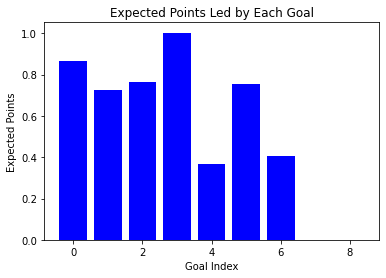

In [28]:
alkidf=cal_exp_win_goal('Darwin Núñez')

100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [01:39<00:00, 14.16s/it]


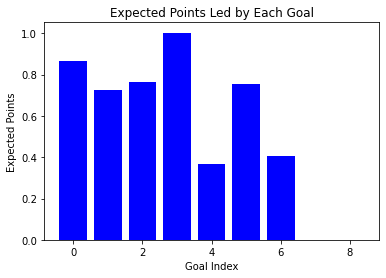

In [34]:
alkidf=cal_exp_win_goal_without_print('Darwin Núñez')

In [36]:
alkidf

{'Darwin Núñez': [4.888,
  9,
  [0.864, 0.727, 0.763, 1.003, 0.368, 0.757, 0.406, 0.0, 0.0],
  [11650.2,
   11737.2,
   11764.1,
   11800.1,
   11800.1,
   11883.2,
   11902.1,
   11902.1,
   11950.2]]}

### 모든 득점자와 득점수 추출

In [4]:
all_player_set = set()
all_player_set_c = set()
all_player_scr_dict = {}
for i in match_info_scr['scorer_20']:
    for j in eval(i):
        #print(j)
        all_player_set.add(j)
        if all_player_set_c.issubset(all_player_set):
            goal_num = all_player_scr_dict.get(j, 0)
            goal_num += 1
            all_player_scr_dict[j] = goal_num
        else:
            all_player_scr_dict[j] = 1
            all_player_set_c = all_player_set.copy()

            
#print(all_player_set)
#print(all_player_scr_dict)

### 50골 이상 넣은 선수의 골 수와 기대승점 csv파일로 저장

In [6]:
scr_over_230_dict = {}
for k,v in all_player_scr_dict.items():
    if int(v) >= 230:
        scr_over_230_dict[k] = v

In [7]:
scr_over_180_dict = {}
for k,v in all_player_scr_dict.items():
    if int(v) >= 180 and (int(v) < 230):
        scr_over_180_dict[k] = v

In [8]:
scr_over_150_dict = {}
for k,v in all_player_scr_dict.items():
    if (int(v) >= 150) and (int(v) < 180):
        scr_over_150_dict[k] = v

In [9]:
scr_over_120_dict = {}
for k,v in all_player_scr_dict.items():
    if int(v) >= 120 and (int(v) < 150):
        scr_over_120_dict[k] = v

In [10]:
scr_over_100_dict = {}
for k,v in all_player_scr_dict.items():
    if int(v) >= 100  and (int(v) < 120):
        scr_over_100_dict[k] = v

Darwin Núñez


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [01:55<00:00, 16.45s/it]


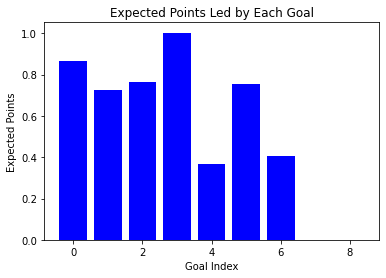

Cody Gakpo


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [01:20<00:00, 13.45s/it]


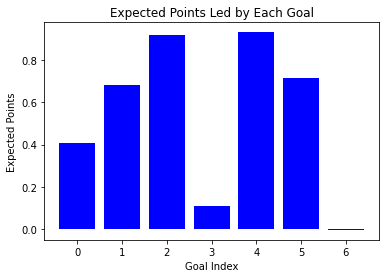

In [46]:
sample = {'Darwin Núñez':9, 'Cody Gakpo':7}

import csv
scr_over_example_points_dict={}
for k,v in sample.items():
    print(k)
    lst = cal_exp_win_goal_without_print(k)
    scr_over_example_points_dict[k] = lst[k]

    with open('scr_over_exam.csv','w',encoding='utf-8') as f:
        w = csv.writer(f)
        for k1,v1 in scr_over_example_points_dict.items():
            w.writerow([k1,v1])
        #w.writerow(scr_over_example_points_dict.values())

In [11]:
scr_over_example_points_dict

{'Darwin Núñez': [4.888, 9]}

In [47]:
scr_over_230_dict

{'Alan Shearer': 260}

Alan Shearer


100%|████████████████████████████████████████████████████████████████████████████████| 190/190 [57:03<00:00, 18.02s/it]


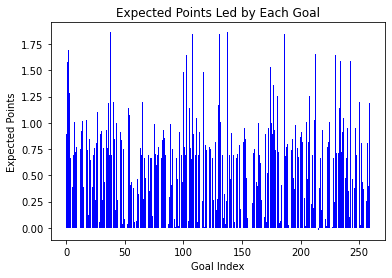

In [48]:
import csv
scr_over_230_points_dict={}
for k,v in scr_over_230_dict.items():
    print(k)
    lst = cal_exp_win_goal_without_print(k)
    scr_over_230_points_dict[k] = lst[k]

with open('scr_over_230.csv','w',encoding='utf-8') as f:
        w = csv.writer(f)
        for k1,v1 in scr_over_230_points_dict.items():
            w.writerow([k1,v1])

In [49]:
scr_over_230_points_dict

{'Alan Shearer': [169.3630000000001,
  260,
  [0.893,
   1.575,
   1.697,
   1.288,
   0.67,
   0.389,
   0.697,
   1.004,
   0.727,
   0.771,
   0.136,
   0.0,
   0.747,
   0.92,
   1.022,
   0.389,
   0.92,
   1.025,
   0.741,
   0.125,
   0.842,
   0.647,
   0.385,
   0.697,
   0.763,
   0.265,
   0.81,
   1.106,
   0.06,
   0.897,
   0.919,
   0.265,
   0.763,
   0.441,
   0.93,
   0.756,
   1.192,
   0.697,
   1.862,
   0.692,
   1.197,
   0.843,
   0.174,
   1.002,
   0.265,
   0.692,
   0.917,
   0.837,
   0.04,
   0.747,
   0.083,
   0.747,
   0.04,
   1.145,
   1.079,
   0.406,
   0.44,
   0.378,
   0.059,
   0.0,
   0.065,
   0.465,
   0.321,
   0.757,
   0.697,
   1.202,
   0.278,
   0.67,
   0.479,
   0.0,
   0.692,
   0.348,
   0.67,
   0.67,
   0.111,
   0.993,
   0.706,
   0.602,
   0.692,
   0.771,
   0.816,
   0.67,
   0.837,
   0.936,
   0.853,
   0.692,
   0.389,
   0.04,
   0.293,
   0.993,
   0.406,
   0.747,
   0.083,
   0.004,
   0.67,
   0.461,
   0.018,
   0.91

### 여기부터 이어서

In [11]:
scr_over_180_dict

{'Andrew Cole': 187,
 'Wayne Rooney': 208,
 'Sergio Agüero': 184,
 'Harry Kane': 213}

Andrew Cole


100%|████████████████████████████████████████████████████████████████████████████████| 149/149 [08:51<00:00,  3.57s/it]


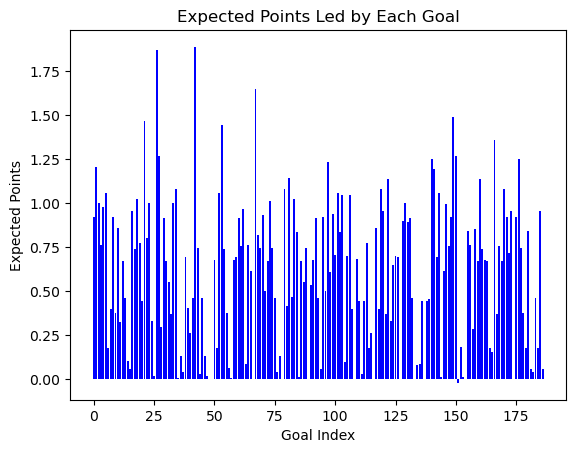

Wayne Rooney


100%|████████████████████████████████████████████████████████████████████████████████| 159/159 [11:38<00:00,  4.40s/it]


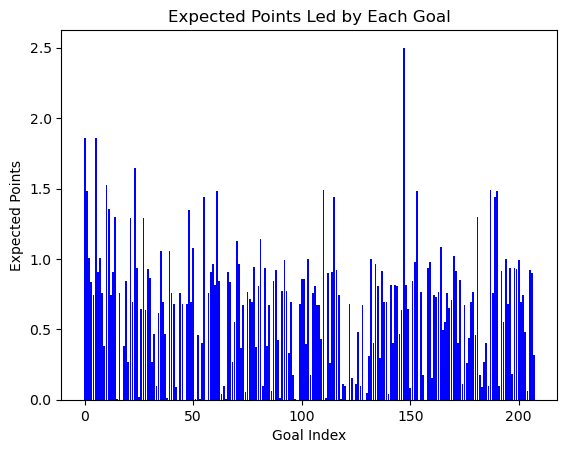

Sergio Agüero


100%|████████████████████████████████████████████████████████████████████████████████| 130/130 [08:06<00:00,  3.75s/it]


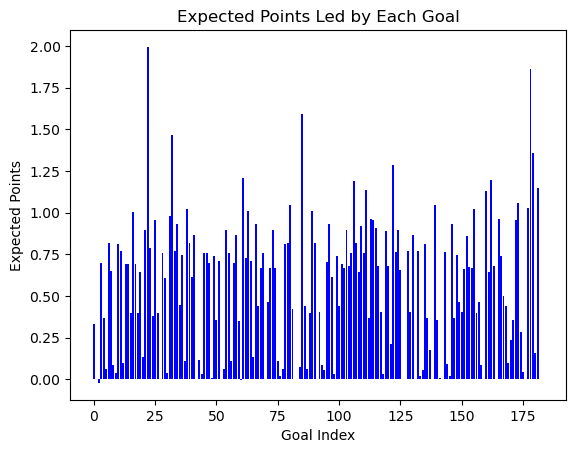

Harry Kane


100%|████████████████████████████████████████████████████████████████████████████████| 157/157 [09:21<00:00,  3.58s/it]


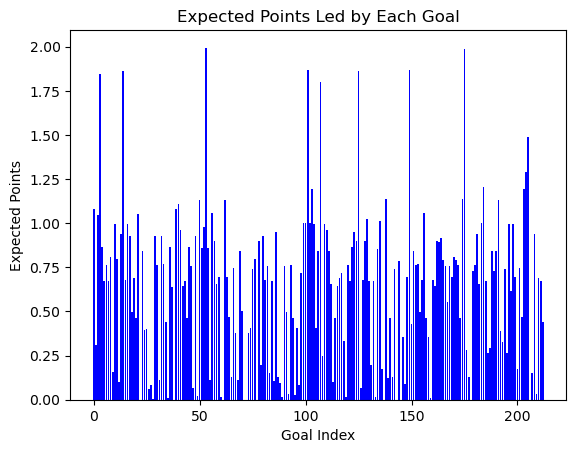

In [12]:
import csv
scr_over_180_points_dict={}
for k,v in scr_over_180_dict.items():
    print(k)
    lst = cal_exp_win_goal_without_print(k)
    scr_over_180_points_dict[k] = lst[k]
    
    with open('scr_over_180.csv','w',encoding='utf-8') as f:
        w = csv.writer(f)
        for k1,v1 in scr_over_180_points_dict.items():
            w.writerow([k1,v1])

In [13]:
scr_over_180_points_dict.keys()

dict_keys(['Andrew Cole', 'Wayne Rooney', 'Sergio Agüero', 'Harry Kane'])

In [14]:
scr_over_150_dict

{'Robbie Fowler': 163,
 'Michael Owen': 150,
 'Frank Lampard': 177,
 'Thierry Henry': 175,
 'Jermain Defoe': 162}

Robbie Fowler


100%|████████████████████████████████████████████████████████████████████████████████| 117/117 [07:33<00:00,  3.87s/it]


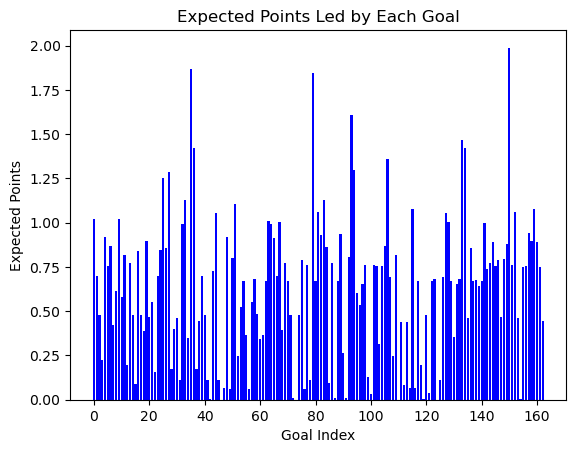

Michael Owen


100%|████████████████████████████████████████████████████████████████████████████████| 113/113 [06:46<00:00,  3.60s/it]


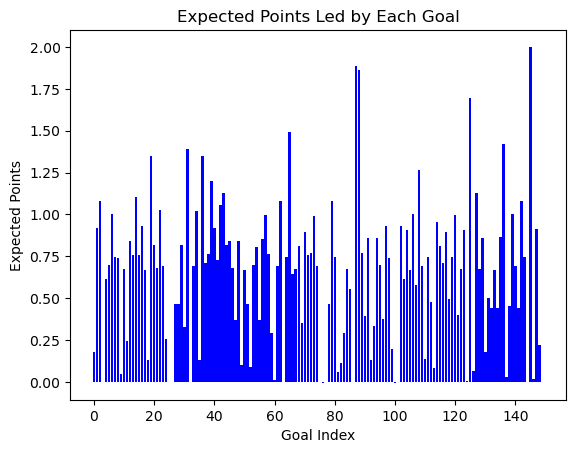

Frank Lampard


100%|████████████████████████████████████████████████████████████████████████████████| 149/149 [07:56<00:00,  3.20s/it]


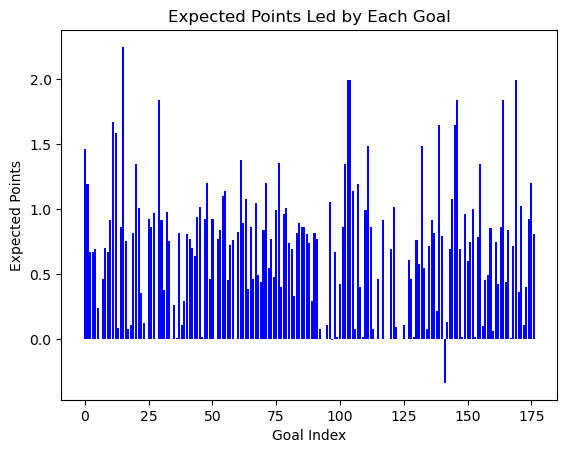

Thierry Henry


100%|████████████████████████████████████████████████████████████████████████████████| 124/124 [07:42<00:00,  3.73s/it]


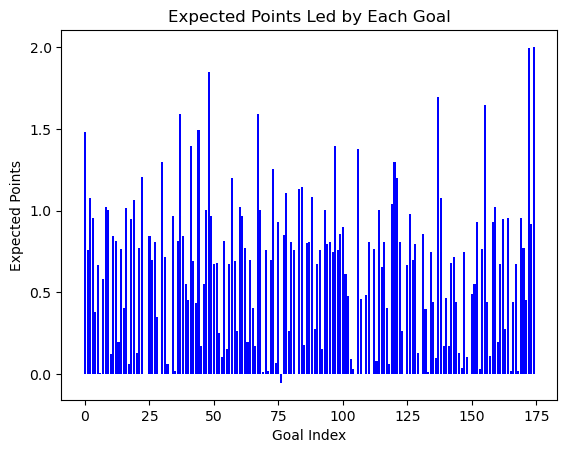

Jermain Defoe


100%|████████████████████████████████████████████████████████████████████████████████| 137/137 [07:14<00:00,  3.17s/it]


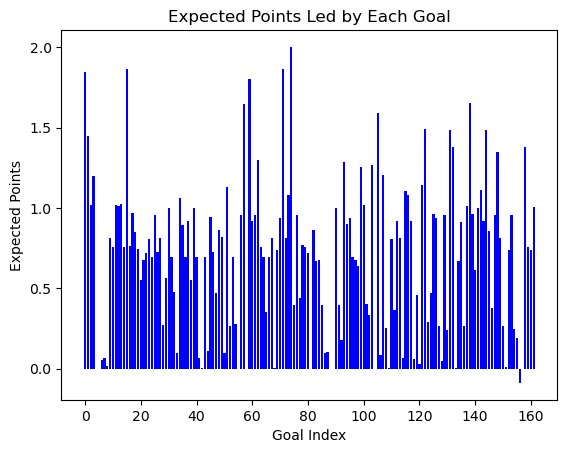

In [15]:
import csv
scr_over_150_points_dict={}
for k,v in scr_over_150_dict.items():
    print(k)
    lst = cal_exp_win_goal_without_print(k)
    scr_over_150_points_dict[k] = lst[k]

    with open('scr_over_150.csv','w',encoding='utf-8') as f:
        w = csv.writer(f)
        for k1,v1 in scr_over_150_points_dict.items():
            w.writerow([k1,v1])

In [16]:
scr_over_150_points_dict.keys()

dict_keys(['Robbie Fowler', 'Michael Owen', 'Frank Lampard', 'Thierry Henry', 'Jermain Defoe'])

In [17]:
scr_over_120_dict

{'Teddy Sheringham': 146,
 'Les Ferdinand': 149,
 'Dwight Yorke': 123,
 'Jimmy Floyd Hasselbaink': 127,
 'Nicolas Anelka': 125,
 'Robbie Keane': 125,
 'Steven Gerrard': 120,
 'Robin van Persie': 144,
 'Romelu Lukaku': 121,
 'Mohamed Salah': 139,
 'Jamie Vardy': 136}

Teddy Sheringham


100%|████████████████████████████████████████████████████████████████████████████████| 121/121 [06:34<00:00,  3.26s/it]


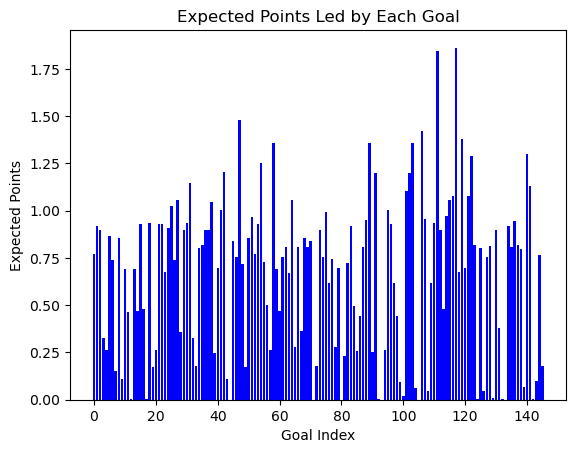

Les Ferdinand


100%|████████████████████████████████████████████████████████████████████████████████| 120/120 [06:39<00:00,  3.33s/it]


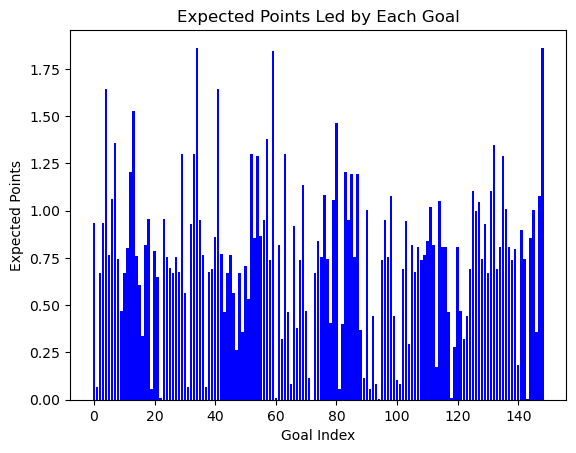

Dwight Yorke


100%|██████████████████████████████████████████████████████████████████████████████████| 97/97 [05:31<00:00,  3.41s/it]


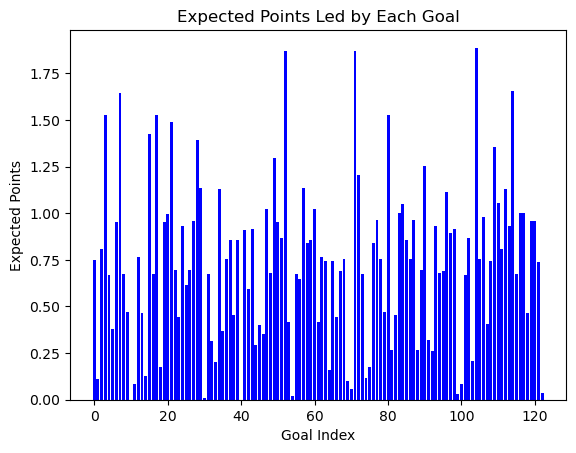

Jimmy Floyd Hasselbaink


100%|████████████████████████████████████████████████████████████████████████████████| 103/103 [05:51<00:00,  3.42s/it]


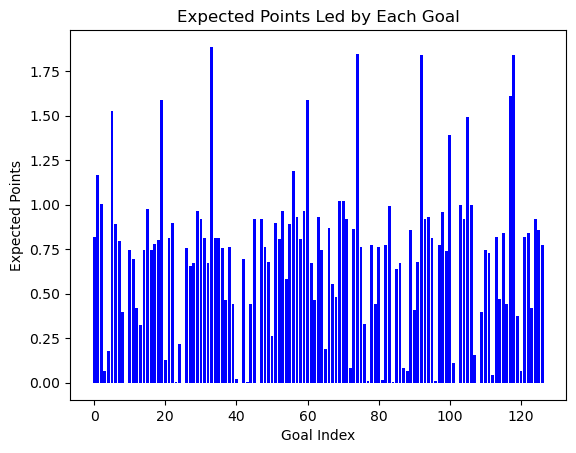

Nicolas Anelka


100%|████████████████████████████████████████████████████████████████████████████████| 103/103 [05:50<00:00,  3.41s/it]


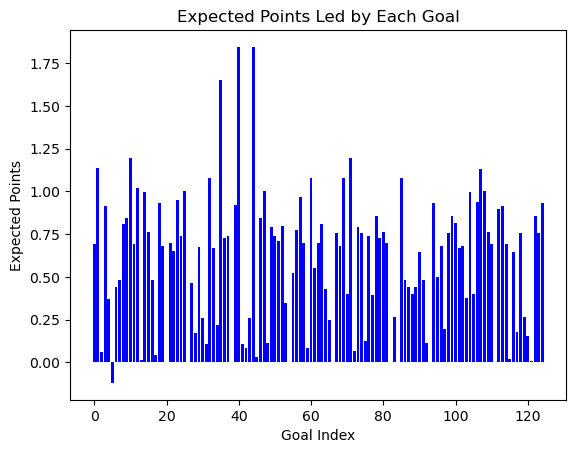

Robbie Keane


100%|████████████████████████████████████████████████████████████████████████████████| 103/103 [05:50<00:00,  3.40s/it]


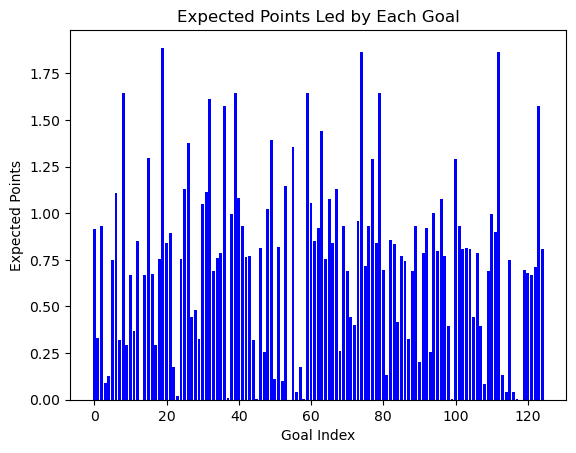

Steven Gerrard


100%|████████████████████████████████████████████████████████████████████████████████| 106/106 [05:31<00:00,  3.13s/it]


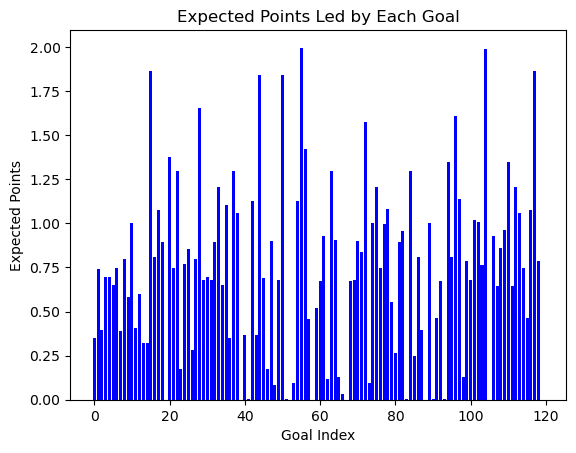

Robin van Persie


100%|████████████████████████████████████████████████████████████████████████████████| 114/114 [06:40<00:00,  3.51s/it]


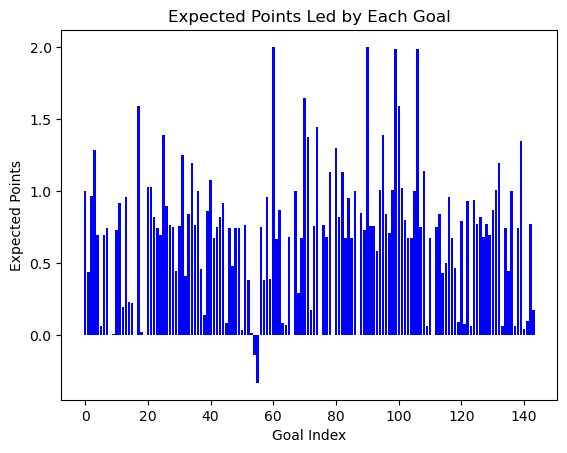

Romelu Lukaku


100%|██████████████████████████████████████████████████████████████████████████████████| 97/97 [05:38<00:00,  3.49s/it]


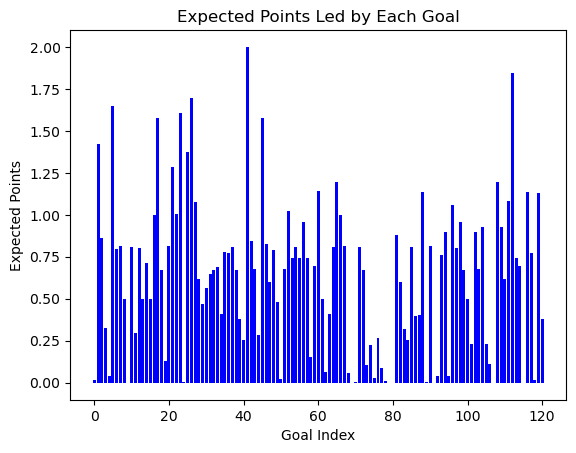

Mohamed Salah


100%|████████████████████████████████████████████████████████████████████████████████| 110/110 [06:32<00:00,  3.57s/it]


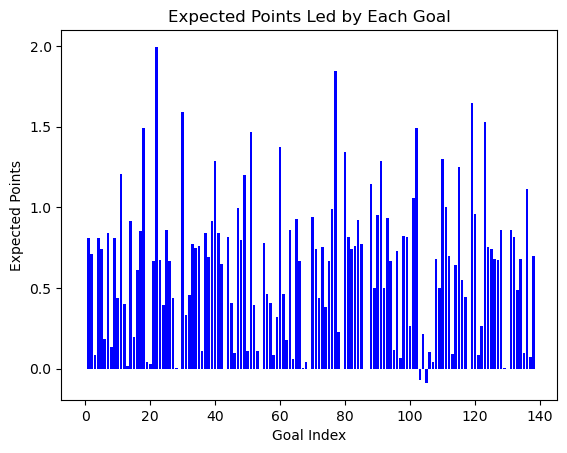

Jamie Vardy


100%|████████████████████████████████████████████████████████████████████████████████| 108/108 [06:20<00:00,  3.52s/it]


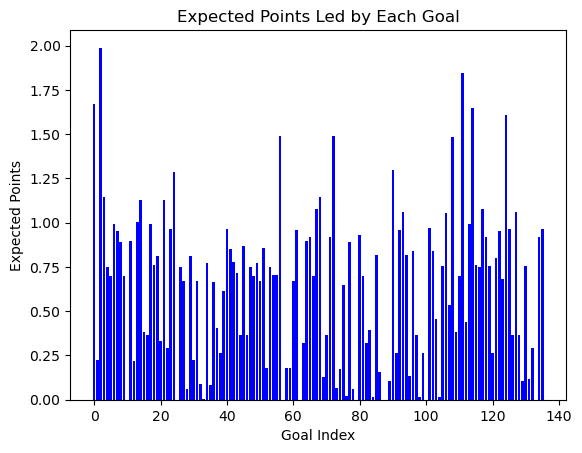

In [18]:
import csv
scr_over_120_points_dict={}
for k,v in scr_over_120_dict.items():
    print(k)
    lst = cal_exp_win_goal_without_print(k)
    scr_over_120_points_dict[k] = lst[k]

    with open('scr_over_120.csv','w',encoding='utf-8') as f:
        w = csv.writer(f)
        for k1,v1 in scr_over_120_points_dict.items():
            w.writerow([k1,v1])

In [19]:
scr_over_120_points_dict.keys()

dict_keys(['Teddy Sheringham', 'Les Ferdinand', 'Dwight Yorke', 'Jimmy Floyd Hasselbaink', 'Nicolas Anelka', 'Robbie Keane', 'Steven Gerrard', 'Robin van Persie', 'Romelu Lukaku', 'Mohamed Salah', 'Jamie Vardy'])

In [20]:
scr_over_100_dict

{'Matthew Le Tissier': 100,
 'Ian Wright': 113,
 'Dion Dublin': 111,
 'Ryan Giggs': 109,
 'Paul Scholes': 106,
 'Emile Heskey': 110,
 'Peter Crouch': 108,
 'Darren Bent': 106,
 'Cristiano Ronaldo': 103,
 'Didier Drogba': 104,
 'Raheem Sterling': 115,
 'Sadio Mané': 111,
 'Son Heung-Min': 103}

Matthew Le Tissier


100%|██████████████████████████████████████████████████████████████████████████████████| 79/79 [04:43<00:00,  3.58s/it]


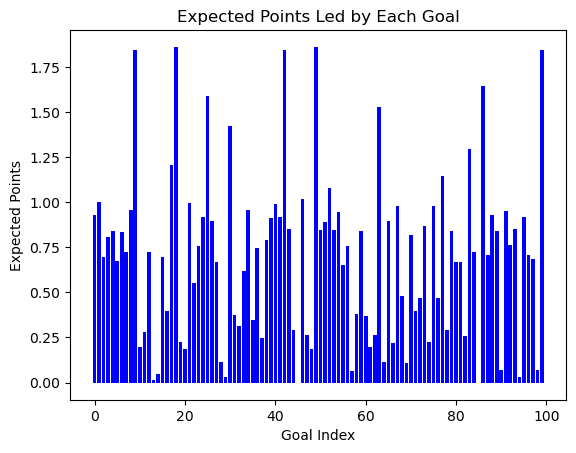

Ian Wright


100%|██████████████████████████████████████████████████████████████████████████████████| 91/91 [05:11<00:00,  3.42s/it]


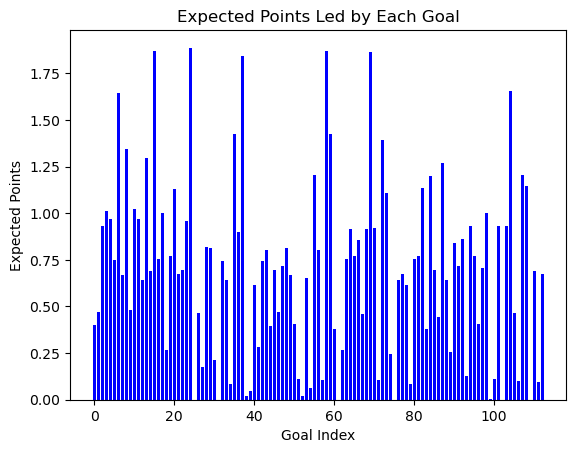

Dion Dublin


100%|██████████████████████████████████████████████████████████████████████████████████| 96/96 [05:11<00:00,  3.25s/it]


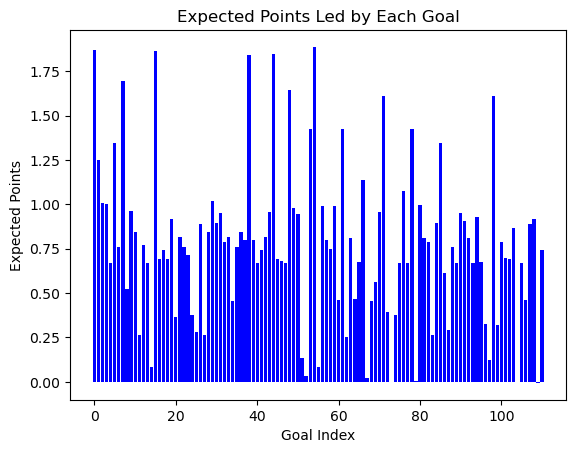

Ryan Giggs


100%|██████████████████████████████████████████████████████████████████████████████████| 98/98 [05:03<00:00,  3.10s/it]


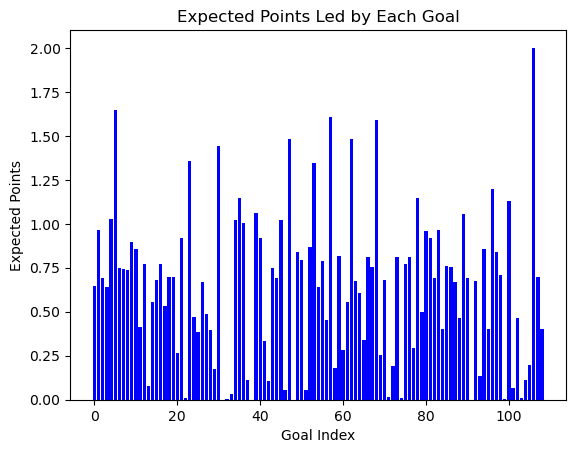

Paul Scholes


100%|██████████████████████████████████████████████████████████████████████████████████| 90/90 [04:57<00:00,  3.30s/it]


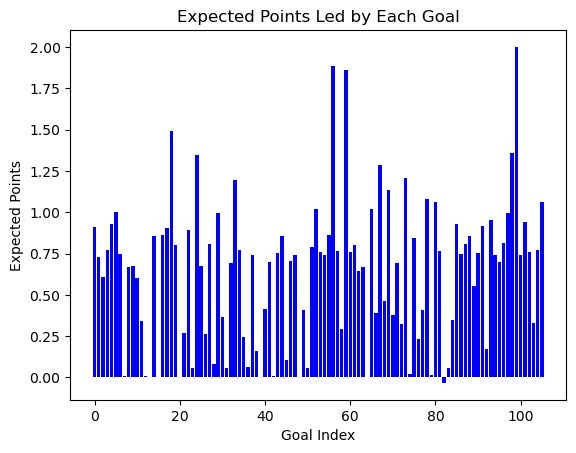

Emile Heskey


100%|██████████████████████████████████████████████████████████████████████████████████| 96/96 [05:06<00:00,  3.19s/it]


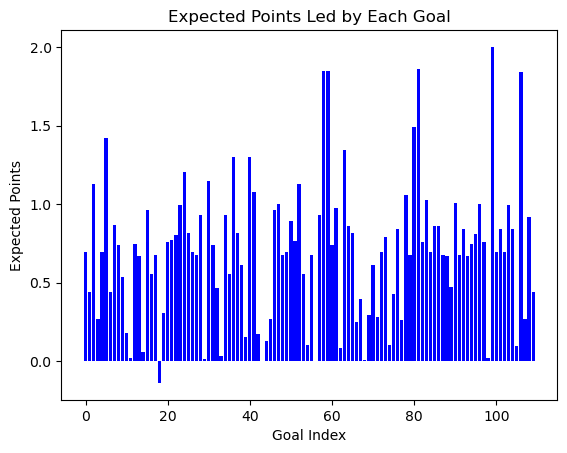

Peter Crouch


100%|██████████████████████████████████████████████████████████████████████████████████| 97/97 [05:03<00:00,  3.13s/it]


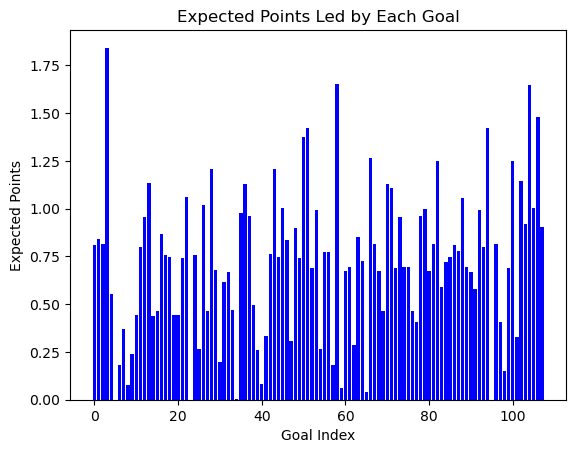

Darren Bent


100%|██████████████████████████████████████████████████████████████████████████████████| 90/90 [04:58<00:00,  3.31s/it]


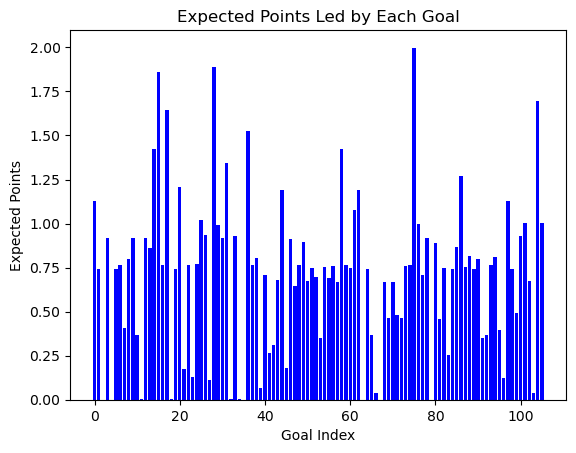

Cristiano Ronaldo


100%|██████████████████████████████████████████████████████████████████████████████████| 74/74 [04:48<00:00,  3.90s/it]


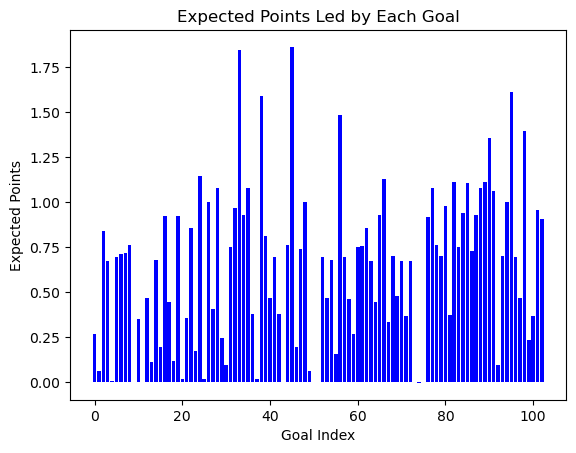

Didier Drogba


100%|██████████████████████████████████████████████████████████████████████████████████| 82/82 [05:00<00:00,  3.66s/it]


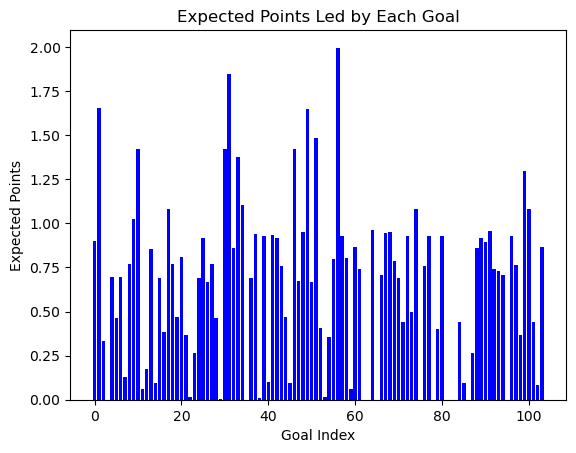

Raheem Sterling


100%|██████████████████████████████████████████████████████████████████████████████████| 91/91 [05:26<00:00,  3.59s/it]


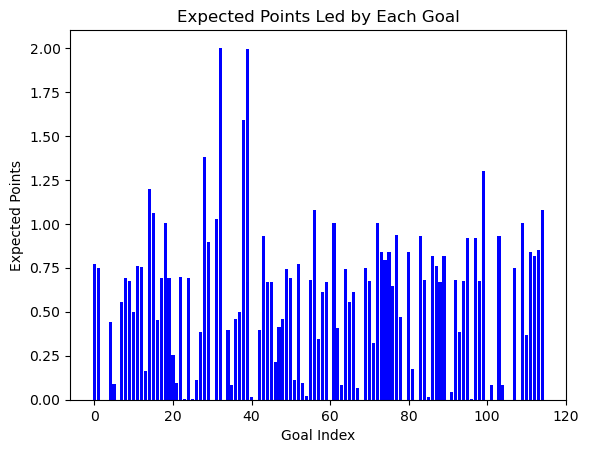

Sadio Mané


100%|██████████████████████████████████████████████████████████████████████████████████| 94/94 [05:15<00:00,  3.36s/it]


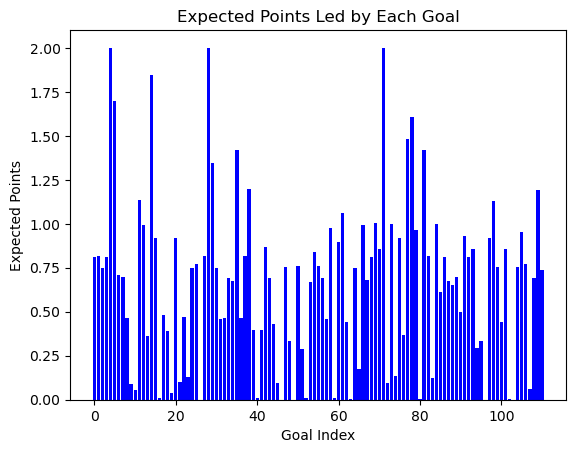

Son Heung-Min


100%|██████████████████████████████████████████████████████████████████████████████████| 82/82 [04:50<00:00,  3.54s/it]


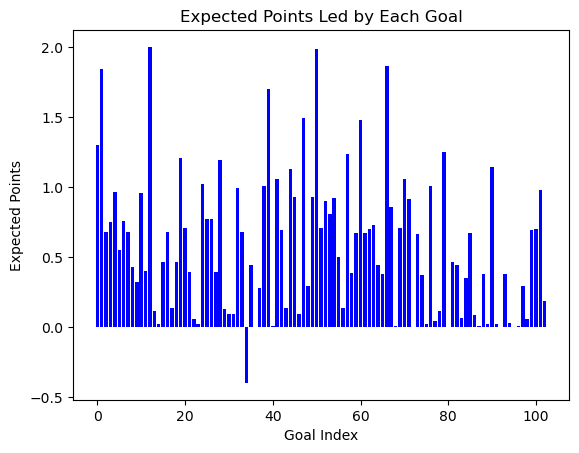

In [21]:
import csv
scr_over_100_points_dict={}
for k,v in scr_over_100_dict.items():
    print(k)
    lst = cal_exp_win_goal_without_print(k)
    scr_over_100_points_dict[k] = lst[k]

    with open('scr_over_100.csv','w',encoding='utf-8') as f:
        w = csv.writer(f)
        for k1,v1 in scr_over_100_points_dict.items():
            w.writerow([k1,v1])

In [22]:
scr_over_100_points_dict.keys()

dict_keys(['Matthew Le Tissier', 'Ian Wright', 'Dion Dublin', 'Ryan Giggs', 'Paul Scholes', 'Emile Heskey', 'Peter Crouch', 'Darren Bent', 'Cristiano Ronaldo', 'Didier Drogba', 'Raheem Sterling', 'Sadio Mané', 'Son Heung-Min'])

In [23]:
scr_over_80_dict = {}
for k,v in all_player_scr_dict.items():
    if int(v) >= 80  and (int(v) < 100):
        scr_over_80_dict[k] = v

In [24]:
scr_over_50_dict = {}
for k,v in all_player_scr_dict.items():
    if int(v) >= 50  and (int(v) < 80):
        scr_over_50_dict[k] = v

In [25]:
scr_over_80_dict

{'Kevin Campbell': 83,
 'Gary Speed': 80,
 'Chris Sutton': 83,
 'Dennis Bergkamp': 87,
 'Ole Gunnar Solskjaer': 89,
 'Kevin Davies': 88,
 'James Beattie': 91,
 'Louis Saha': 85,
 'Kevin Phillips': 92,
 'Craig Bellamy': 81,
 'Mark Viduka': 92,
 'Ruud van Nistelrooij': 95,
 'Yakubu': 95,
 'Emmanuel Adebayor': 97,
 'Dimitar Berbatov': 94,
 'Carlos Tevez': 84,
 'Fernando Torres': 85,
 'Theo Walcott': 80,
 'Eden Hazard': 85,
 'Christian Benteke': 86,
 'Olivier Giroud': 90,
 'Riyad Mahrez': 82,
 'Roberto Firmino': 82}

Kevin Campbell


100%|██████████████████████████████████████████████████████████████████████████████████| 67/67 [03:54<00:00,  3.50s/it]


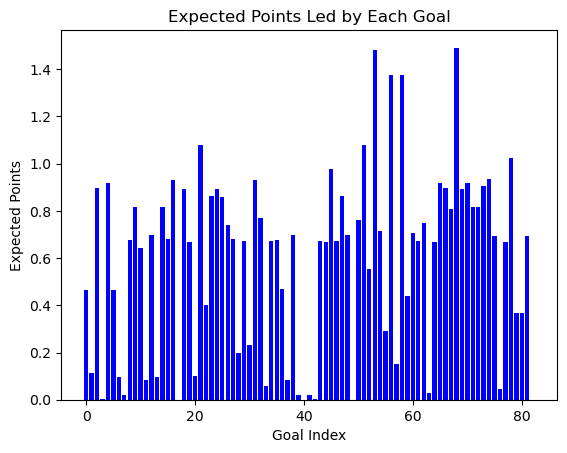

Gary Speed


100%|██████████████████████████████████████████████████████████████████████████████████| 74/74 [03:44<00:00,  3.03s/it]


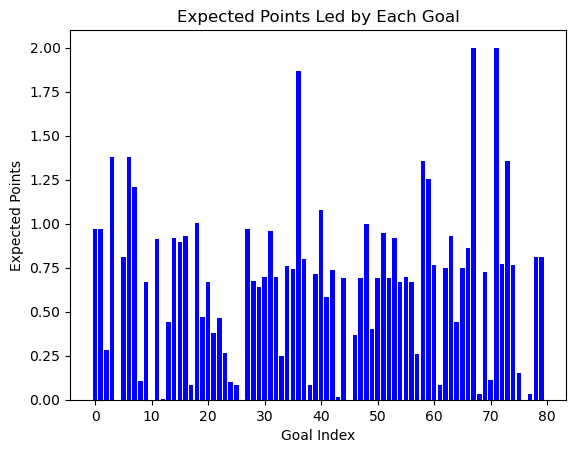

Chris Sutton


100%|██████████████████████████████████████████████████████████████████████████████████| 63/63 [03:52<00:00,  3.69s/it]


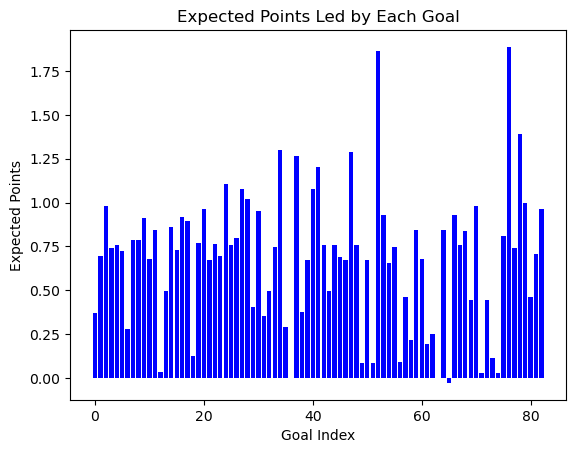

Dennis Bergkamp


100%|██████████████████████████████████████████████████████████████████████████████████| 74/74 [04:03<00:00,  3.29s/it]


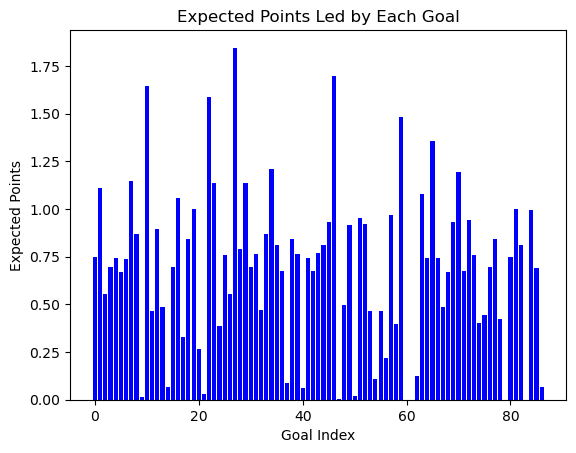

Ole Gunnar Solskjaer


100%|██████████████████████████████████████████████████████████████████████████████████| 69/69 [04:09<00:00,  3.61s/it]


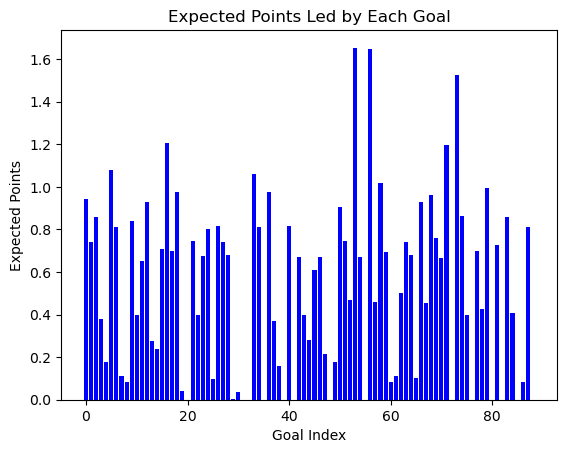

Kevin Davies


100%|██████████████████████████████████████████████████████████████████████████████████| 80/80 [04:05<00:00,  3.07s/it]


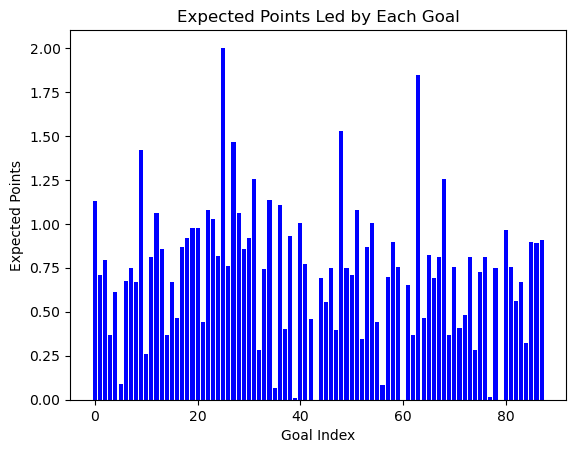

James Beattie


100%|██████████████████████████████████████████████████████████████████████████████████| 77/77 [04:16<00:00,  3.33s/it]


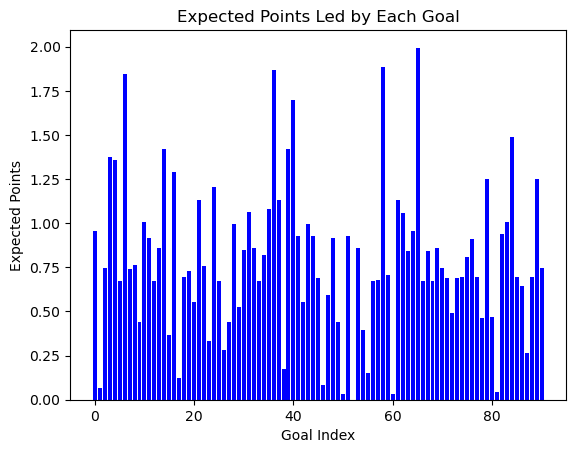

Louis Saha


100%|██████████████████████████████████████████████████████████████████████████████████| 69/69 [04:00<00:00,  3.49s/it]


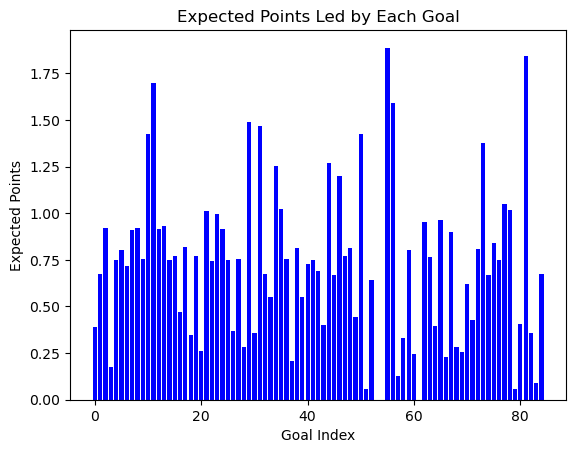

Kevin Phillips


100%|██████████████████████████████████████████████████████████████████████████████████| 73/73 [04:31<00:00,  3.73s/it]


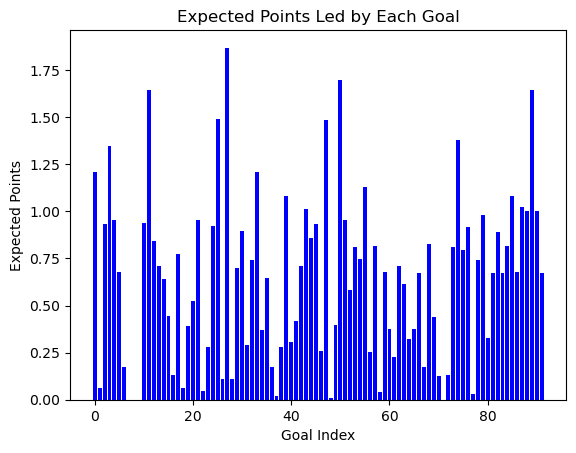

Craig Bellamy


100%|██████████████████████████████████████████████████████████████████████████████████| 71/71 [03:48<00:00,  3.21s/it]


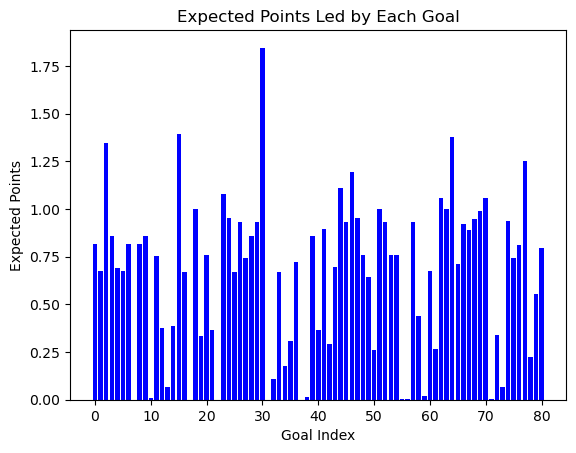

Mark Viduka


100%|██████████████████████████████████████████████████████████████████████████████████| 73/73 [04:20<00:00,  3.56s/it]


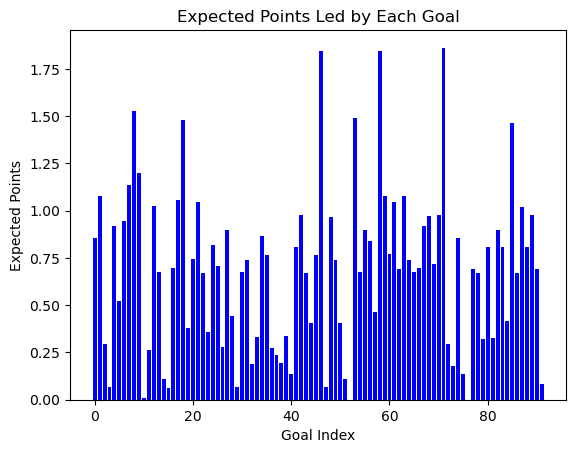

Ruud van Nistelrooij


100%|██████████████████████████████████████████████████████████████████████████████████| 75/75 [04:27<00:00,  3.57s/it]


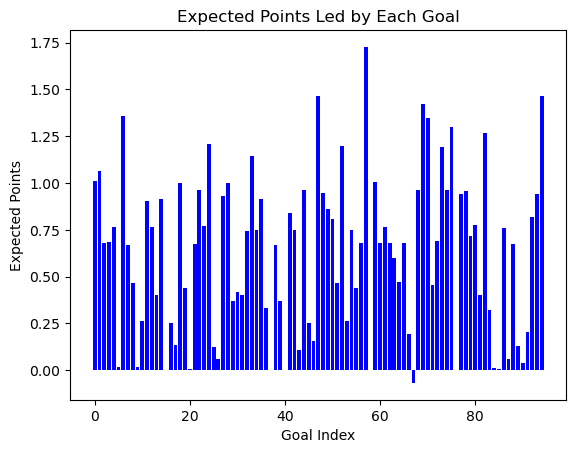

Yakubu


100%|██████████████████████████████████████████████████████████████████████████████████| 74/74 [04:29<00:00,  3.64s/it]


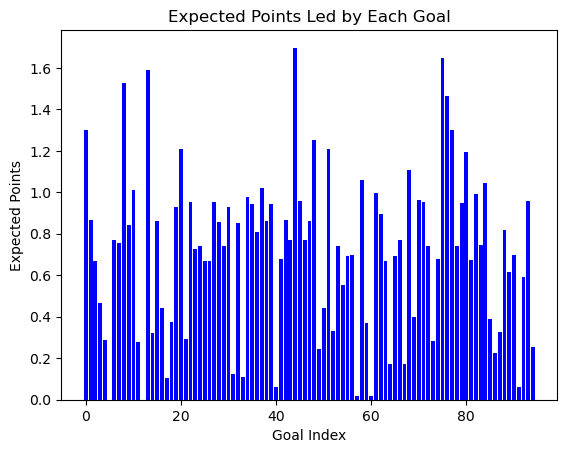

Emmanuel Adebayor


100%|██████████████████████████████████████████████████████████████████████████████████| 76/76 [04:33<00:00,  3.60s/it]


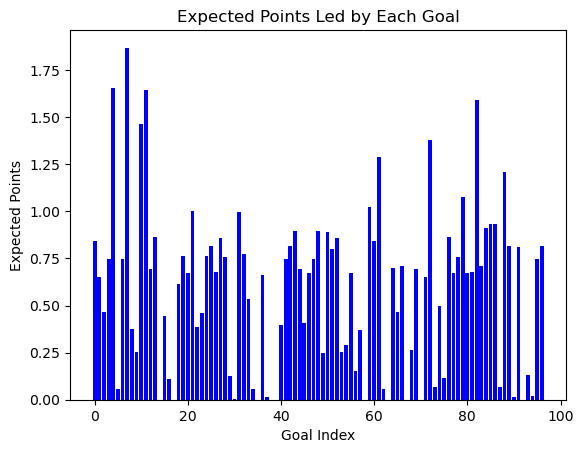

Dimitar Berbatov


100%|██████████████████████████████████████████████████████████████████████████████████| 73/73 [04:26<00:00,  3.65s/it]


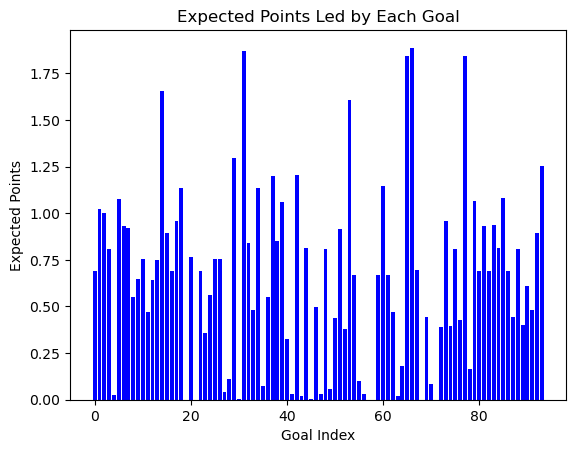

Carlos Tevez


100%|██████████████████████████████████████████████████████████████████████████████████| 61/61 [04:12<00:00,  4.15s/it]


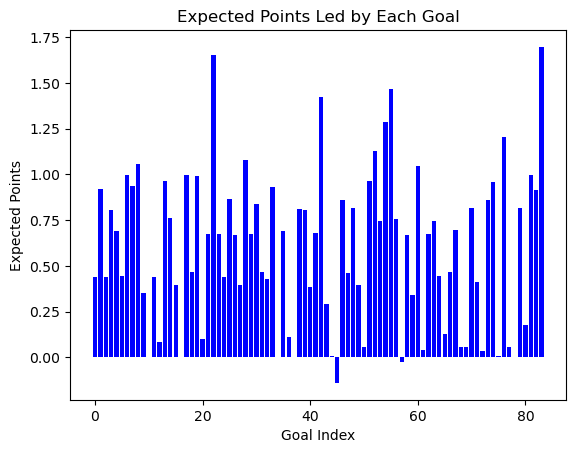

Fernando Torres


100%|██████████████████████████████████████████████████████████████████████████████████| 64/64 [04:03<00:00,  3.81s/it]


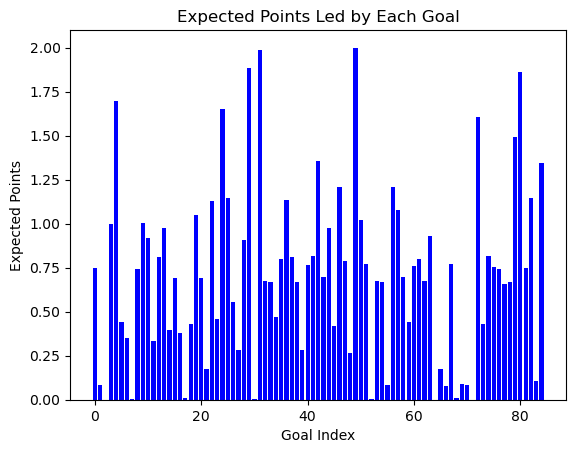

Theo Walcott


100%|██████████████████████████████████████████████████████████████████████████████████| 68/68 [03:59<00:00,  3.52s/it]


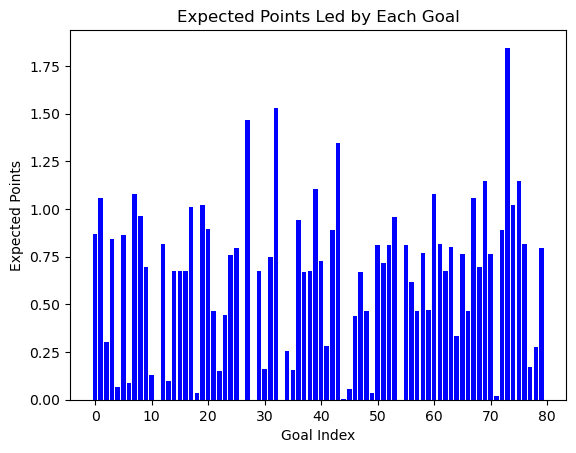

Eden Hazard


100%|██████████████████████████████████████████████████████████████████████████████████| 69/69 [04:02<00:00,  3.51s/it]


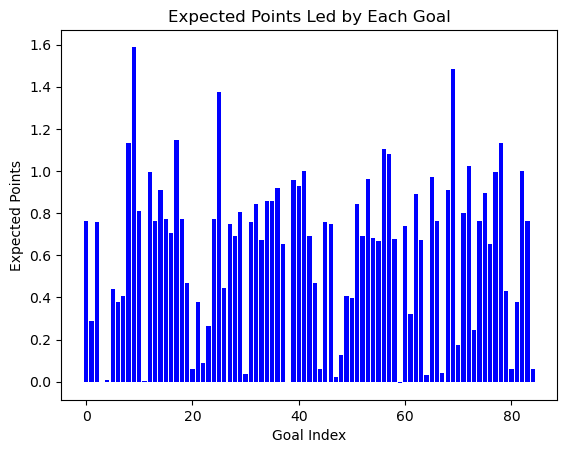

Christian Benteke


100%|██████████████████████████████████████████████████████████████████████████████████| 72/72 [04:02<00:00,  3.37s/it]


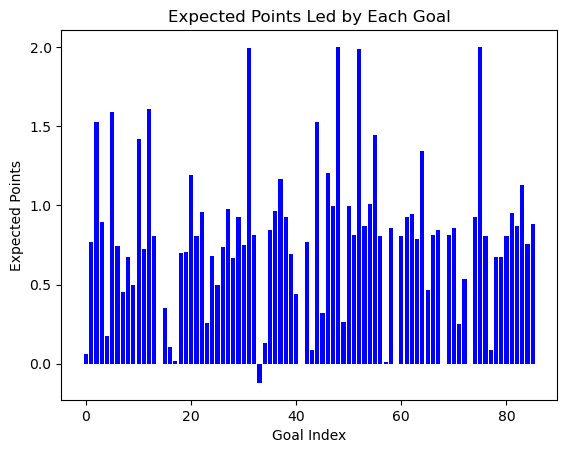

Olivier Giroud


100%|██████████████████████████████████████████████████████████████████████████████████| 76/76 [04:27<00:00,  3.52s/it]


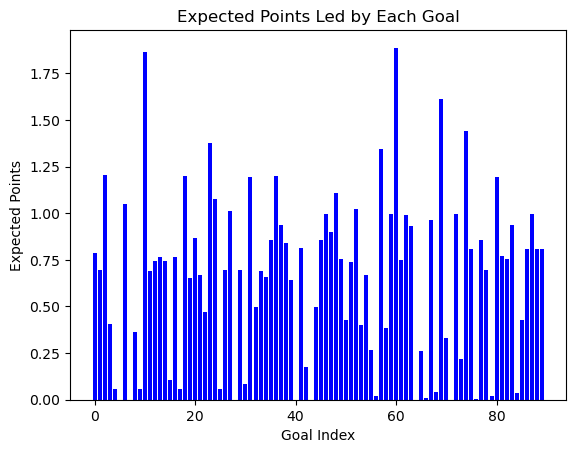

Riyad Mahrez


100%|██████████████████████████████████████████████████████████████████████████████████| 68/68 [03:56<00:00,  3.47s/it]


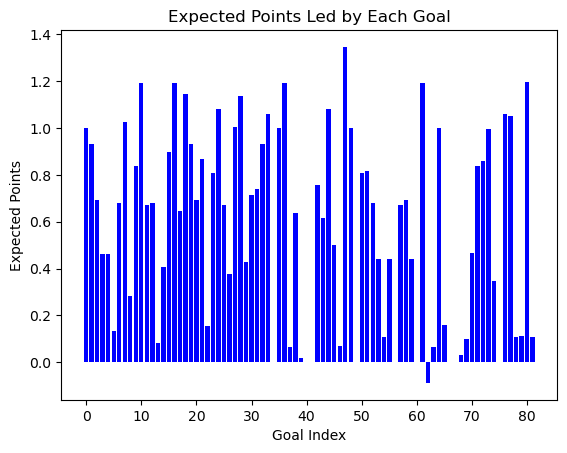

Roberto Firmino


100%|██████████████████████████████████████████████████████████████████████████████████| 66/66 [03:57<00:00,  3.60s/it]


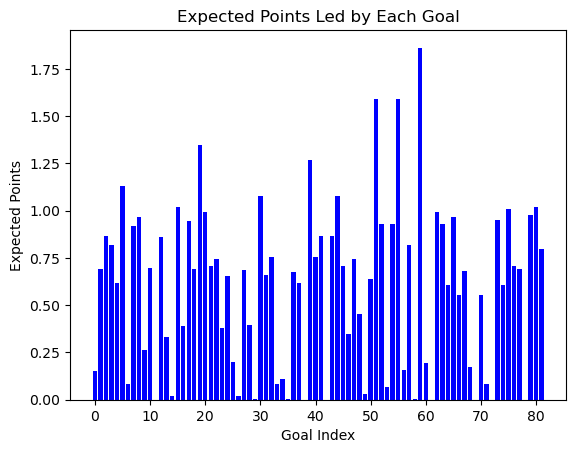

In [26]:
import csv
scr_over_80_points_dict={}
for k,v in scr_over_80_dict.items():
    print(k)
    lst = cal_exp_win_goal_without_print(k)
    scr_over_80_points_dict[k] = lst[k]

    with open('scr_over_80.csv','w',encoding='utf-8') as f:
        w = csv.writer(f)
        for k1,v1 in scr_over_80_points_dict.items():
            w.writerow([k1,v1])

In [27]:
scr_over_80_points_dict.keys()

dict_keys(['Kevin Campbell', 'Gary Speed', 'Chris Sutton', 'Dennis Bergkamp', 'Ole Gunnar Solskjaer', 'Kevin Davies', 'James Beattie', 'Louis Saha', 'Kevin Phillips', 'Craig Bellamy', 'Mark Viduka', 'Ruud van Nistelrooij', 'Yakubu', 'Emmanuel Adebayor', 'Dimitar Berbatov', 'Carlos Tevez', 'Fernando Torres', 'Theo Walcott', 'Eden Hazard', 'Christian Benteke', 'Olivier Giroud', 'Riyad Mahrez', 'Roberto Firmino'])

In [28]:
scr_over_50_dict

{'Mark Bright': 50,
 'Brian Deane': 71,
 'Mark Hughes': 64,
 'Peter Beardsley': 58,
 'Eric Cantona': 70,
 'Dean Holdsworth': 63,
 'Niall Quinn': 59,
 'Kevin Gallacher': 56,
 'Chris Armstrong': 71,
 'Tony Cottee': 78,
 'Alan Smith': 53,
 'Nick Barmby': 53,
 'Efan Ekoku': 52,
 'Trevor Sinclair': 52,
 'Stan Collymore': 62,
 'Duncan Ferguson': 68,
 'John Hartson': 55,
 'David Beckham': 62,
 'Jason Euell': 56,
 'Lee Bowyer': 57,
 'Gianfranco Zola': 59,
 'Paulo Wanchope': 50,
 'Paolo Di Canio': 66,
 'Gustavo Poyet': 52,
 'Harry Kewell': 57,
 'Damien Duff': 54,
 'Kanu': 54,
 'Gareth Barry': 53,
 'Danny Murphy': 50,
 'Eidur Gudjohnsen': 55,
 'Robert Pirès': 62,
 'Darius Vassell': 52,
 'Kevin Nolan': 69,
 'Carlton Cole': 52,
 'James Milner': 55,
 'Andrew Johnson': 51,
 'Cesc Fàbregas': 50,
 'Tim Cahill': 56,
 'Gabriel Agbonlahor': 74,
 'Dirk Kuijt': 51,
 'Shane Long': 56,
 'Clint Dempsey': 57,
 'Gareth Bale': 53,
 'Daniel Sturridge': 76,
 'Danny Welbeck': 62,
 'Andy Carroll': 54,
 'Steven Fletc

Mark Bright


100%|██████████████████████████████████████████████████████████████████████████████████| 44/44 [02:23<00:00,  3.26s/it]


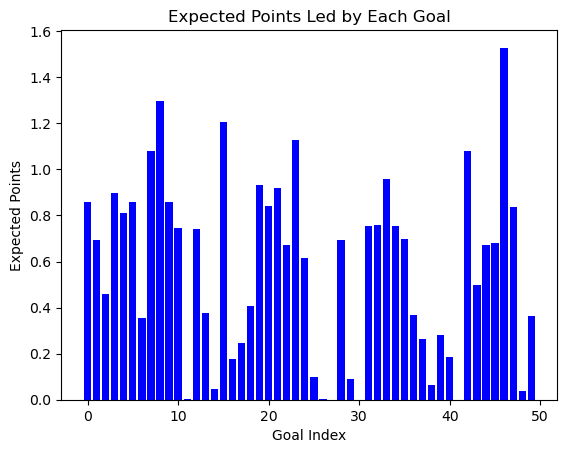

Brian Deane


100%|██████████████████████████████████████████████████████████████████████████████████| 64/64 [03:19<00:00,  3.12s/it]


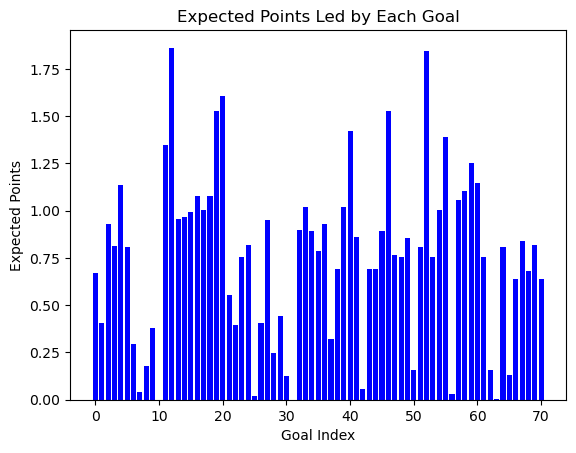

Mark Hughes


100%|██████████████████████████████████████████████████████████████████████████████████| 55/55 [03:01<00:00,  3.30s/it]


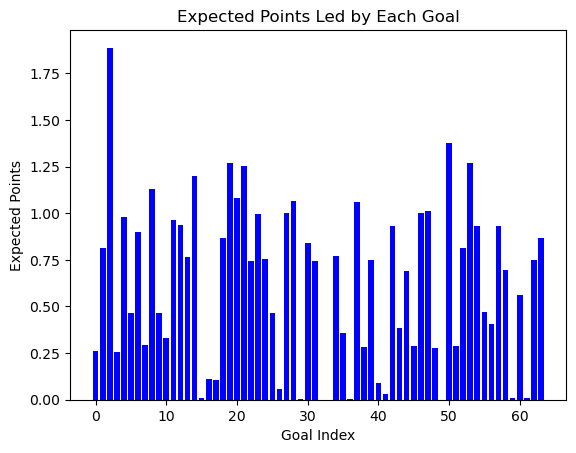

Peter Beardsley


100%|██████████████████████████████████████████████████████████████████████████████████| 47/47 [02:44<00:00,  3.50s/it]


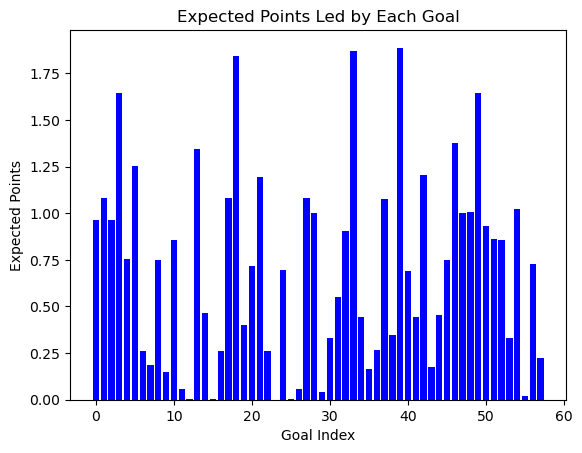

Eric Cantona


100%|██████████████████████████████████████████████████████████████████████████████████| 59/59 [03:18<00:00,  3.36s/it]


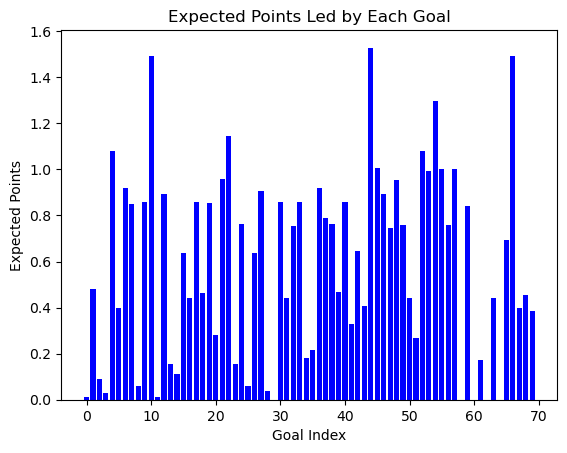

Dean Holdsworth


100%|██████████████████████████████████████████████████████████████████████████████████| 54/54 [02:58<00:00,  3.31s/it]


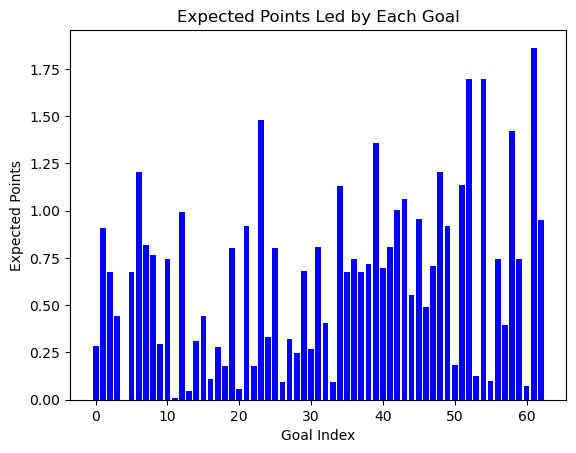

Niall Quinn


100%|██████████████████████████████████████████████████████████████████████████████████| 49/49 [02:47<00:00,  3.42s/it]


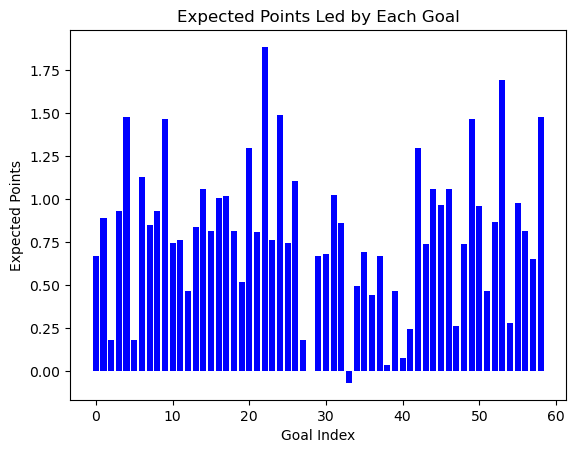

Kevin Gallacher


100%|██████████████████████████████████████████████████████████████████████████████████| 49/49 [02:39<00:00,  3.25s/it]


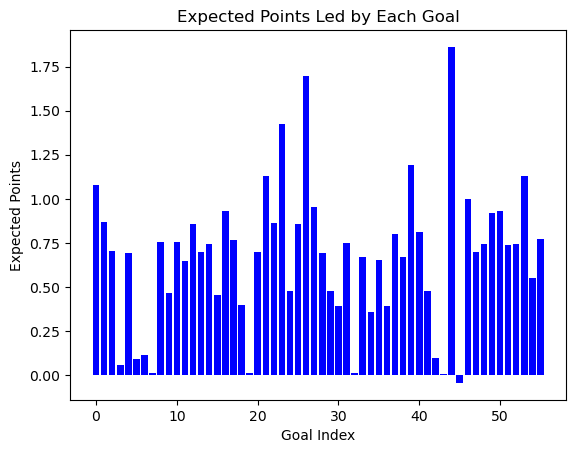

Chris Armstrong


100%|██████████████████████████████████████████████████████████████████████████████████| 64/64 [03:32<00:00,  3.31s/it]


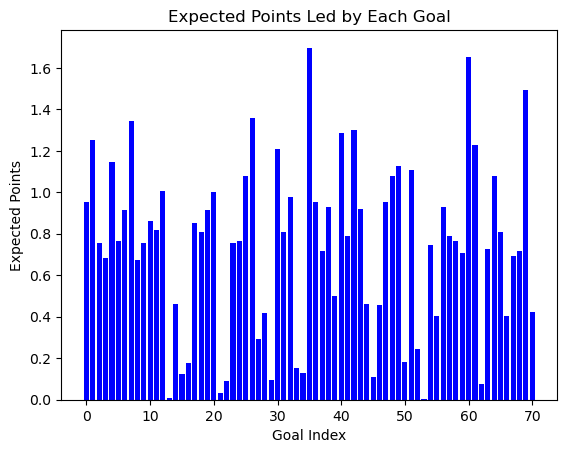

Tony Cottee


100%|██████████████████████████████████████████████████████████████████████████████████| 64/64 [04:05<00:00,  3.83s/it]


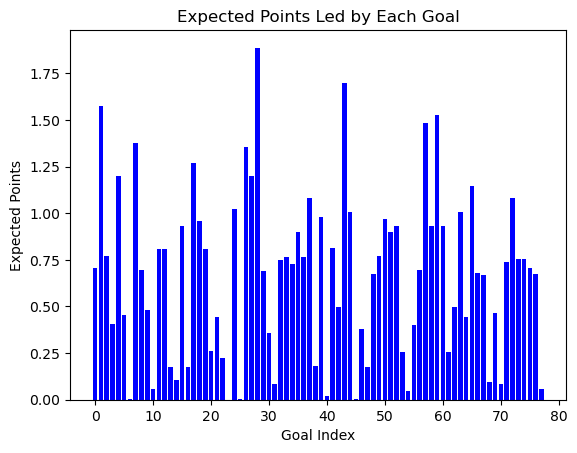

Alan Smith


100%|██████████████████████████████████████████████████████████████████████████████████| 49/49 [02:48<00:00,  3.44s/it]


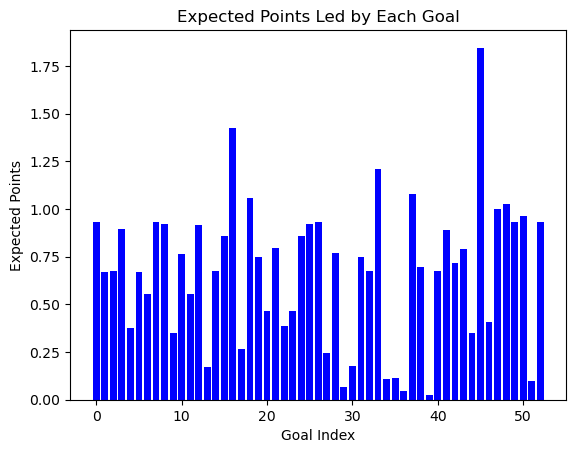

Nick Barmby


100%|██████████████████████████████████████████████████████████████████████████████████| 49/49 [02:46<00:00,  3.40s/it]


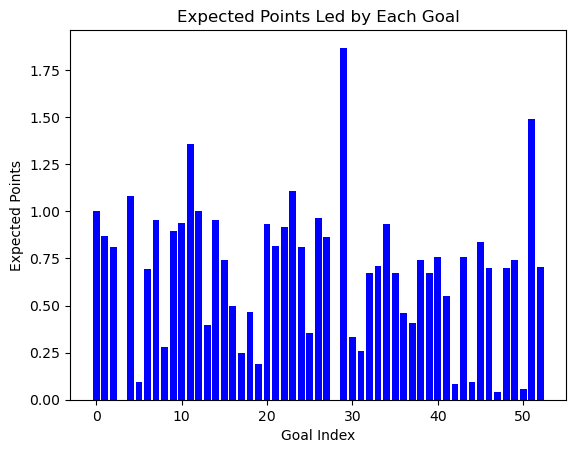

Efan Ekoku


100%|██████████████████████████████████████████████████████████████████████████████████| 43/43 [02:42<00:00,  3.79s/it]


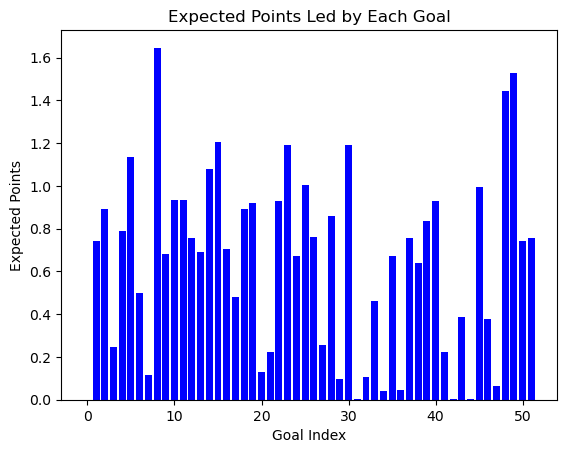

Trevor Sinclair


100%|██████████████████████████████████████████████████████████████████████████████████| 47/47 [02:46<00:00,  3.53s/it]


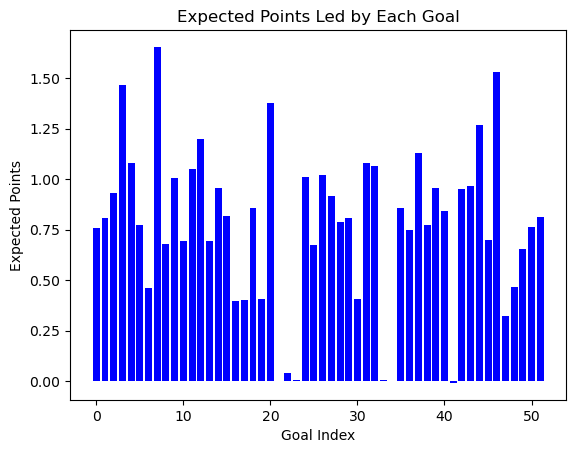

Stan Collymore


100%|██████████████████████████████████████████████████████████████████████████████████| 52/52 [03:16<00:00,  3.79s/it]


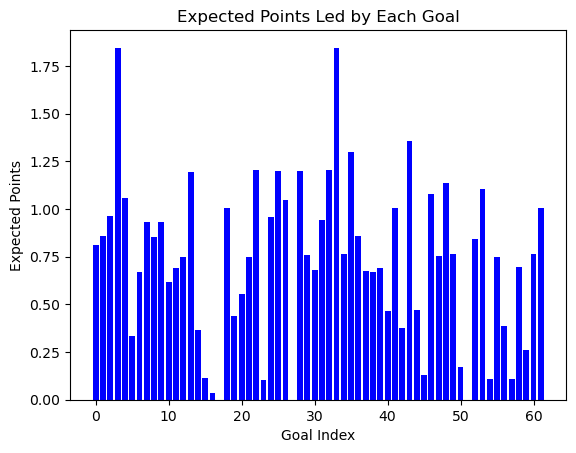

Duncan Ferguson


100%|██████████████████████████████████████████████████████████████████████████████████| 58/58 [03:34<00:00,  3.69s/it]


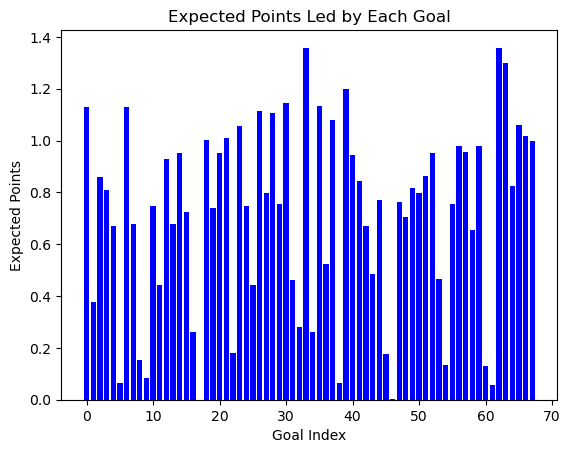

John Hartson


100%|██████████████████████████████████████████████████████████████████████████████████| 45/45 [02:53<00:00,  3.86s/it]


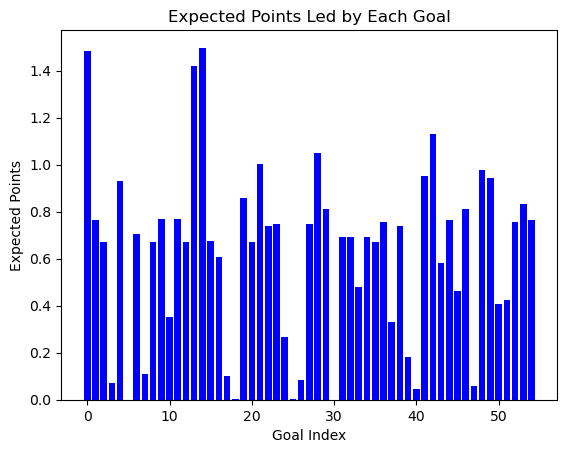

David Beckham


100%|██████████████████████████████████████████████████████████████████████████████████| 58/58 [03:09<00:00,  3.27s/it]


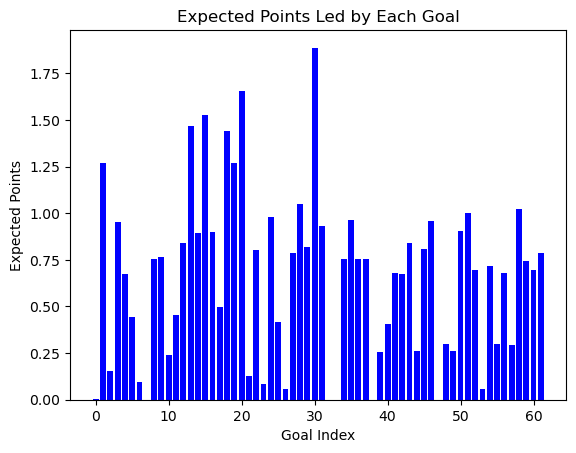

Jason Euell


100%|██████████████████████████████████████████████████████████████████████████████████| 48/48 [02:39<00:00,  3.31s/it]


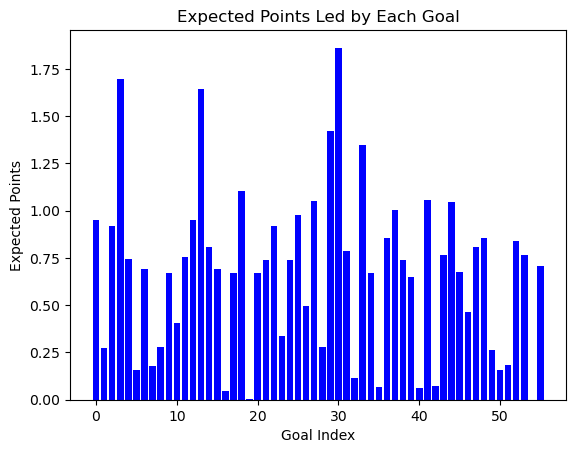

Lee Bowyer


100%|██████████████████████████████████████████████████████████████████████████████████| 55/55 [02:41<00:00,  2.93s/it]


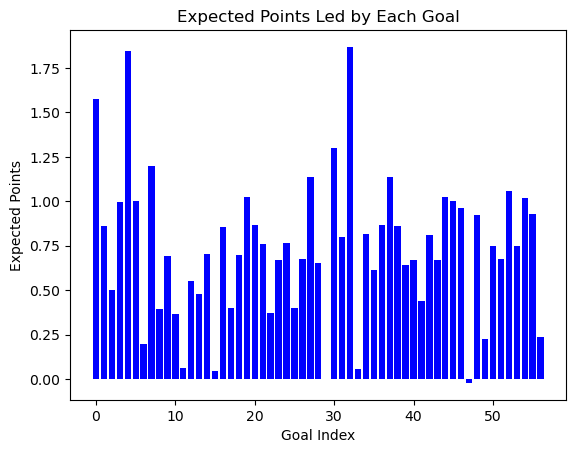

Gianfranco Zola


100%|██████████████████████████████████████████████████████████████████████████████████| 52/52 [02:47<00:00,  3.23s/it]


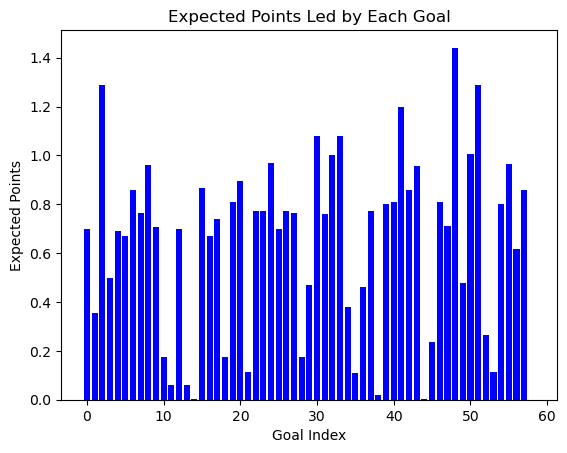

Paulo Wanchope


100%|██████████████████████████████████████████████████████████████████████████████████| 41/41 [02:23<00:00,  3.49s/it]


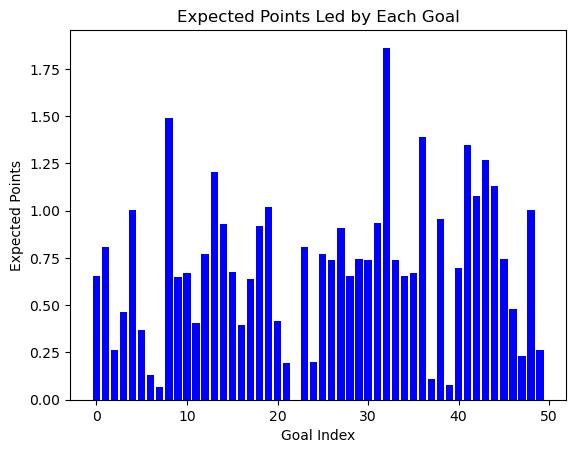

Paolo Di Canio


100%|██████████████████████████████████████████████████████████████████████████████████| 61/61 [03:07<00:00,  3.08s/it]


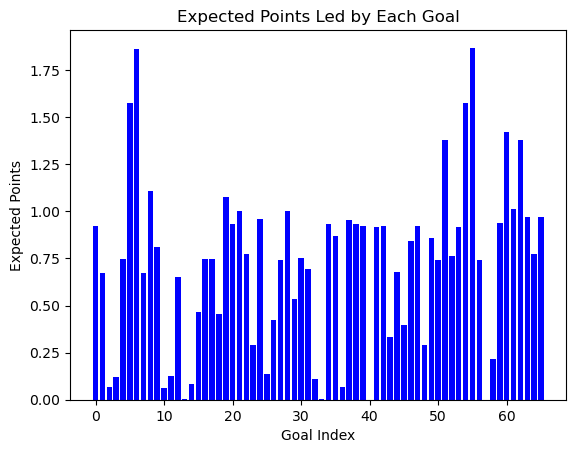

Gustavo Poyet


100%|██████████████████████████████████████████████████████████████████████████████████| 49/49 [02:28<00:00,  3.04s/it]


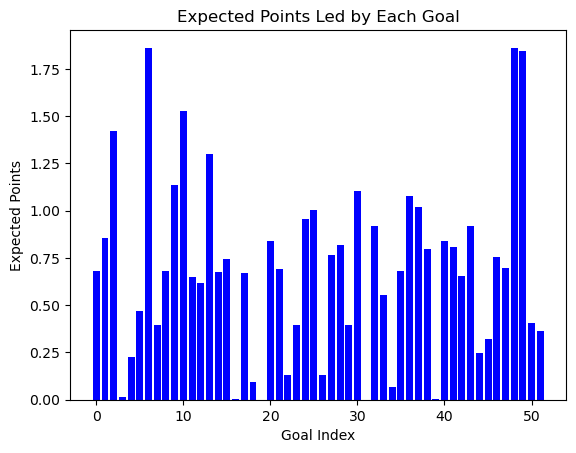

Harry Kewell


100%|██████████████████████████████████████████████████████████████████████████████████| 53/53 [02:42<00:00,  3.06s/it]


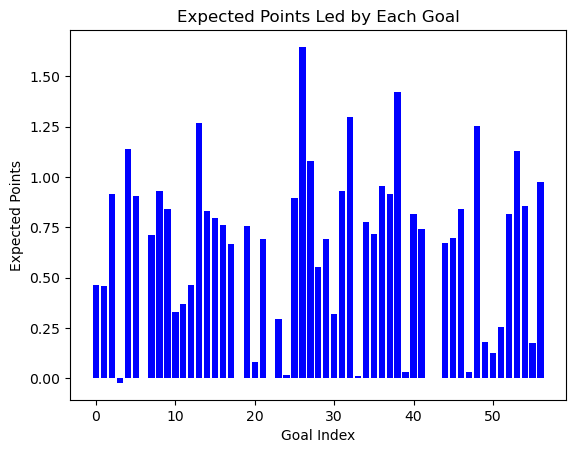

Damien Duff


100%|██████████████████████████████████████████████████████████████████████████████████| 52/52 [02:33<00:00,  2.95s/it]


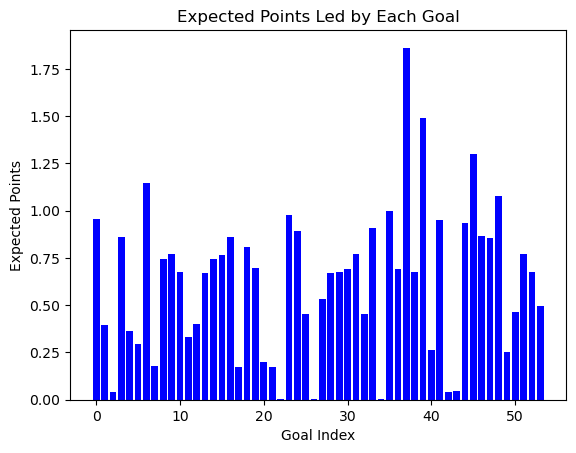

Kanu


100%|██████████████████████████████████████████████████████████████████████████████████| 45/45 [02:33<00:00,  3.42s/it]


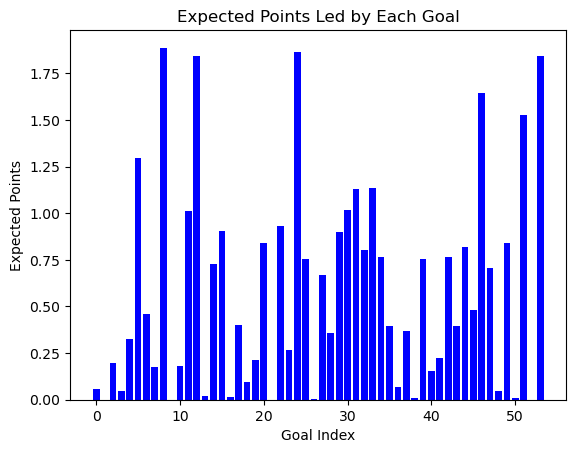

Gareth Barry


100%|██████████████████████████████████████████████████████████████████████████████████| 51/51 [02:28<00:00,  2.90s/it]


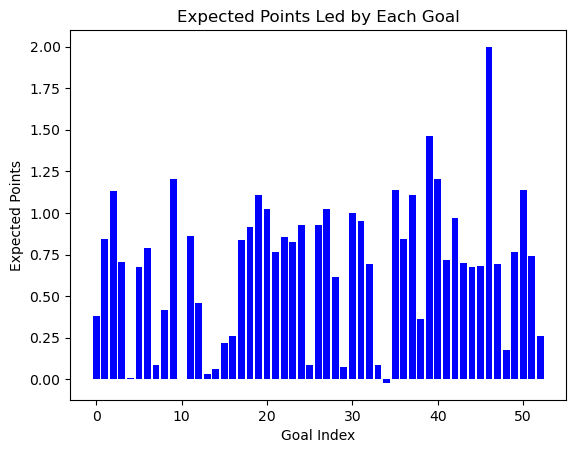

Danny Murphy


100%|██████████████████████████████████████████████████████████████████████████████████| 47/47 [02:21<00:00,  3.01s/it]


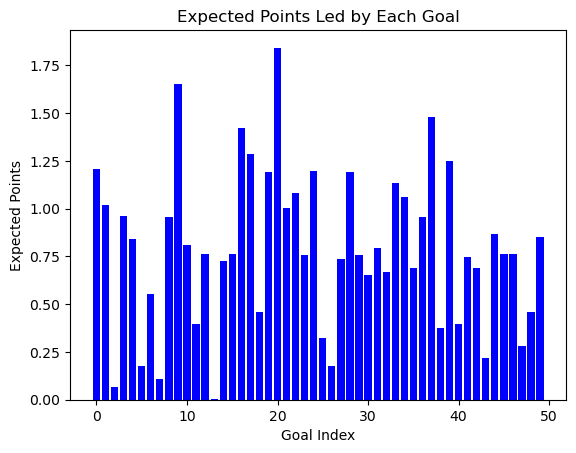

Eidur Gudjohnsen


100%|██████████████████████████████████████████████████████████████████████████████████| 46/46 [02:33<00:00,  3.33s/it]


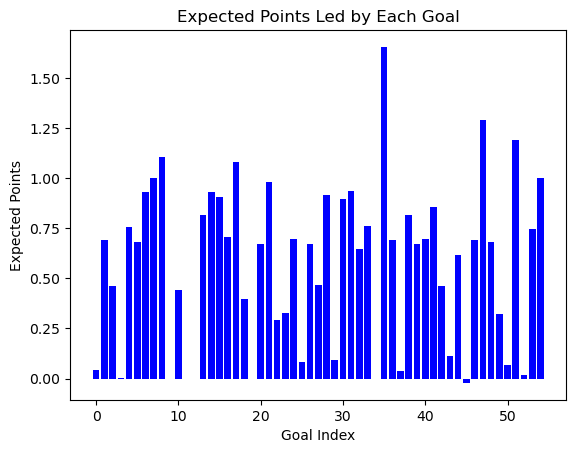

Robert Pirès


100%|██████████████████████████████████████████████████████████████████████████████████| 57/57 [02:55<00:00,  3.08s/it]


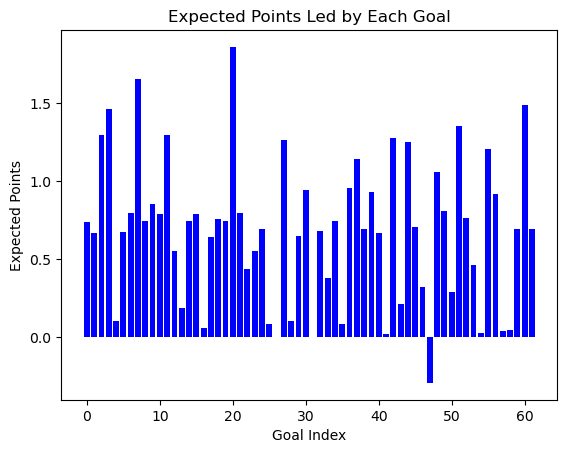

Darius Vassell


100%|██████████████████████████████████████████████████████████████████████████████████| 46/46 [02:27<00:00,  3.21s/it]


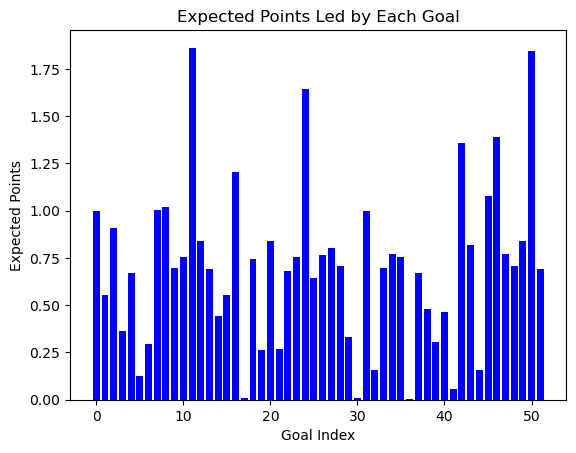

Kevin Nolan


100%|██████████████████████████████████████████████████████████████████████████████████| 60/60 [03:12<00:00,  3.20s/it]


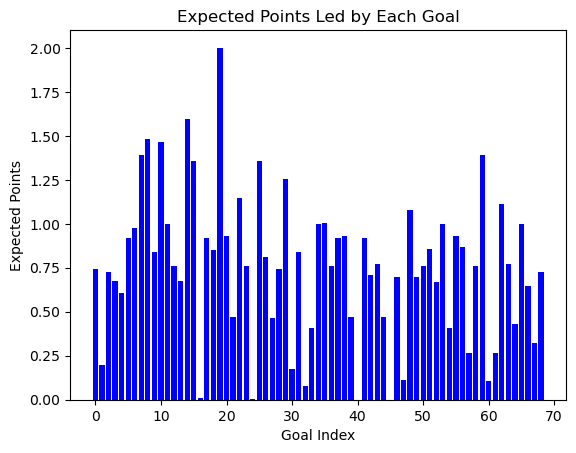

Carlton Cole


100%|██████████████████████████████████████████████████████████████████████████████████| 51/51 [02:29<00:00,  2.92s/it]


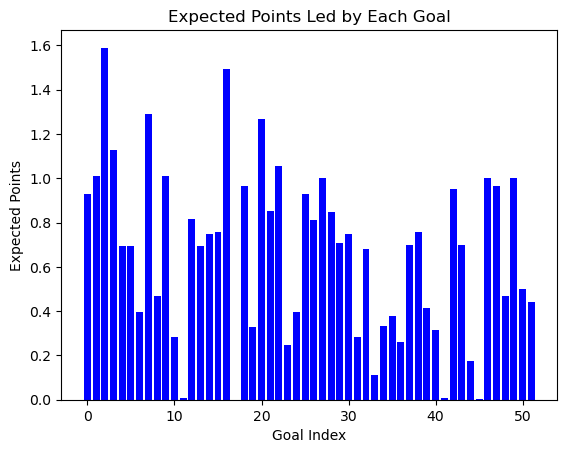

James Milner


100%|██████████████████████████████████████████████████████████████████████████████████| 54/54 [02:38<00:00,  2.94s/it]


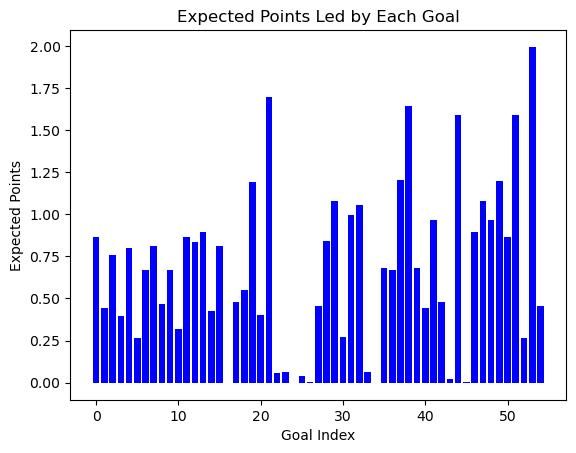

Andrew Johnson


100%|██████████████████████████████████████████████████████████████████████████████████| 44/44 [02:27<00:00,  3.35s/it]


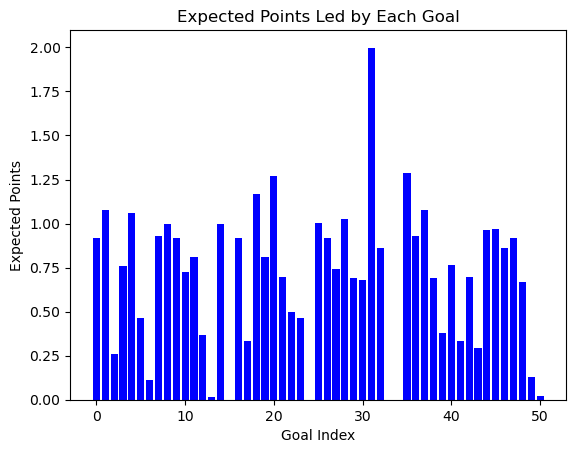

Cesc Fàbregas


100%|██████████████████████████████████████████████████████████████████████████████████| 46/46 [02:22<00:00,  3.09s/it]


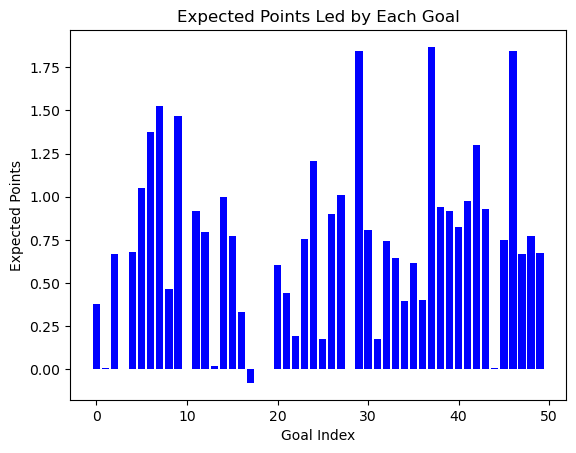

Tim Cahill


100%|██████████████████████████████████████████████████████████████████████████████████| 51/51 [02:37<00:00,  3.10s/it]


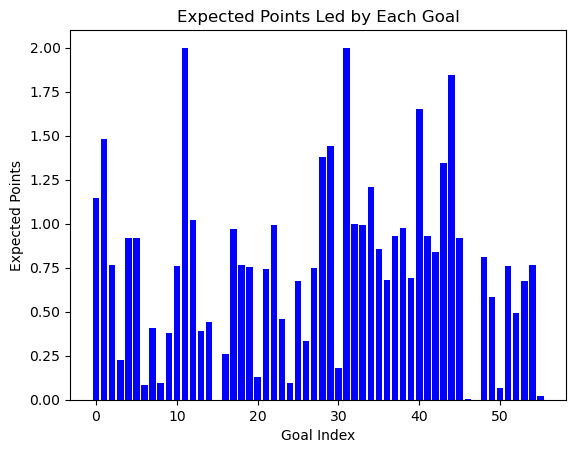

Gabriel Agbonlahor


100%|██████████████████████████████████████████████████████████████████████████████████| 68/68 [03:32<00:00,  3.12s/it]


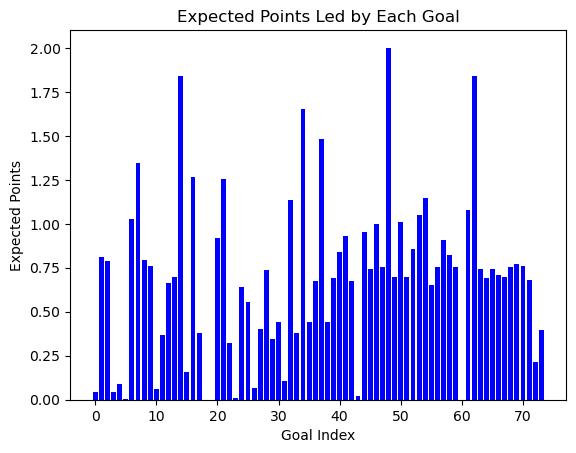

Dirk Kuijt


100%|██████████████████████████████████████████████████████████████████████████████████| 43/43 [02:24<00:00,  3.37s/it]


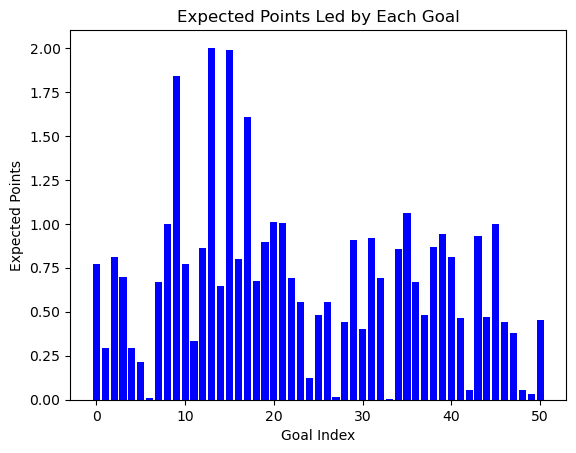

Shane Long


100%|██████████████████████████████████████████████████████████████████████████████████| 52/52 [02:40<00:00,  3.09s/it]


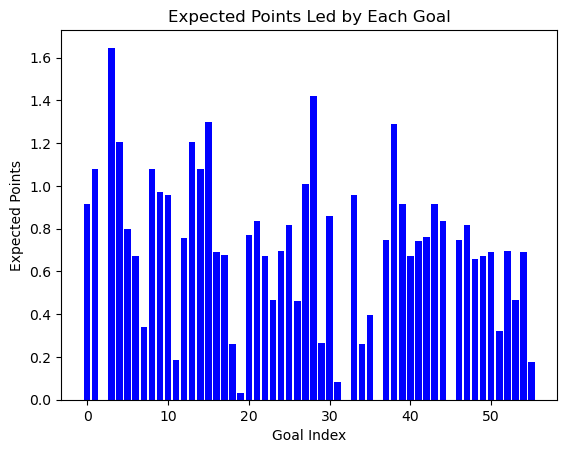

Clint Dempsey


100%|██████████████████████████████████████████████████████████████████████████████████| 47/47 [02:42<00:00,  3.47s/it]


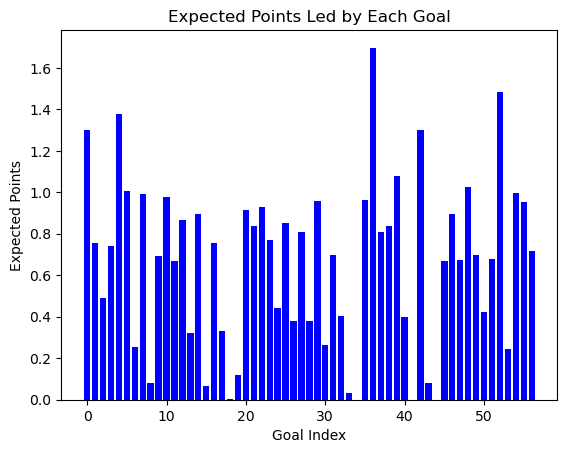

Gareth Bale


100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [02:31<00:00,  3.89s/it]


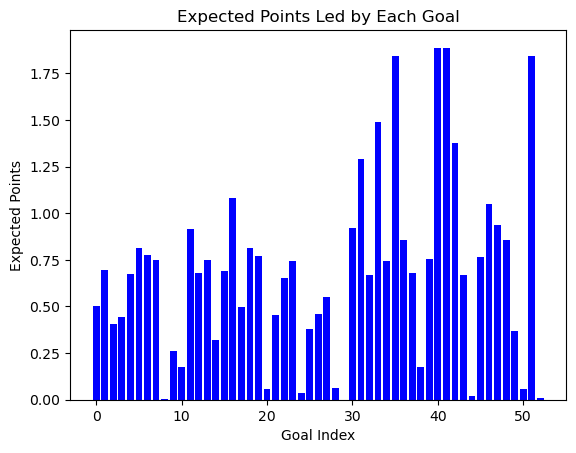

Daniel Sturridge


100%|██████████████████████████████████████████████████████████████████████████████████| 68/68 [03:36<00:00,  3.19s/it]


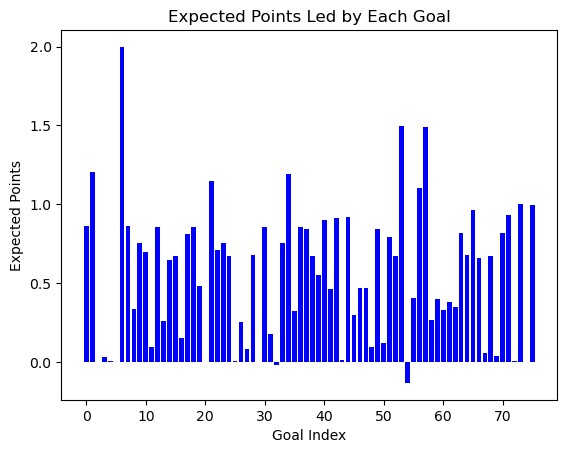

Danny Welbeck


100%|██████████████████████████████████████████████████████████████████████████████████| 56/56 [02:56<00:00,  3.15s/it]


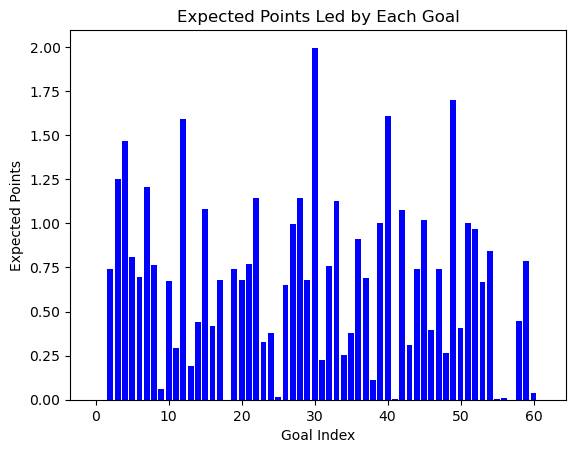

Andy Carroll


100%|██████████████████████████████████████████████████████████████████████████████████| 45/45 [02:33<00:00,  3.41s/it]


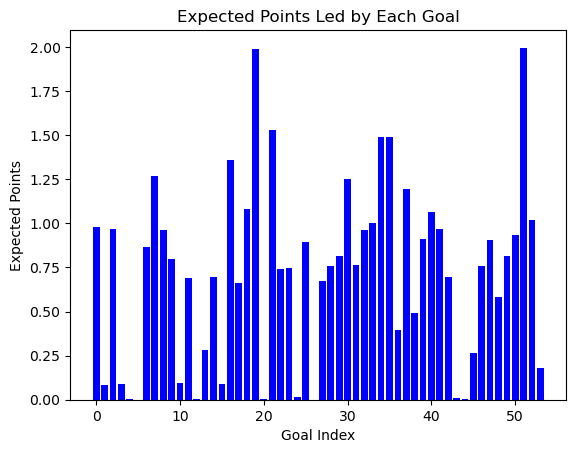

Steven Fletcher


100%|██████████████████████████████████████████████████████████████████████████████████| 46/46 [02:30<00:00,  3.27s/it]


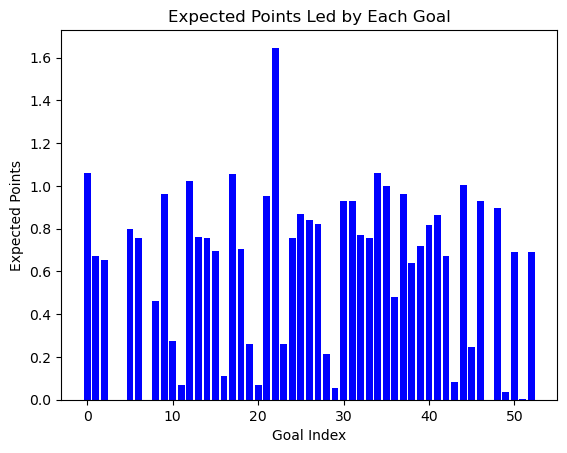

Yaya Touré


100%|██████████████████████████████████████████████████████████████████████████████████| 55/55 [03:04<00:00,  3.36s/it]


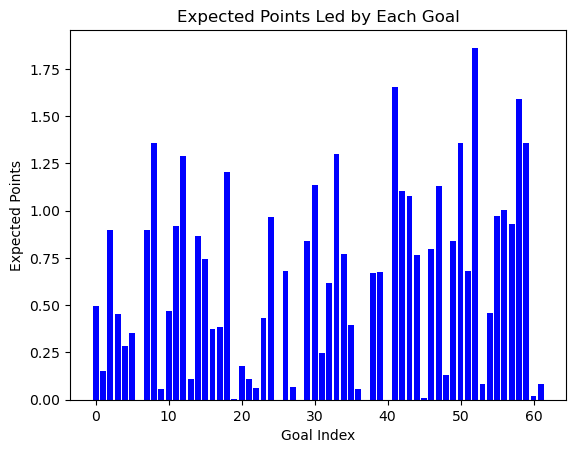

Chicharito


100%|██████████████████████████████████████████████████████████████████████████████████| 44/44 [02:31<00:00,  3.44s/it]


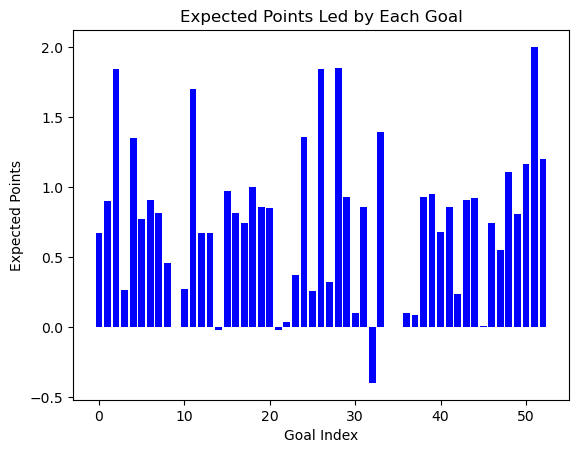

David Silva


100%|██████████████████████████████████████████████████████████████████████████████████| 55/55 [02:51<00:00,  3.12s/it]


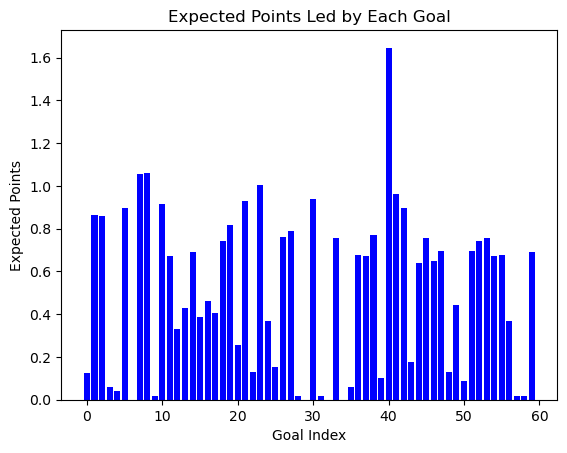

Luis Suárez


100%|██████████████████████████████████████████████████████████████████████████████████| 47/47 [03:15<00:00,  4.17s/it]


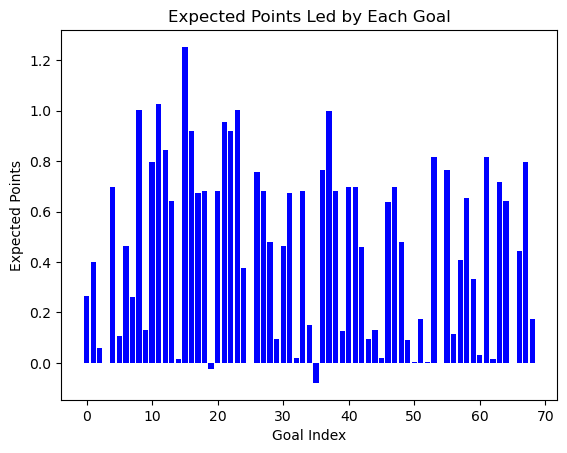

Edin Dzeko


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [02:21<00:00,  3.53s/it]


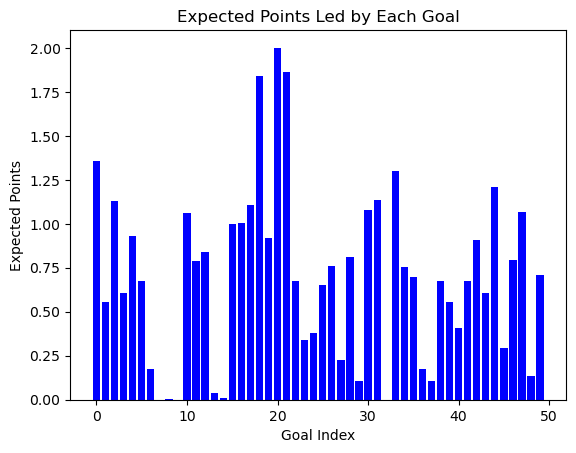

Juan Mata


100%|██████████████████████████████████████████████████████████████████████████████████| 47/47 [02:28<00:00,  3.16s/it]


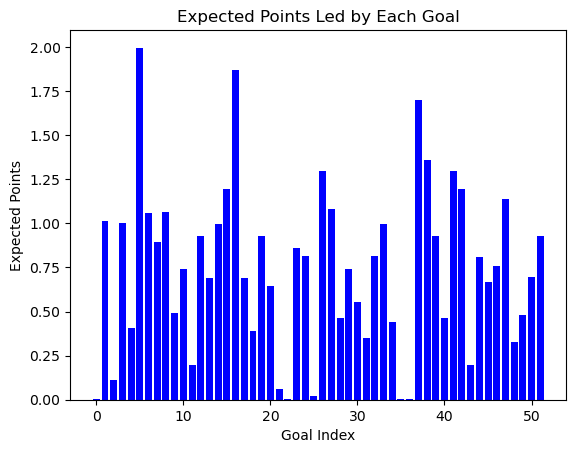

Gylfi Sigurdsson


100%|██████████████████████████████████████████████████████████████████████████████████| 61/61 [03:10<00:00,  3.13s/it]


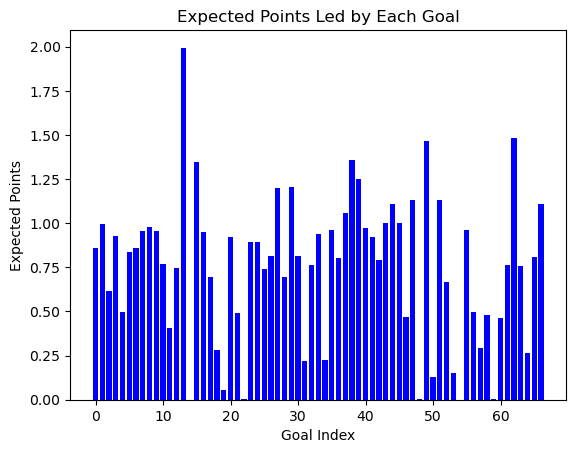

Christian Eriksen


100%|██████████████████████████████████████████████████████████████████████████████████| 48/48 [02:30<00:00,  3.14s/it]


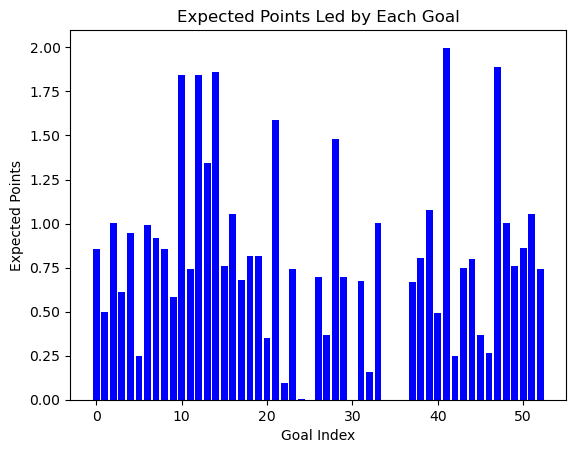

Chris Wood


100%|██████████████████████████████████████████████████████████████████████████████████| 49/49 [02:36<00:00,  3.20s/it]


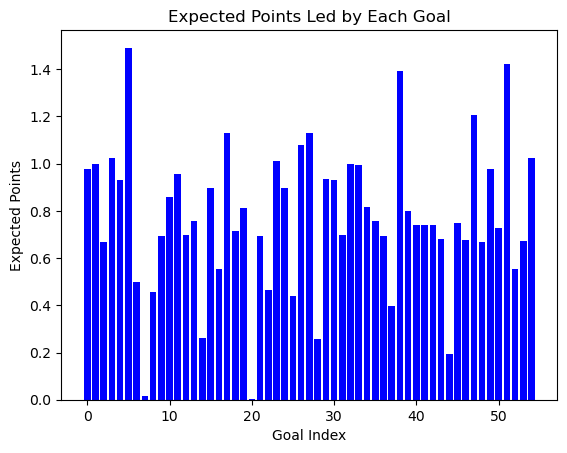

Diego Costa


100%|██████████████████████████████████████████████████████████████████████████████████| 46/46 [02:29<00:00,  3.24s/it]


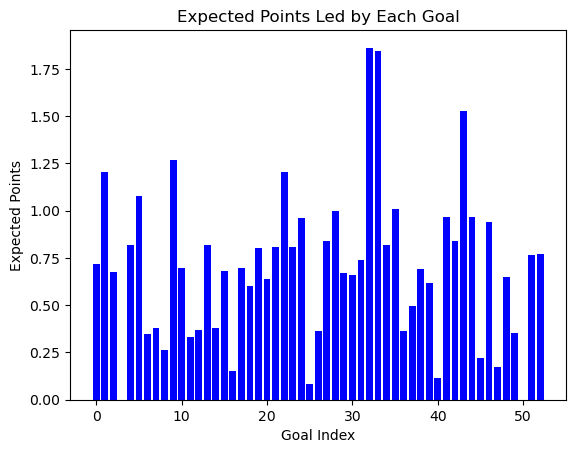

Wilfried Zaha


100%|██████████████████████████████████████████████████████████████████████████████████| 62/62 [03:15<00:00,  3.16s/it]


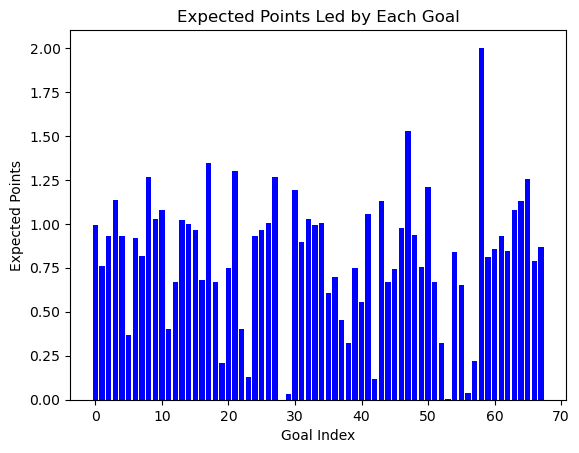

Alexis Sánchez


100%|██████████████████████████████████████████████████████████████████████████████████| 47/47 [02:55<00:00,  3.73s/it]


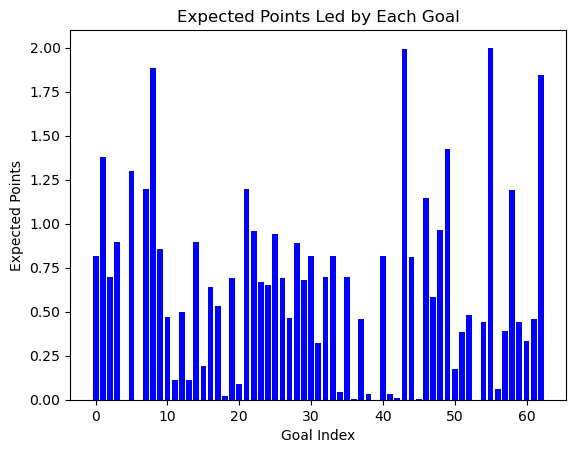

Danny Ings


100%|██████████████████████████████████████████████████████████████████████████████████| 61/61 [03:12<00:00,  3.16s/it]


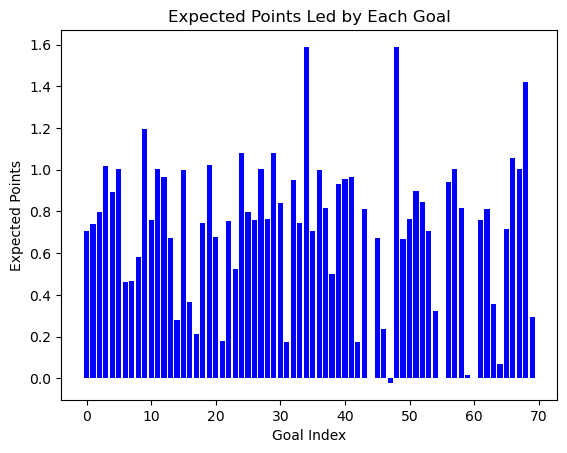

Dele Alli


100%|██████████████████████████████████████████████████████████████████████████████████| 45/45 [02:20<00:00,  3.13s/it]


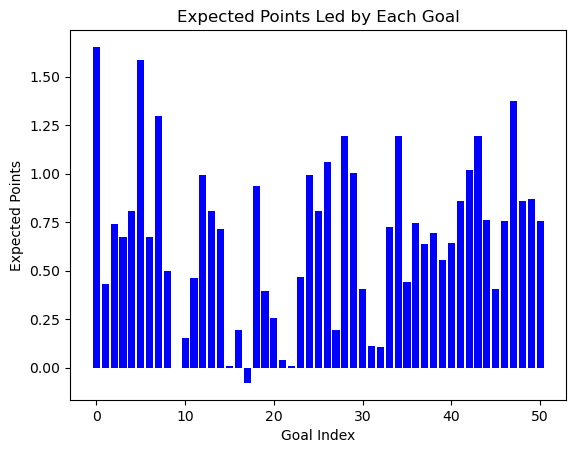

Callum Wilson


100%|██████████████████████████████████████████████████████████████████████████████████| 62/62 [03:35<00:00,  3.48s/it]


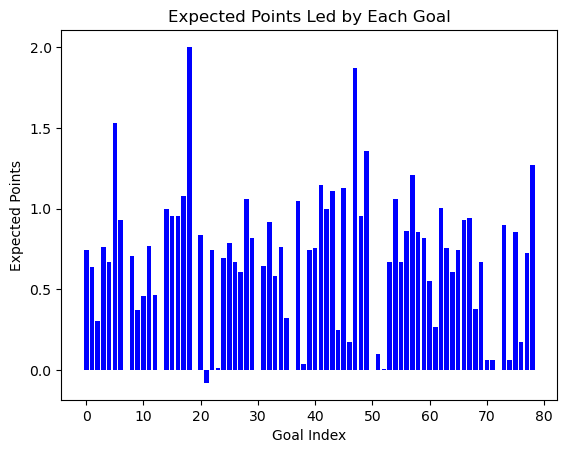

Anthony Martial


100%|██████████████████████████████████████████████████████████████████████████████████| 54/54 [02:52<00:00,  3.20s/it]


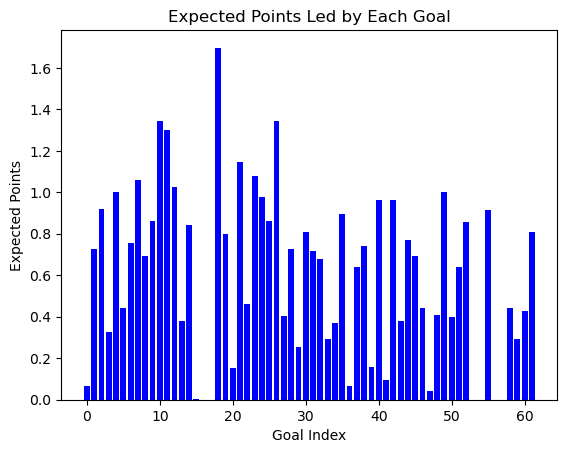

Kevin De Bruyne


100%|██████████████████████████████████████████████████████████████████████████████████| 55/55 [02:54<00:00,  3.16s/it]


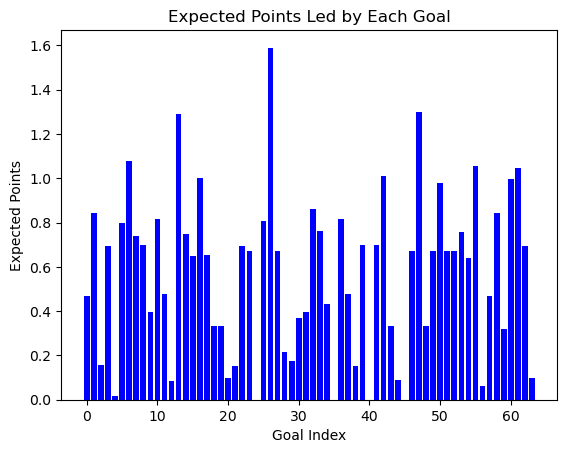

Joshua King


100%|██████████████████████████████████████████████████████████████████████████████████| 45/45 [02:25<00:00,  3.23s/it]


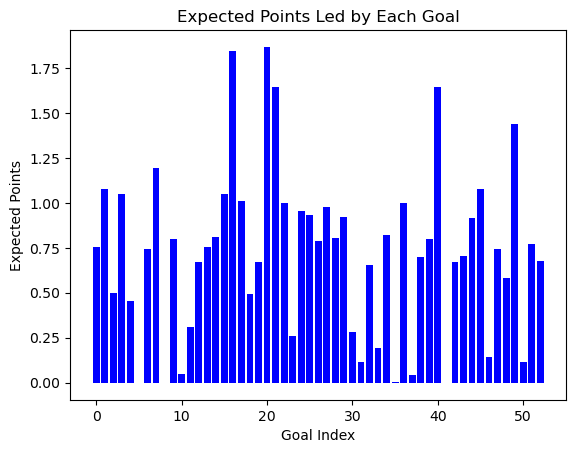

Michail Antonio


100%|██████████████████████████████████████████████████████████████████████████████████| 55/55 [02:47<00:00,  3.04s/it]


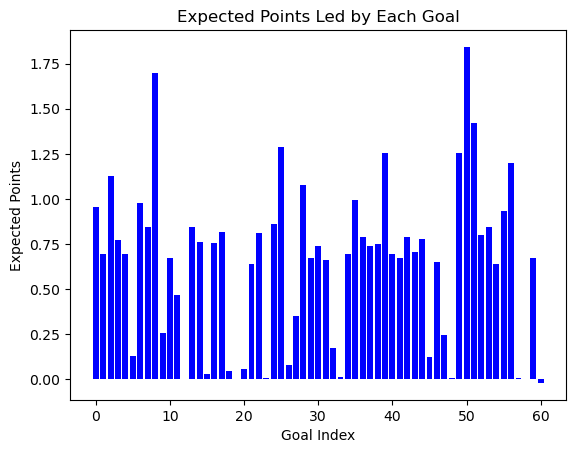

Marcus Rashford


100%|██████████████████████████████████████████████████████████████████████████████████| 68/68 [03:37<00:00,  3.20s/it]


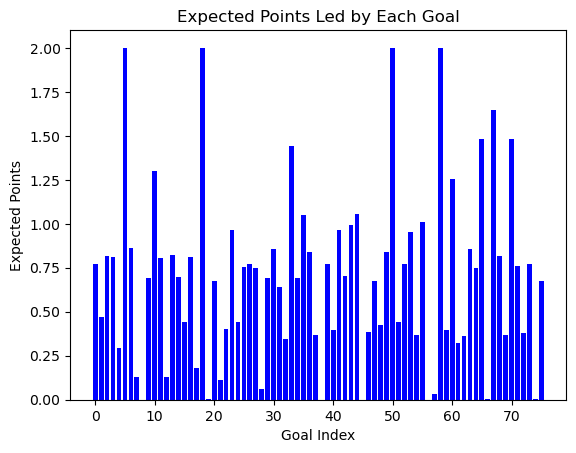

Gabriel Jesus


100%|██████████████████████████████████████████████████████████████████████████████████| 56/56 [03:11<00:00,  3.42s/it]


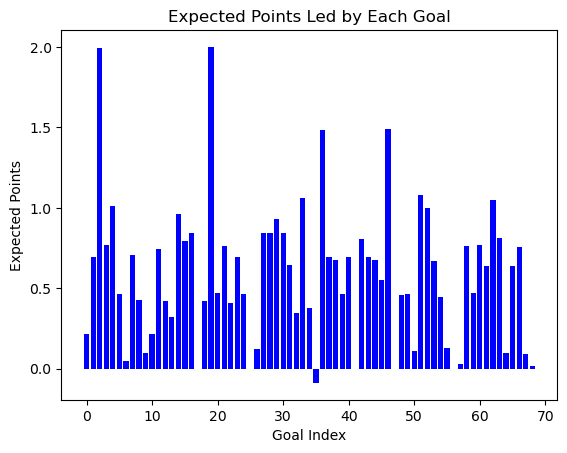

Alexandre Lacazette


100%|██████████████████████████████████████████████████████████████████████████████████| 48/48 [02:32<00:00,  3.19s/it]


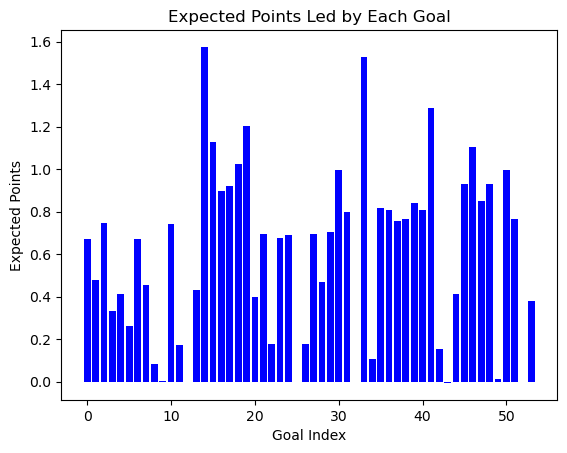

Pierre-Emerick Aubameyang


100%|██████████████████████████████████████████████████████████████████████████████████| 54/54 [03:13<00:00,  3.58s/it]


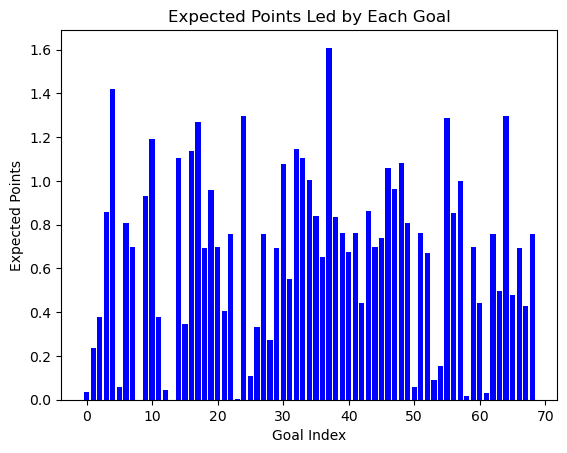

In [29]:
import csv
scr_over_50_points_dict={}
for k,v in scr_over_50_dict.items():
    print(k)
    lst = cal_exp_win_goal_without_print(k)
    scr_over_50_points_dict[k] = lst[k]

    with open('scr_over_50.csv','w',encoding='utf-8') as f:
        w = csv.writer(f)
        for k1,v1 in scr_over_50_points_dict.items():
            w.writerow([k1,v1])

In [30]:
scr_over_50_points_dict.keys()

dict_keys(['Mark Bright', 'Brian Deane', 'Mark Hughes', 'Peter Beardsley', 'Eric Cantona', 'Dean Holdsworth', 'Niall Quinn', 'Kevin Gallacher', 'Chris Armstrong', 'Tony Cottee', 'Alan Smith', 'Nick Barmby', 'Efan Ekoku', 'Trevor Sinclair', 'Stan Collymore', 'Duncan Ferguson', 'John Hartson', 'David Beckham', 'Jason Euell', 'Lee Bowyer', 'Gianfranco Zola', 'Paulo Wanchope', 'Paolo Di Canio', 'Gustavo Poyet', 'Harry Kewell', 'Damien Duff', 'Kanu', 'Gareth Barry', 'Danny Murphy', 'Eidur Gudjohnsen', 'Robert Pirès', 'Darius Vassell', 'Kevin Nolan', 'Carlton Cole', 'James Milner', 'Andrew Johnson', 'Cesc Fàbregas', 'Tim Cahill', 'Gabriel Agbonlahor', 'Dirk Kuijt', 'Shane Long', 'Clint Dempsey', 'Gareth Bale', 'Daniel Sturridge', 'Danny Welbeck', 'Andy Carroll', 'Steven Fletcher', 'Yaya Touré', 'Chicharito', 'David Silva', 'Luis Suárez', 'Edin Dzeko', 'Juan Mata', 'Gylfi Sigurdsson', 'Christian Eriksen', 'Chris Wood', 'Diego Costa', 'Wilfried Zaha', 'Alexis Sánchez', 'Danny Ings', 'Dele Alli

In [31]:
scr_over_30_dict = {}
for k,v in all_player_scr_dict.items():
    if int(v) >= 30  and (int(v) < 50):
        scr_over_30_dict[k] = v

In [32]:
scr_over_30_dict

{'Ruel Fox': 36,
 'Graham Stuart': 45,
 'David Hirst': 43,
 'Rod Wallace': 45,
 'Paul Merson': 46,
 'Gary McAllister': 49,
 'Dennis Wise': 34,
 'Peter Ndlovu': 35,
 'Dean Saunders': 45,
 'Jamie Redknapp': 33,
 'Robbie Earle': 45,
 'Andrei Kanchelskis': 42,
 'Ian Marshall': 33,
 'Iain Dowie': 33,
 'Steve McManaman': 41,
 'Tim Sherwood': 37,
 'Don Hutchison': 37,
 'Ian Rush': 48,
 'Roy Keane': 39,
 'Jason Wilcox': 31,
 'Paul Ince': 42,
 'John Spencer': 36,
 'Darren Anderton': 37,
 'Paul Dickov': 36,
 'Robert Lee': 34,
 'Julian Joachim': 42,
 'Noel Whelan': 44,
 'Marcus Gayle': 34,
 'David Unsworth': 38,
 'Ashley Ward': 33,
 'Dean Sturridge': 38,
 'Patrik Berger': 38,
 'Muzzy Izzet': 34,
 'Benito Carbone': 35,
 'Patrick Vieira': 31,
 'Darren Huckerby': 38,
 'Steffen Iversen': 40,
 'Tore Andre Flo': 38,
 'Marcus Bent': 40,
 'Hamilton Ricard': 31,
 'Freddie Ljungberg': 47,
 'Nolberto Solano': 49,
 'David Dunn': 37,
 'Mikael Forssell': 34,
 'Marian Pahars': 42,
 'Joe Cole': 46,
 'Frederic Ka

Ruel Fox


100%|██████████████████████████████████████████████████████████████████████████████████| 33/33 [01:46<00:00,  3.24s/it]


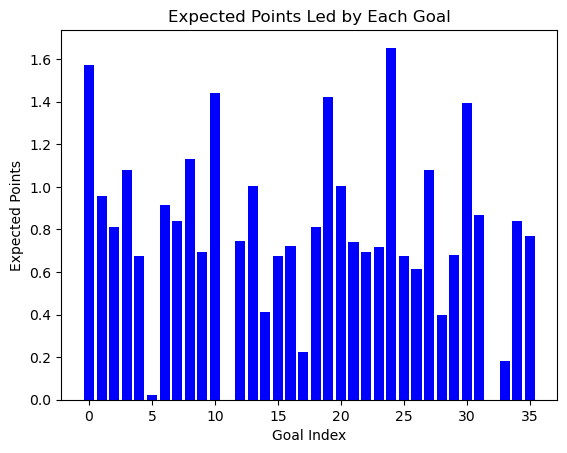

Graham Stuart


100%|██████████████████████████████████████████████████████████████████████████████████| 43/43 [02:25<00:00,  3.37s/it]


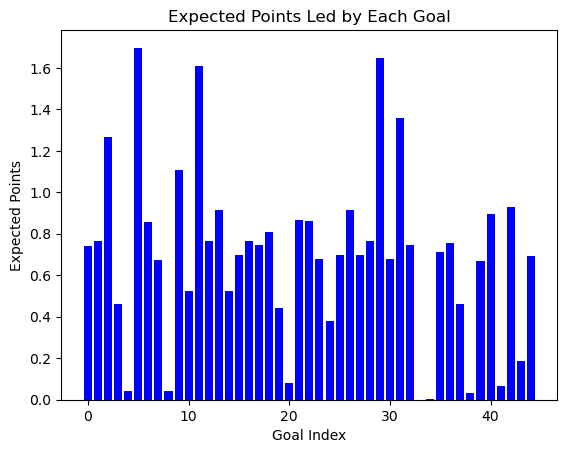

David Hirst


100%|██████████████████████████████████████████████████████████████████████████████████| 35/35 [02:18<00:00,  3.97s/it]


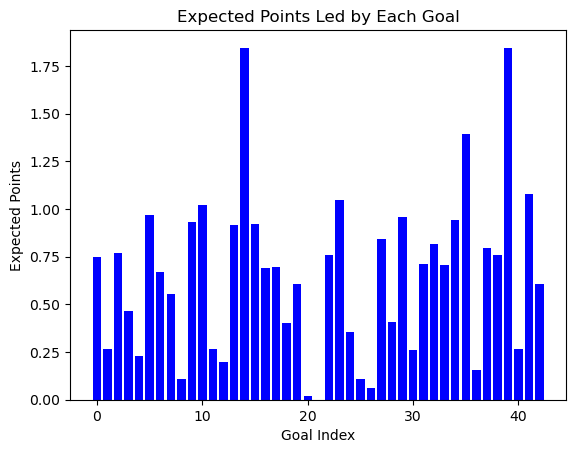

Rod Wallace


100%|██████████████████████████████████████████████████████████████████████████████████| 36/36 [02:25<00:00,  4.04s/it]


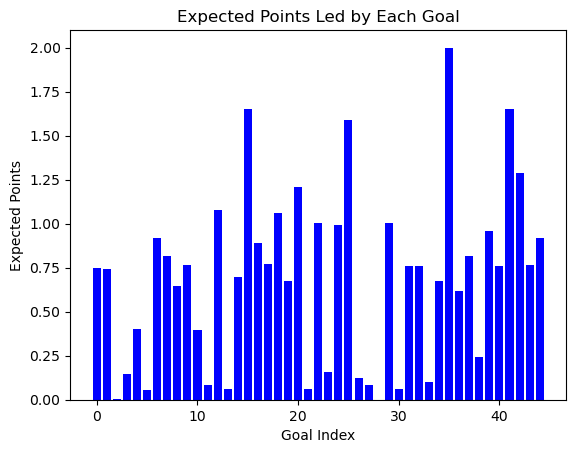

Paul Merson


100%|██████████████████████████████████████████████████████████████████████████████████| 44/44 [02:27<00:00,  3.35s/it]


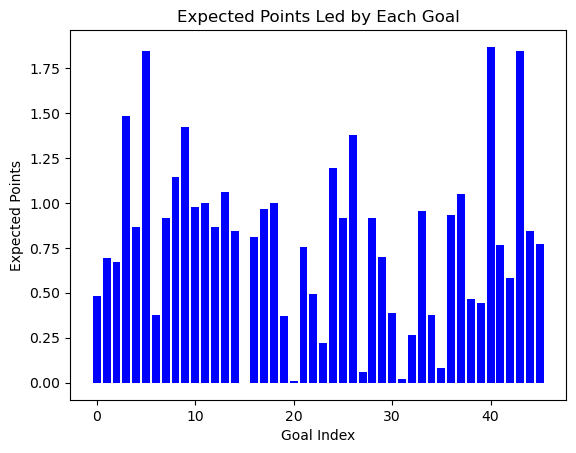

Gary McAllister


100%|██████████████████████████████████████████████████████████████████████████████████| 45/45 [02:36<00:00,  3.48s/it]


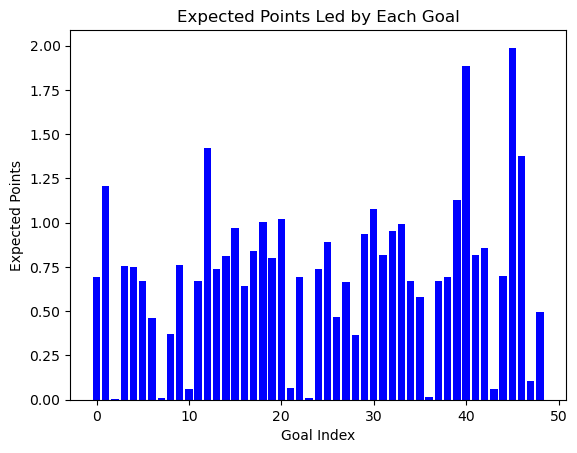

Dennis Wise


100%|██████████████████████████████████████████████████████████████████████████████████| 33/33 [01:50<00:00,  3.34s/it]


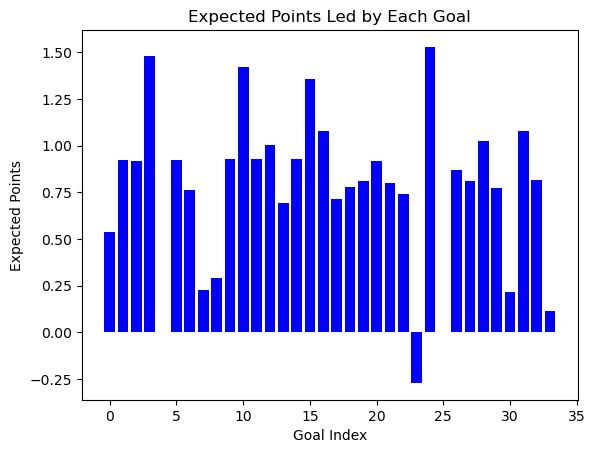

Peter Ndlovu


100%|██████████████████████████████████████████████████████████████████████████████████| 31/31 [01:52<00:00,  3.63s/it]


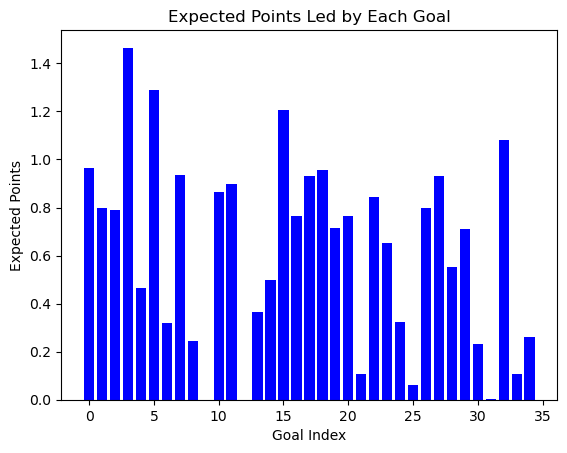

Dean Saunders


100%|██████████████████████████████████████████████████████████████████████████████████| 37/37 [02:24<00:00,  3.90s/it]


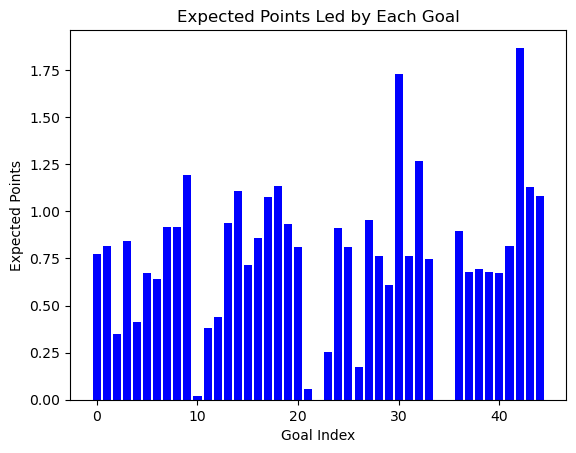

Jamie Redknapp


100%|██████████████████████████████████████████████████████████████████████████████████| 32/32 [01:45<00:00,  3.30s/it]


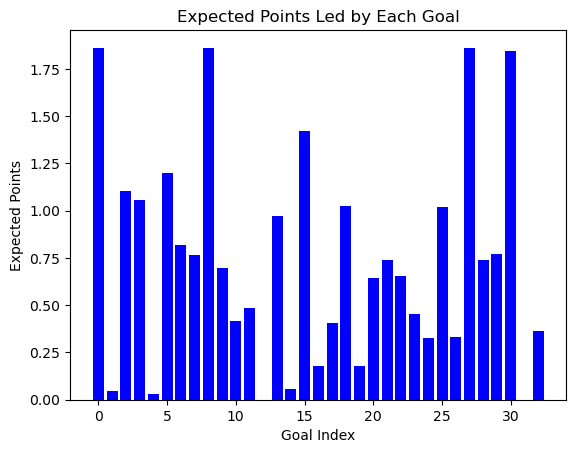

Robbie Earle


100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [02:24<00:00,  3.70s/it]


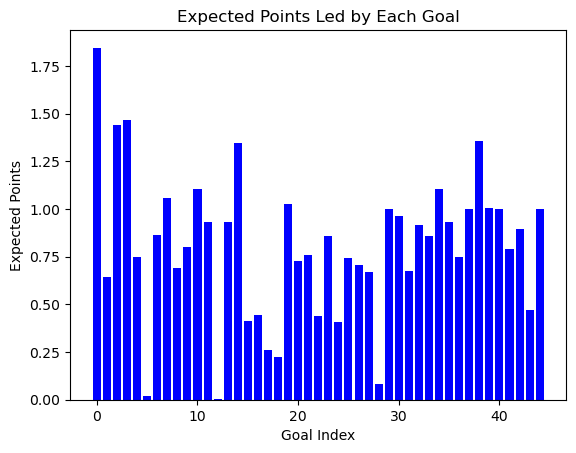

Andrei Kanchelskis


100%|██████████████████████████████████████████████████████████████████████████████████| 35/35 [02:16<00:00,  3.91s/it]


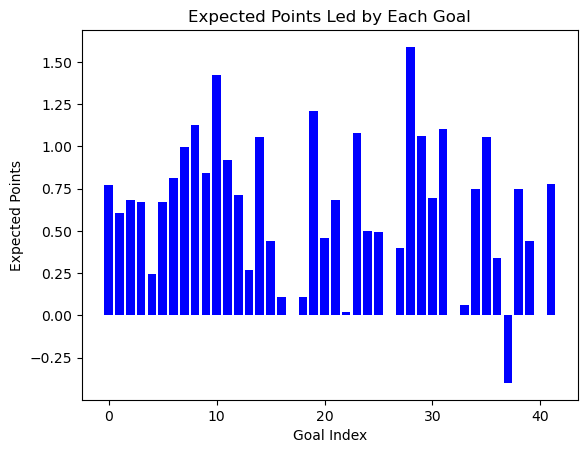

Ian Marshall


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [01:47<00:00,  3.58s/it]


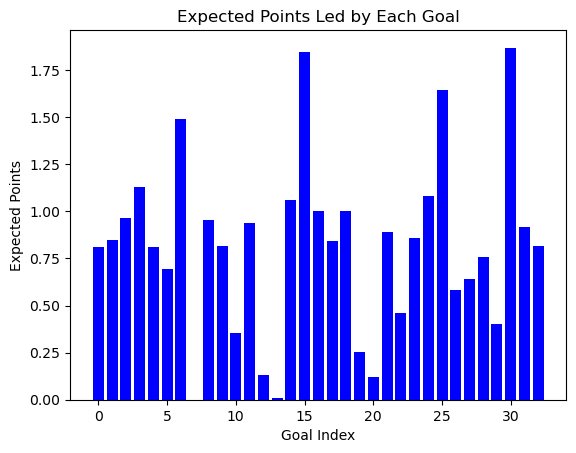

Iain Dowie


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [01:46<00:00,  3.67s/it]


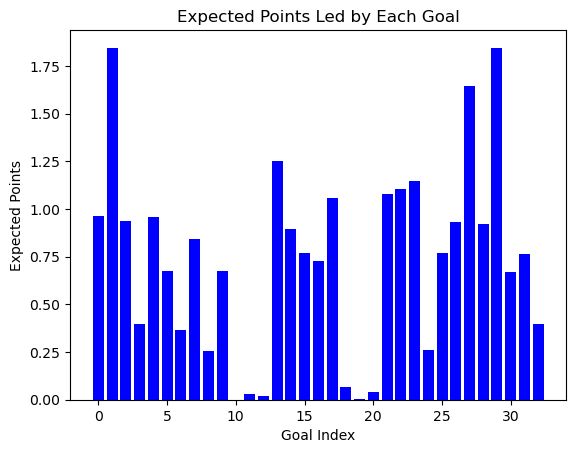

Steve McManaman


100%|██████████████████████████████████████████████████████████████████████████████████| 32/32 [02:12<00:00,  4.14s/it]


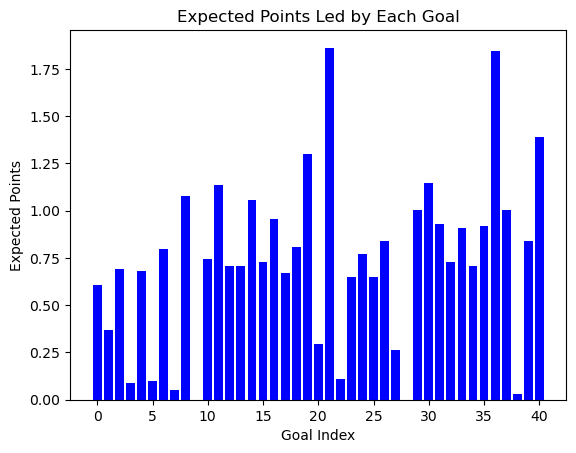

Tim Sherwood


100%|██████████████████████████████████████████████████████████████████████████████████| 36/36 [02:08<00:00,  3.57s/it]


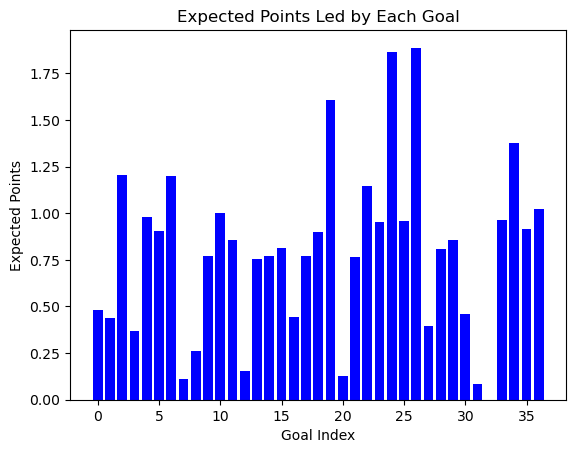

Don Hutchison


100%|██████████████████████████████████████████████████████████████████████████████████| 34/34 [02:00<00:00,  3.55s/it]


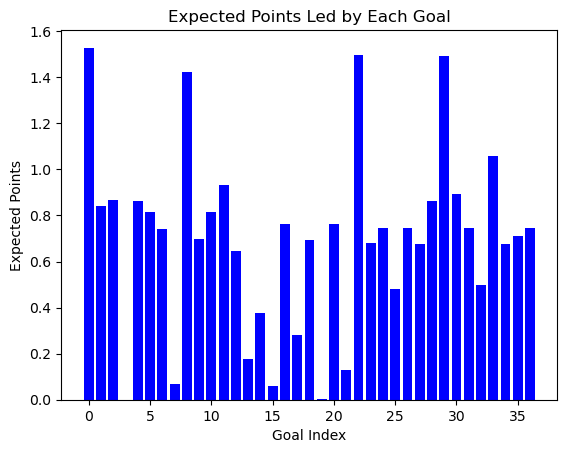

Ian Rush


100%|██████████████████████████████████████████████████████████████████████████████████| 41/41 [02:34<00:00,  3.77s/it]


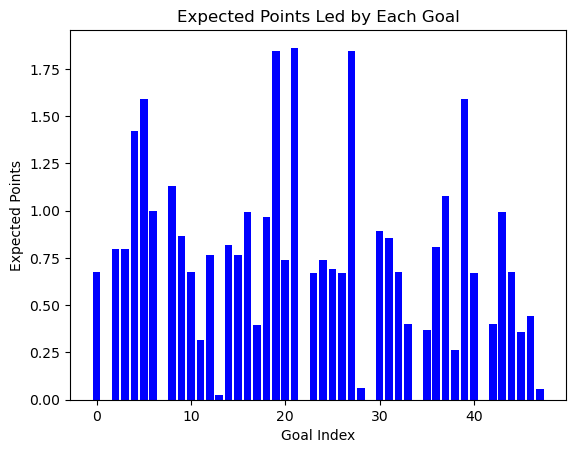

Roy Keane


100%|██████████████████████████████████████████████████████████████████████████████████| 35/35 [02:06<00:00,  3.62s/it]


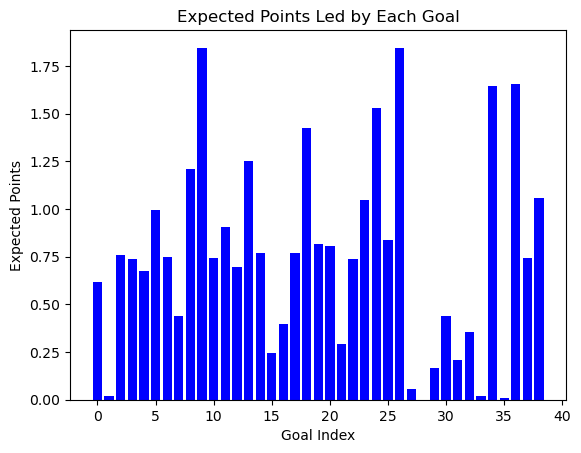

Jason Wilcox


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [01:40<00:00,  3.35s/it]


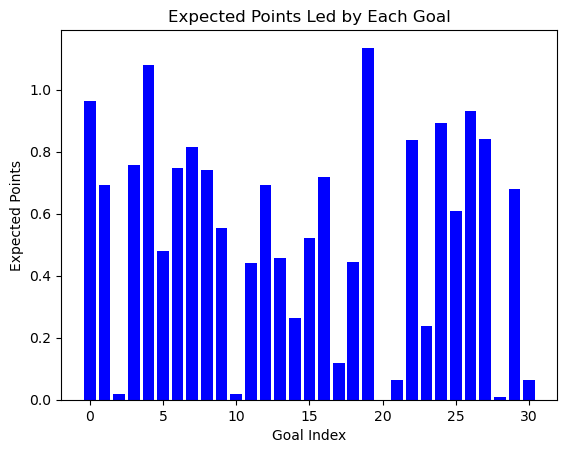

Paul Ince


100%|██████████████████████████████████████████████████████████████████████████████████| 41/41 [02:16<00:00,  3.32s/it]


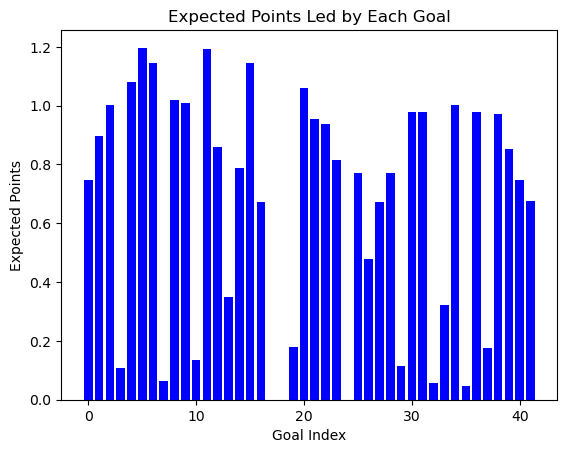

John Spencer


100%|██████████████████████████████████████████████████████████████████████████████████| 32/32 [01:57<00:00,  3.67s/it]


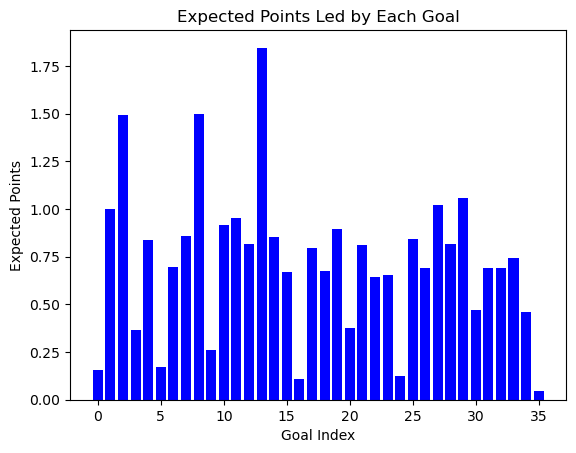

Darren Anderton


100%|██████████████████████████████████████████████████████████████████████████████████| 36/36 [01:59<00:00,  3.33s/it]


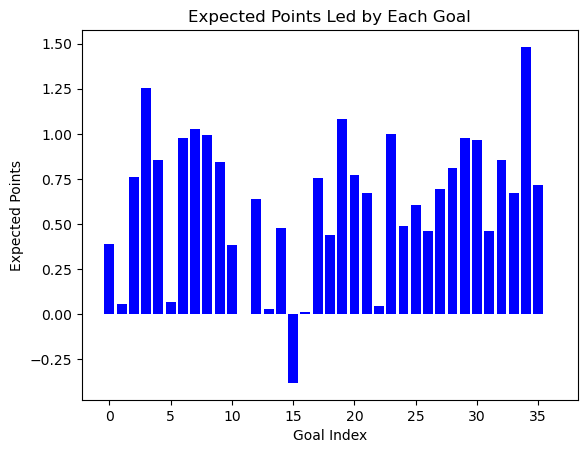

Paul Dickov


100%|██████████████████████████████████████████████████████████████████████████████████| 31/31 [01:56<00:00,  3.77s/it]


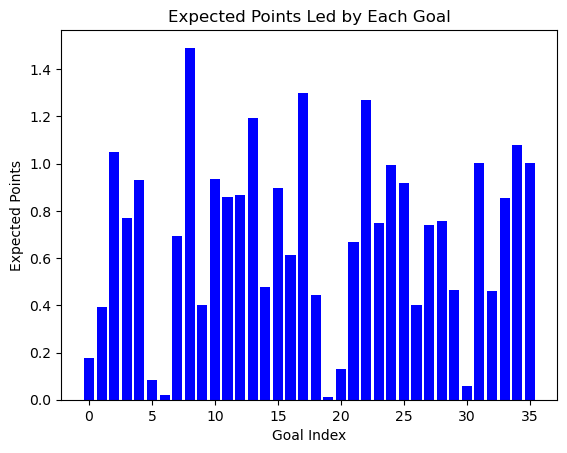

Robert Lee


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [01:51<00:00,  3.84s/it]


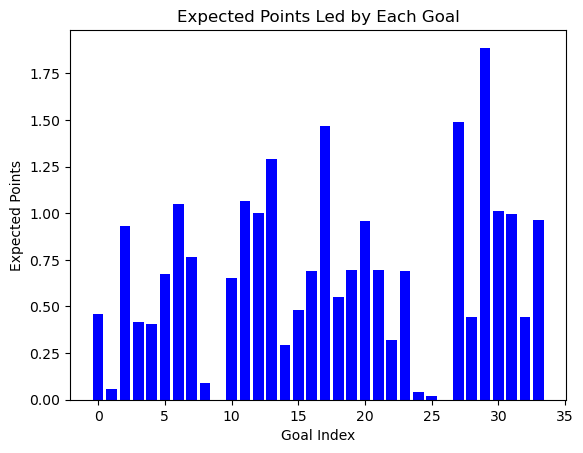

Julian Joachim


100%|██████████████████████████████████████████████████████████████████████████████████| 35/35 [02:18<00:00,  3.95s/it]


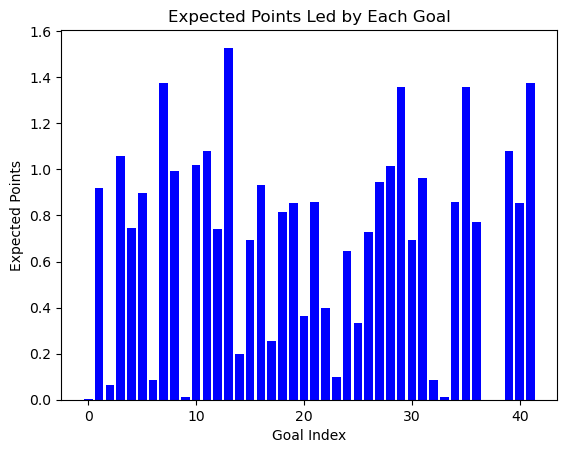

Noel Whelan


100%|██████████████████████████████████████████████████████████████████████████████████| 43/43 [02:22<00:00,  3.32s/it]


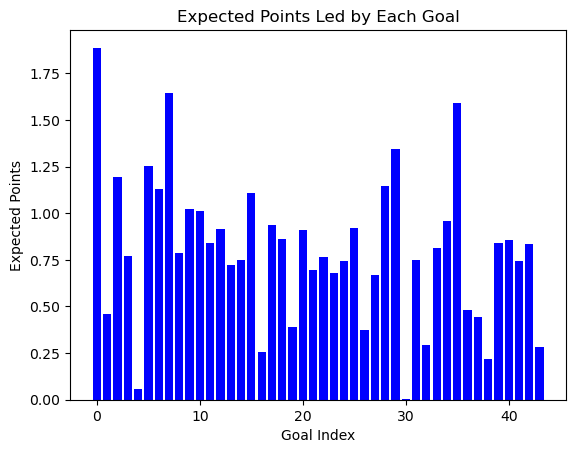

Marcus Gayle


100%|██████████████████████████████████████████████████████████████████████████████████| 32/32 [01:51<00:00,  3.49s/it]


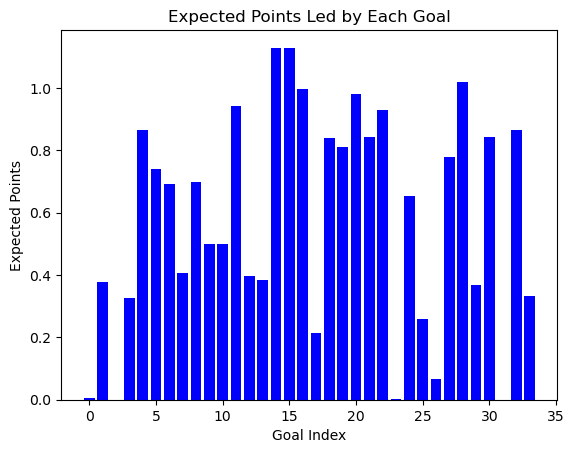

David Unsworth


100%|██████████████████████████████████████████████████████████████████████████████████| 37/37 [02:04<00:00,  3.37s/it]


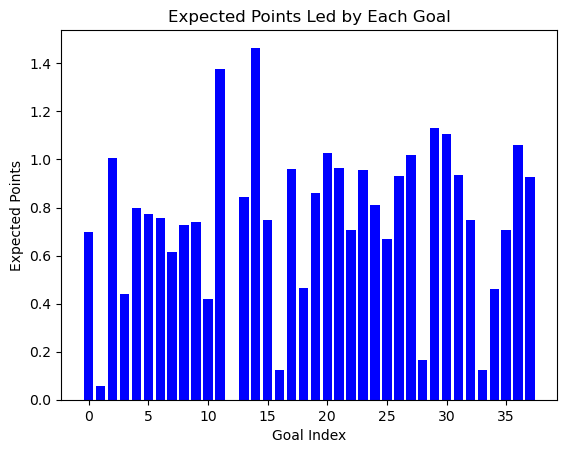

Ashley Ward


100%|██████████████████████████████████████████████████████████████████████████████████| 31/31 [01:49<00:00,  3.52s/it]


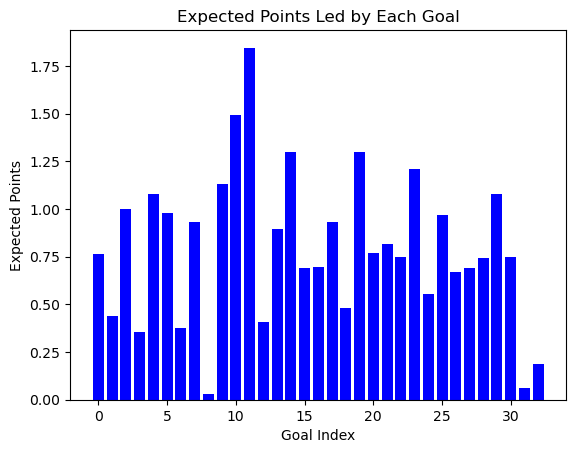

Dean Sturridge


100%|██████████████████████████████████████████████████████████████████████████████████| 33/33 [02:04<00:00,  3.76s/it]


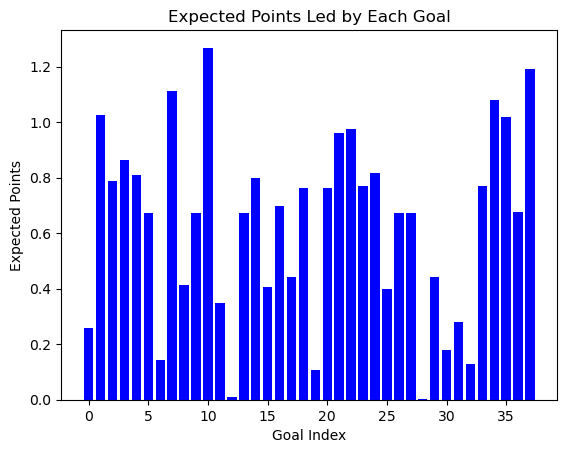

Patrik Berger


100%|██████████████████████████████████████████████████████████████████████████████████| 33/33 [02:04<00:00,  3.76s/it]


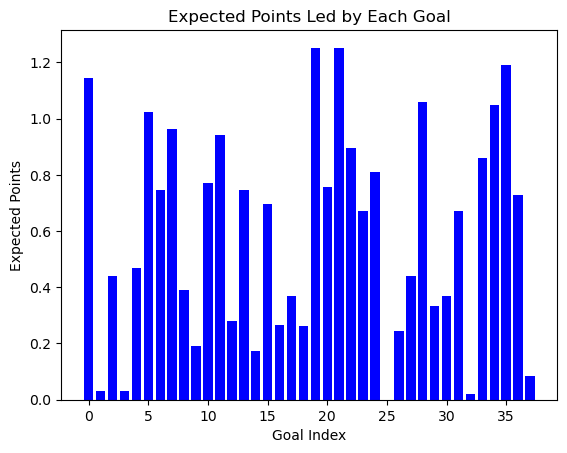

Muzzy Izzet


100%|██████████████████████████████████████████████████████████████████████████████████| 33/33 [01:51<00:00,  3.39s/it]


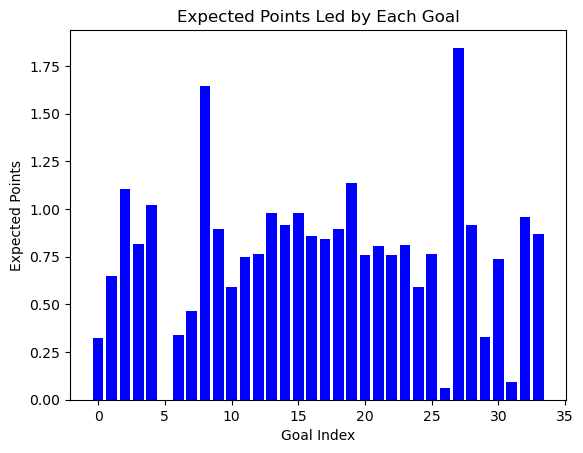

Benito Carbone


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [01:55<00:00,  3.85s/it]


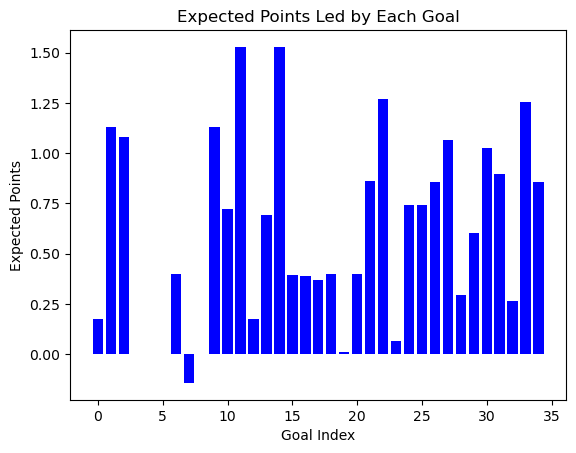

Patrick Vieira


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [01:40<00:00,  3.34s/it]


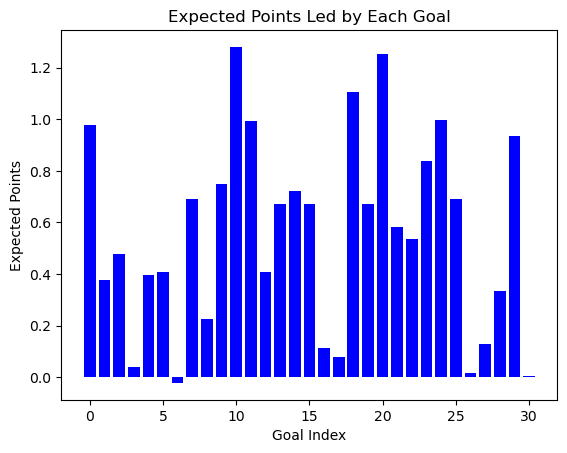

Darren Huckerby


100%|██████████████████████████████████████████████████████████████████████████████████| 32/32 [02:03<00:00,  3.86s/it]


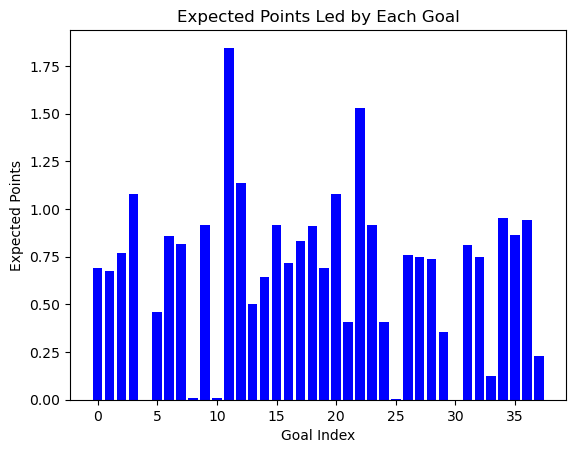

Steffen Iversen


100%|██████████████████████████████████████████████████████████████████████████████████| 32/32 [02:10<00:00,  4.06s/it]


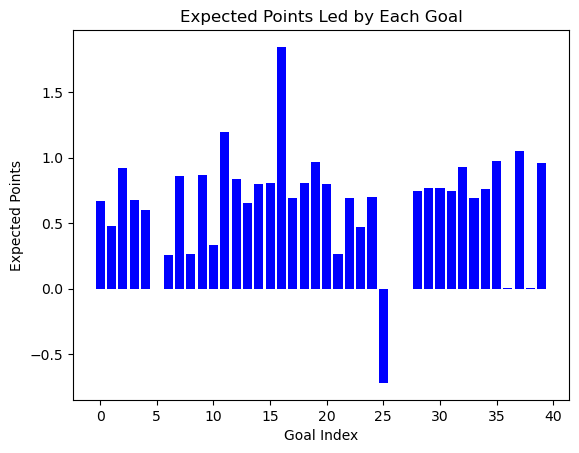

Tore Andre Flo


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [02:02<00:00,  4.09s/it]


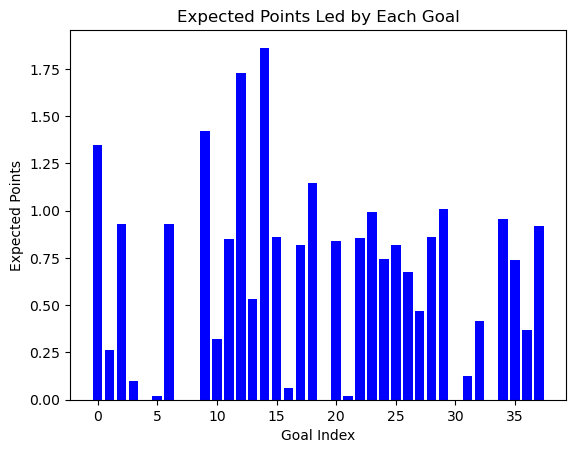

Marcus Bent


100%|██████████████████████████████████████████████████████████████████████████████████| 35/35 [02:11<00:00,  3.75s/it]


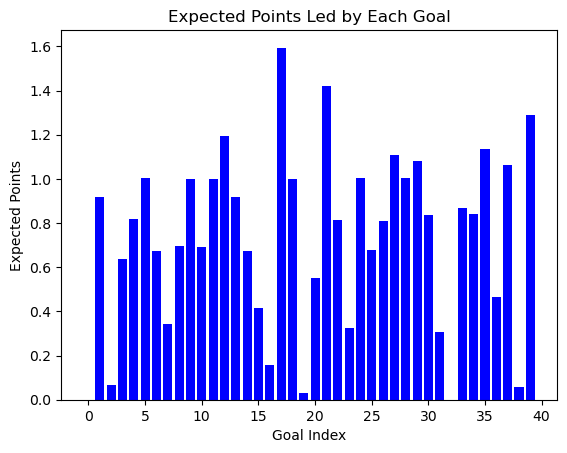

Hamilton Ricard


100%|██████████████████████████████████████████████████████████████████████████████████| 26/26 [01:41<00:00,  3.91s/it]


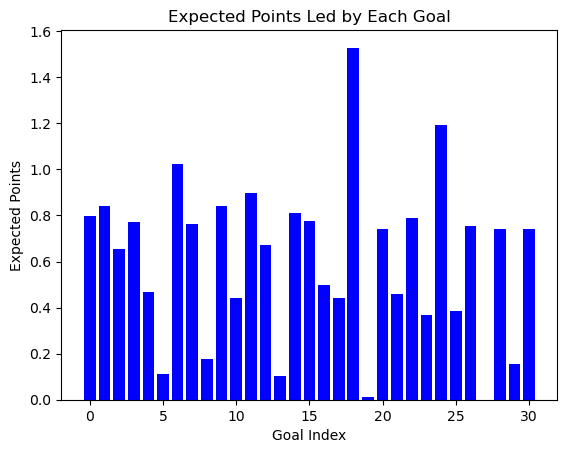

Freddie Ljungberg


100%|██████████████████████████████████████████████████████████████████████████████████| 42/42 [02:33<00:00,  3.65s/it]


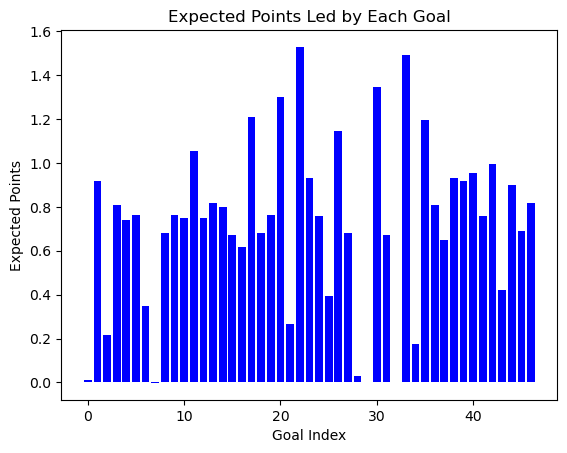

Nolberto Solano


100%|██████████████████████████████████████████████████████████████████████████████████| 47/47 [02:40<00:00,  3.41s/it]


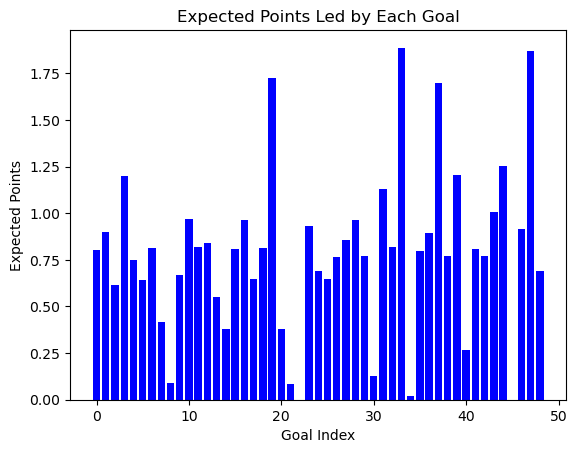

David Dunn


100%|██████████████████████████████████████████████████████████████████████████████████| 34/34 [02:00<00:00,  3.53s/it]


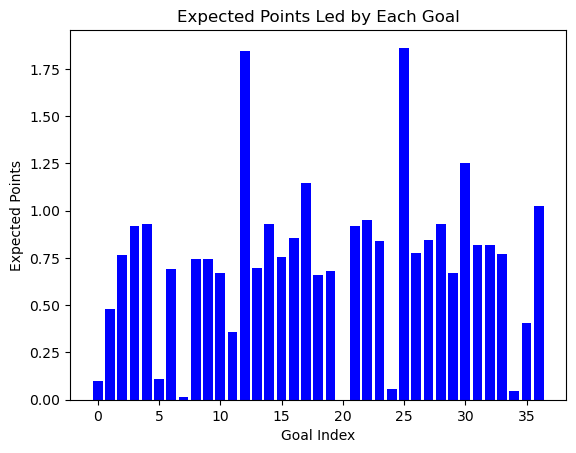

Mikael Forssell


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [01:50<00:00,  3.82s/it]


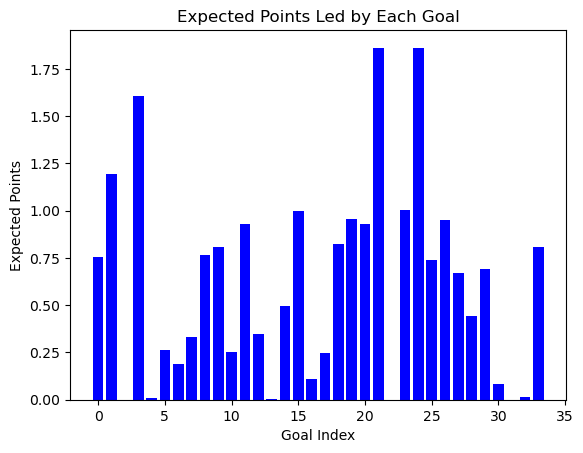

Marian Pahars


100%|██████████████████████████████████████████████████████████████████████████████████| 38/38 [02:17<00:00,  3.62s/it]


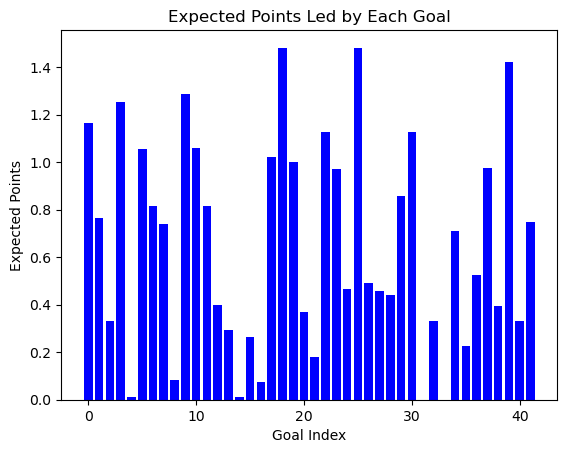

Joe Cole


100%|██████████████████████████████████████████████████████████████████████████████████| 45/45 [02:30<00:00,  3.35s/it]


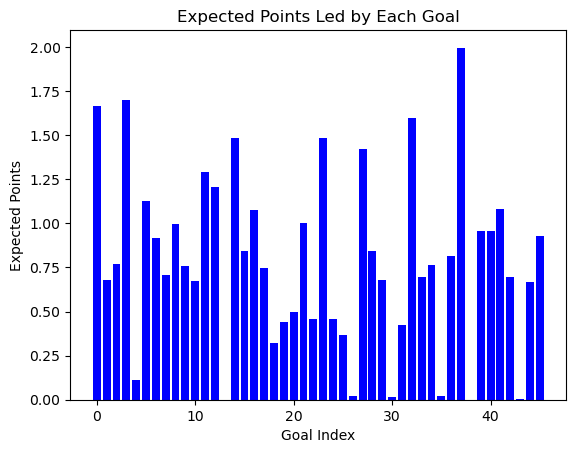

Frederic Kanoute


100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [02:22<00:00,  3.64s/it]


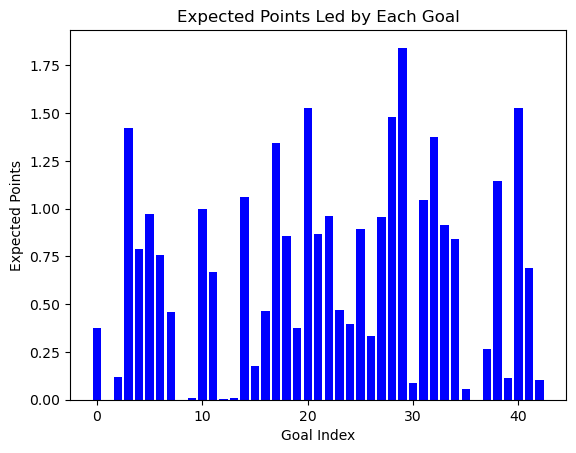

Sylvain Wiltord


100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [01:42<00:00,  3.78s/it]


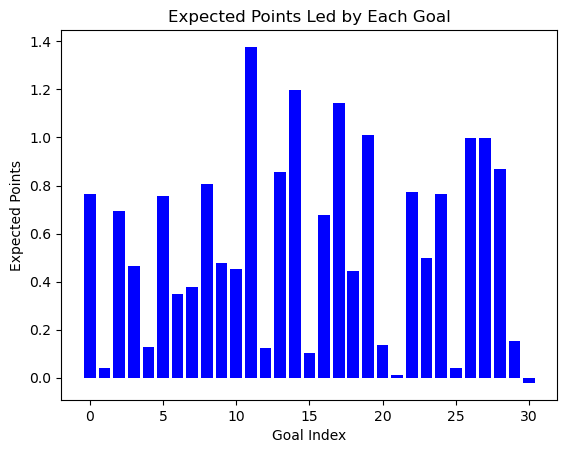

John Terry


100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [02:14<00:00,  3.46s/it]


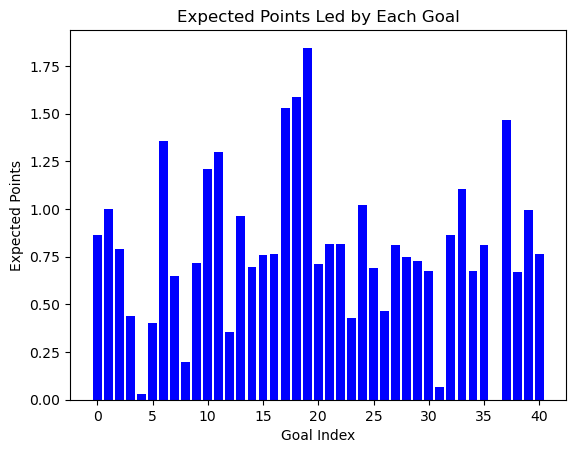

Shola Ameobi


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [02:21<00:00,  3.55s/it]


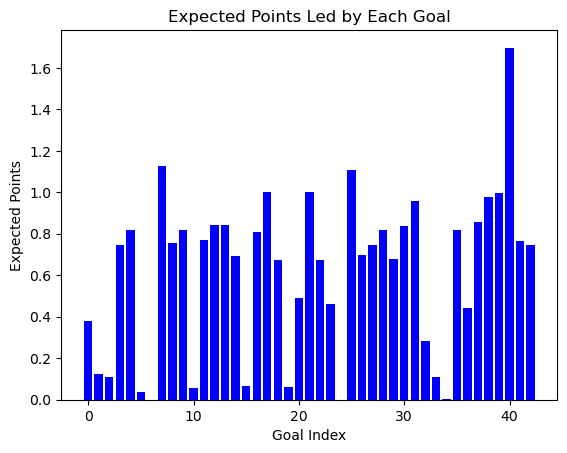

Juan Pablo Ángel


100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [02:26<00:00,  3.75s/it]


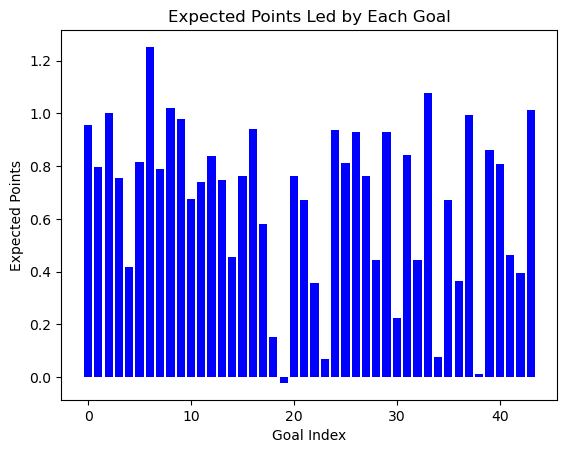

Steed Malbranque


100%|██████████████████████████████████████████████████████████████████████████████████| 34/34 [02:08<00:00,  3.77s/it]


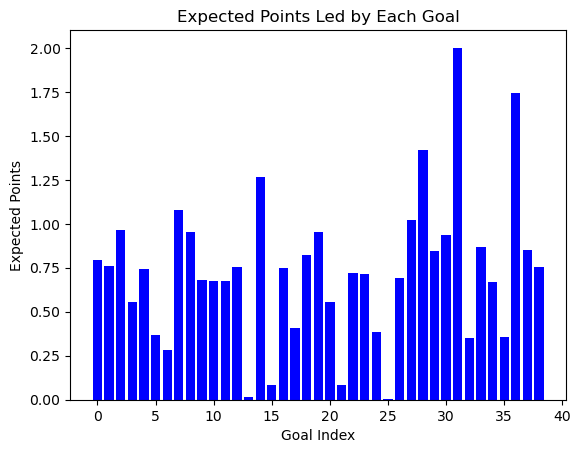

Tomasz Radzinski


100%|██████████████████████████████████████████████████████████████████████████████████| 34/34 [01:56<00:00,  3.44s/it]


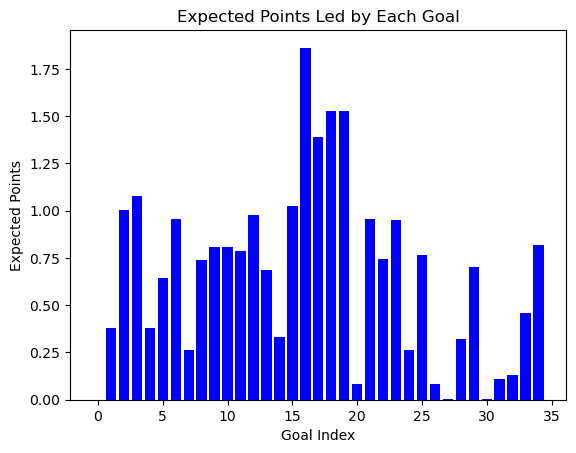

Jason Roberts


100%|██████████████████████████████████████████████████████████████████████████████████| 32/32 [01:58<00:00,  3.70s/it]


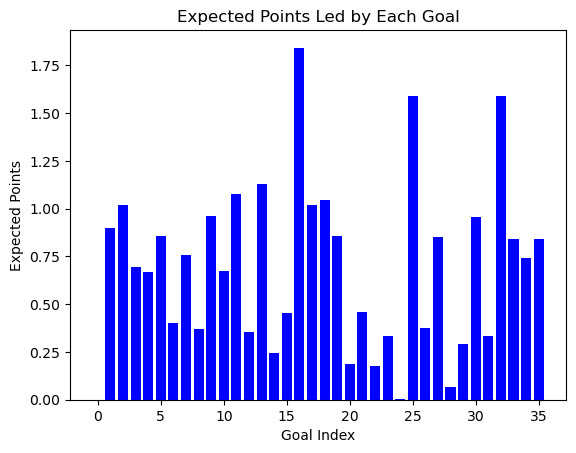

Jermaine Jenas


100%|██████████████████████████████████████████████████████████████████████████████████| 31/31 [01:46<00:00,  3.44s/it]


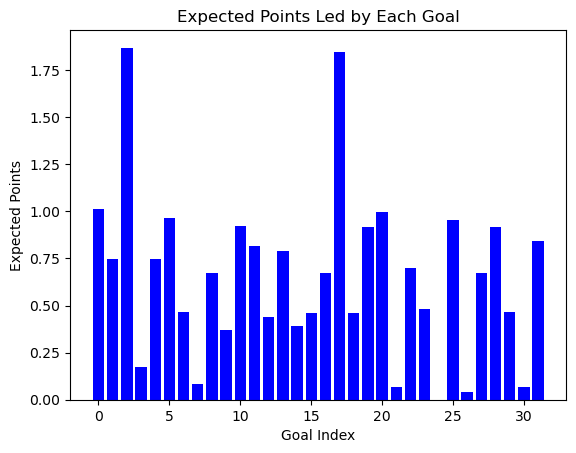

Brian McBride


100%|██████████████████████████████████████████████████████████████████████████████████| 31/31 [01:57<00:00,  3.80s/it]


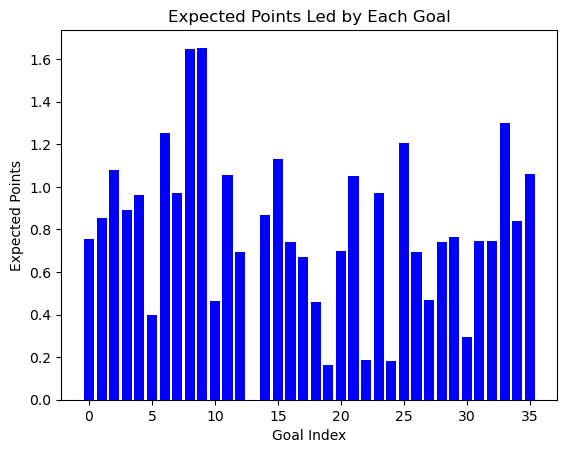

Shaun Wright-Phillips


100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [01:46<00:00,  3.95s/it]


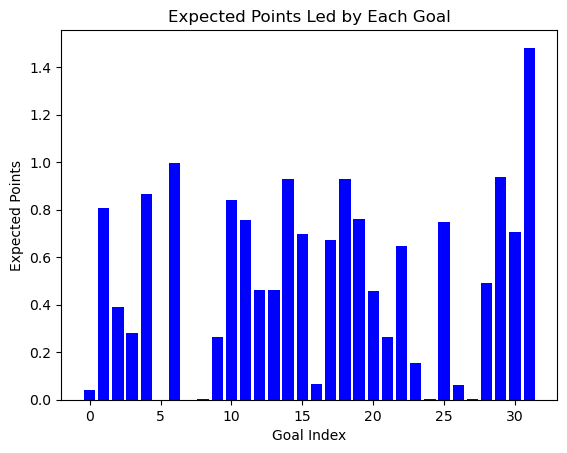

Henri Camara


100%|██████████████████████████████████████████████████████████████████████████████████| 28/28 [01:40<00:00,  3.60s/it]


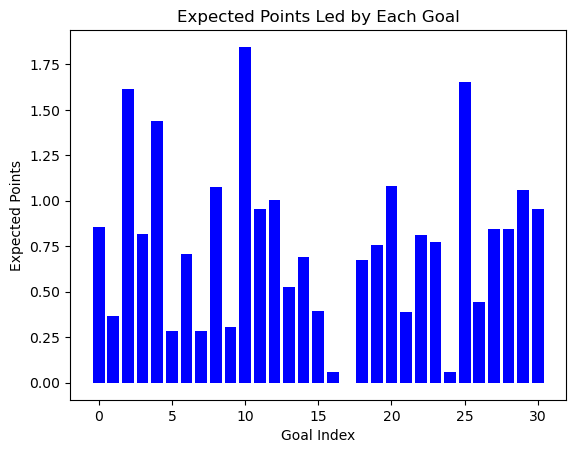

Leon Osman


100%|██████████████████████████████████████████████████████████████████████████████████| 41/41 [02:25<00:00,  3.54s/it]


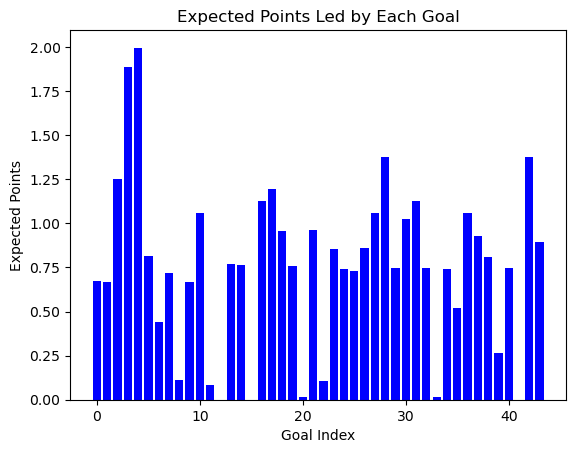

Stewart Downing


100%|██████████████████████████████████████████████████████████████████████████████████| 35/35 [02:00<00:00,  3.45s/it]


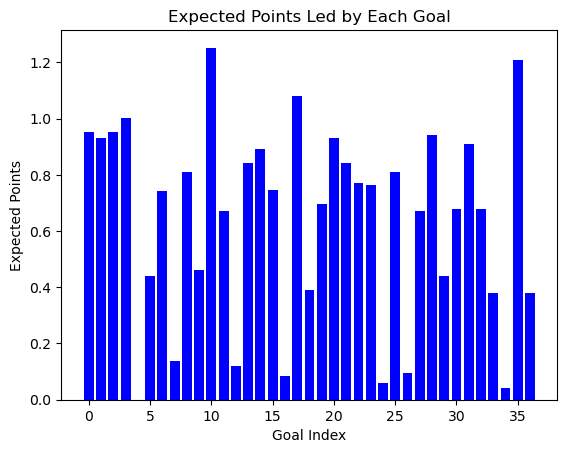

Djibril Cissé


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [01:44<00:00,  3.50s/it]


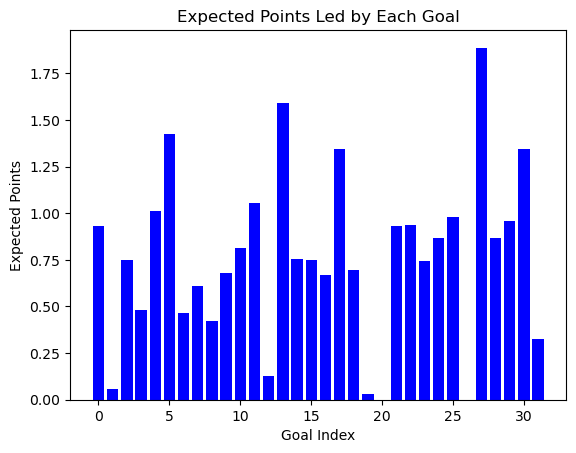

Morten Pedersen


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [01:51<00:00,  3.72s/it]


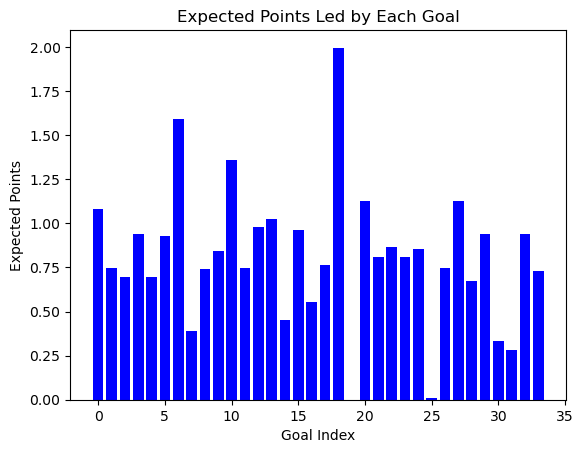

Matthew Taylor


100%|██████████████████████████████████████████████████████████████████████████████████| 36/36 [02:11<00:00,  3.65s/it]


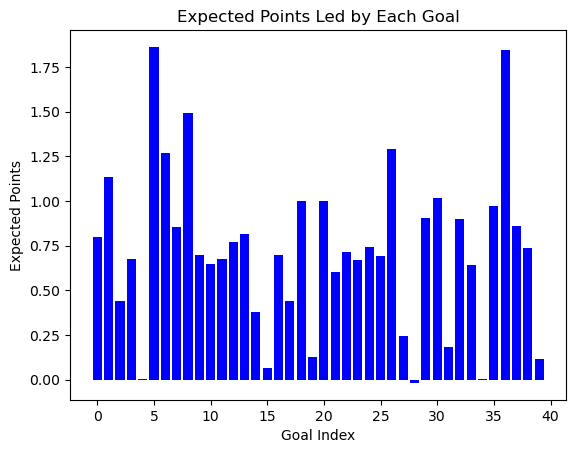

Mikel Arteta


100%|██████████████████████████████████████████████████████████████████████████████████| 38/38 [02:13<00:00,  3.50s/it]


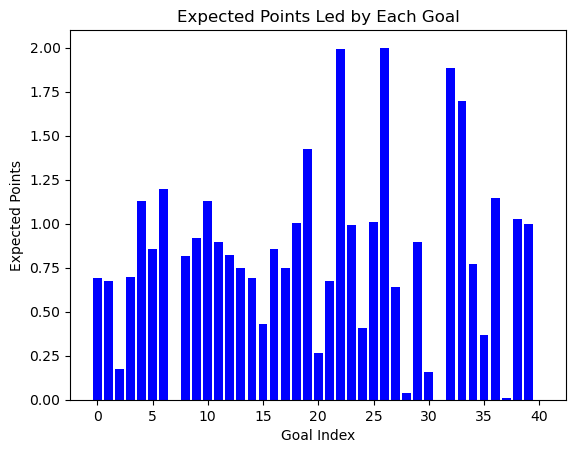

Yossi Benayoun


100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [01:42<00:00,  3.81s/it]


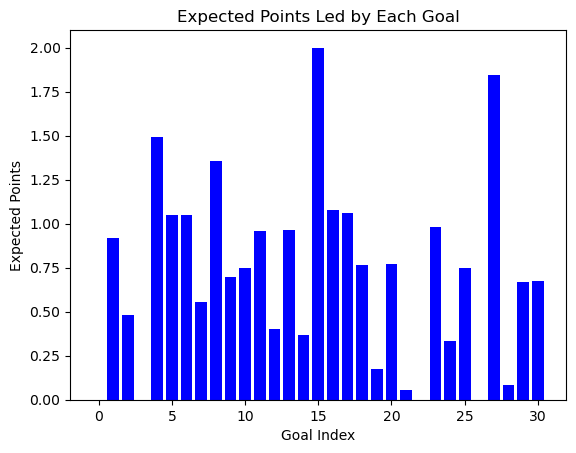

Bobby Zamora


100%|██████████████████████████████████████████████████████████████████████████████████| 45/45 [02:32<00:00,  3.40s/it]


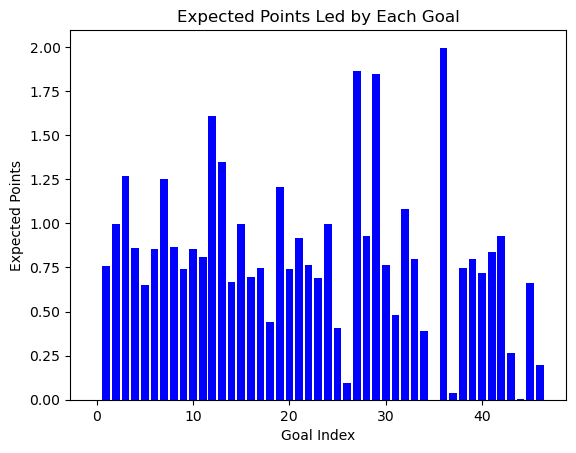

James Morrison


100%|██████████████████████████████████████████████████████████████████████████████████| 31/31 [01:45<00:00,  3.41s/it]


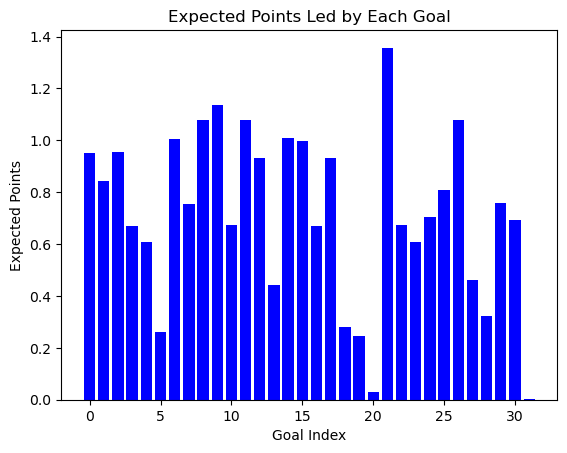

Aaron Lennon


100%|██████████████████████████████████████████████████████████████████████████████████| 35/35 [01:57<00:00,  3.37s/it]


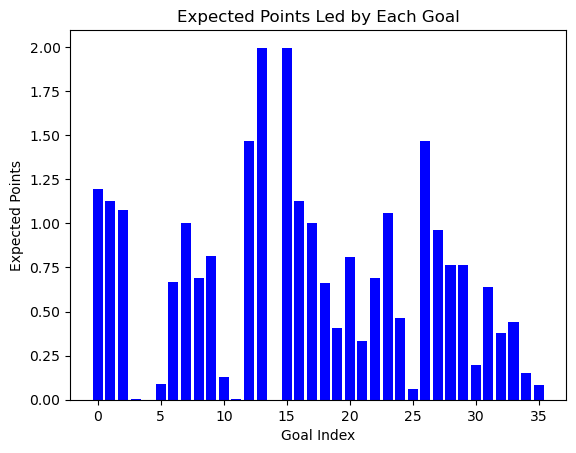

Adam Johnson


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [01:44<00:00,  3.48s/it]


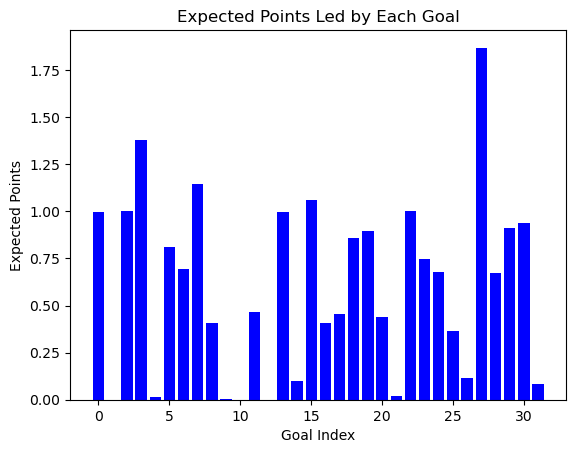

Kevin Doyle


100%|██████████████████████████████████████████████████████████████████████████████████| 33/33 [02:01<00:00,  3.70s/it]


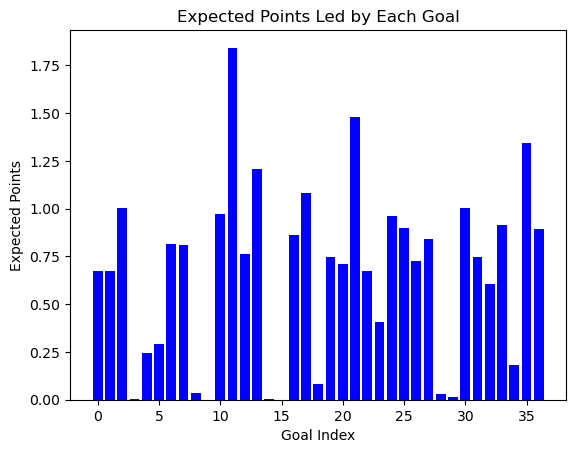

Benni McCarthy


100%|██████████████████████████████████████████████████████████████████████████████████| 33/33 [02:02<00:00,  3.71s/it]


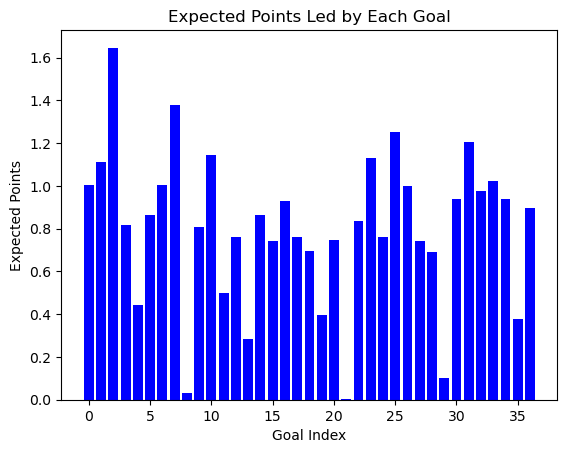

Ashley Young


100%|██████████████████████████████████████████████████████████████████████████████████| 42/42 [02:41<00:00,  3.85s/it]


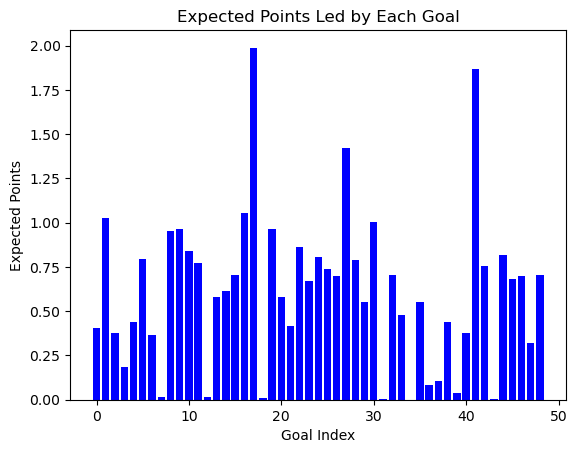

Leighton Baines


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [01:44<00:00,  3.49s/it]


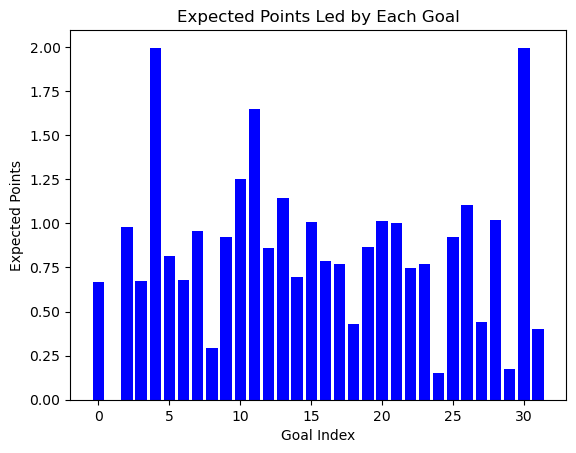

Salomon Kalou


100%|██████████████████████████████████████████████████████████████████████████████████| 32/32 [01:58<00:00,  3.70s/it]


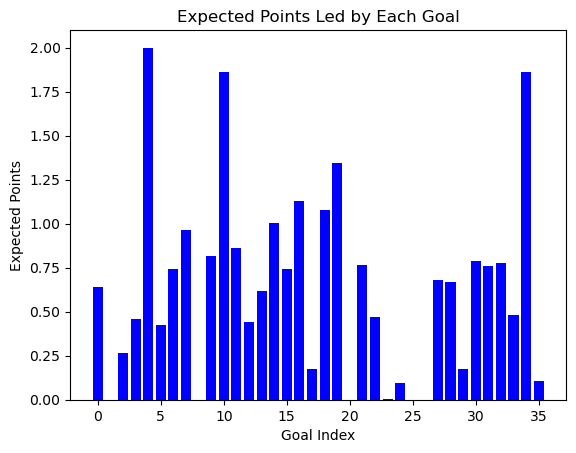

John Carew


100%|██████████████████████████████████████████████████████████████████████████████████| 33/33 [02:06<00:00,  3.83s/it]


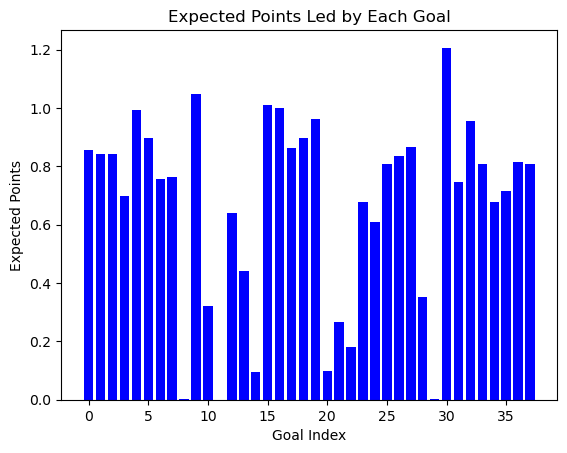

Mark Noble


100%|██████████████████████████████████████████████████████████████████████████████████| 41/41 [02:35<00:00,  3.78s/it]


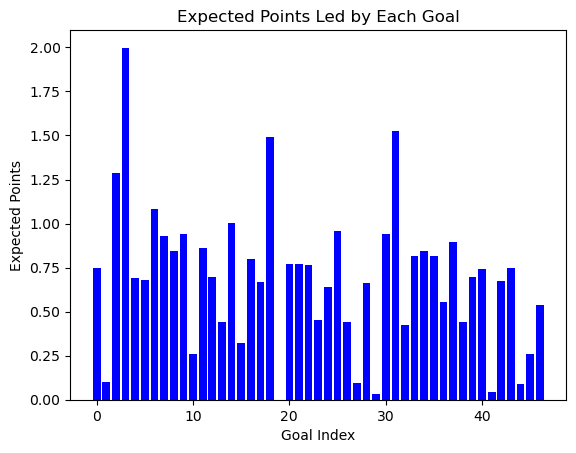

Craig Gardner


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [01:41<00:00,  3.39s/it]


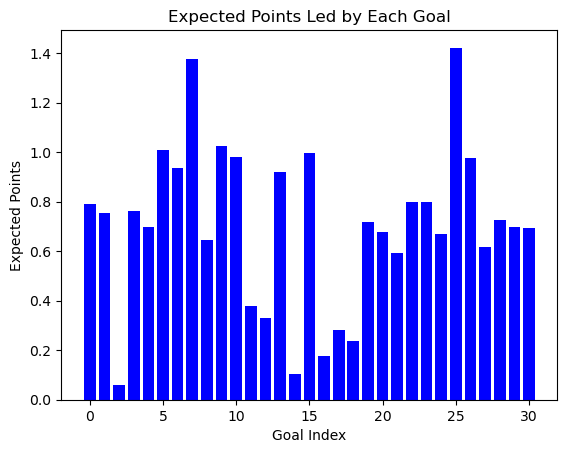

Florent Malouda


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [01:56<00:00,  3.88s/it]


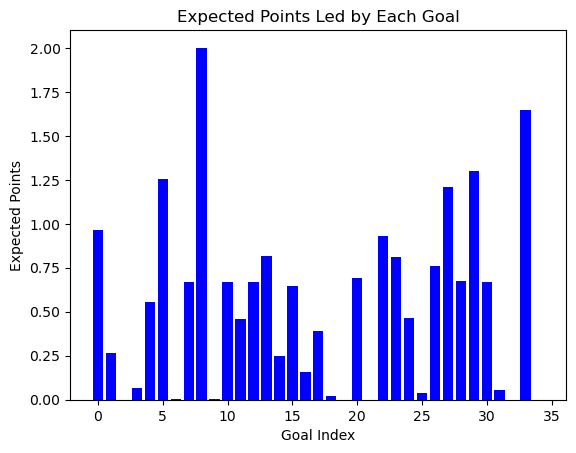

Cameron Jerome


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [01:47<00:00,  3.71s/it]


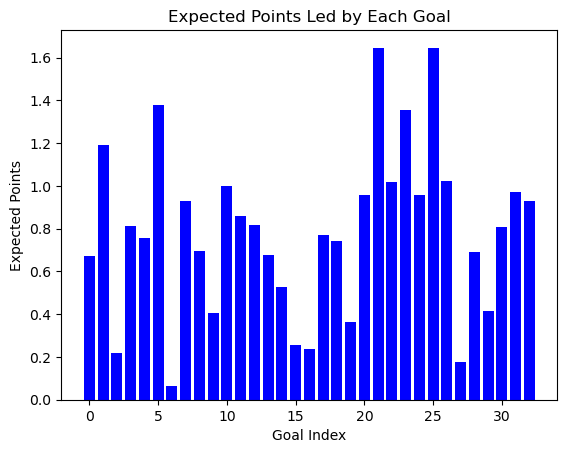

Kenwyne Jones


100%|██████████████████████████████████████████████████████████████████████████████████| 37/37 [02:11<00:00,  3.56s/it]


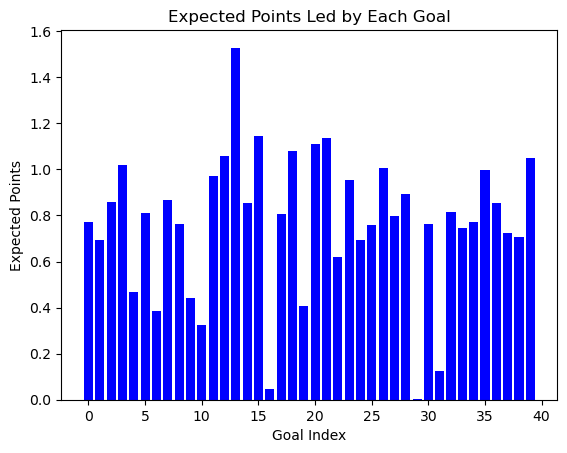

Nicklas Bendtner


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [01:44<00:00,  3.50s/it]


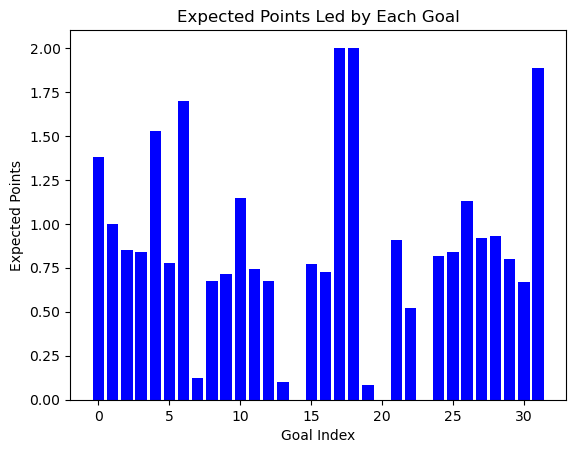

Samir Nasri


100%|██████████████████████████████████████████████████████████████████████████████████| 32/32 [01:58<00:00,  3.71s/it]


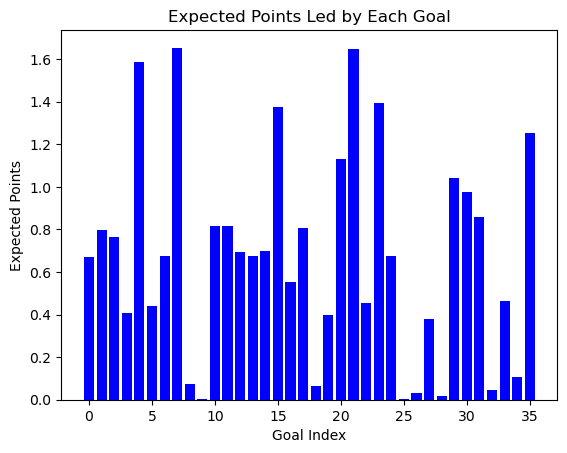

Marouane Fellaini


100%|██████████████████████████████████████████████████████████████████████████████████| 34/34 [02:00<00:00,  3.56s/it]


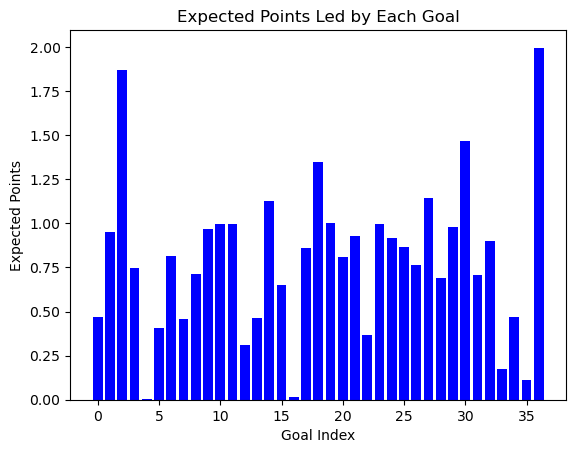

Aaron Ramsey


100%|██████████████████████████████████████████████████████████████████████████████████| 36/36 [02:11<00:00,  3.66s/it]


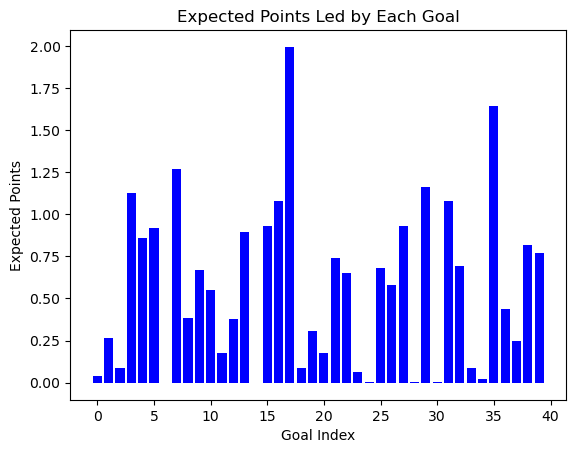

Jordan Henderson


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [01:48<00:00,  3.63s/it]


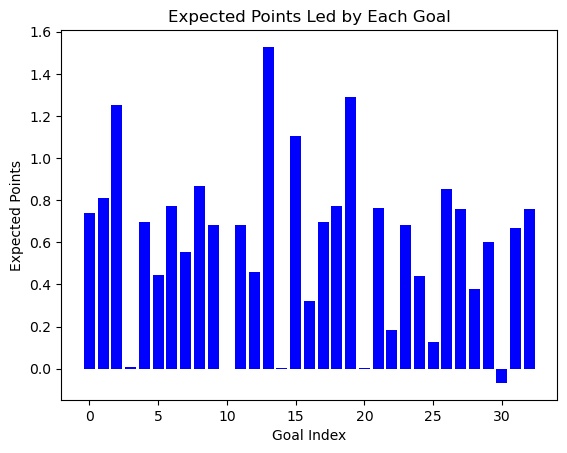

Peter Odemwingie


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [01:58<00:00,  3.95s/it]


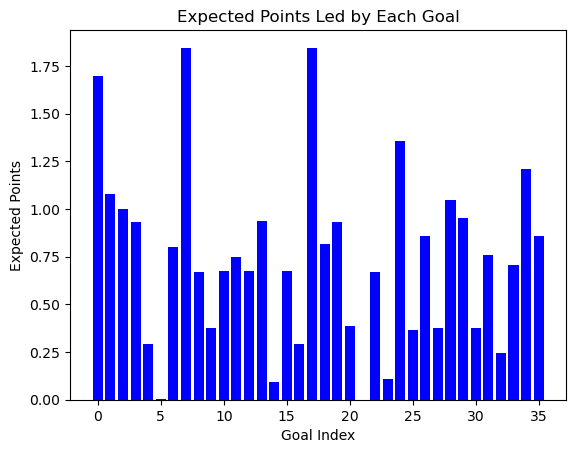

Charlie Adam


100%|██████████████████████████████████████████████████████████████████████████████████| 32/32 [01:46<00:00,  3.33s/it]


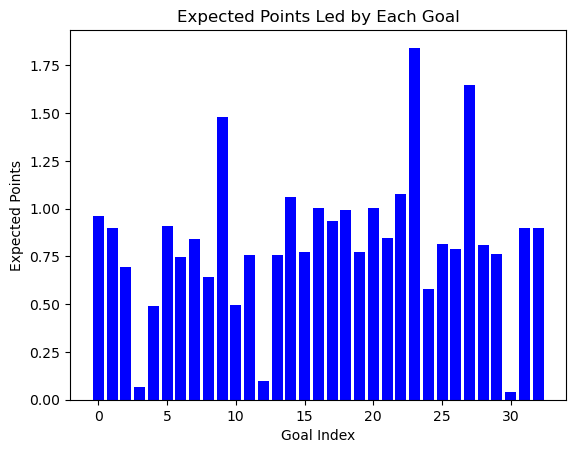

Jonathan Walters


100%|██████████████████████████████████████████████████████████████████████████████████| 37/37 [02:17<00:00,  3.71s/it]


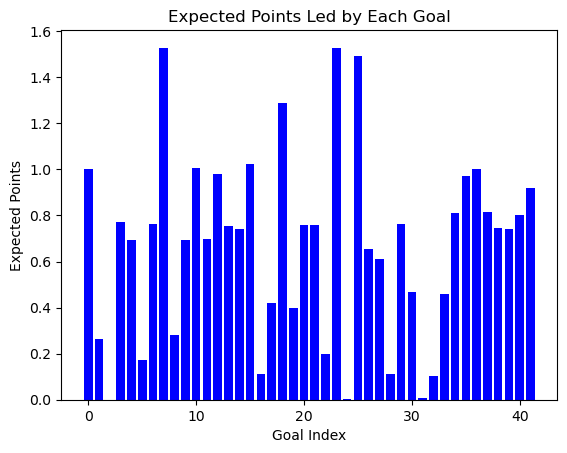

Demba Ba


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [02:20<00:00,  4.69s/it]


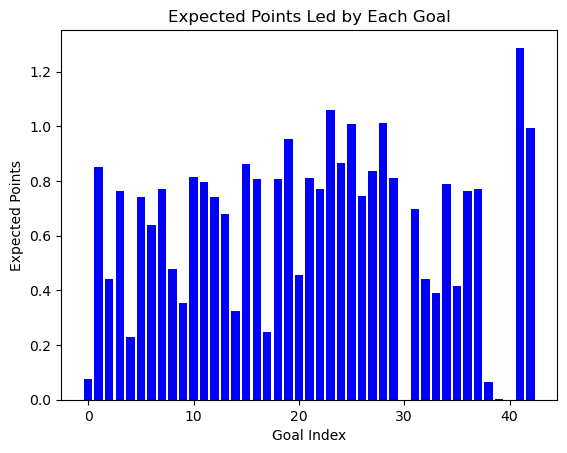

Papiss Cissé


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [02:02<00:00,  4.07s/it]


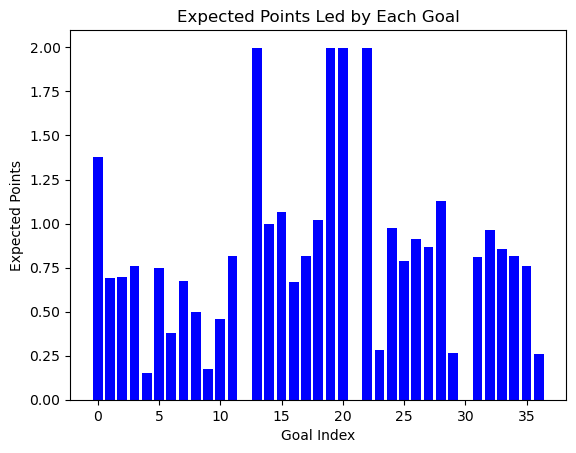

Rickie Lambert


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [01:40<00:00,  3.35s/it]


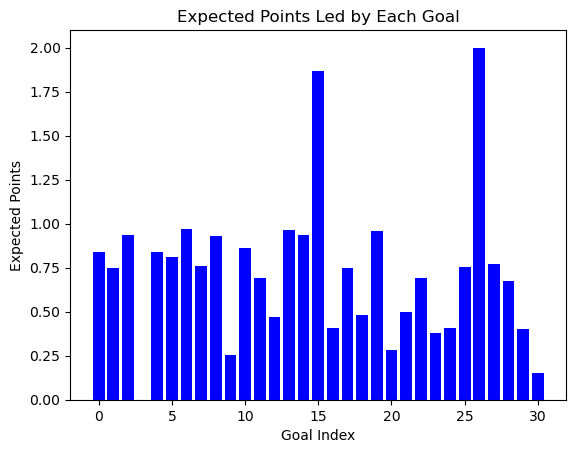

Adam Lallana


100%|██████████████████████████████████████████████████████████████████████████████████| 31/31 [01:48<00:00,  3.49s/it]


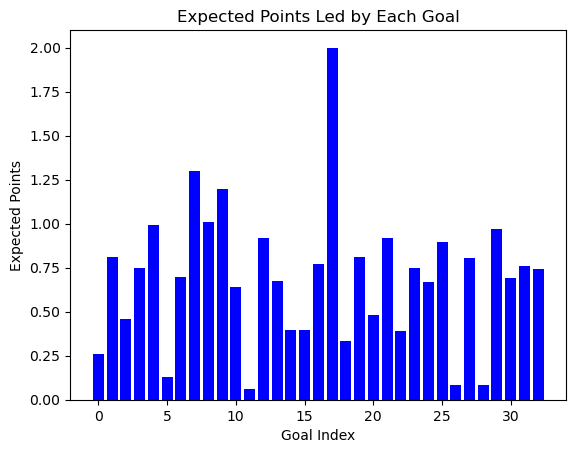

Jay Rodríguez


100%|██████████████████████████████████████████████████████████████████████████████████| 41/41 [02:22<00:00,  3.48s/it]


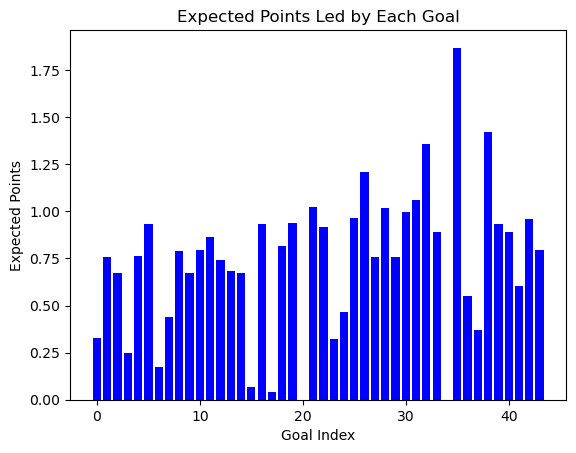

Philippe Coutinho


100%|██████████████████████████████████████████████████████████████████████████████████| 44/44 [02:35<00:00,  3.52s/it]


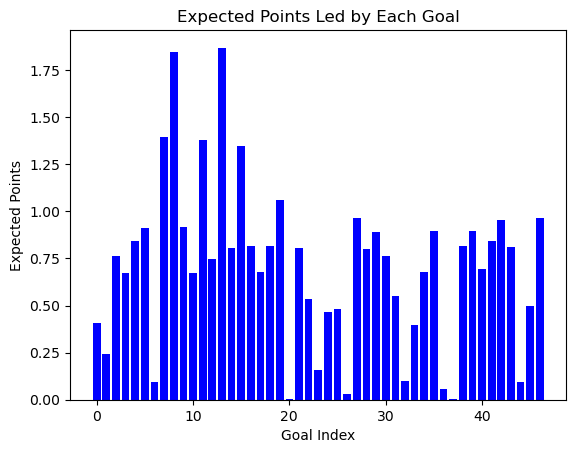

Wilfried Bony


100%|██████████████████████████████████████████████████████████████████████████████████| 28/28 [01:55<00:00,  4.12s/it]


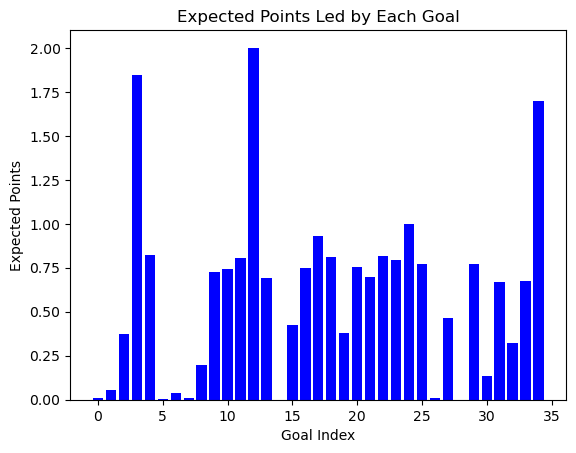

Willian


100%|██████████████████████████████████████████████████████████████████████████████████| 39/39 [02:22<00:00,  3.64s/it]


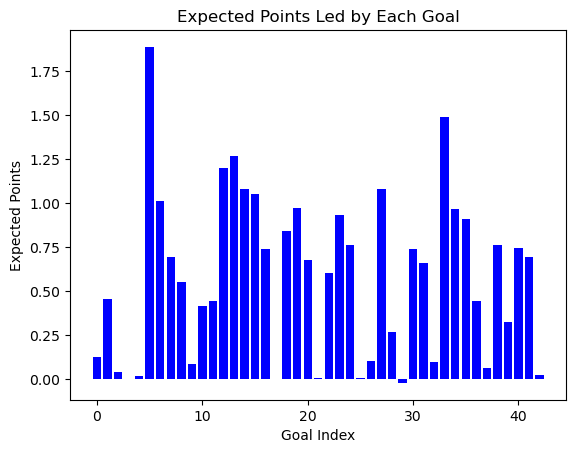

Mesut Özil


100%|██████████████████████████████████████████████████████████████████████████████████| 32/32 [01:47<00:00,  3.36s/it]


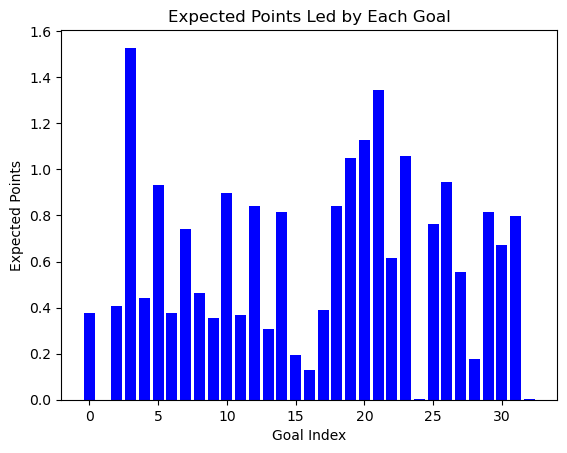

Marko Arnautovic


100%|██████████████████████████████████████████████████████████████████████████████████| 35/35 [02:20<00:00,  4.01s/it]


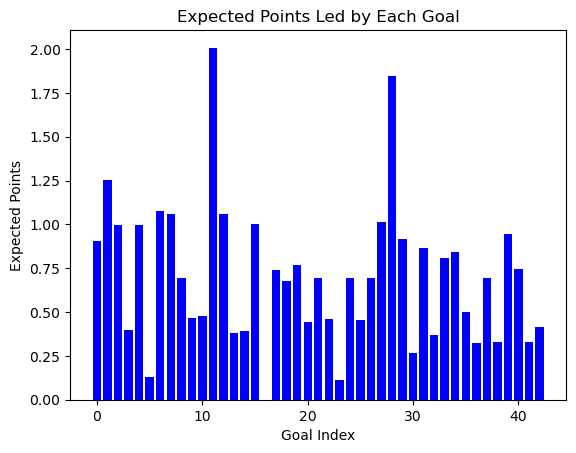

Glenn Murray


100%|██████████████████████████████████████████████████████████████████████████████████| 32/32 [01:59<00:00,  3.75s/it]


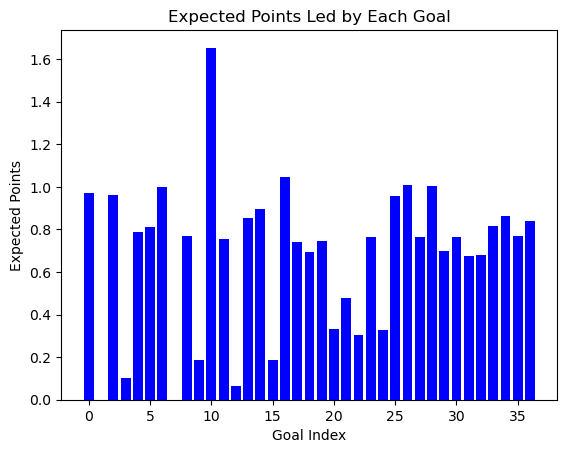

Charlie Austin


100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [01:51<00:00,  3.85s/it]


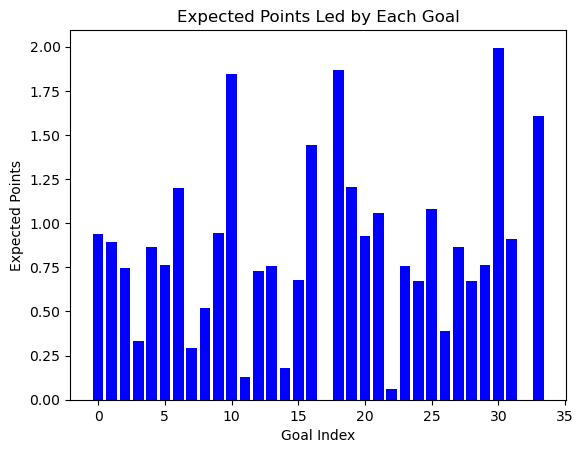

Ayoze Pérez


100%|██████████████████████████████████████████████████████████████████████████████████| 37/37 [02:27<00:00,  3.98s/it]


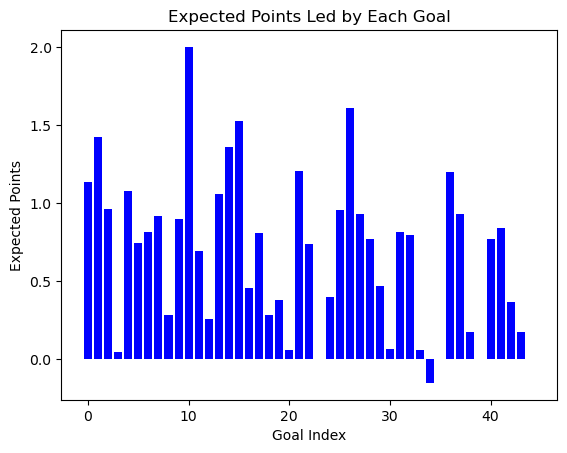

Ashley Barnes


100%|██████████████████████████████████████████████████████████████████████████████████| 40/40 [02:18<00:00,  3.47s/it]


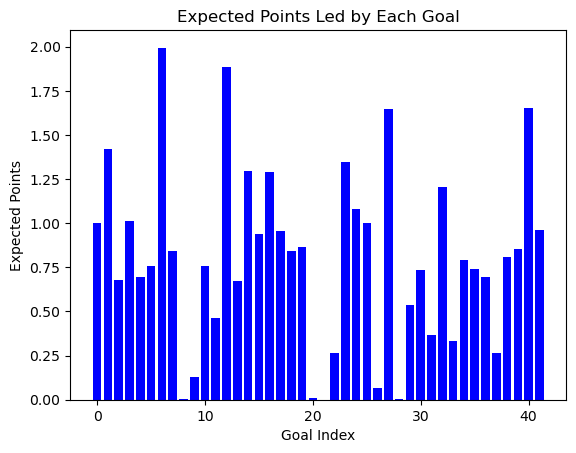

James Ward-Prowse


100%|██████████████████████████████████████████████████████████████████████████████████| 44/44 [02:42<00:00,  3.68s/it]


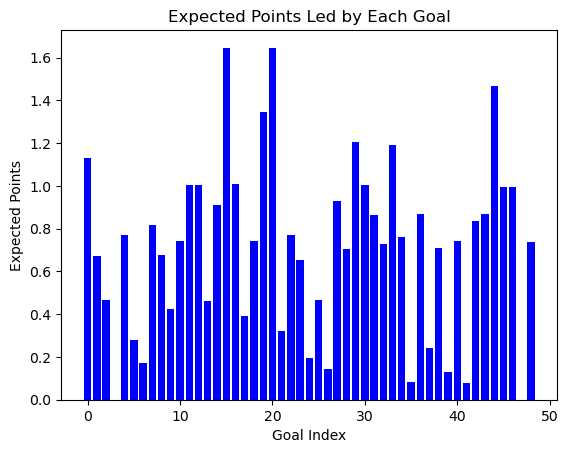

Salomón Rondón


100%|██████████████████████████████████████████████████████████████████████████████████| 33/33 [01:56<00:00,  3.54s/it]


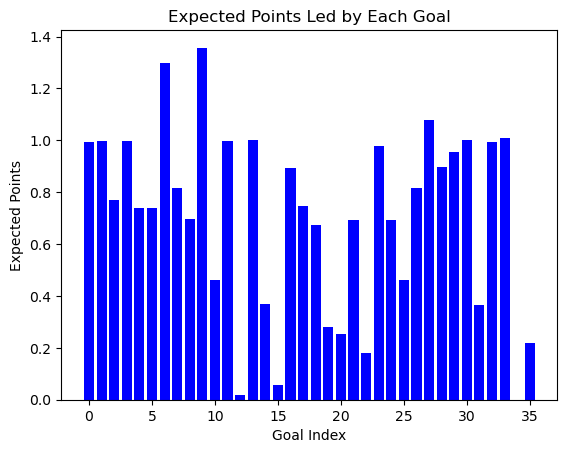

Kelechi Iheanacho


100%|██████████████████████████████████████████████████████████████████████████████████| 37/37 [02:18<00:00,  3.76s/it]


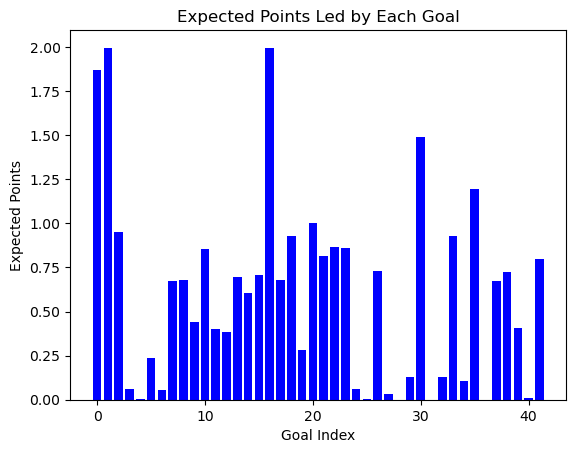

Aleksandar Mitrovic


100%|██████████████████████████████████████████████████████████████████████████████████| 31/31 [02:04<00:00,  4.01s/it]


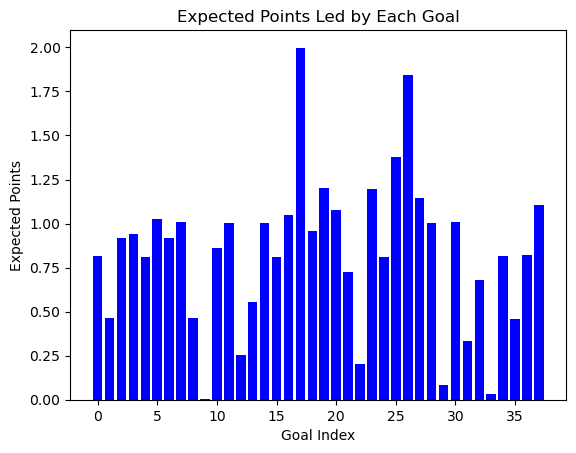

Jordan Ayew


100%|██████████████████████████████████████████████████████████████████████████████████| 32/32 [01:48<00:00,  3.40s/it]


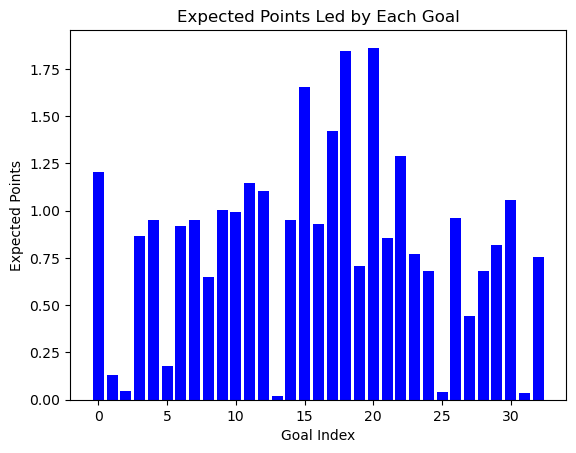

Troy Deeney


100%|██████████████████████████████████████████████████████████████████████████████████| 41/41 [02:35<00:00,  3.80s/it]


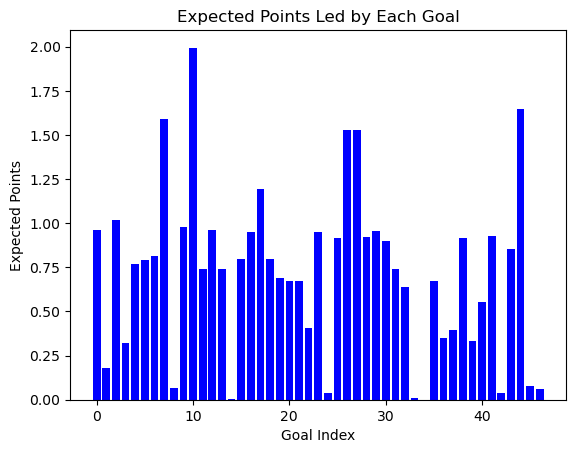

Ilkay Gündogan


100%|██████████████████████████████████████████████████████████████████████████████████| 37/37 [02:24<00:00,  3.91s/it]


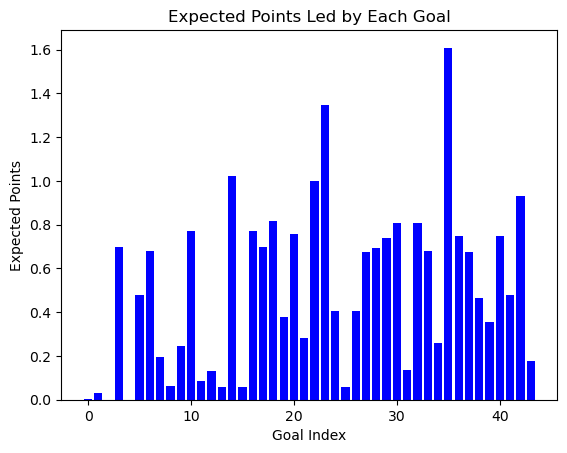

Dominic Calvert-Lewin


100%|██████████████████████████████████████████████████████████████████████████████████| 42/42 [02:34<00:00,  3.68s/it]


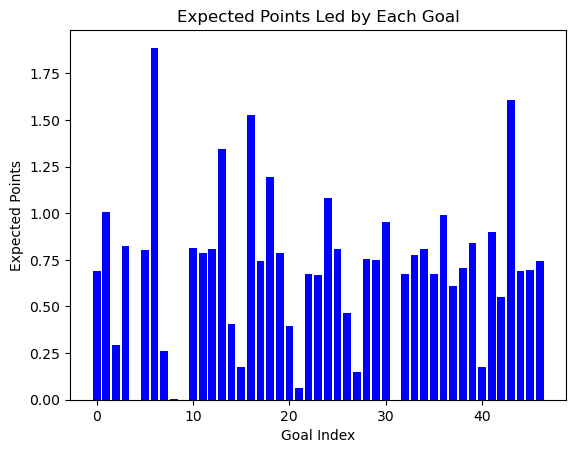

Richarlison


100%|██████████████████████████████████████████████████████████████████████████████████| 45/45 [02:40<00:00,  3.57s/it]


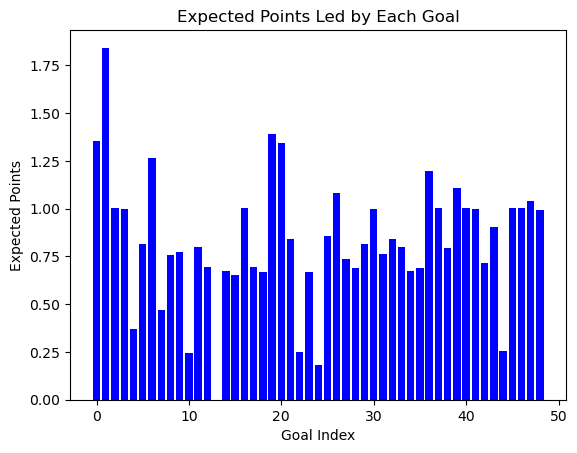

Bernardo Silva


100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [01:48<00:00,  3.63s/it]


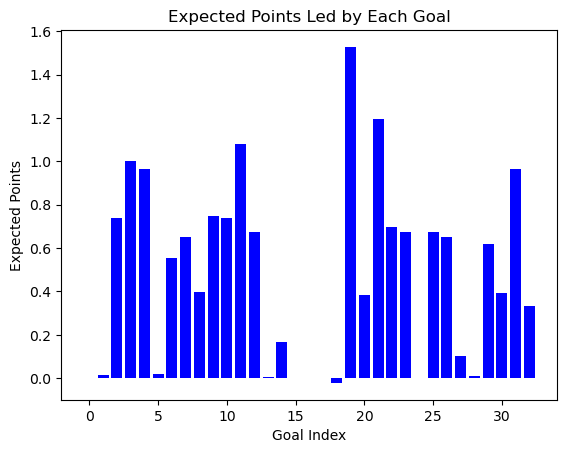

Raúl Jiménez


100%|██████████████████████████████████████████████████████████████████████████████████| 38/38 [02:10<00:00,  3.43s/it]


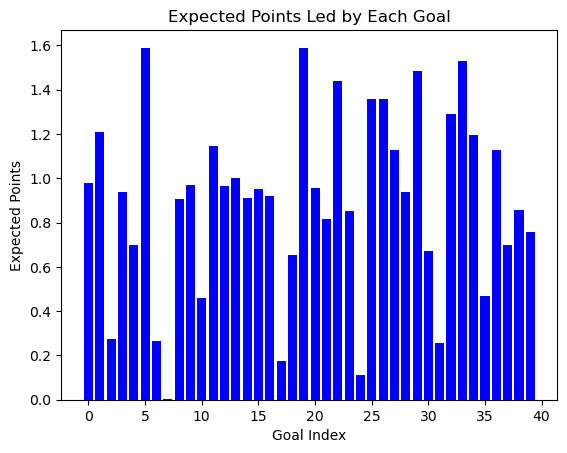

James Maddison


100%|██████████████████████████████████████████████████████████████████████████████████| 41/41 [02:23<00:00,  3.49s/it]


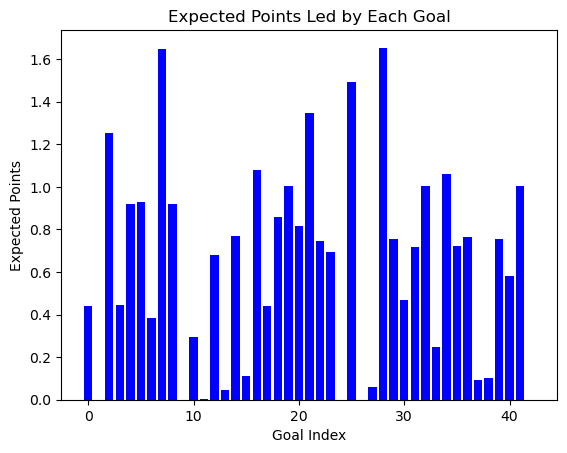

Diogo Jota


100%|██████████████████████████████████████████████████████████████████████████████████| 37/37 [02:34<00:00,  4.18s/it]


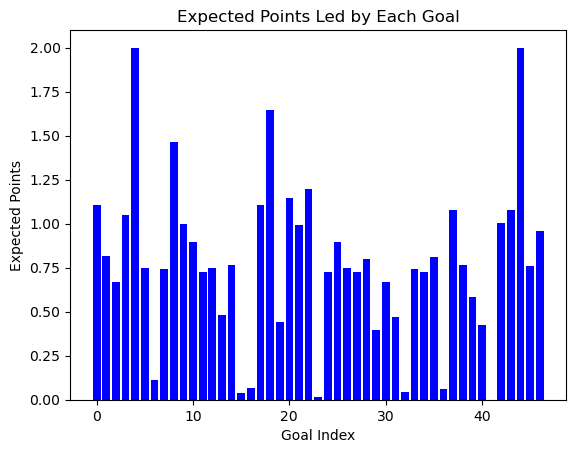

Phil Foden


100%|██████████████████████████████████████████████████████████████████████████████████| 31/31 [01:54<00:00,  3.70s/it]


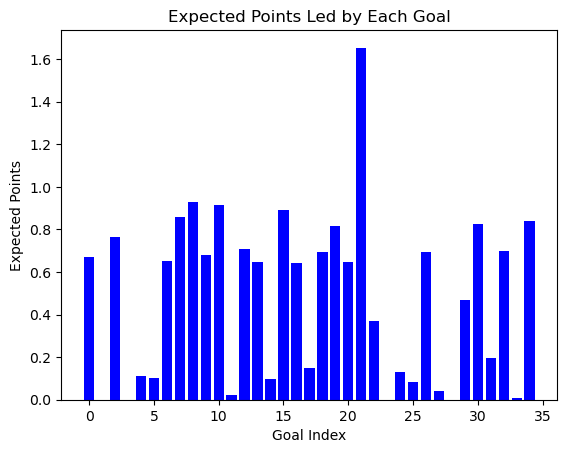

Harvey Barnes


100%|██████████████████████████████████████████████████████████████████████████████████| 32/32 [01:55<00:00,  3.61s/it]


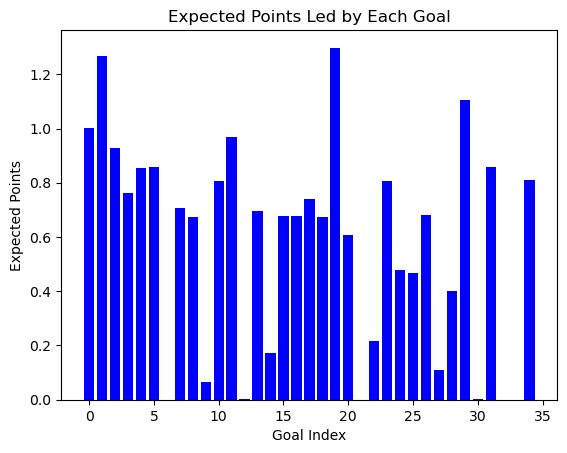

Bruno Fernandes


100%|██████████████████████████████████████████████████████████████████████████████████| 38/38 [02:23<00:00,  3.77s/it]


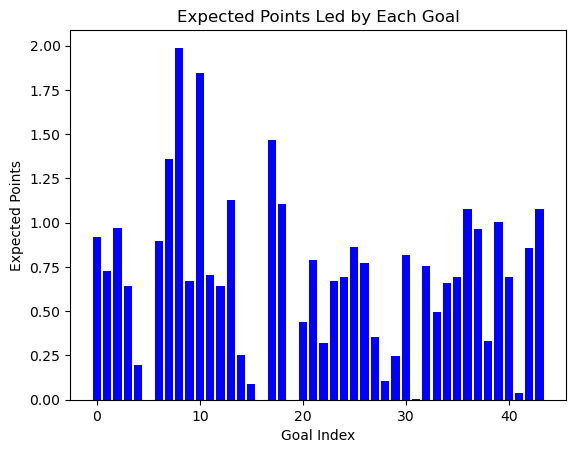

Bukayo Saka


100%|██████████████████████████████████████████████████████████████████████████████████| 28/28 [01:42<00:00,  3.64s/it]


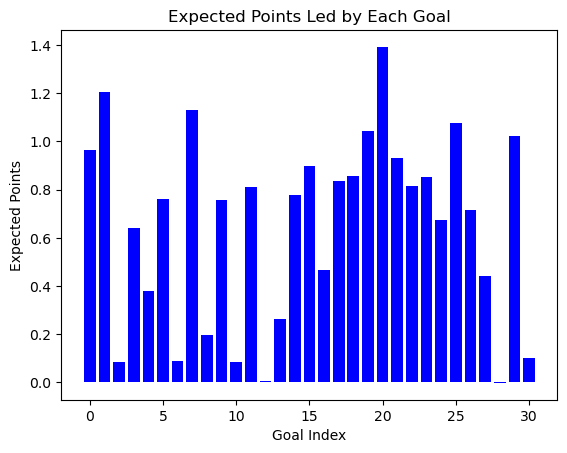

Ollie Watkins


100%|██████████████████████████████████████████████████████████████████████████████████| 36/36 [02:12<00:00,  3.67s/it]


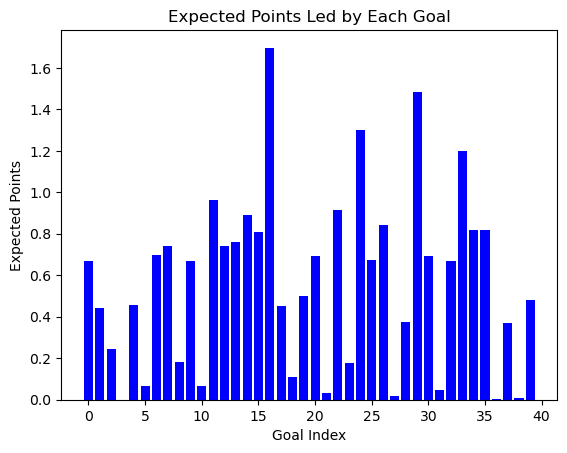

Ivan Toney


100%|██████████████████████████████████████████████████████████████████████████████████| 25/25 [01:47<00:00,  4.29s/it]


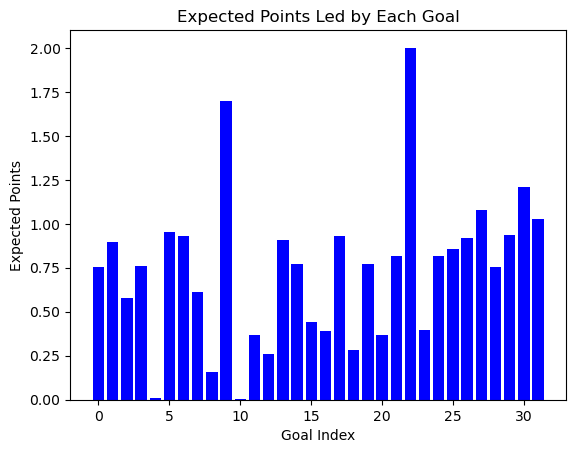

Erling Haaland


100%|██████████████████████████████████████████████████████████████████████████████████| 23/23 [01:58<00:00,  5.16s/it]


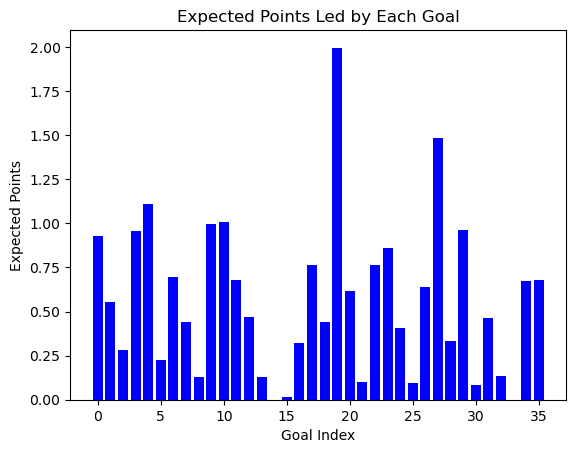

In [38]:
import csv
scr_over_30_points_dict={}
for k,v in scr_over_30_dict.items():
    print(k)
    lst = cal_exp_win_goal_without_print(k)
    scr_over_30_points_dict[k] = lst[k]

    with open('scr_over_30.csv','w',encoding='utf-8') as f:
        w = csv.writer(f)
        for k1,v1 in scr_over_30_points_dict.items():
            w.writerow([k1,v1])

In [39]:
scr_over_30_dict.keys()

dict_keys(['Ruel Fox', 'Graham Stuart', 'David Hirst', 'Rod Wallace', 'Paul Merson', 'Gary McAllister', 'Dennis Wise', 'Peter Ndlovu', 'Dean Saunders', 'Jamie Redknapp', 'Robbie Earle', 'Andrei Kanchelskis', 'Ian Marshall', 'Iain Dowie', 'Steve McManaman', 'Tim Sherwood', 'Don Hutchison', 'Ian Rush', 'Roy Keane', 'Jason Wilcox', 'Paul Ince', 'John Spencer', 'Darren Anderton', 'Paul Dickov', 'Robert Lee', 'Julian Joachim', 'Noel Whelan', 'Marcus Gayle', 'David Unsworth', 'Ashley Ward', 'Dean Sturridge', 'Patrik Berger', 'Muzzy Izzet', 'Benito Carbone', 'Patrick Vieira', 'Darren Huckerby', 'Steffen Iversen', 'Tore Andre Flo', 'Marcus Bent', 'Hamilton Ricard', 'Freddie Ljungberg', 'Nolberto Solano', 'David Dunn', 'Mikael Forssell', 'Marian Pahars', 'Joe Cole', 'Frederic Kanoute', 'Sylvain Wiltord', 'John Terry', 'Shola Ameobi', 'Juan Pablo Ángel', 'Steed Malbranque', 'Tomasz Radzinski', 'Jason Roberts', 'Jermaine Jenas', 'Brian McBride', 'Shaun Wright-Phillips', 'Henri Camara', 'Leon Osma

In [43]:
scr_over_20_dict = {}
for k,v in all_player_scr_dict.items():
    if int(v) >= 20  and (int(v) < 30):
        scr_over_20_dict[k] = v

In [44]:
scr_over_20_dict

{'Mark Robins': 25,
 'Dalian Atkinson': 21,
 'Lee Chapman': 23,
 'David White': 26,
 'Mike Newell': 22,
 'Chris Kiwomya': 21,
 'Stuart Pearce': 20,
 'Jason Dozzell': 20,
 'Ray Parlour': 20,
 'Nigel Clough': 20,
 'Chris Bart-Williams': 22,
 'John Fashanu': 20,
 'Bradley Allen': 20,
 'Paul Rideout': 29,
 'Mick Quinn': 25,
 'Sol Campbell': 20,
 'Garry Flitcroft': 24,
 'Lee Sharpe': 22,
 'John Barnes': 28,
 'Steve Stone': 25,
 'Gordon Watson': 23,
 'Neil Shipperley': 27,
 'Guy Whittingham': 27,
 'Mark Stein': 21,
 'Julian Dicks': 24,
 'Jan Åge Fjørtoft': 25,
 'Nathan Blake': 23,
 'Steve Watson': 26,
 'Uwe Rösler': 29,
 'Bryan Roy': 24,
 'Dan Petrescu': 23,
 'Jürgen Klinsmann': 29,
 'Ian Taylor': 29,
 'Paul Kitson': 28,
 'Oyvind Leonhardsen': 29,
 'Nicky Butt': 29,
 'Anthony Yeboah': 24,
 'David Ginola': 21,
 'Savo Milosevic': 29,
 'Juninho Paulista': 29,
 'Ian Harte': 28,
 'Fabrizio Ravanelli': 25,
 'Andy Booth': 25,
 'Gianluca Vialli': 21,
 'Egil Ostenstad': 29,
 'Michael Bridges': 22,
 '

Mark Robins


100%|██████████████████████████████████████████████████████████████████████████████████| 21/21 [01:13<00:00,  3.49s/it]


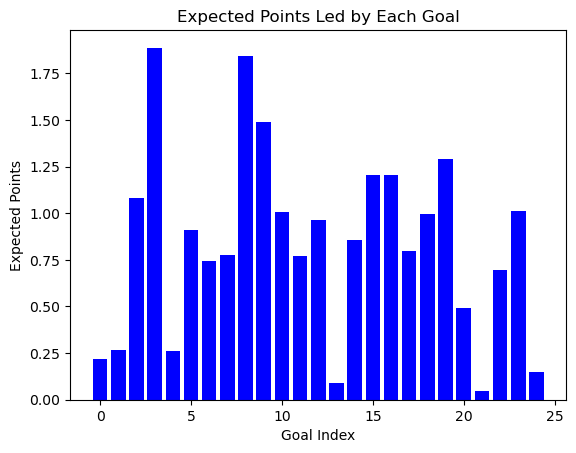

Dalian Atkinson


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [01:01<00:00,  3.22s/it]


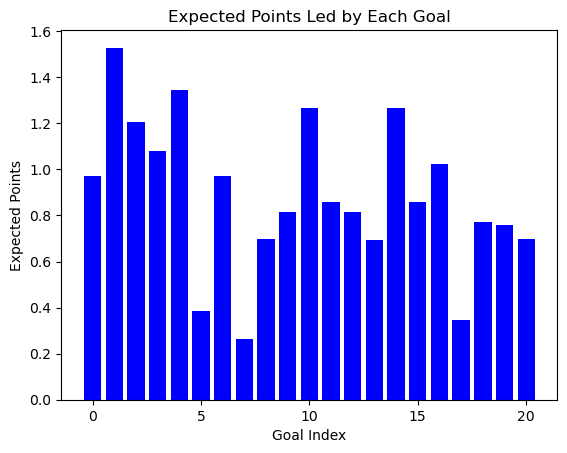

Lee Chapman


100%|██████████████████████████████████████████████████████████████████████████████████| 21/21 [01:06<00:00,  3.17s/it]


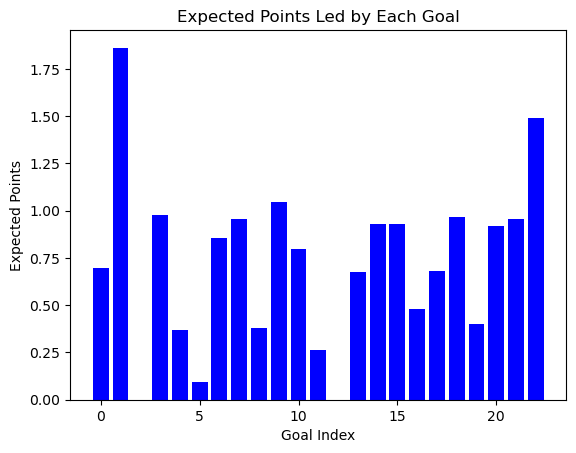

David White


100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [01:15<00:00,  3.45s/it]


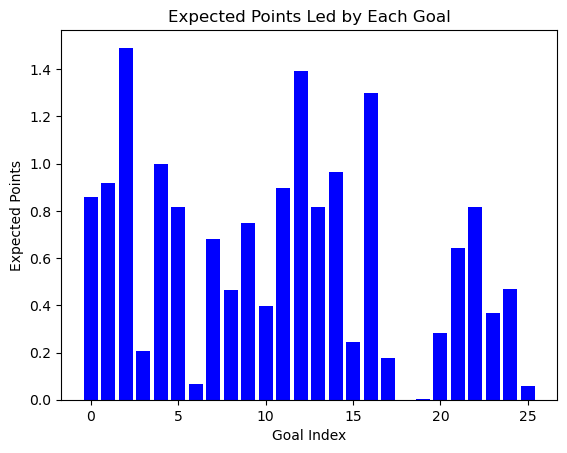

Mike Newell


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [01:03<00:00,  3.55s/it]


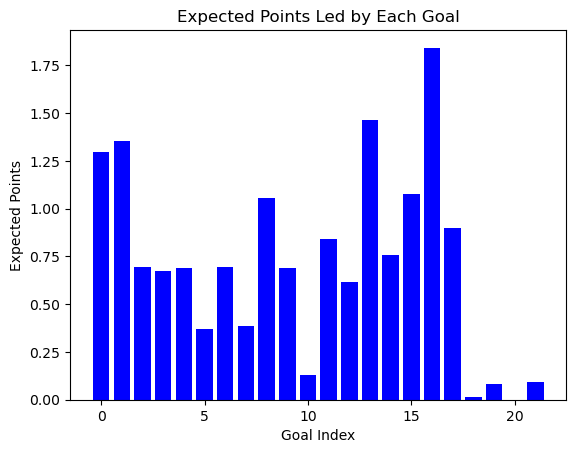

Chris Kiwomya


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [01:00<00:00,  3.19s/it]


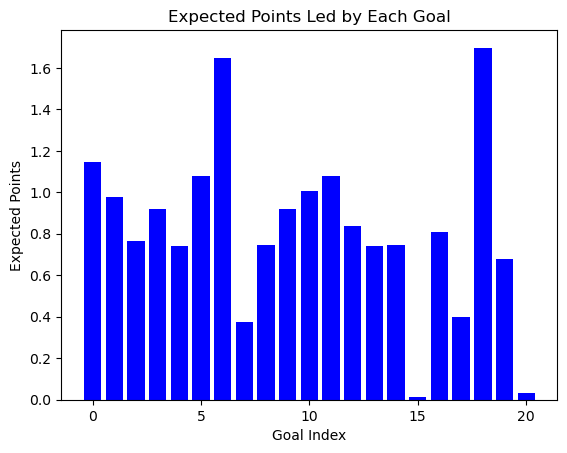

Stuart Pearce


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:58<00:00,  2.93s/it]


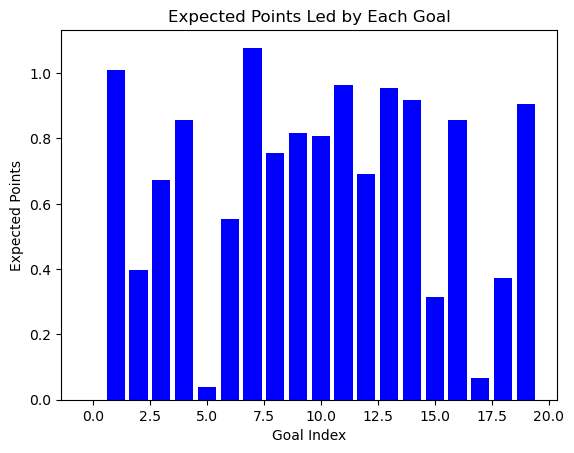

Jason Dozzell


100%|██████████████████████████████████████████████████████████████████████████████████| 17/17 [00:59<00:00,  3.48s/it]


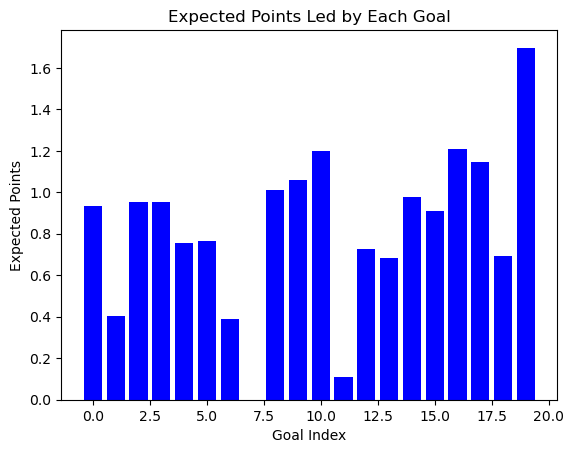

Ray Parlour


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:57<00:00,  3.61s/it]


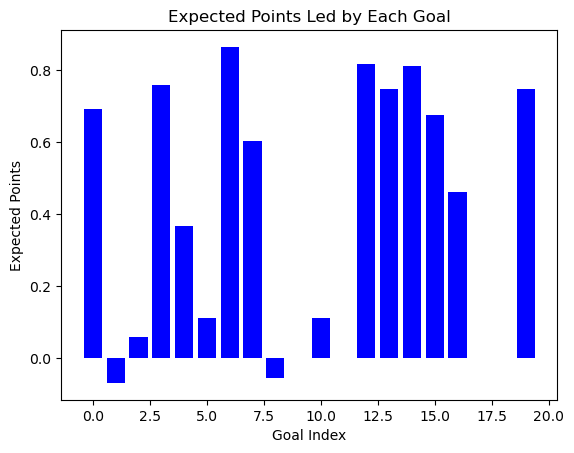

Nigel Clough


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:57<00:00,  3.22s/it]


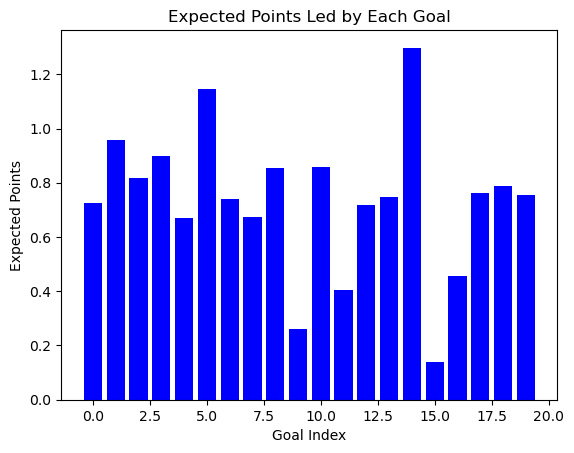

Chris Bart-Williams


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:05<00:00,  3.26s/it]


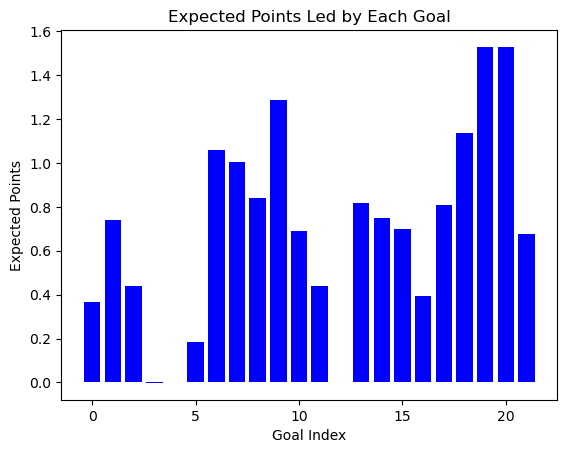

John Fashanu


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:58<00:00,  2.93s/it]


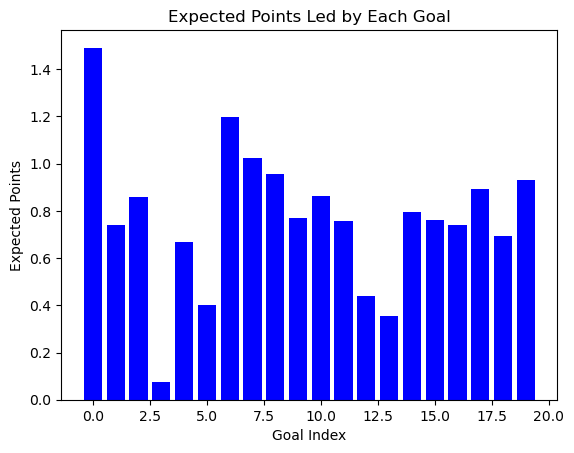

Bradley Allen


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:57<00:00,  3.61s/it]


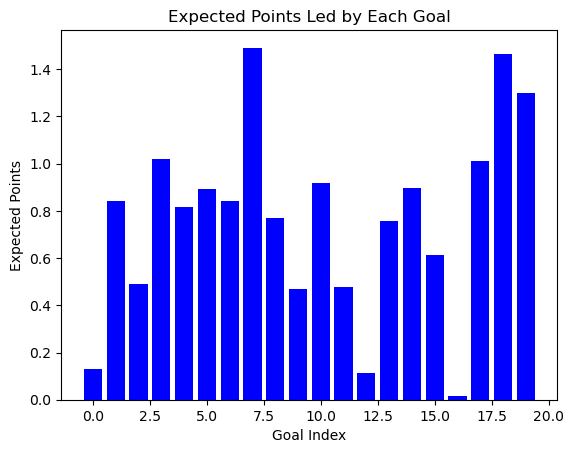

Paul Rideout


100%|██████████████████████████████████████████████████████████████████████████████████| 26/26 [01:23<00:00,  3.21s/it]


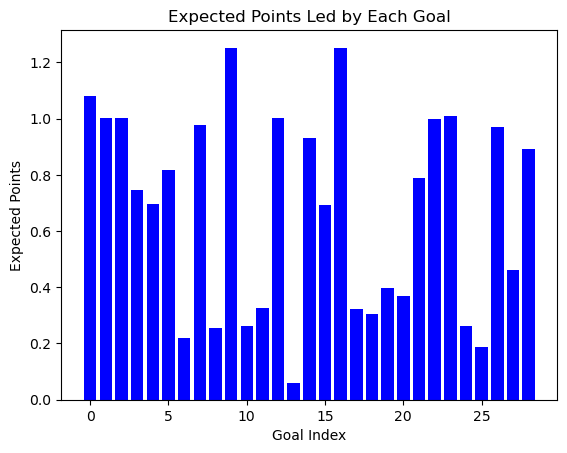

Mick Quinn


100%|██████████████████████████████████████████████████████████████████████████████████| 17/17 [01:13<00:00,  4.34s/it]


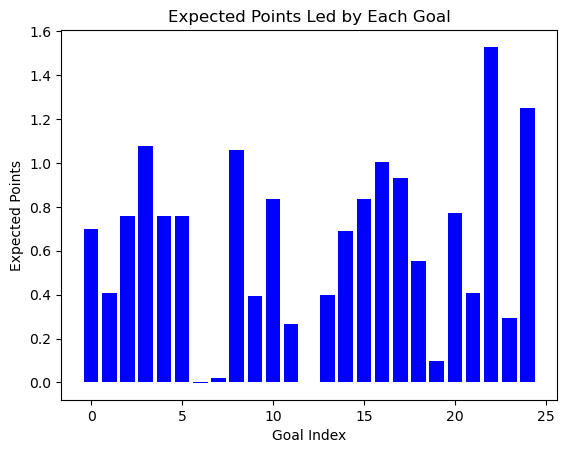

Sol Campbell


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:59<00:00,  3.31s/it]


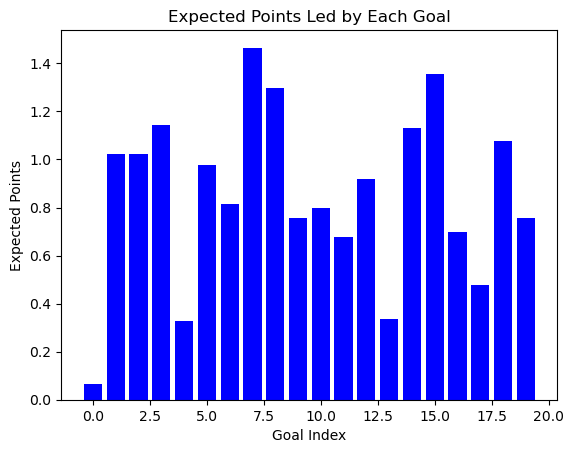

Garry Flitcroft


100%|██████████████████████████████████████████████████████████████████████████████████| 23/23 [01:09<00:00,  3.03s/it]


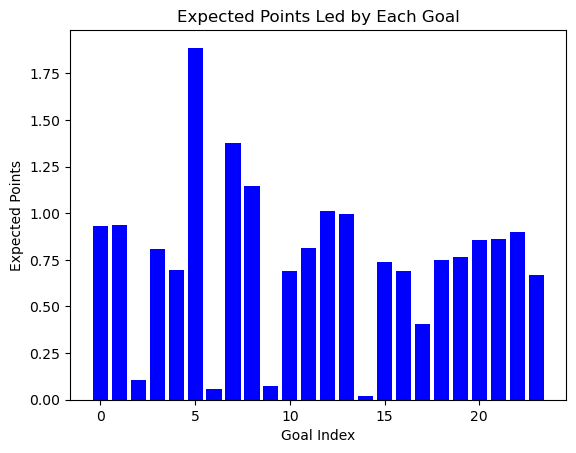

Lee Sharpe


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [01:04<00:00,  3.40s/it]


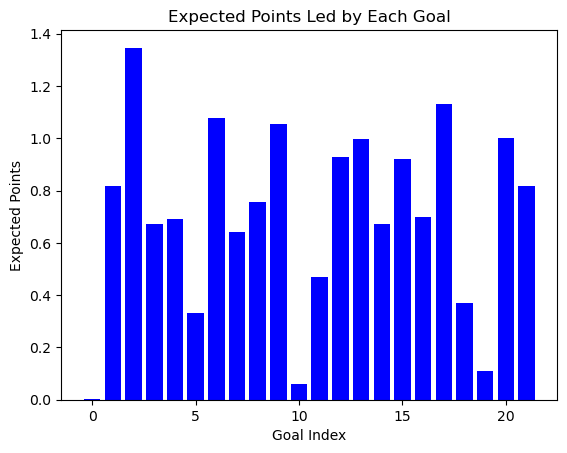

John Barnes


100%|██████████████████████████████████████████████████████████████████████████████████| 25/25 [01:19<00:00,  3.20s/it]


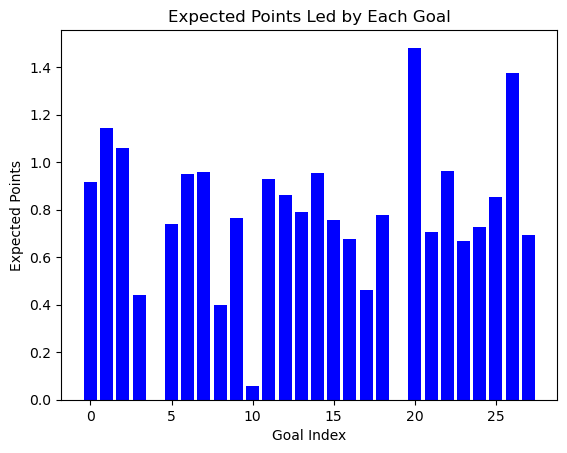

Steve Stone


100%|██████████████████████████████████████████████████████████████████████████████████| 25/25 [01:12<00:00,  2.88s/it]


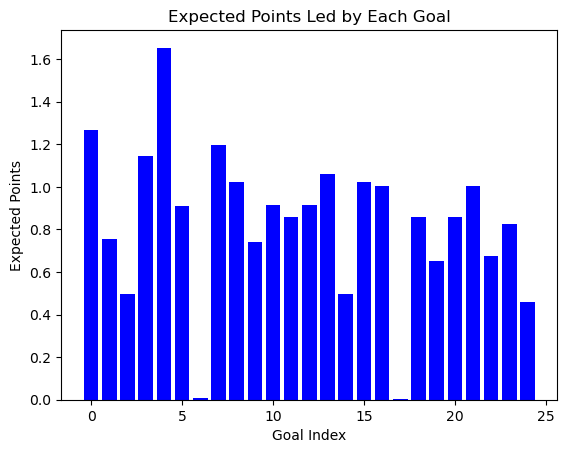

Gordon Watson


100%|██████████████████████████████████████████████████████████████████████████████████| 21/21 [01:07<00:00,  3.20s/it]


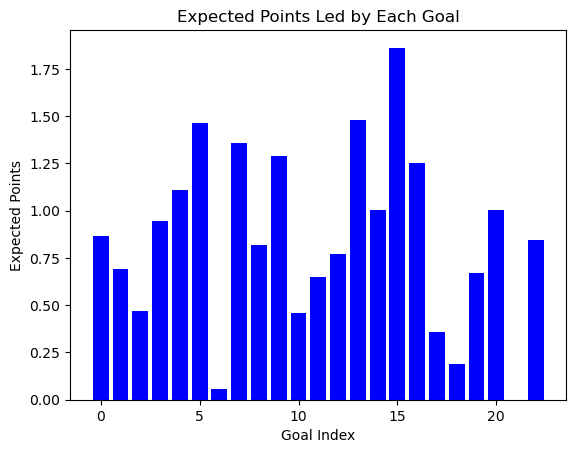

Neil Shipperley


100%|██████████████████████████████████████████████████████████████████████████████████| 26/26 [01:17<00:00,  2.98s/it]


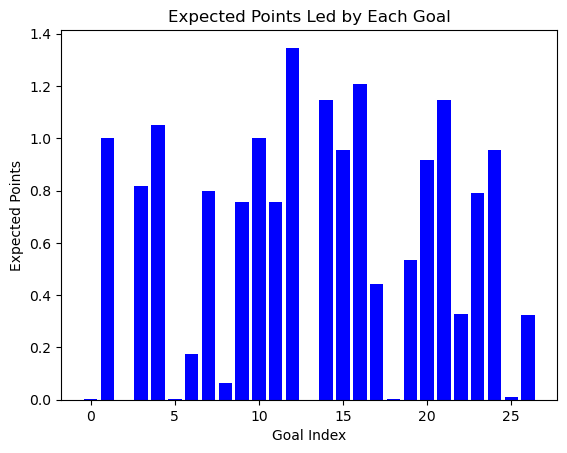

Guy Whittingham


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [01:18<00:00,  3.28s/it]


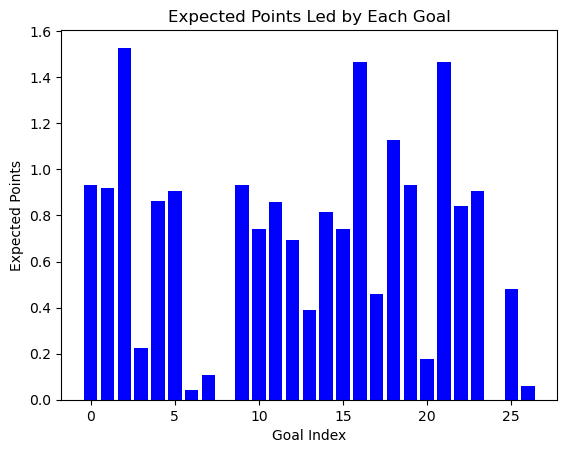

Mark Stein


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [01:00<00:00,  3.80s/it]


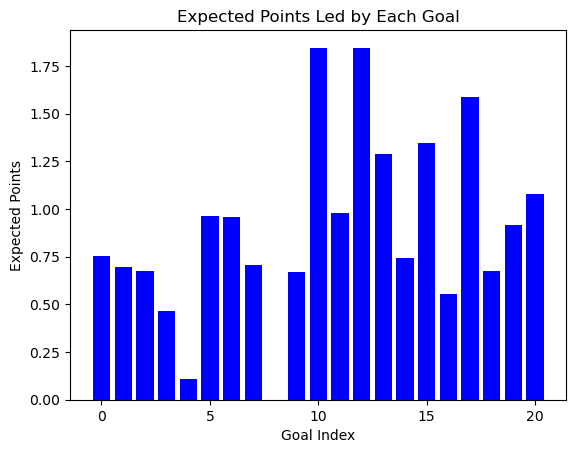

Julian Dicks


100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [01:11<00:00,  3.24s/it]


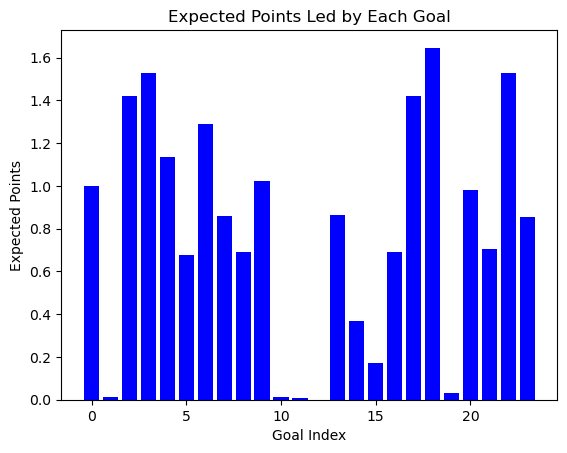

Jan Åge Fjørtoft


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:12<00:00,  3.60s/it]


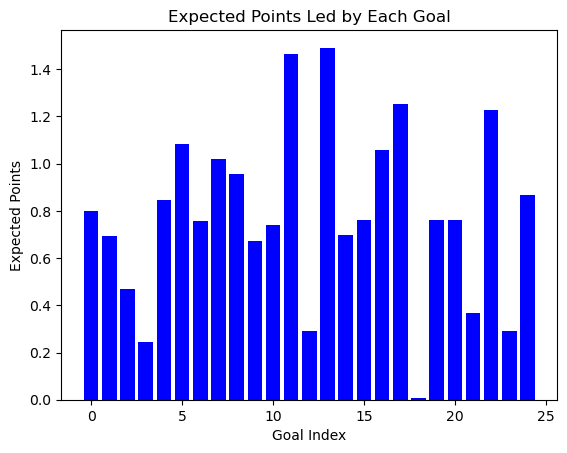

Nathan Blake


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:06<00:00,  3.31s/it]


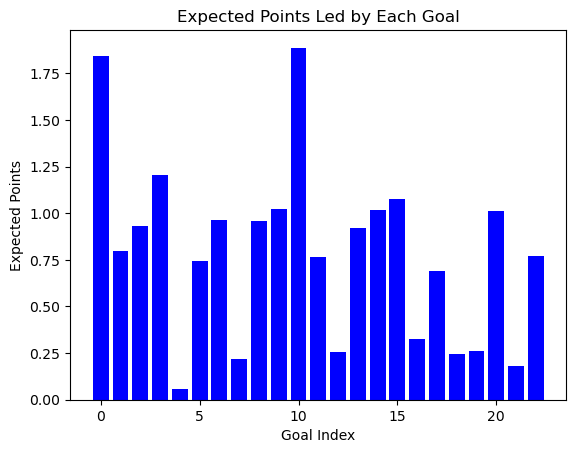

Steve Watson


100%|██████████████████████████████████████████████████████████████████████████████████| 21/21 [01:16<00:00,  3.65s/it]


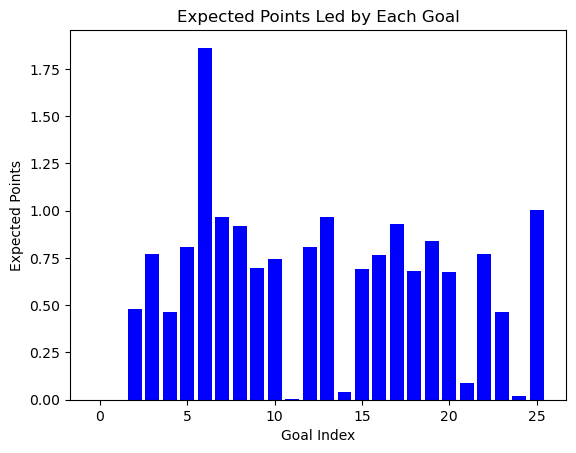

Uwe Rösler


100%|██████████████████████████████████████████████████████████████████████████████████| 26/26 [01:23<00:00,  3.21s/it]


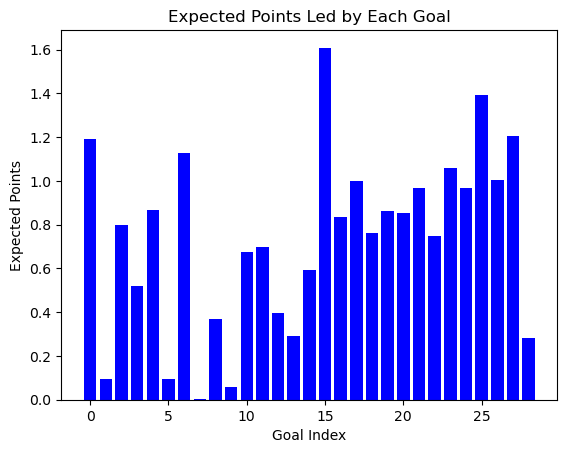

Bryan Roy


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [01:09<00:00,  3.88s/it]


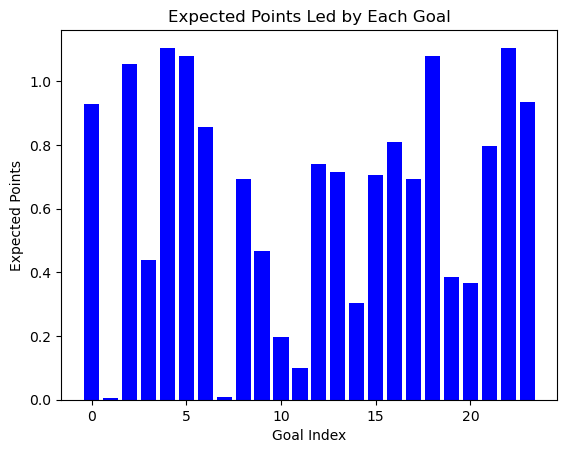

Dan Petrescu


100%|██████████████████████████████████████████████████████████████████████████████████| 23/23 [01:06<00:00,  2.91s/it]


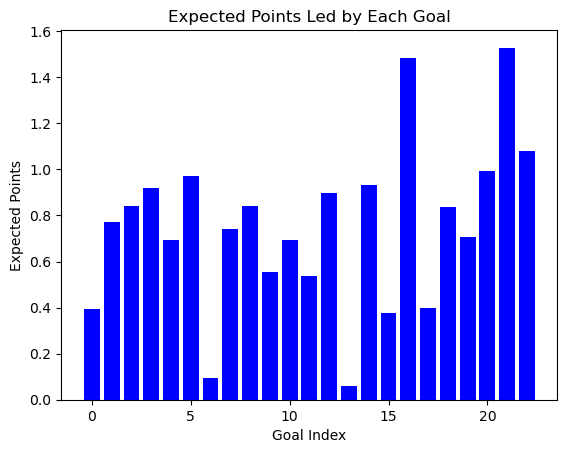

Jürgen Klinsmann


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [01:22<00:00,  3.45s/it]


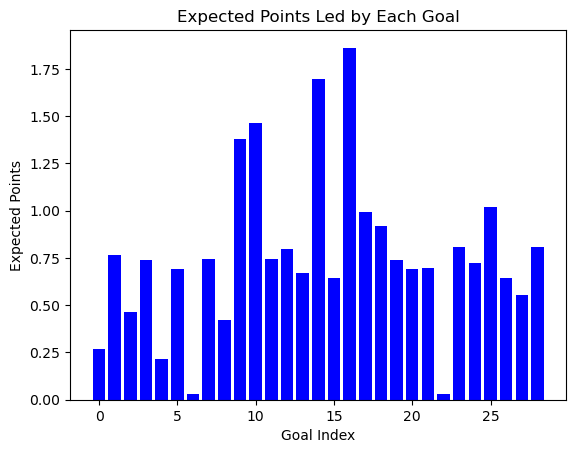

Ian Taylor


100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [01:23<00:00,  3.10s/it]


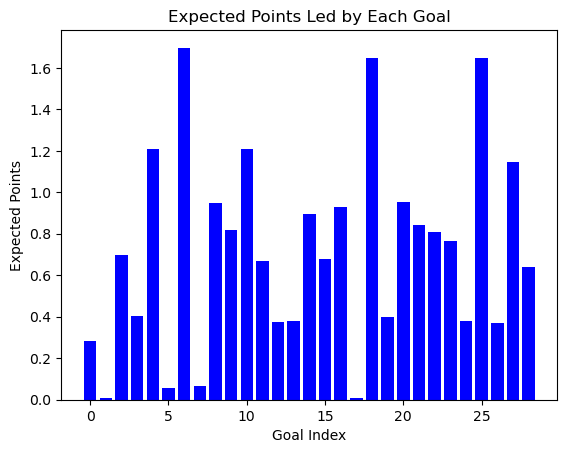

Paul Kitson


100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [01:22<00:00,  3.73s/it]


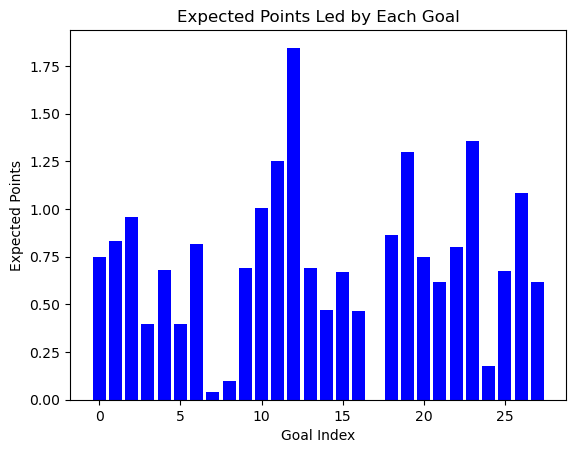

Oyvind Leonhardsen


100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [01:24<00:00,  3.12s/it]


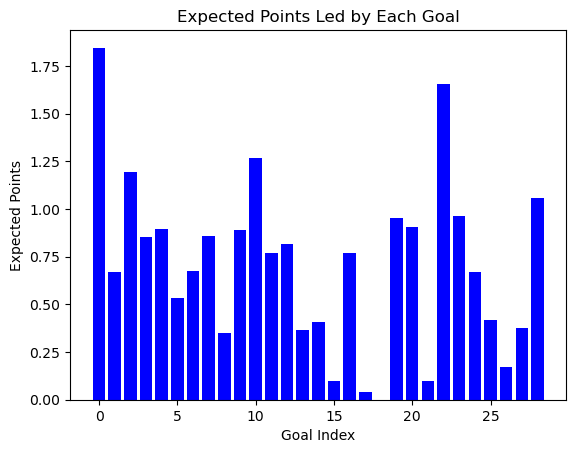

Nicky Butt


100%|██████████████████████████████████████████████████████████████████████████████████| 28/28 [01:22<00:00,  2.95s/it]


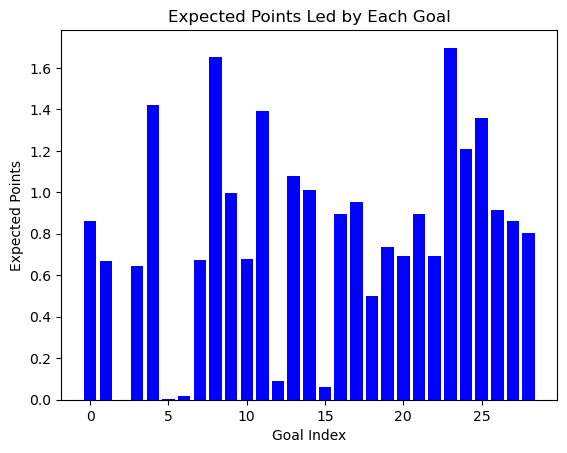

Anthony Yeboah


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [01:09<00:00,  4.61s/it]


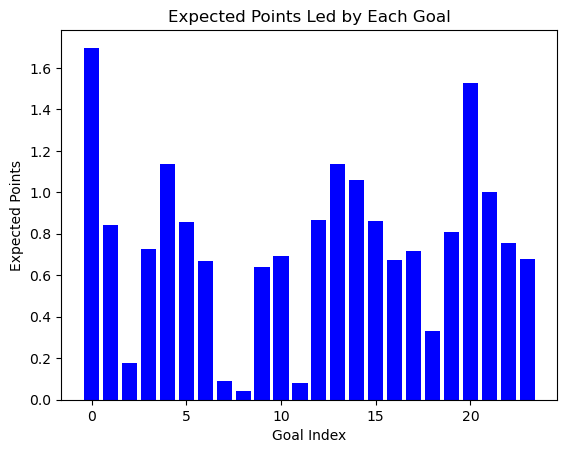

David Ginola


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:00<00:00,  3.04s/it]


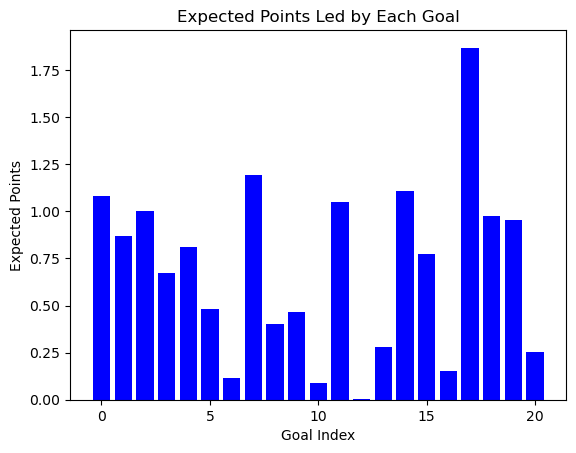

Savo Milosevic


100%|██████████████████████████████████████████████████████████████████████████████████| 21/21 [01:22<00:00,  3.94s/it]


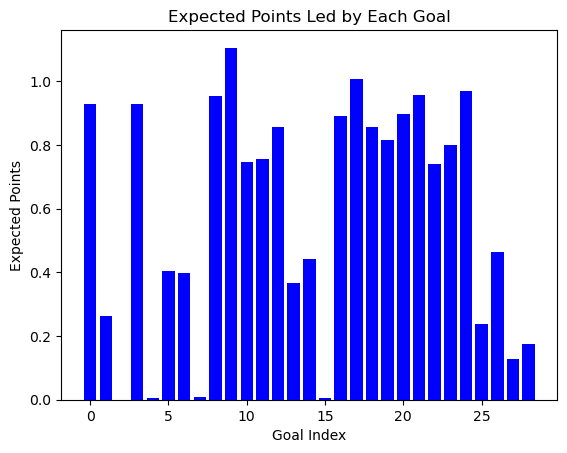

Juninho Paulista


100%|██████████████████████████████████████████████████████████████████████████████████| 25/25 [01:23<00:00,  3.35s/it]


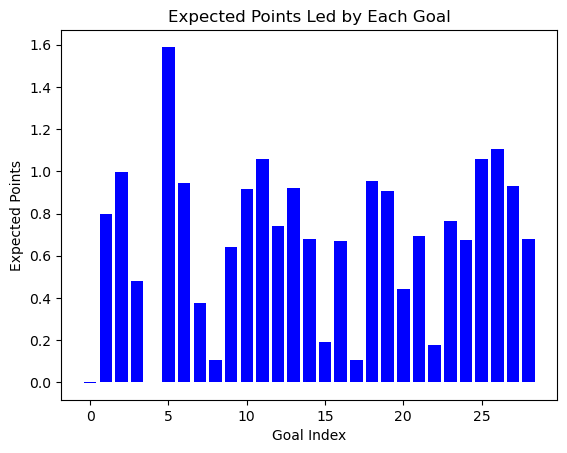

Ian Harte


100%|██████████████████████████████████████████████████████████████████████████████████| 28/28 [01:21<00:00,  2.93s/it]


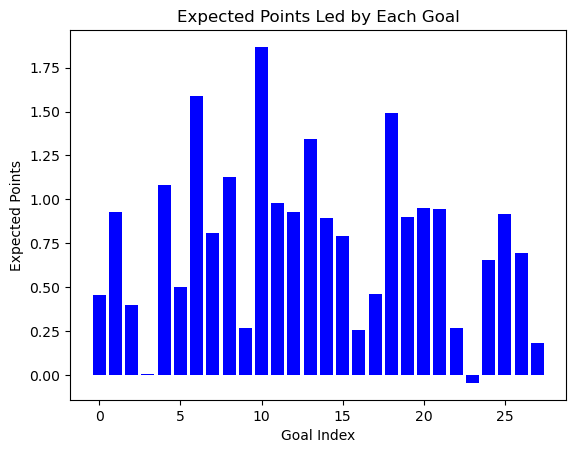

Fabrizio Ravanelli


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [01:13<00:00,  3.84s/it]


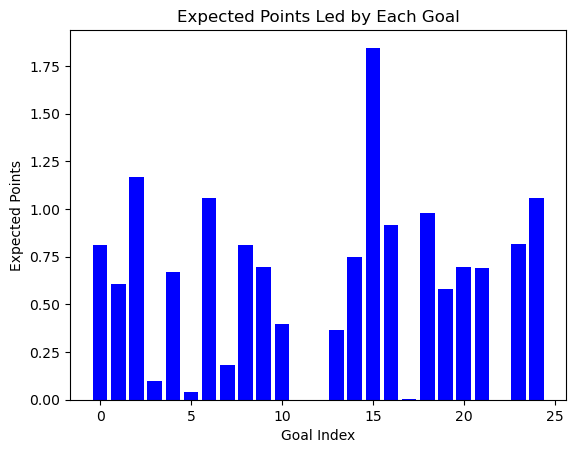

Andy Booth


100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [01:13<00:00,  3.34s/it]


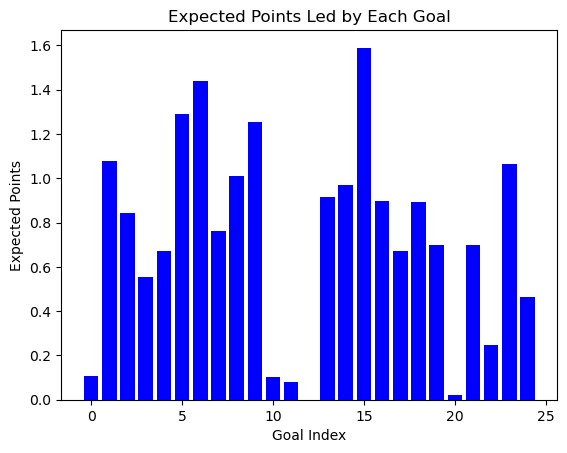

Gianluca Vialli


100%|██████████████████████████████████████████████████████████████████████████████████| 17/17 [01:01<00:00,  3.62s/it]


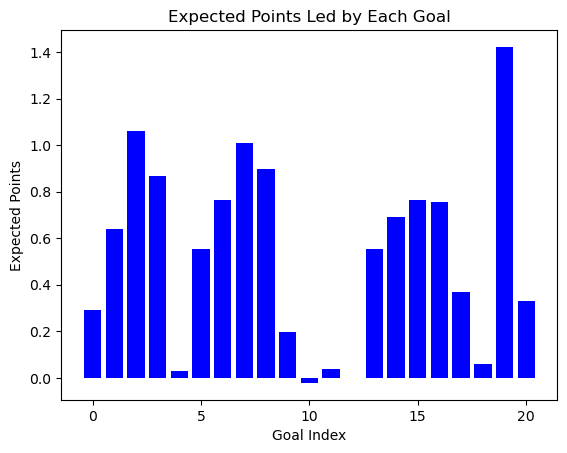

Egil Ostenstad


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [01:25<00:00,  3.54s/it]


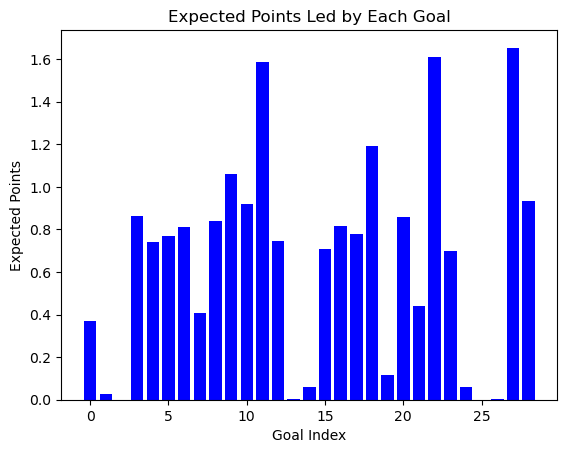

Michael Bridges


100%|██████████████████████████████████████████████████████████████████████████████████| 17/17 [01:03<00:00,  3.72s/it]


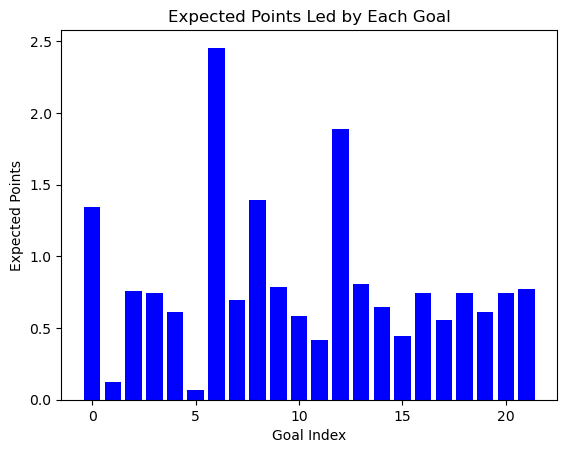

Matt Elliott


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [01:03<00:00,  3.33s/it]


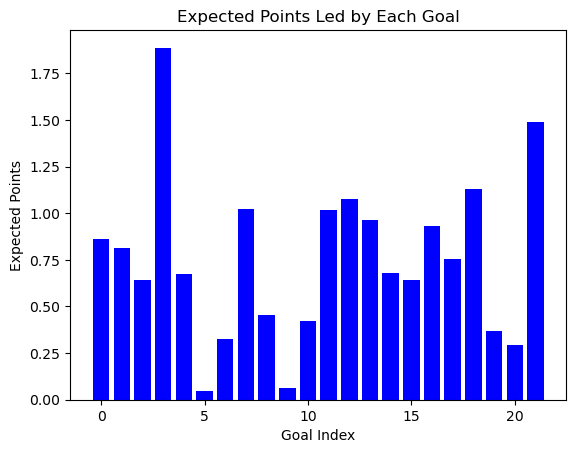

Marc Overmars


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:12<00:00,  3.64s/it]


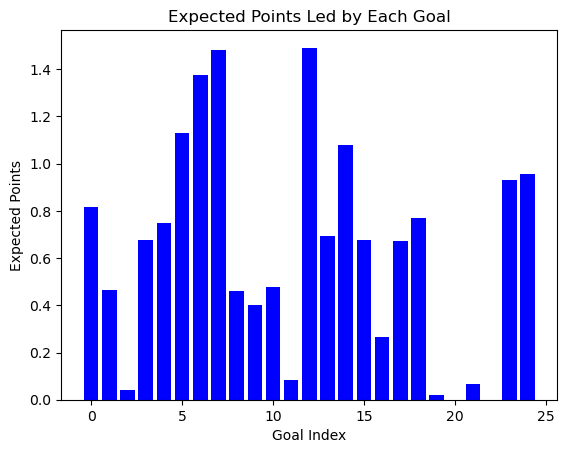

Carl Cort


100%|██████████████████████████████████████████████████████████████████████████████████| 28/28 [01:21<00:00,  2.90s/it]


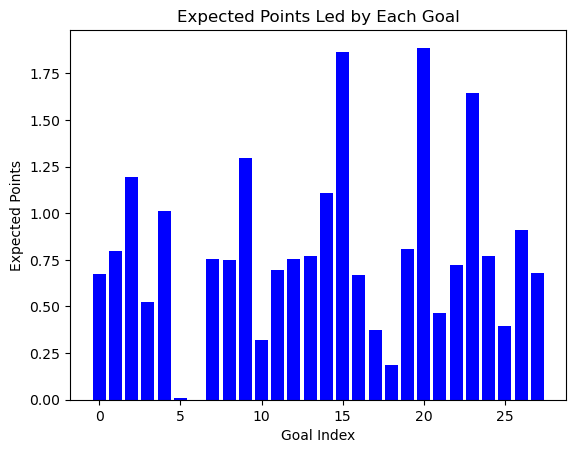

Deon Burton


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [01:00<00:00,  3.19s/it]


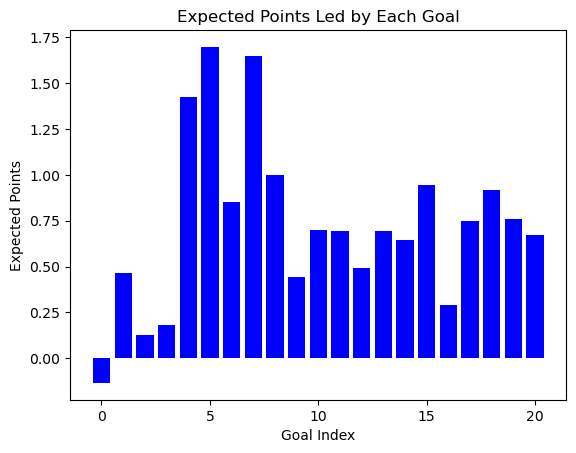

Lee Hendrie


100%|██████████████████████████████████████████████████████████████████████████████████| 26/26 [01:17<00:00,  2.99s/it]


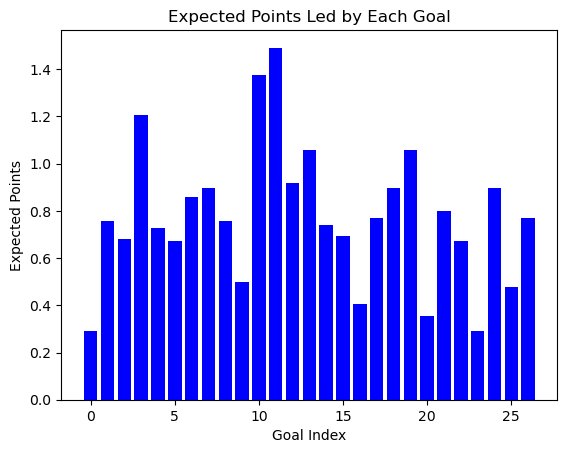

Robbie Savage


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:57<00:00,  2.87s/it]


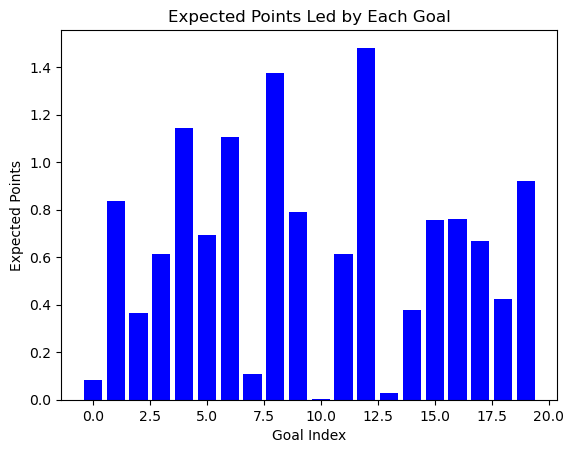

Marlon Harewood


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [01:20<00:00,  3.37s/it]


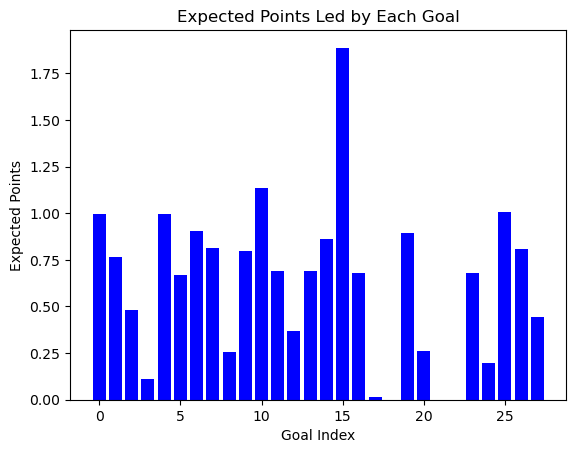

Francis Jeffers


100%|██████████████████████████████████████████████████████████████████████████████████| 23/23 [01:13<00:00,  3.20s/it]


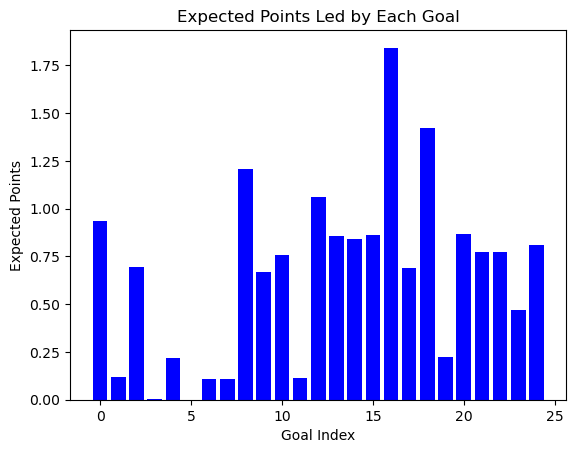

Rory Delap


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:03<00:00,  3.17s/it]


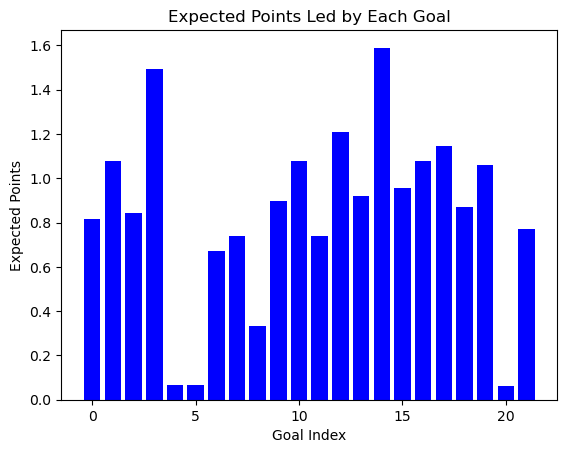

Kieron Dyer


100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [01:06<00:00,  3.02s/it]


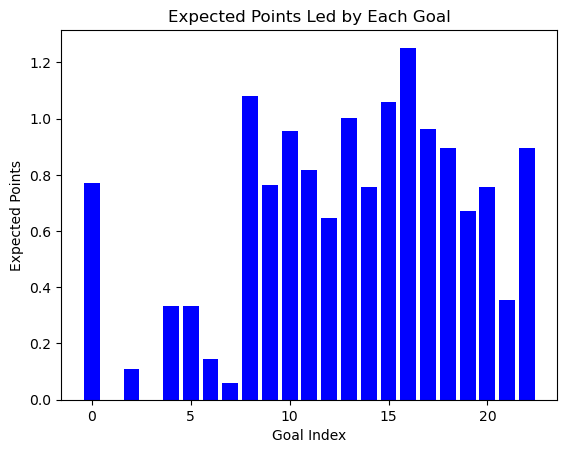

Sami Hyypiä


100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [01:05<00:00,  2.97s/it]


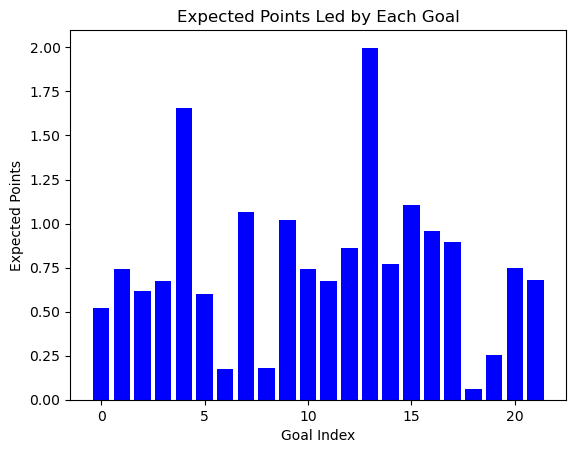

Luís Boa Morte


100%|██████████████████████████████████████████████████████████████████████████████████| 26/26 [01:24<00:00,  3.24s/it]


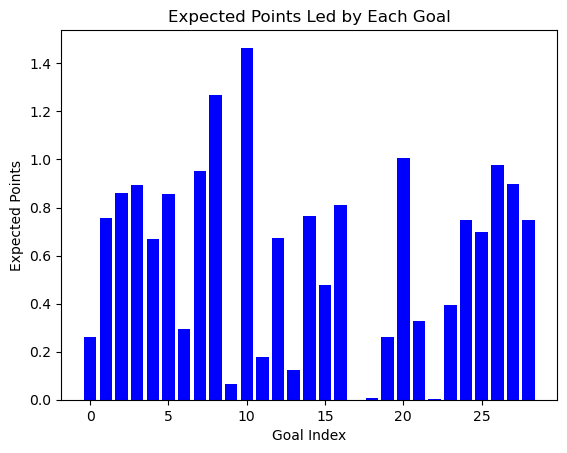

Malcolm Christie


100%|██████████████████████████████████████████████████████████████████████████████████| 26/26 [01:24<00:00,  3.24s/it]


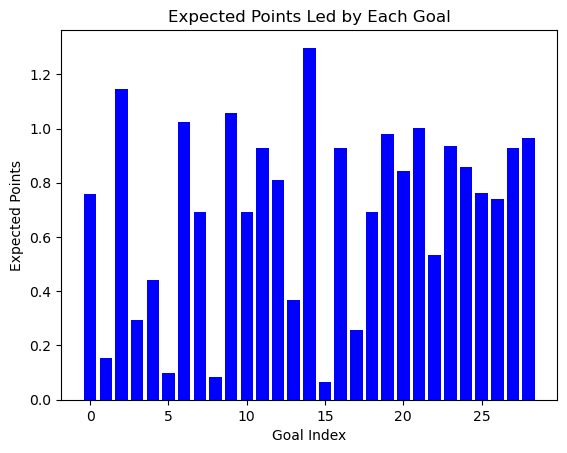

Heidar Helguson


100%|██████████████████████████████████████████████████████████████████████████████████| 26/26 [01:23<00:00,  3.22s/it]


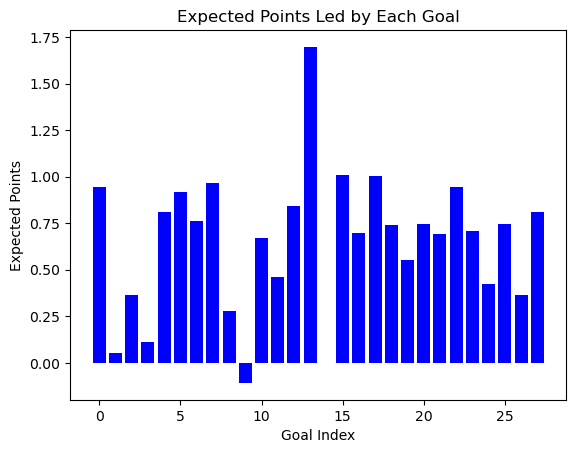

Michael Carrick


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [01:09<00:00,  2.91s/it]


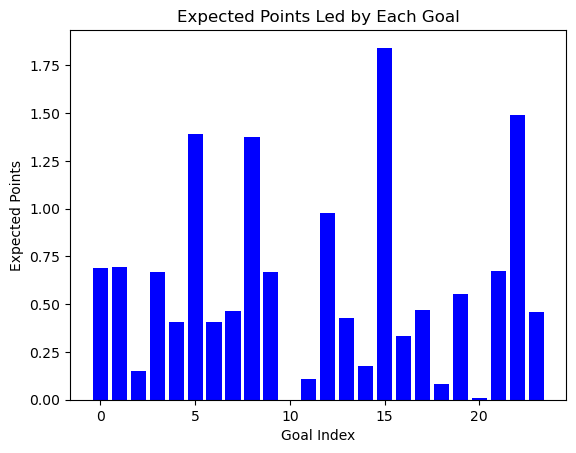

Alen Boksic


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [01:04<00:00,  3.58s/it]


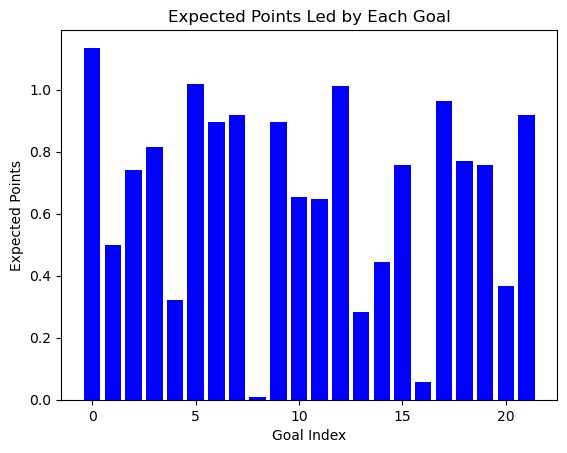

Jonatan Johansson


100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [01:17<00:00,  3.51s/it]


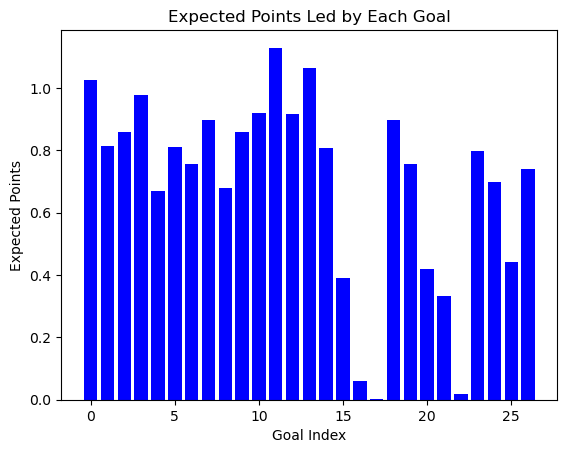

Marcus Stewart


100%|██████████████████████████████████████████████████████████████████████████████████| 21/21 [01:15<00:00,  3.58s/it]


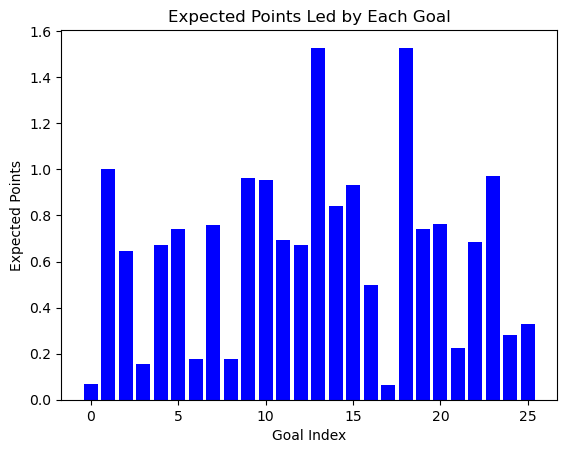

Claus Jensen


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:58<00:00,  2.91s/it]


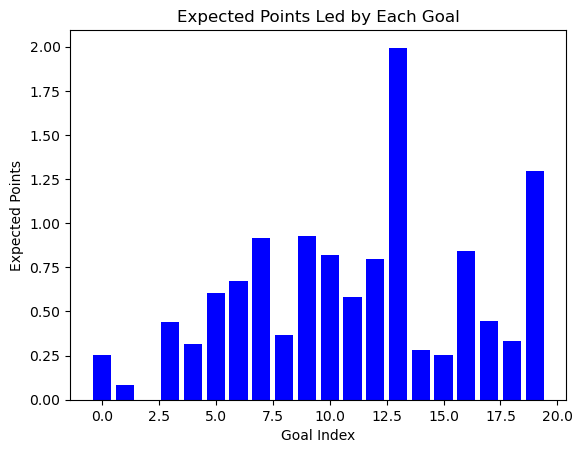

Shaun Bartlett


100%|██████████████████████████████████████████████████████████████████████████████████| 21/21 [01:09<00:00,  3.33s/it]


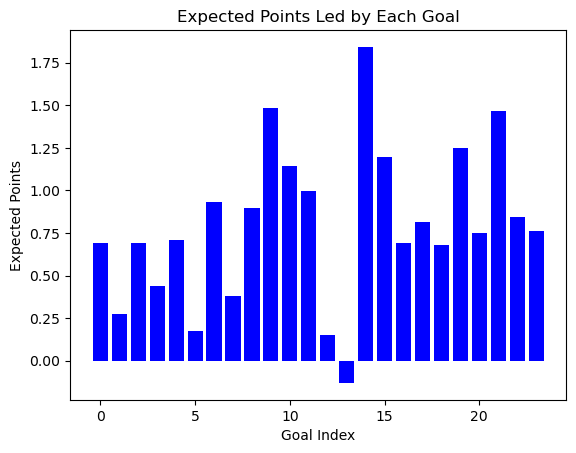

Scott Parker


100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [01:09<00:00,  3.16s/it]


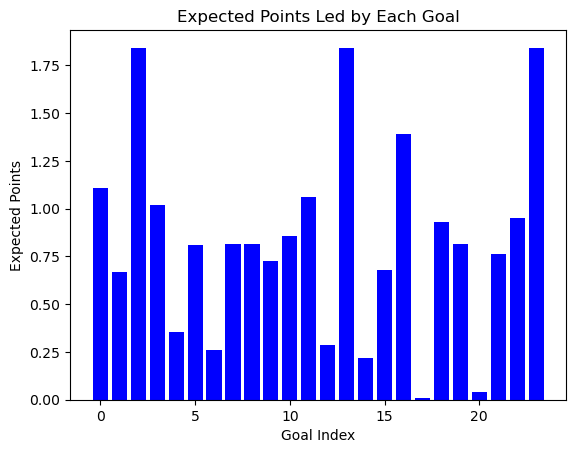

Simon Davies


100%|██████████████████████████████████████████████████████████████████████████████████| 26/26 [01:18<00:00,  3.03s/it]


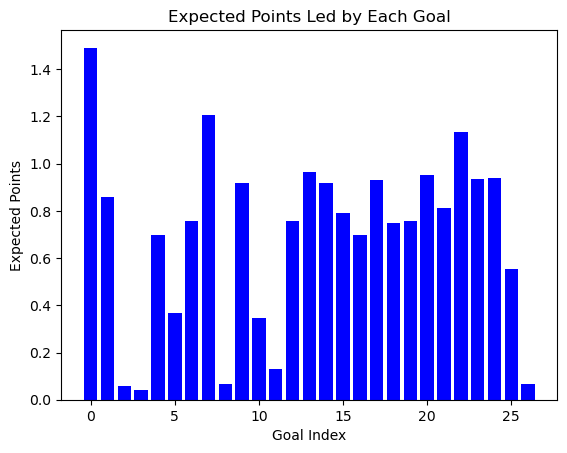

Michael Ricketts


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [01:00<00:00,  3.18s/it]


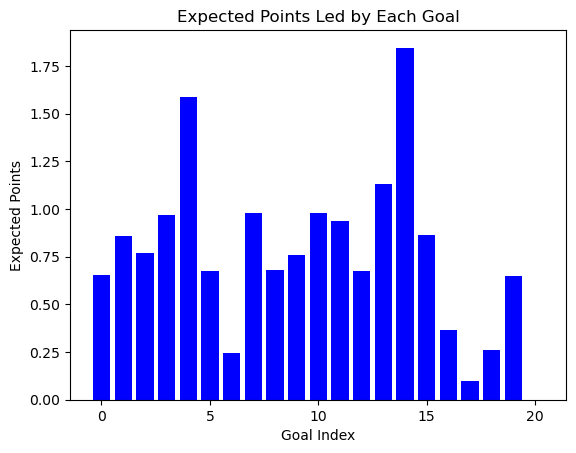

Laurent Robert


100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [01:07<00:00,  3.06s/it]


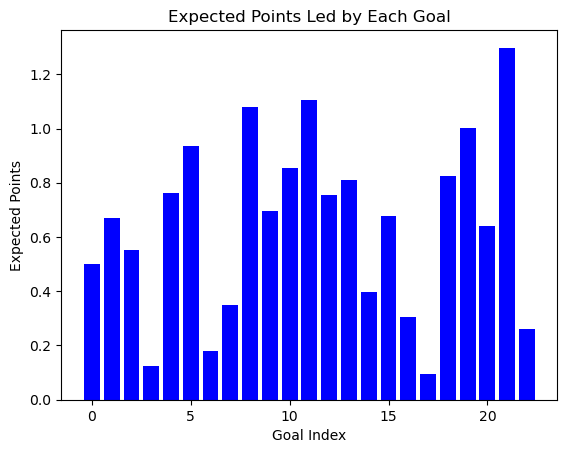

John Arne Riise


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [01:01<00:00,  3.25s/it]


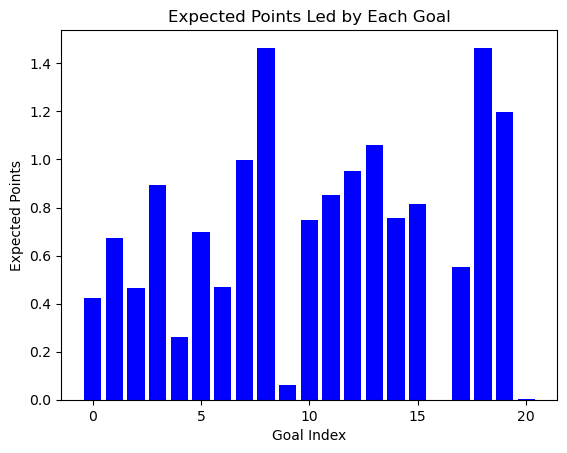

Szilard Nemeth


100%|██████████████████████████████████████████████████████████████████████████████████| 21/21 [01:07<00:00,  3.23s/it]


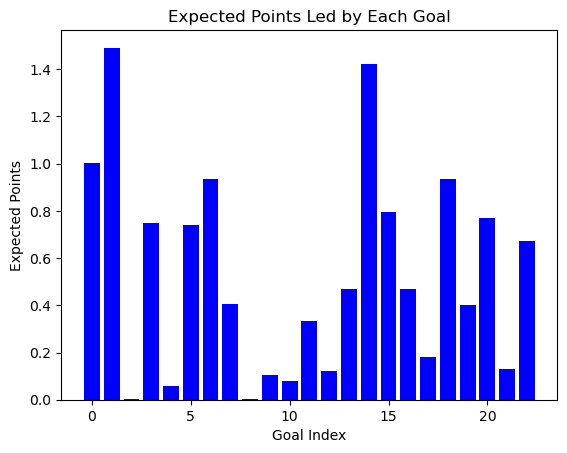

William Gallas


100%|██████████████████████████████████████████████████████████████████████████████████| 25/25 [01:13<00:00,  2.93s/it]


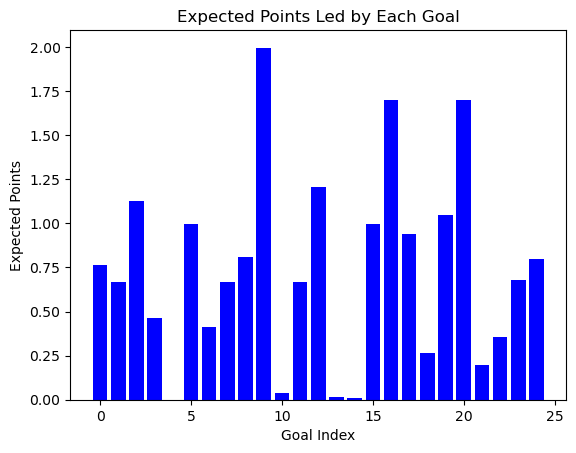

Lomana Lua Lua


100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [01:09<00:00,  3.15s/it]


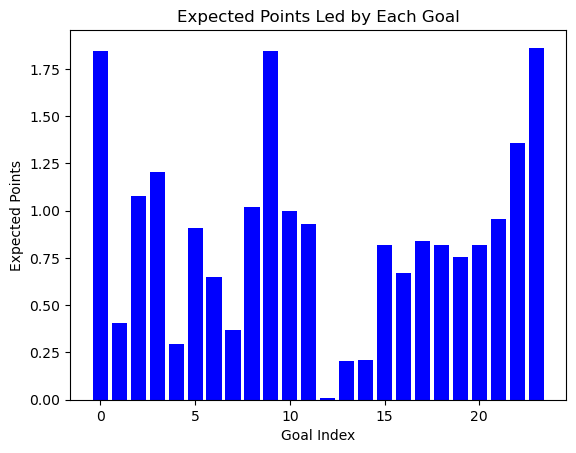

Matthew Etherington


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [01:02<00:00,  3.26s/it]


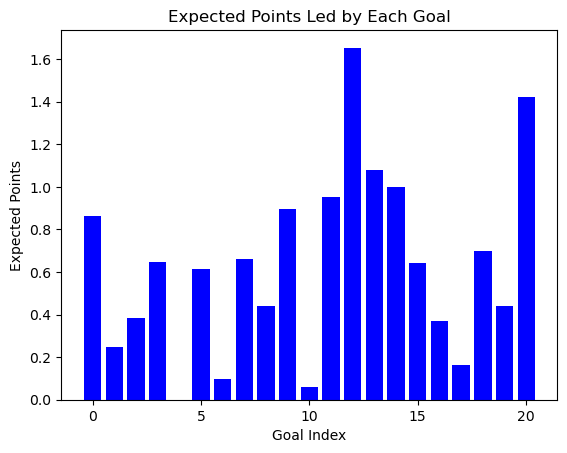

El Hadji Diouf


100%|██████████████████████████████████████████████████████████████████████████████████| 26/26 [01:21<00:00,  3.15s/it]


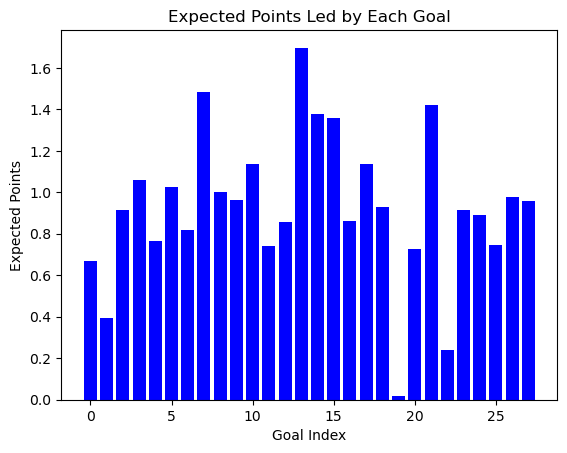

Milan Baros


100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [01:21<00:00,  3.70s/it]


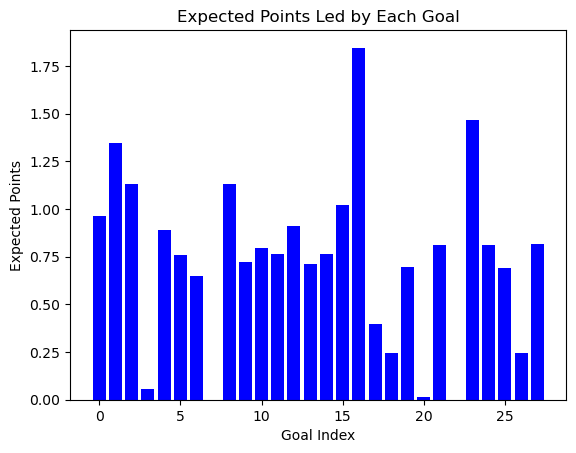

Henrik Pedersen


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:03<00:00,  3.16s/it]


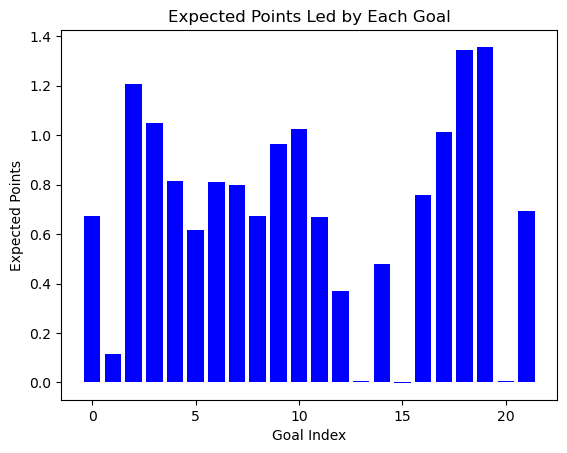

Joey Barton


100%|██████████████████████████████████████████████████████████████████████████████████| 25/25 [01:17<00:00,  3.10s/it]


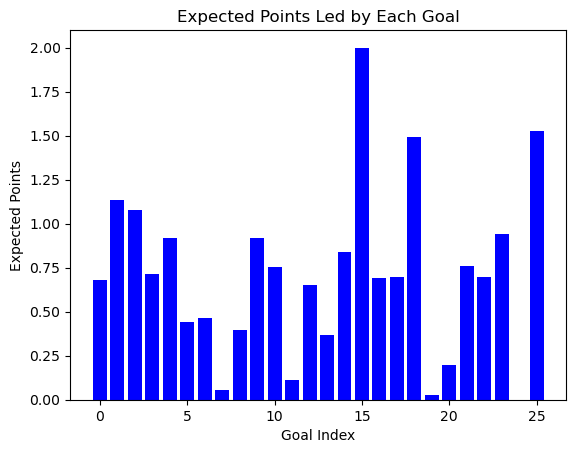

Hernán Crespo


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:58<00:00,  3.27s/it]


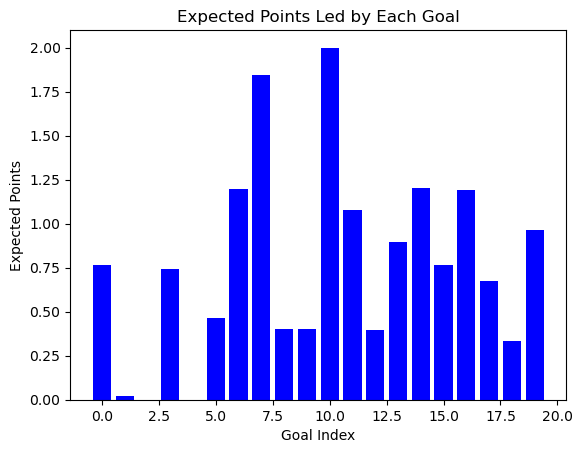

Collins John


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:58<00:00,  3.65s/it]


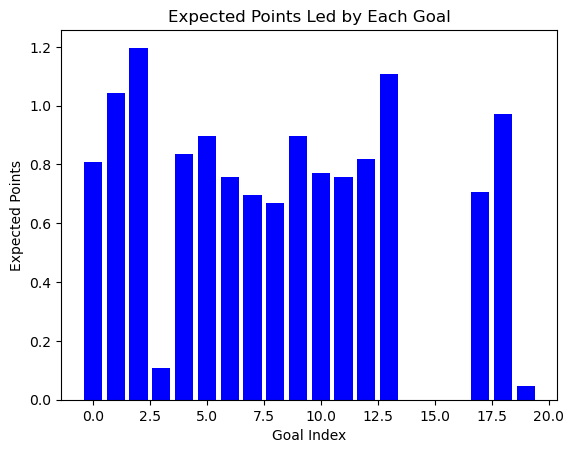

Stelios Giannakopoulos


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:59<00:00,  3.30s/it]


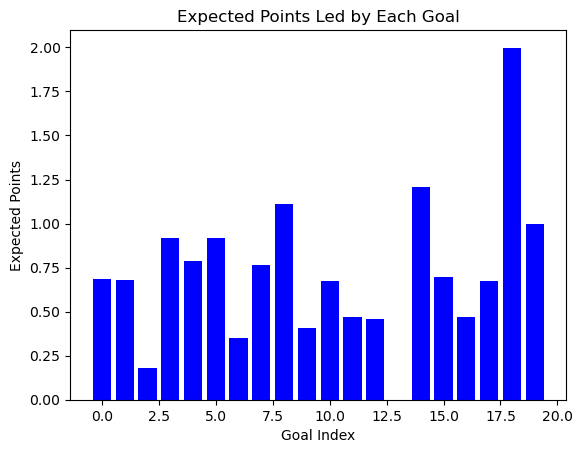

Darren Fletcher


100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [01:06<00:00,  3.04s/it]


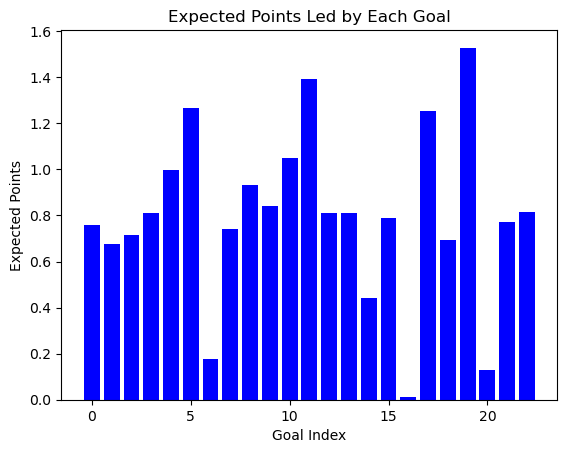

James McFadden


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [00:59<00:00,  3.15s/it]


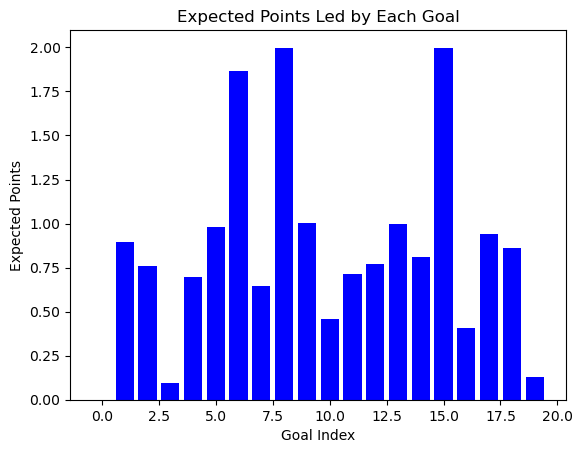

Dean Ashton


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:05<00:00,  3.27s/it]


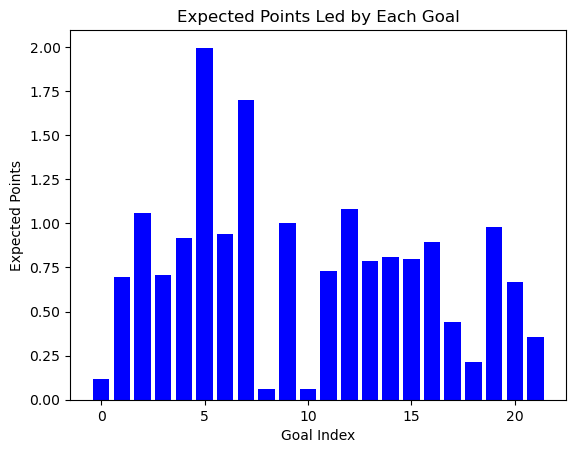

Kieran Richardson


100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [01:30<00:00,  4.09s/it]


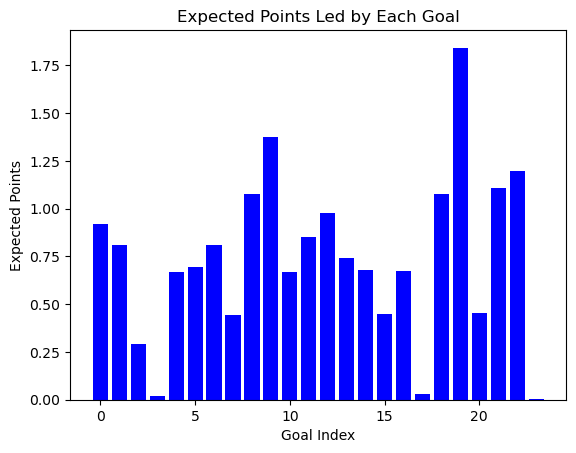

Mido


100%|██████████████████████████████████████████████████████████████████████████████████| 21/21 [01:16<00:00,  3.64s/it]


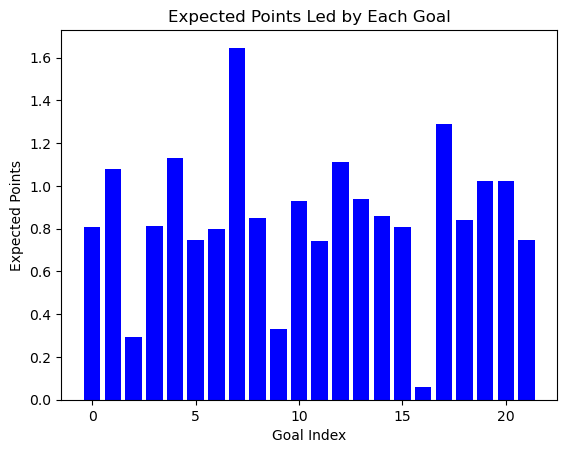

Luke Moore


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:59<00:00,  3.28s/it]


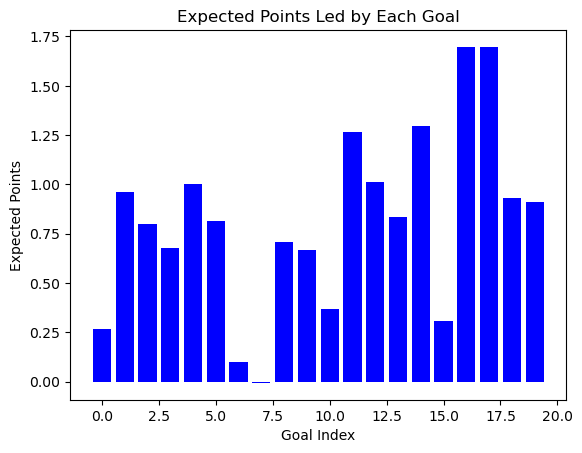

Charles N'Zogbia


100%|██████████████████████████████████████████████████████████████████████████████████| 26/26 [01:22<00:00,  3.16s/it]


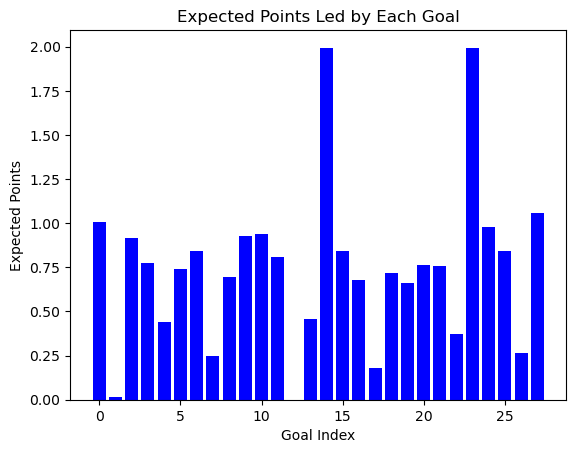

Paul Scharner


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:01<00:00,  3.09s/it]


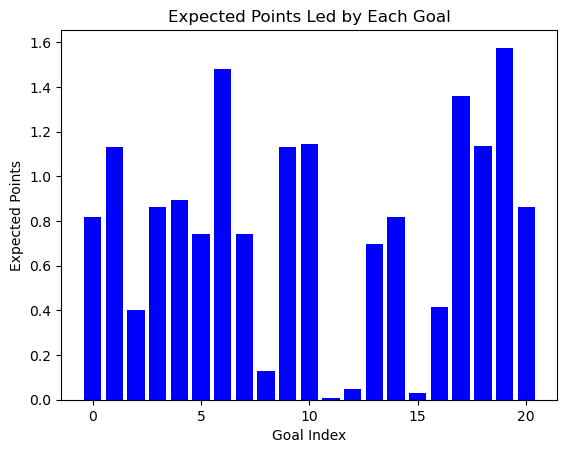

Gary Cahill


100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [01:21<00:00,  3.03s/it]


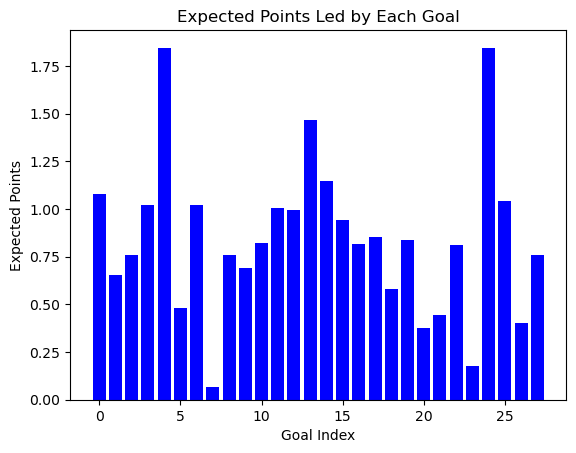

Benjani


100%|██████████████████████████████████████████████████████████████████████████████████| 21/21 [01:16<00:00,  3.62s/it]


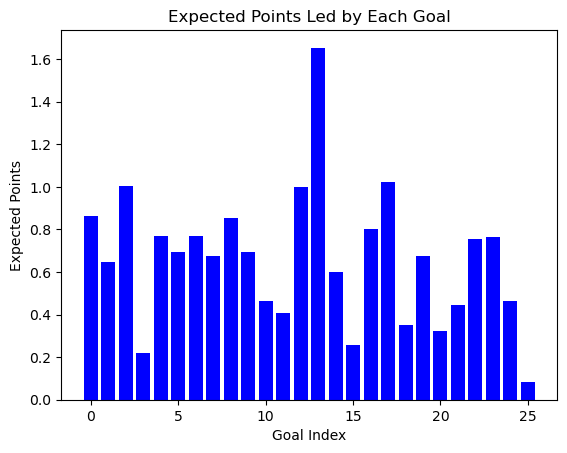

Victor Anichebe


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [01:17<00:00,  3.23s/it]


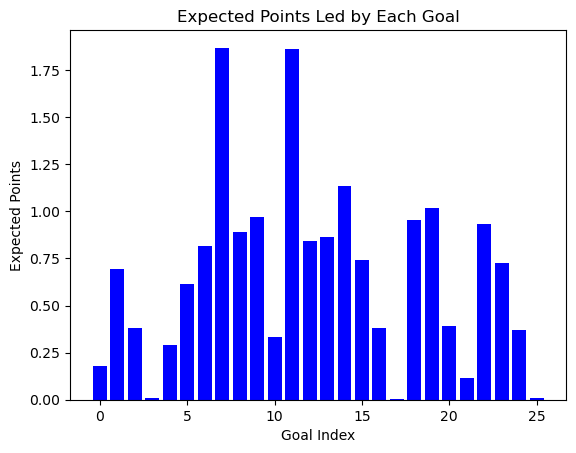

Steve Sidwell


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:01<00:00,  3.06s/it]


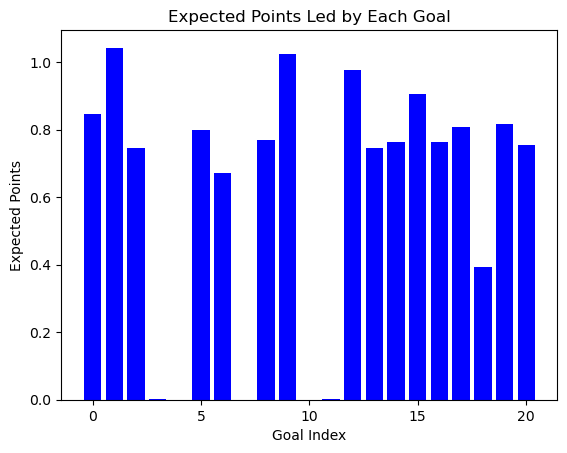

Obafemi Martins


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [01:23<00:00,  3.46s/it]


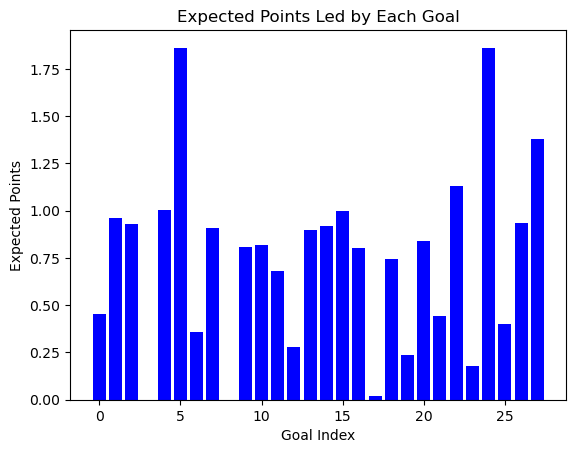

Antonio Valencia


100%|██████████████████████████████████████████████████████████████████████████████████| 23/23 [01:10<00:00,  3.06s/it]


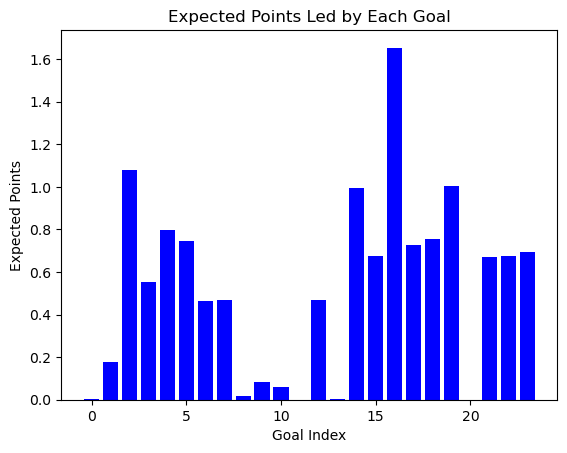

Robert Huth


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [01:02<00:00,  3.28s/it]


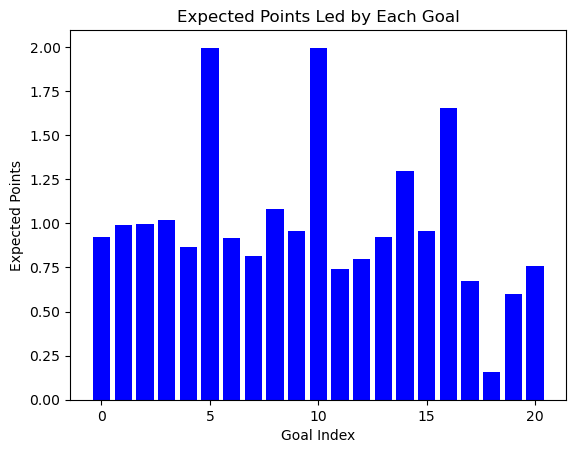

Stephen Hunt


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:01<00:00,  3.06s/it]


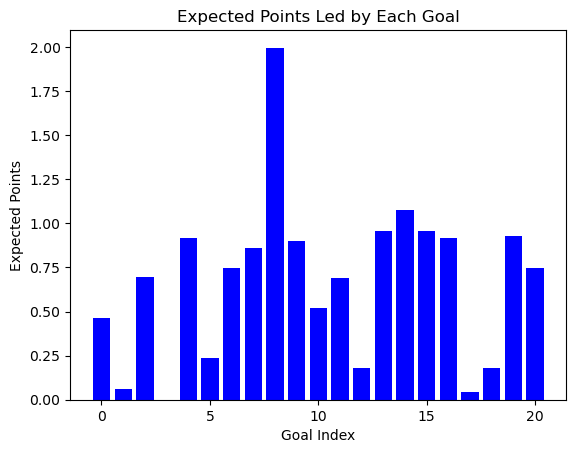

Niko Kranjcar


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [00:58<00:00,  3.08s/it]


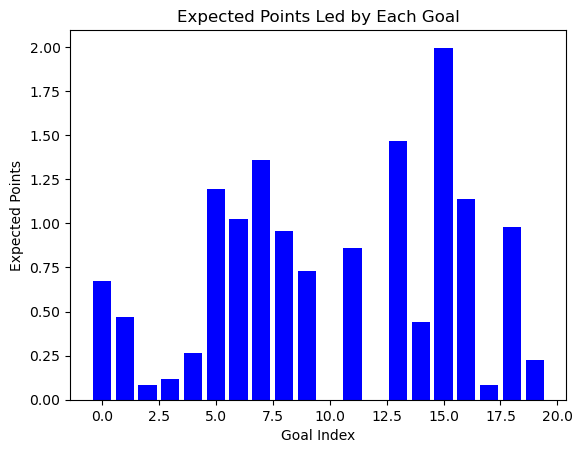

Joleon Lescott


100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [01:08<00:00,  3.12s/it]


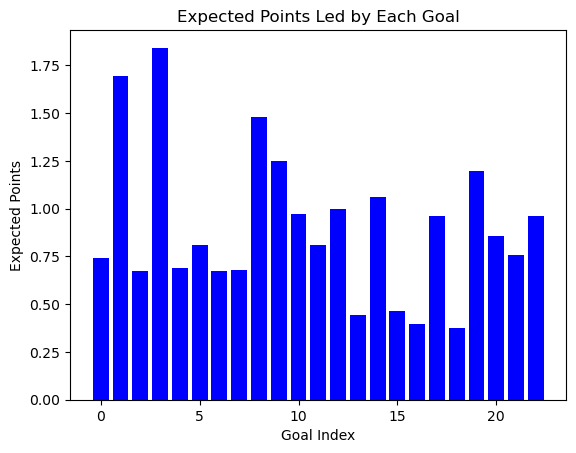

Roque Santa Cruz


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:17<00:00,  3.85s/it]


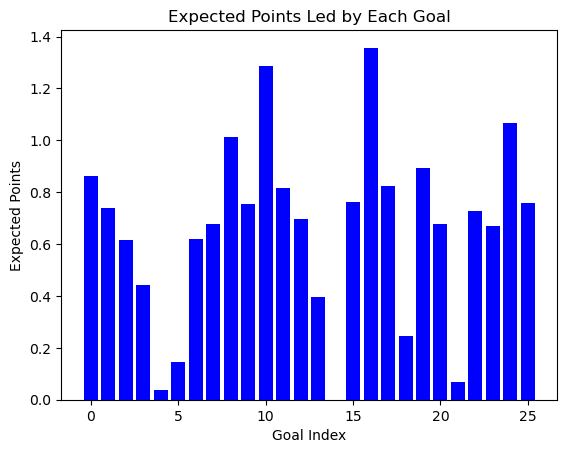

Nani


100%|██████████████████████████████████████████████████████████████████████████████████| 25/25 [01:17<00:00,  3.09s/it]


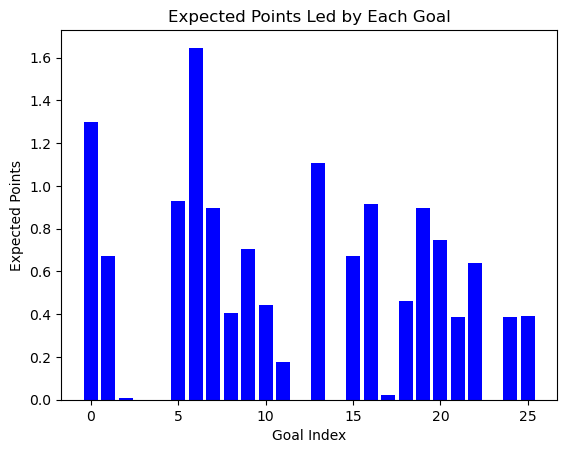

Steven Pienaar


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:58<00:00,  2.92s/it]


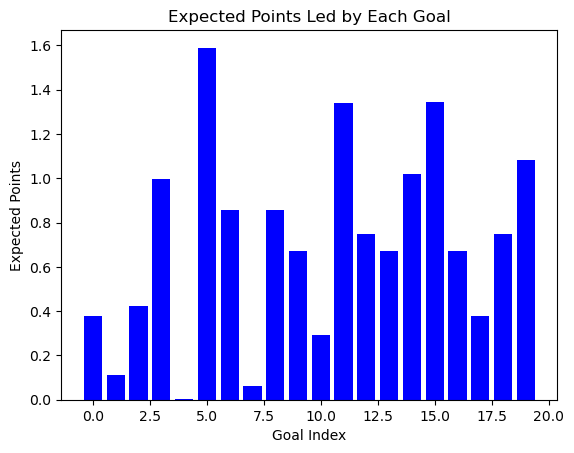

Tuncay Sanli


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [00:59<00:00,  3.15s/it]


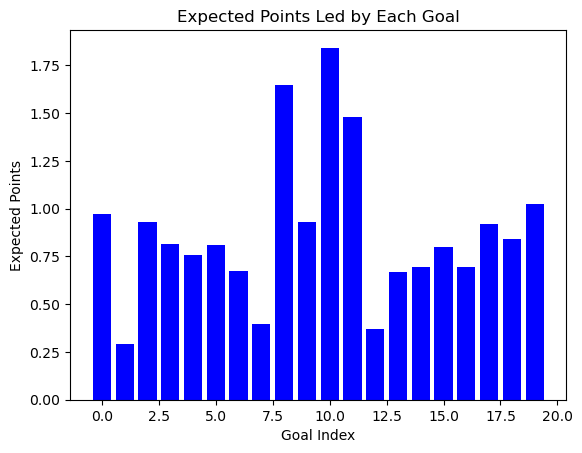

Sebastian Larsson


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [01:16<00:00,  3.18s/it]


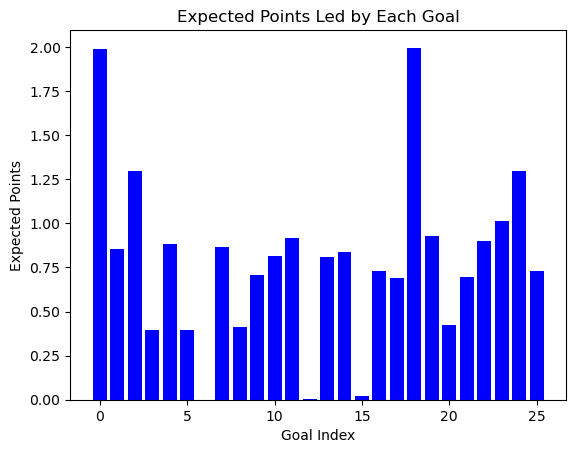

Chris Brunt


100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [01:10<00:00,  3.20s/it]


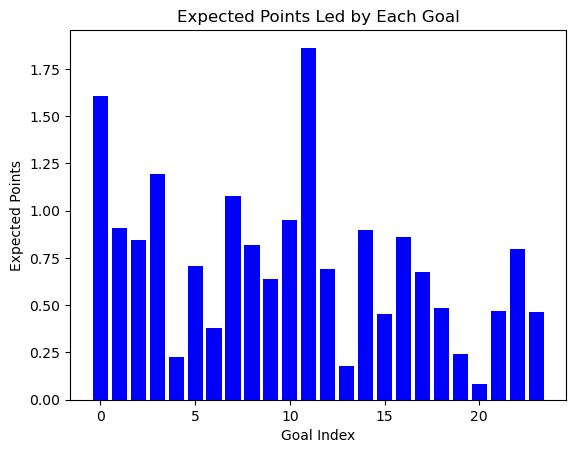

Roman Pavlyuchenko


100%|██████████████████████████████████████████████████████████████████████████████████| 17/17 [00:57<00:00,  3.38s/it]


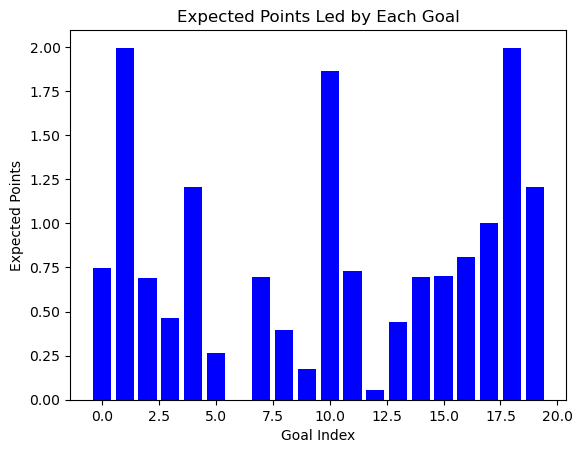

Andrey Arshavin


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:07<00:00,  3.39s/it]


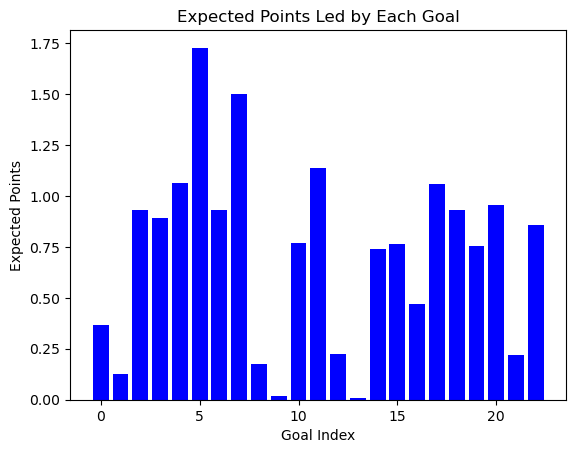

Junior Stanislas


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [01:16<00:00,  3.19s/it]


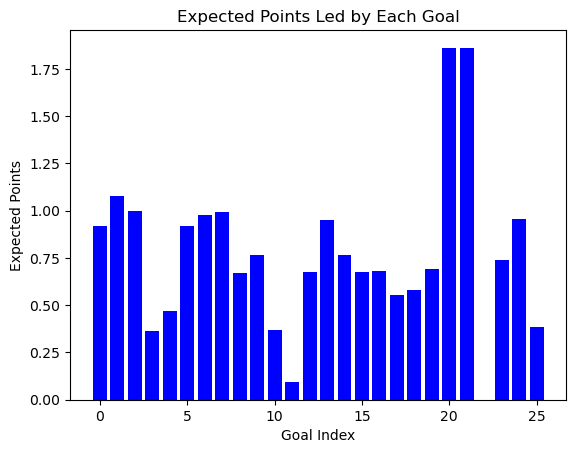

Hugo Rodallega


100%|██████████████████████████████████████████████████████████████████████████████████| 28/28 [01:24<00:00,  3.03s/it]


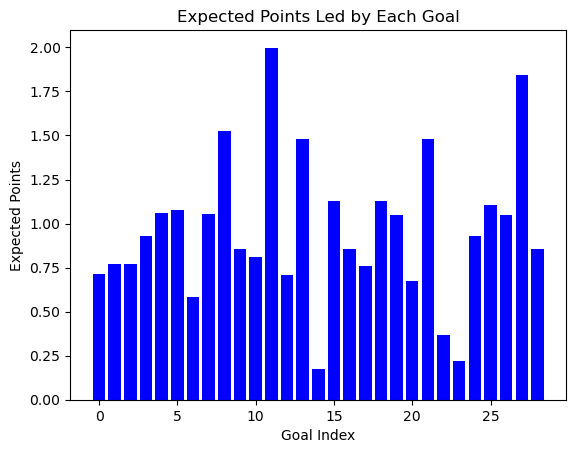

Ivan Klasnic


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [01:00<00:00,  3.34s/it]


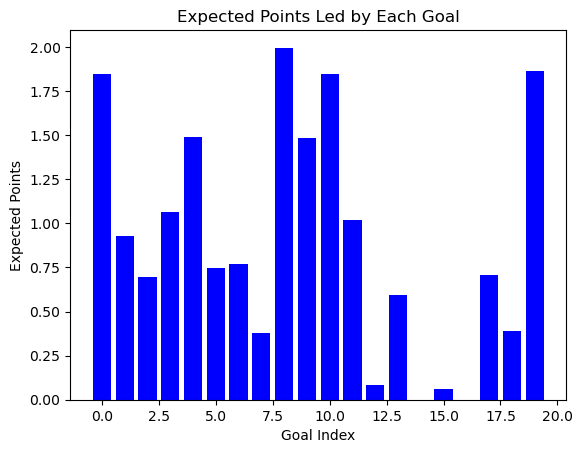

Branislav Ivanovic


100%|██████████████████████████████████████████████████████████████████████████████████| 21/21 [01:05<00:00,  3.13s/it]


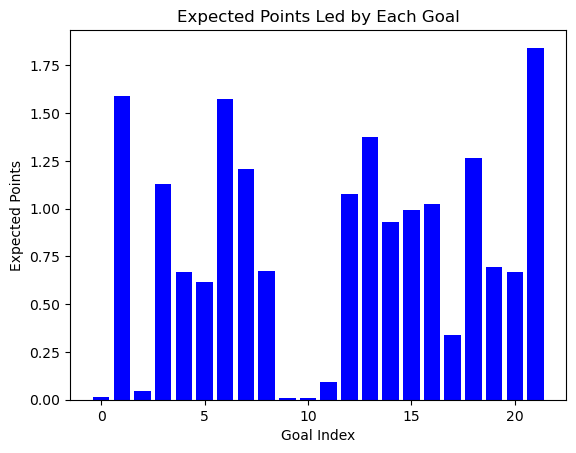

Mame Diouf


100%|██████████████████████████████████████████████████████████████████████████████████| 25/25 [01:19<00:00,  3.17s/it]


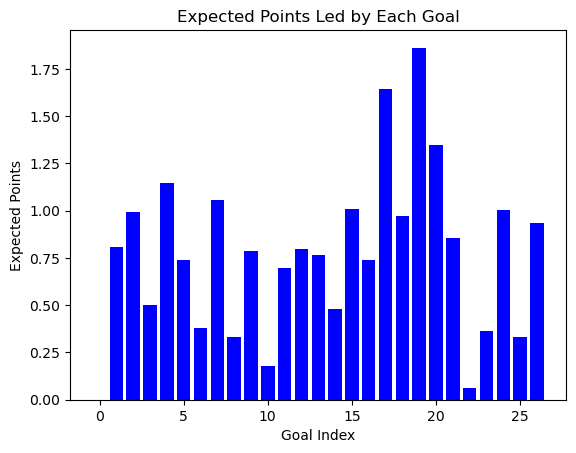

Matthew Jarvis


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [00:58<00:00,  3.09s/it]


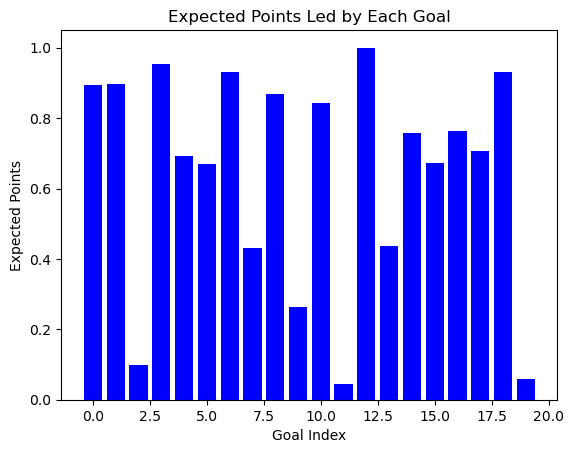

Victor Moses


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [00:58<00:00,  3.07s/it]


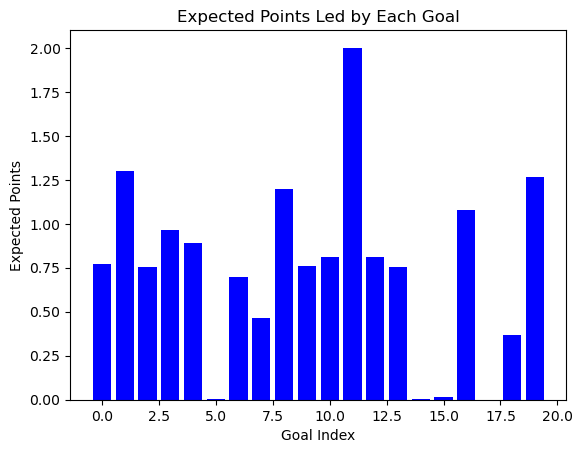

Laurent Koscielny


100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [01:03<00:00,  2.91s/it]


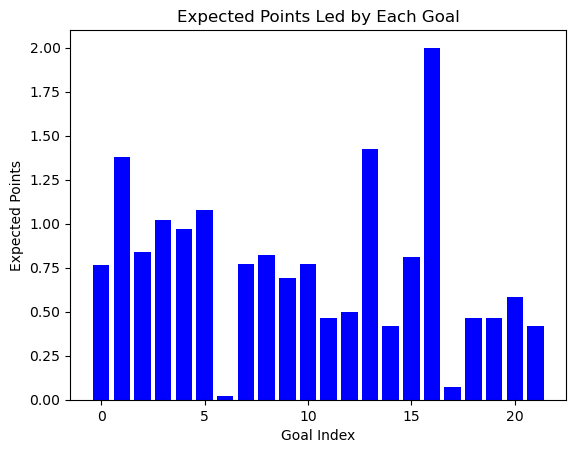

Rafael van der Vaart


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:18<00:00,  3.92s/it]


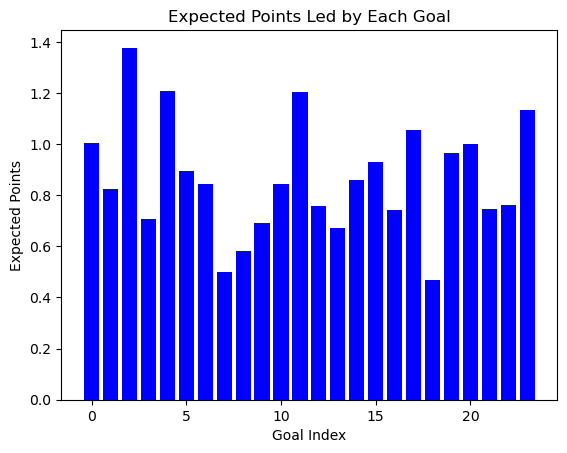

Marc Albrighton


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:00<00:00,  3.03s/it]


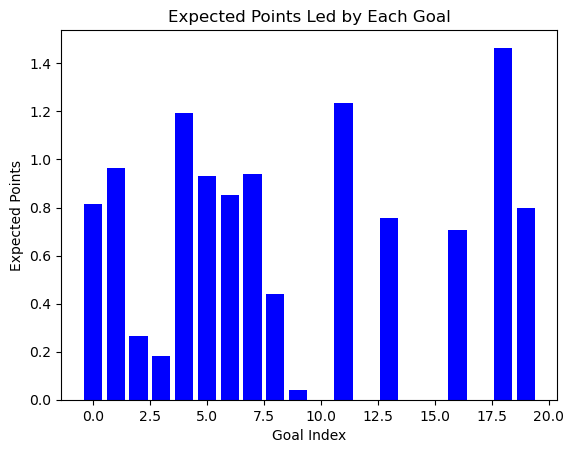

Séamus Coleman


100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [01:17<00:00,  3.53s/it]


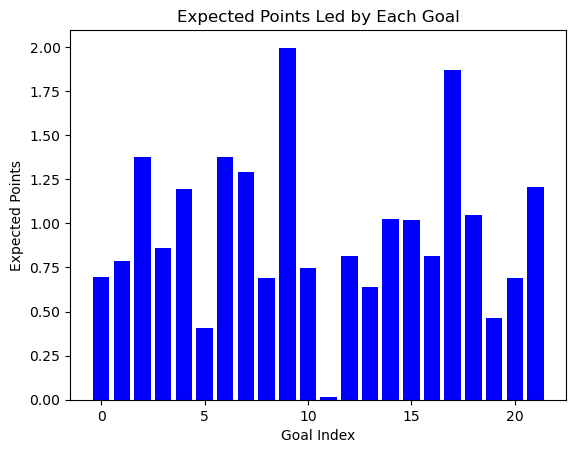

Mario Balotelli


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [01:01<00:00,  3.83s/it]


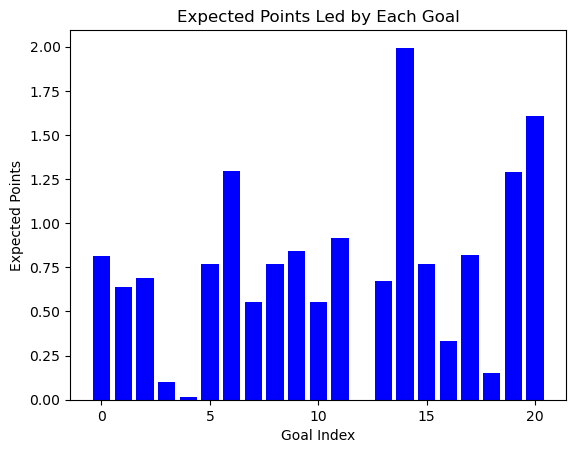

Rodrigo


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [01:19<00:00,  3.31s/it]


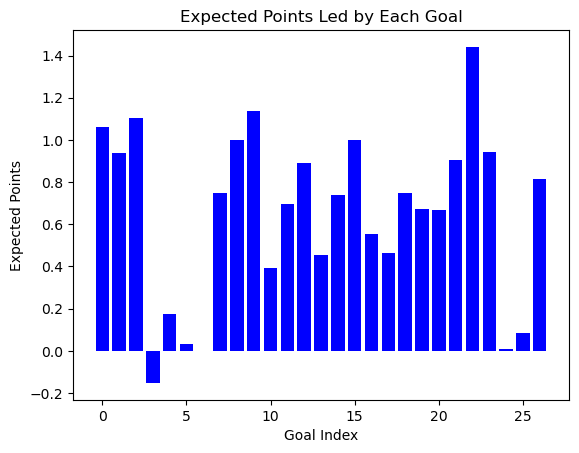

Jason Puncheon


100%|██████████████████████████████████████████████████████████████████████████████████| 23/23 [01:11<00:00,  3.11s/it]


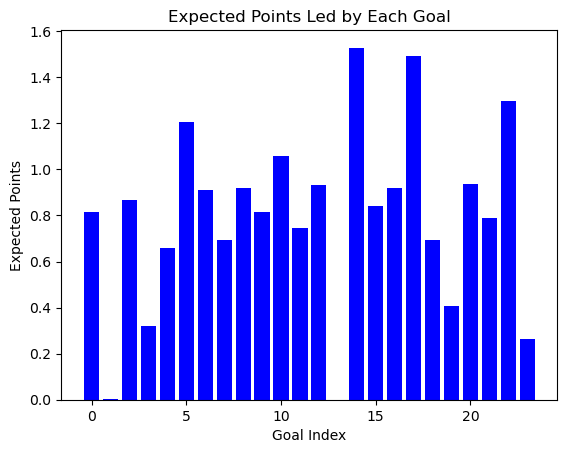

Stéphane Sessègnon


100%|██████████████████████████████████████████████████████████████████████████████████| 25/25 [01:15<00:00,  3.01s/it]


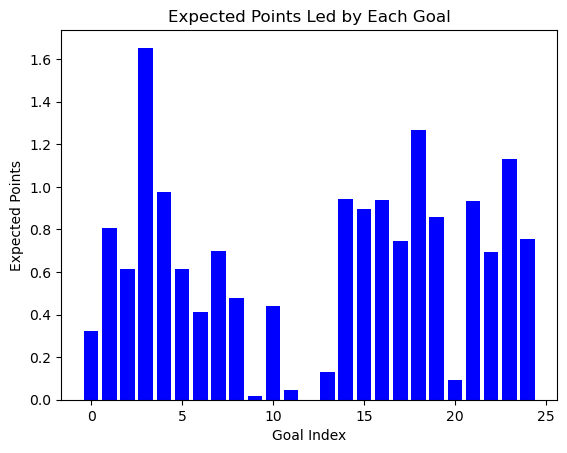

Grant Holt


100%|██████████████████████████████████████████████████████████████████████████████████| 21/21 [01:12<00:00,  3.45s/it]


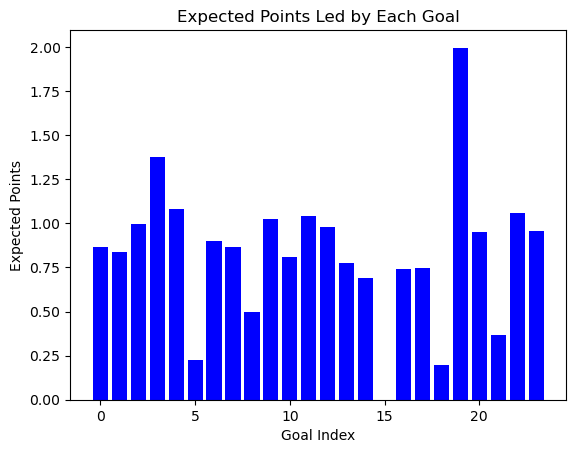

Yohan Cabaye


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [01:16<00:00,  3.17s/it]


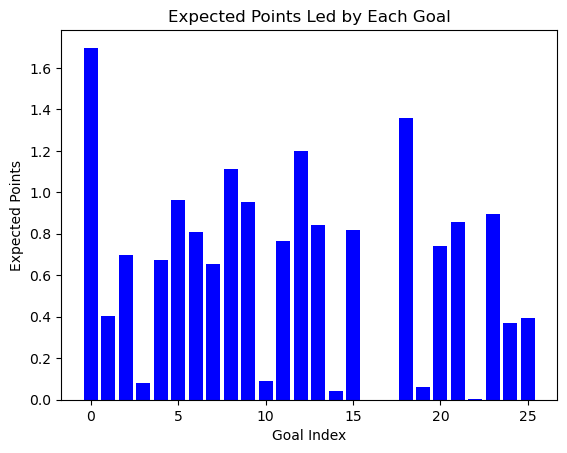

James McArthur


100%|██████████████████████████████████████████████████████████████████████████████████| 21/21 [01:08<00:00,  3.24s/it]


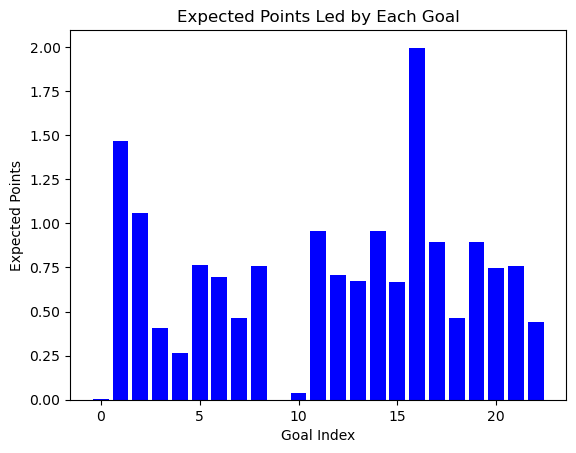

Alex Oxlade-Chamberlain


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:59<00:00,  3.29s/it]


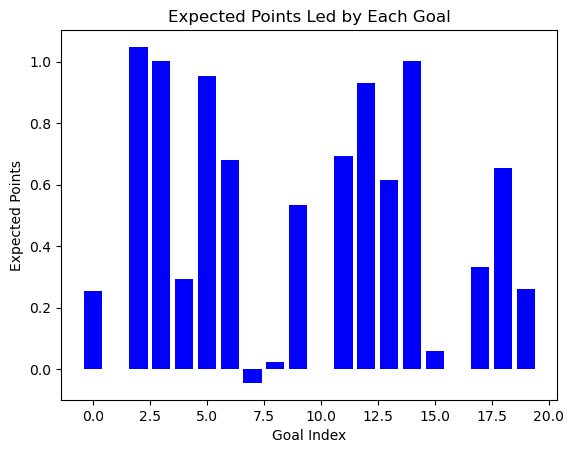

Nikica Jelavic


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [01:26<00:00,  3.60s/it]


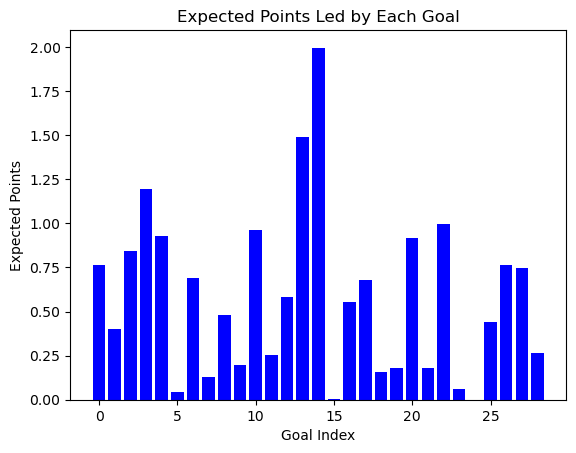

Marcos Alonso


100%|██████████████████████████████████████████████████████████████████████████████████| 23/23 [01:16<00:00,  3.34s/it]


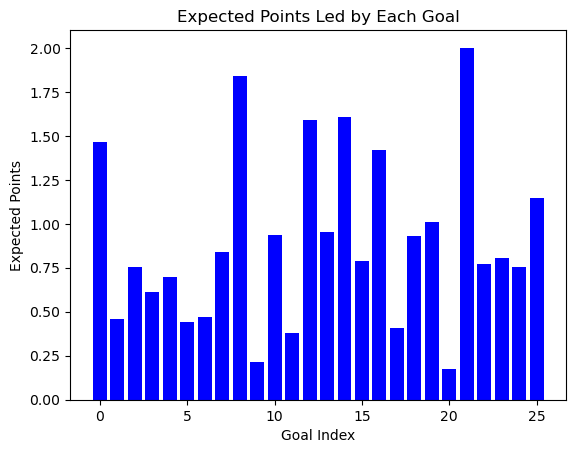

Jonjo Shelvey


100%|██████████████████████████████████████████████████████████████████████████████████| 23/23 [01:07<00:00,  2.94s/it]


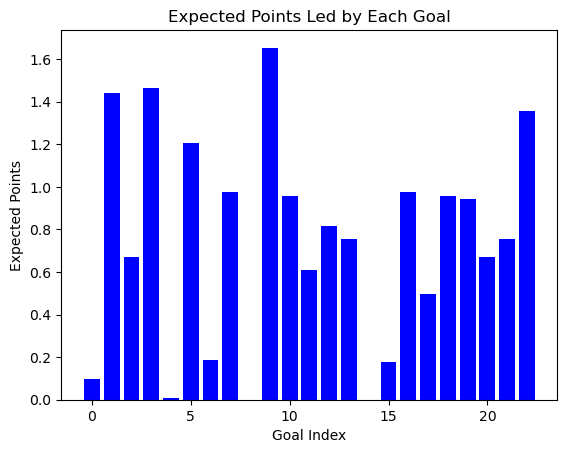

Michu


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:59<00:00,  3.71s/it]


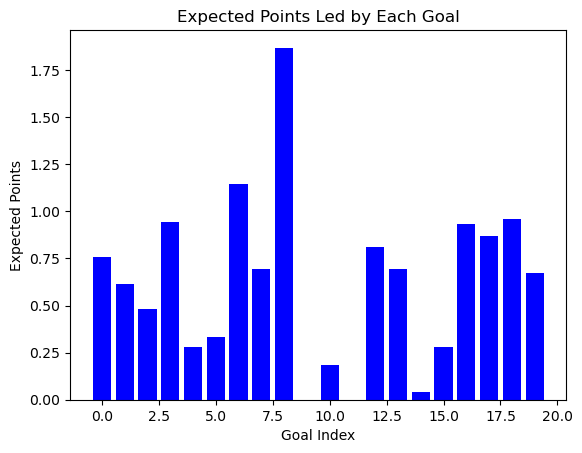

Robert Snodgrass


100%|██████████████████████████████████████████████████████████████████████████████████| 25/25 [01:17<00:00,  3.10s/it]


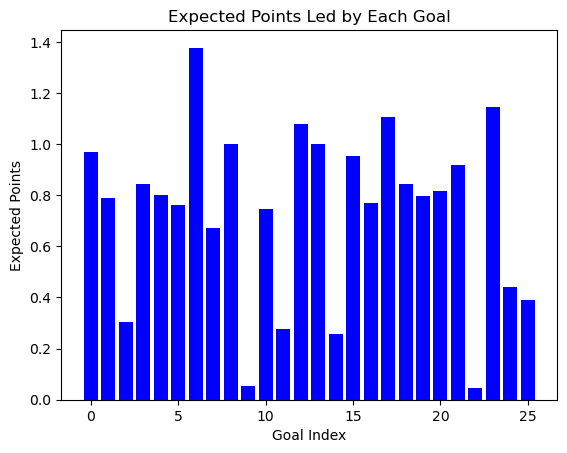

Santi Cazorla


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:13<00:00,  3.68s/it]


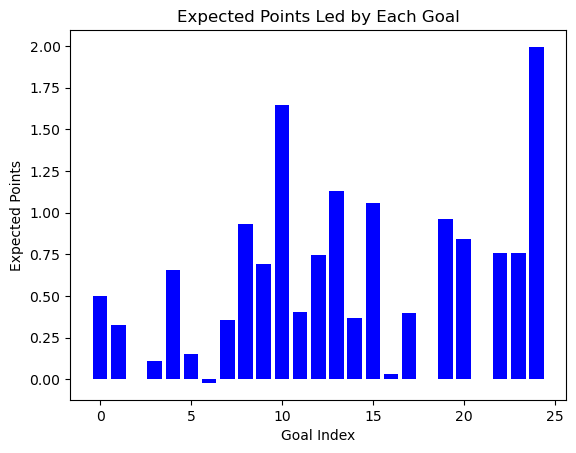

Kevin Mirallas


100%|██████████████████████████████████████████████████████████████████████████████████| 28/28 [01:25<00:00,  3.05s/it]


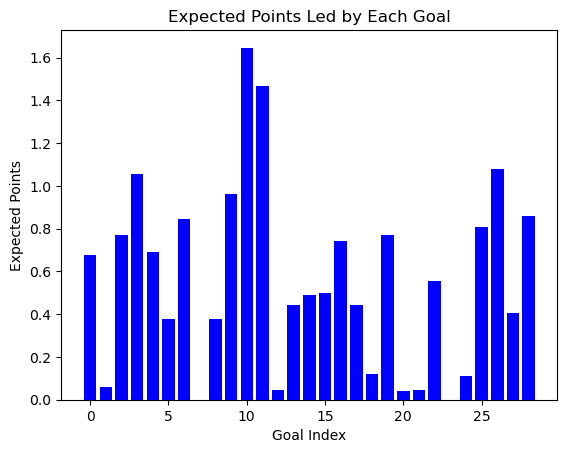

Oscar


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [01:01<00:00,  3.26s/it]


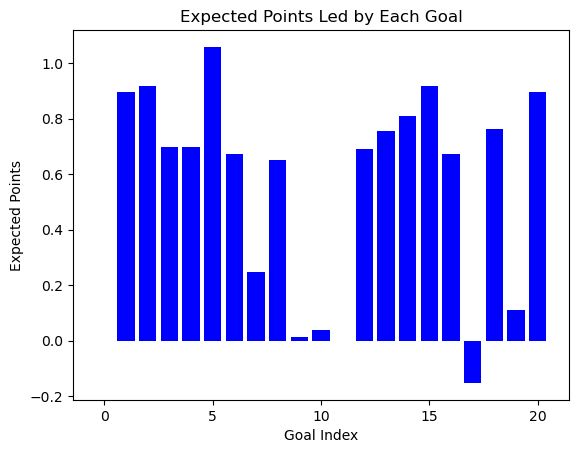

Loïc Rémy


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [01:22<00:00,  3.42s/it]


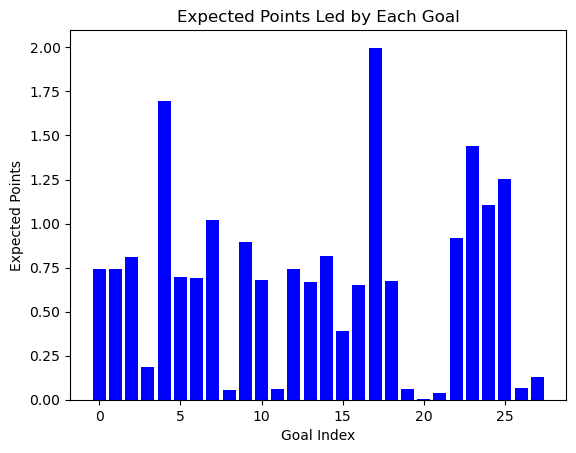

Andros Townsend


100%|██████████████████████████████████████████████████████████████████████████████████| 25/25 [01:13<00:00,  2.95s/it]


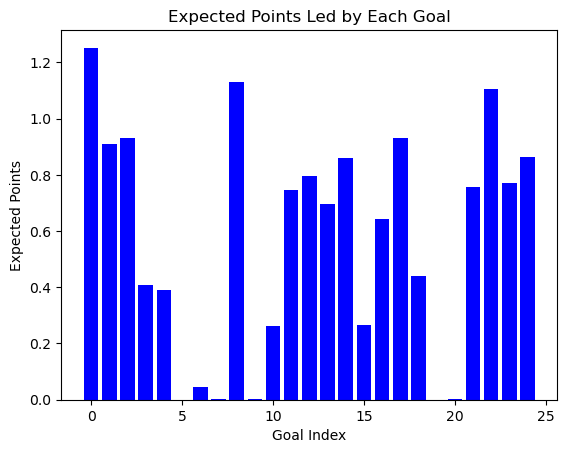

Ross Barkley


100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [01:26<00:00,  3.22s/it]


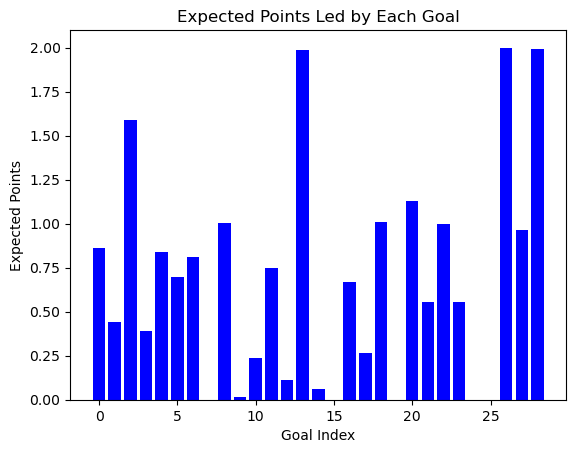

Dwight Gayle


100%|██████████████████████████████████████████████████████████████████████████████████| 21/21 [01:21<00:00,  3.88s/it]


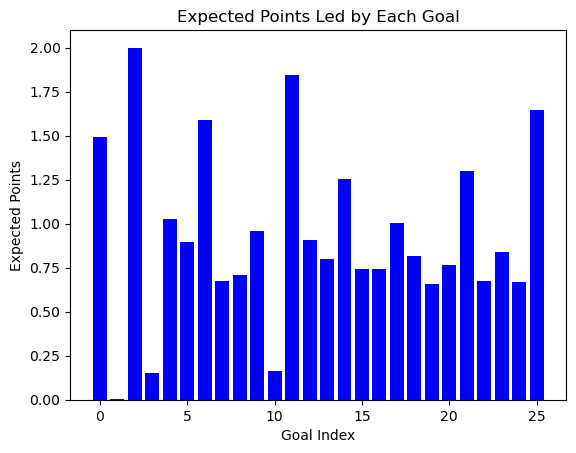

Nathan Redmond


100%|██████████████████████████████████████████████████████████████████████████████████| 26/26 [01:22<00:00,  3.16s/it]


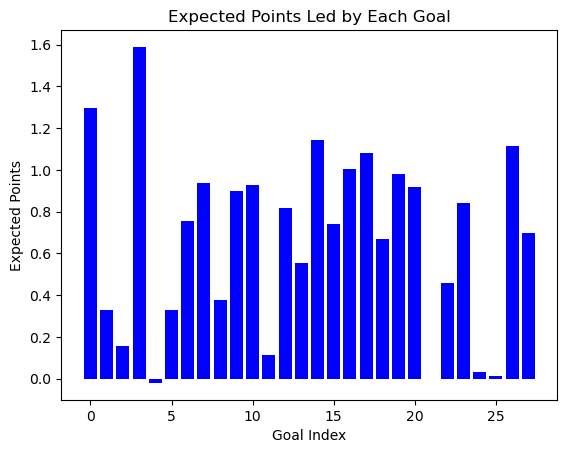

Saido Berahino


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:06<00:00,  3.34s/it]


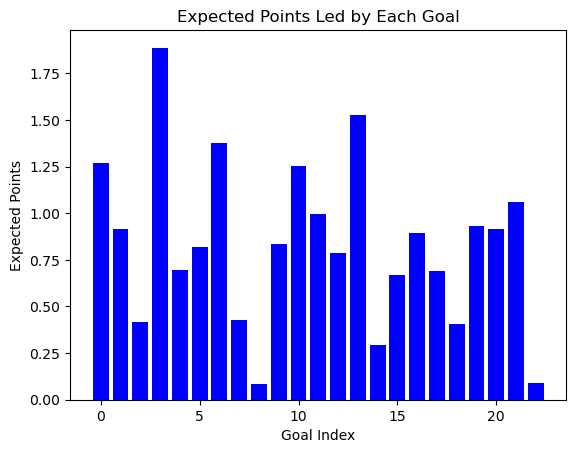

Gerard Deulofeu


100%|██████████████████████████████████████████████████████████████████████████████████| 17/17 [01:00<00:00,  3.56s/it]


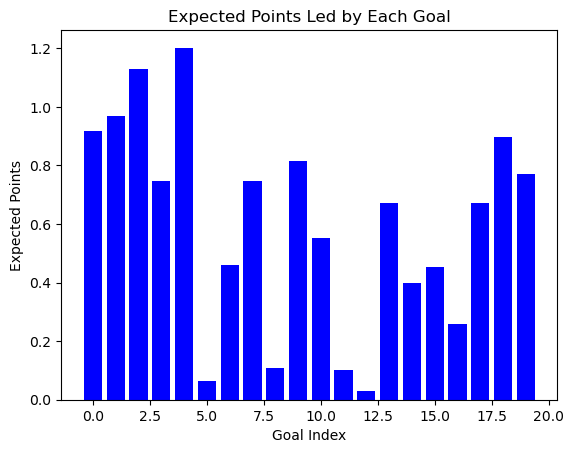

Fernandinho


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [00:59<00:00,  3.14s/it]


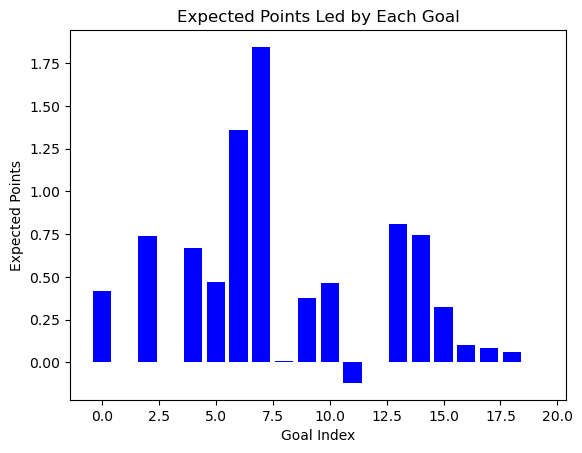

Nacer Chadli


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [01:02<00:00,  3.29s/it]


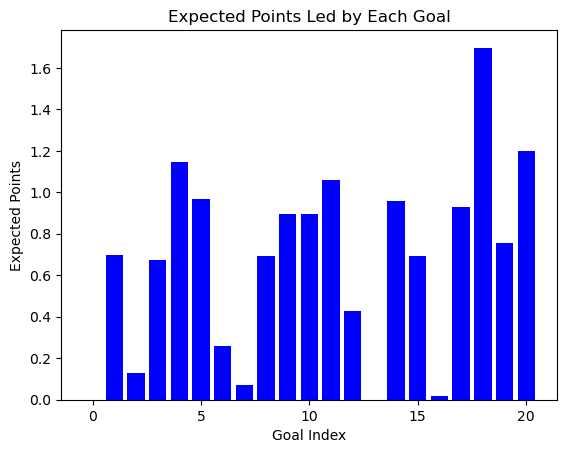

Graziano Pellè


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [01:09<00:00,  3.86s/it]


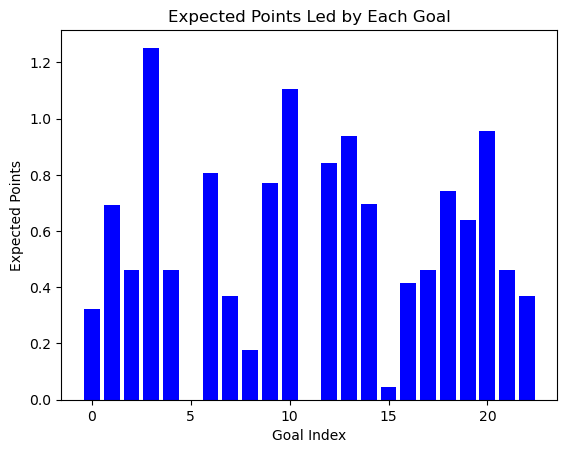

Craig Dawson


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [00:59<00:00,  3.15s/it]


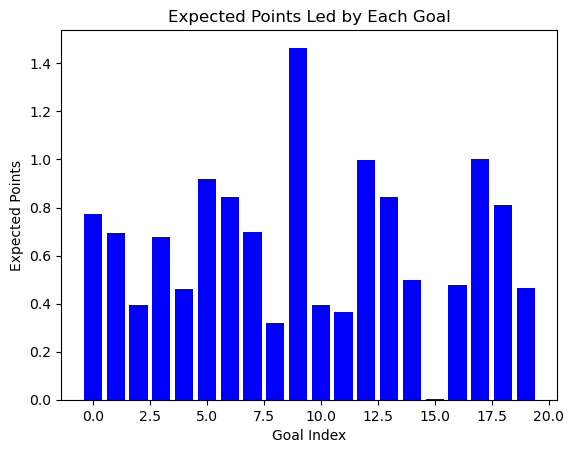

Jeffrey Schlupp


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:00<00:00,  3.03s/it]


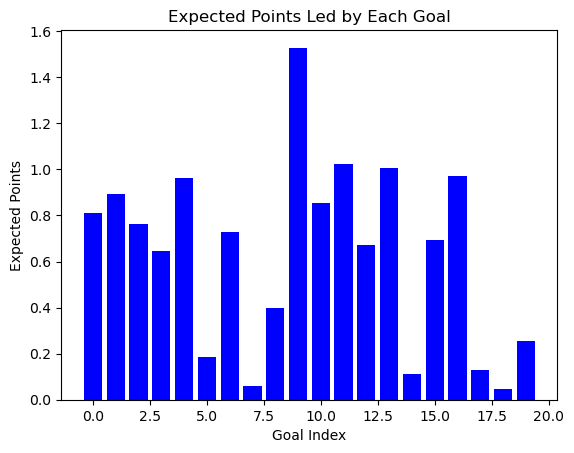

Dusan Tadic


100%|██████████████████████████████████████████████████████████████████████████████████| 17/17 [01:00<00:00,  3.54s/it]


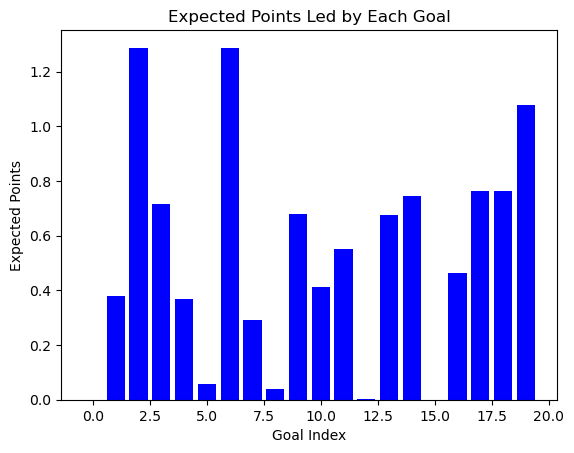

André Ayew


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:03<00:00,  3.15s/it]


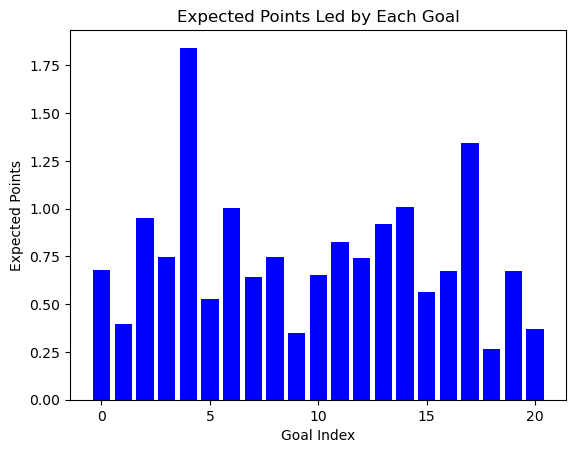

Georginio Wijnaldum


100%|██████████████████████████████████████████████████████████████████████████████████| 23/23 [01:19<00:00,  3.46s/it]


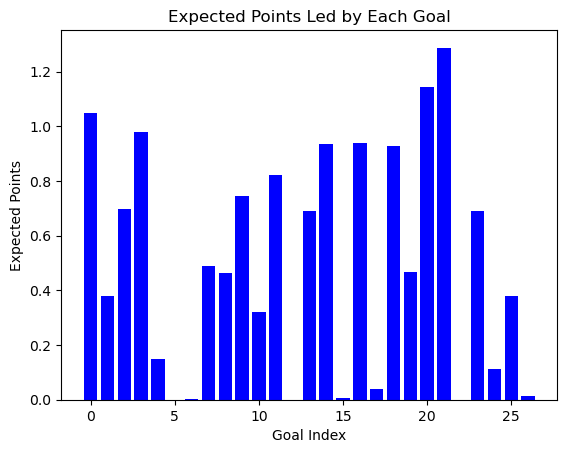

Pedro


100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [01:26<00:00,  3.22s/it]


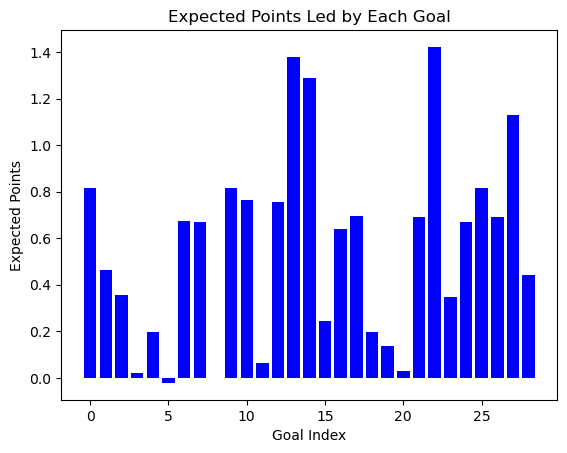

Manuel Lanzini


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [01:18<00:00,  3.26s/it]


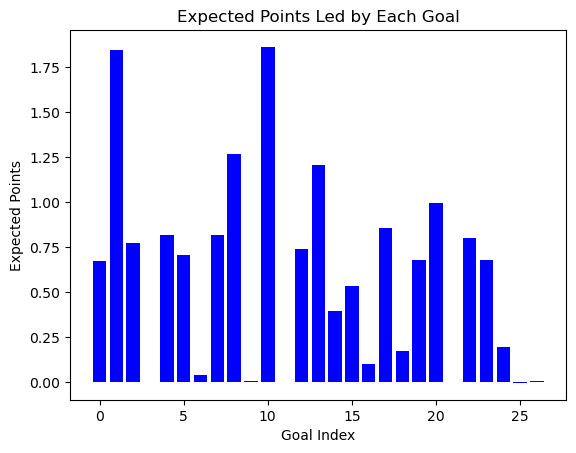

Jack Grealish


100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [01:08<00:00,  3.11s/it]


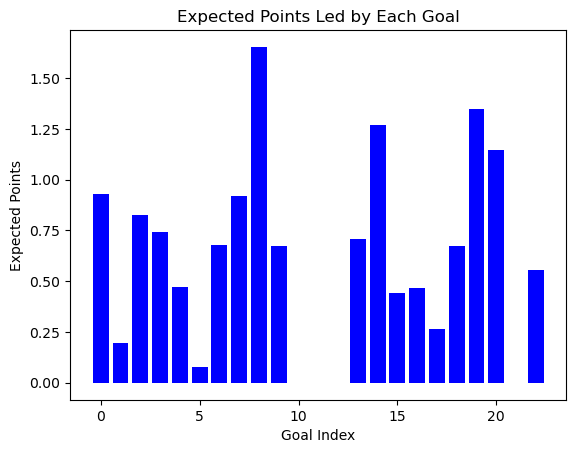

Virgil van Dijk


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [01:00<00:00,  3.35s/it]


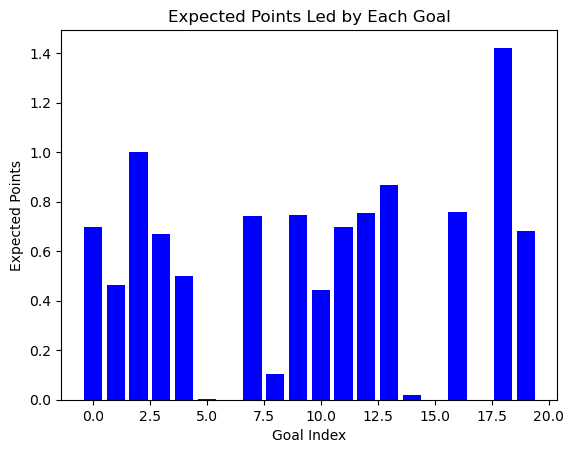

Jesse Lingard


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [01:25<00:00,  3.56s/it]


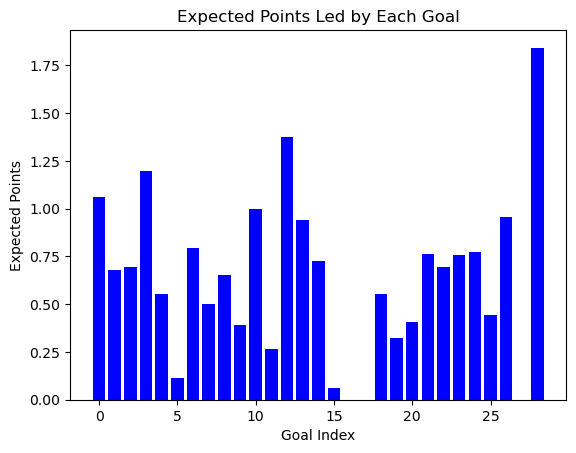

Patrick van Aanholt


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [00:58<00:00,  2.92s/it]


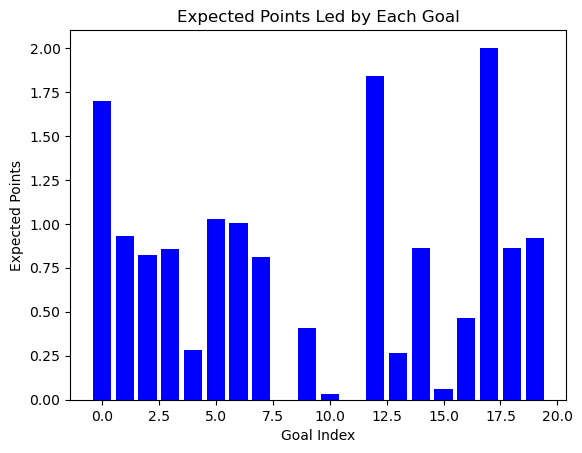

Divock Origi


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:04<00:00,  3.24s/it]


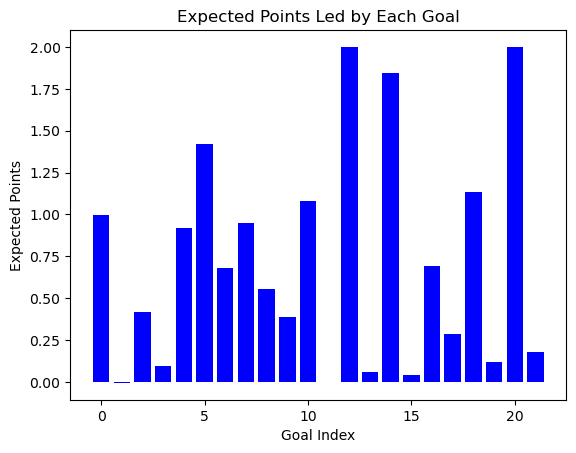

Xherdan Shaqiri


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [01:08<00:00,  3.59s/it]


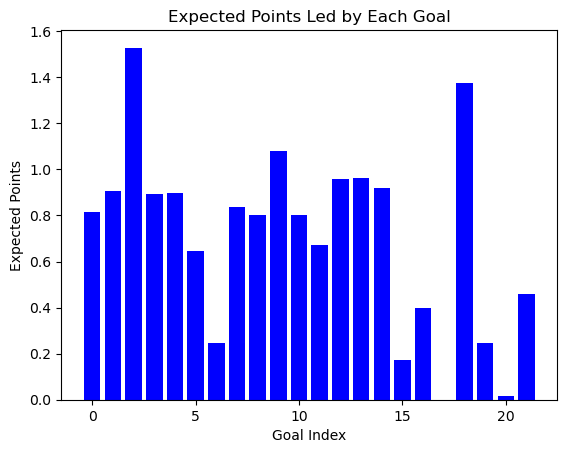

Paul Pogba


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [01:27<00:00,  3.64s/it]


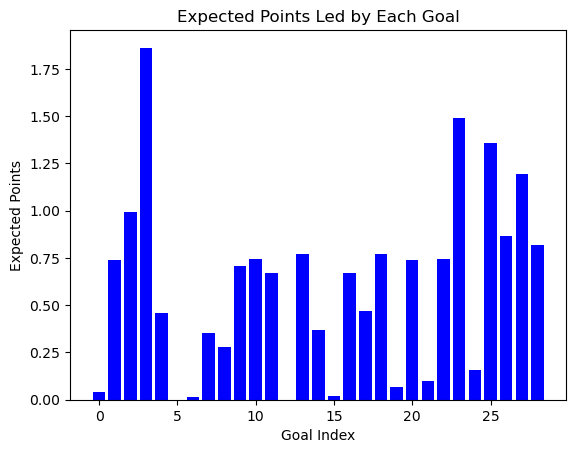

Leroy Sané


100%|██████████████████████████████████████████████████████████████████████████████████| 23/23 [01:14<00:00,  3.25s/it]


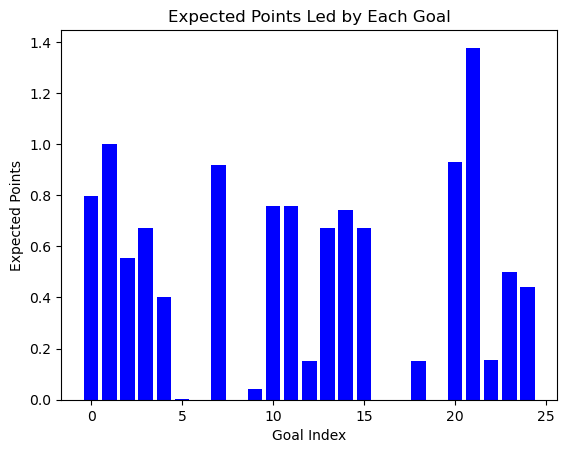

Andre Gray


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:08<00:00,  3.42s/it]


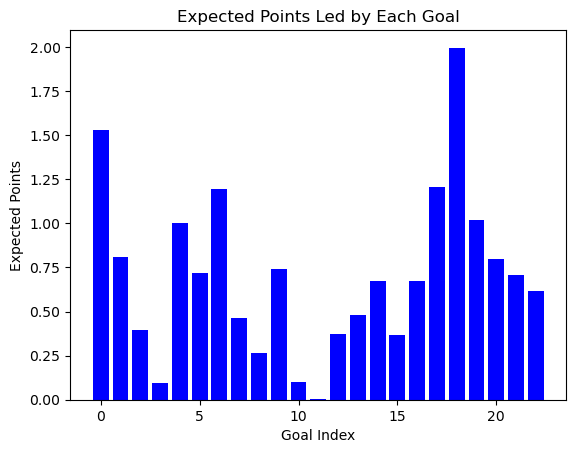

Abdoulaye Doucouré


100%|██████████████████████████████████████████████████████████████████████████████████| 25/25 [01:16<00:00,  3.06s/it]


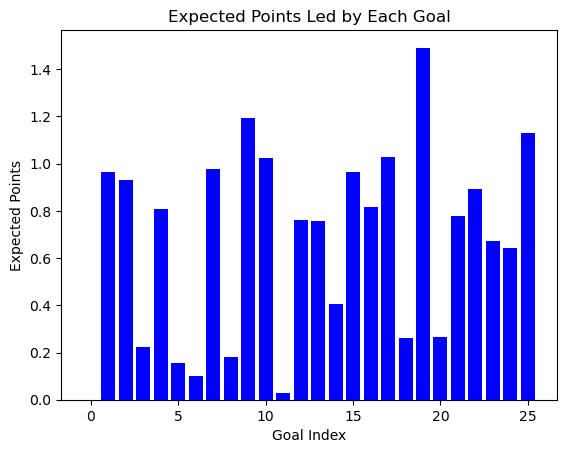

Luka Milivojevic


100%|██████████████████████████████████████████████████████████████████████████████████| 27/27 [01:21<00:00,  3.02s/it]


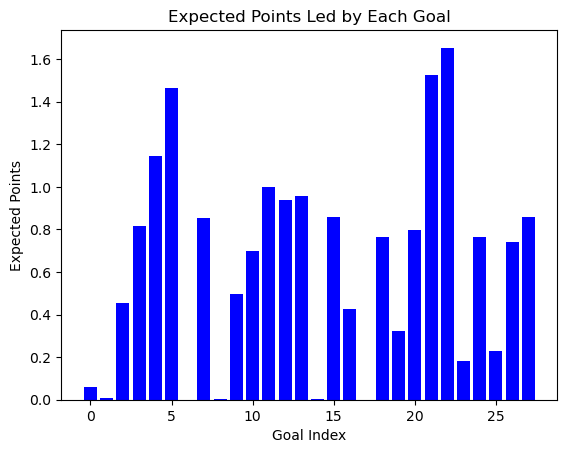

Patrick Bamford


100%|██████████████████████████████████████████████████████████████████████████████████| 22/22 [01:10<00:00,  3.21s/it]


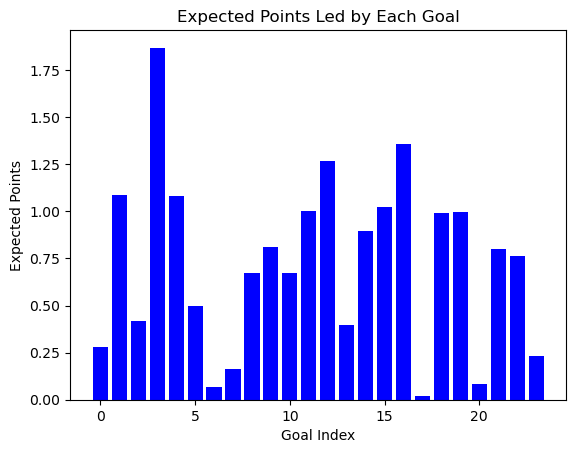

Tammy Abraham


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:16<00:00,  3.85s/it]


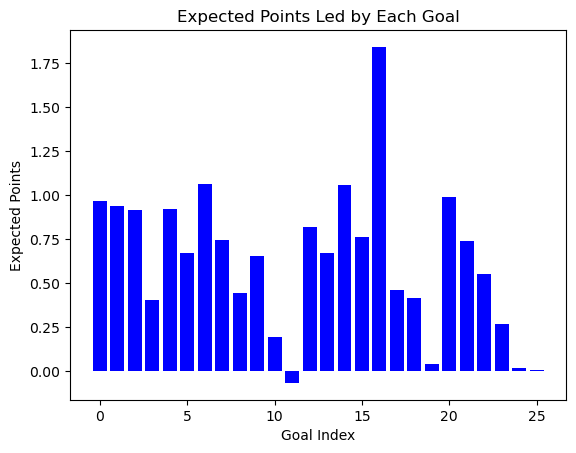

Pascal Groß


100%|██████████████████████████████████████████████████████████████████████████████████| 23/23 [01:19<00:00,  3.47s/it]


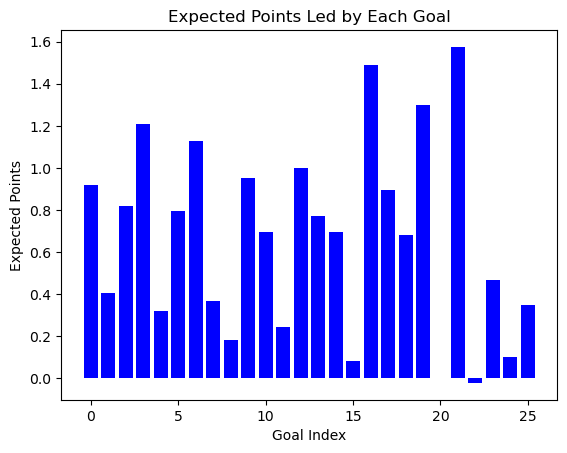

Jorginho


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [01:00<00:00,  3.38s/it]


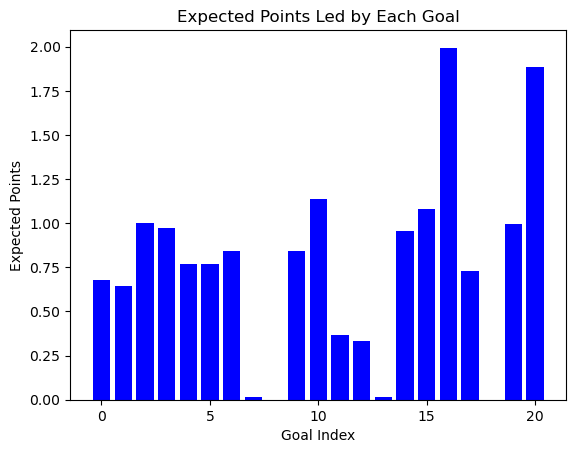

Rúben Neves


100%|██████████████████████████████████████████████████████████████████████████████████| 21/21 [01:04<00:00,  3.05s/it]


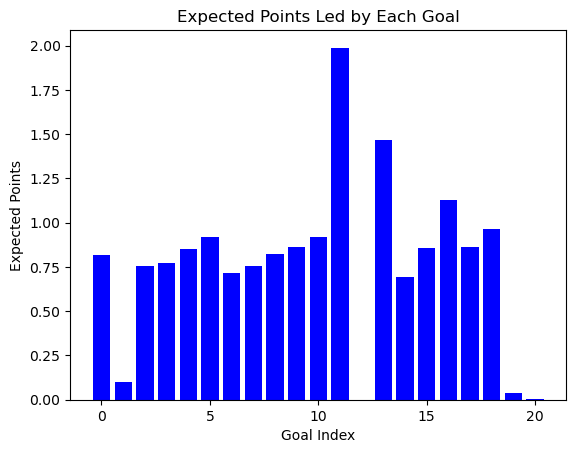

Lucas Moura


100%|██████████████████████████████████████████████████████████████████████████████████| 17/17 [00:57<00:00,  3.40s/it]


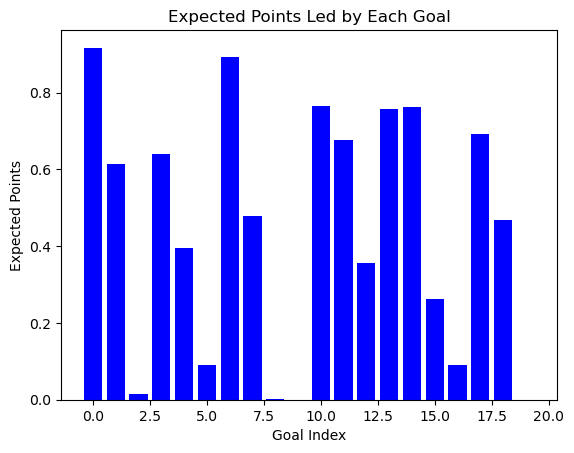

Youri Tielemans


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [01:01<00:00,  3.23s/it]


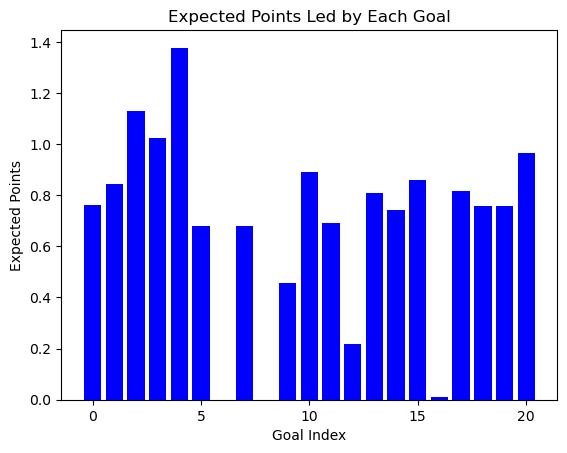

Teemu Pukki


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:04<00:00,  3.23s/it]


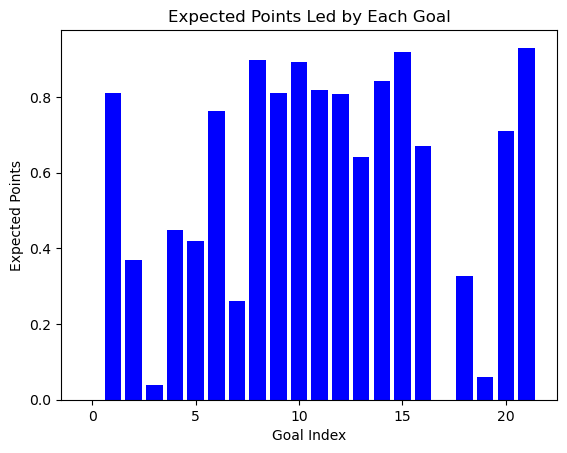

Neal Maupay


100%|██████████████████████████████████████████████████████████████████████████████████| 26/26 [01:20<00:00,  3.10s/it]


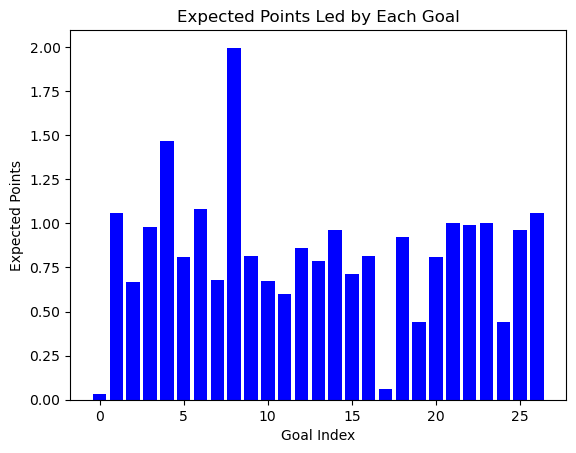

Leandro Trossard


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [01:18<00:00,  3.27s/it]


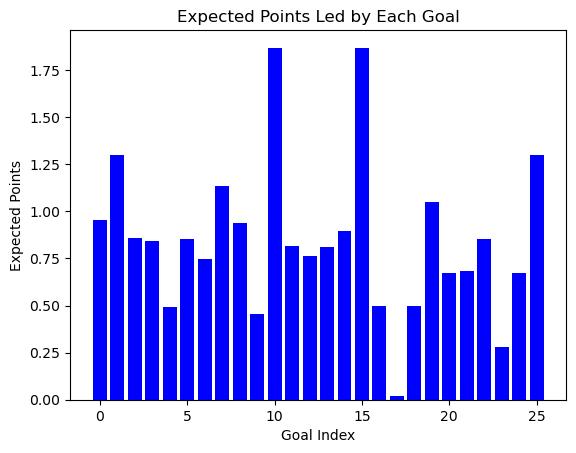

Mason Mount


100%|██████████████████████████████████████████████████████████████████████████████████| 23/23 [01:19<00:00,  3.46s/it]


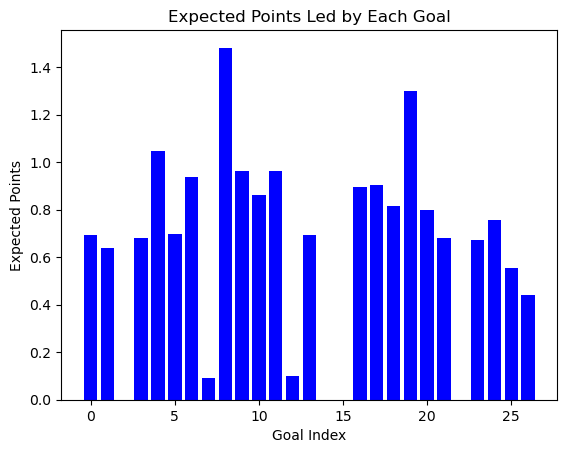

Christian Pulisic


100%|██████████████████████████████████████████████████████████████████████████████████| 17/17 [00:58<00:00,  3.46s/it]


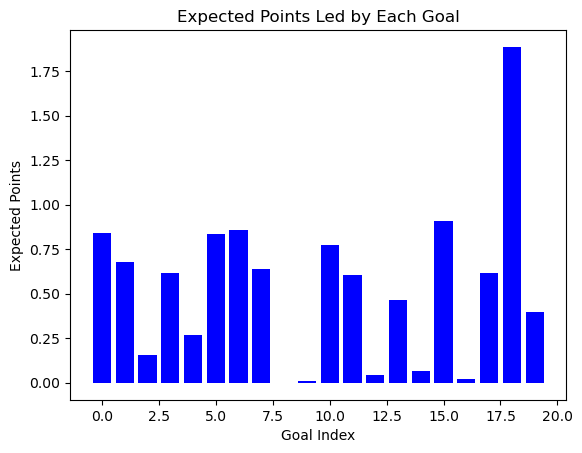

Mason Greenwood


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:04<00:00,  3.22s/it]


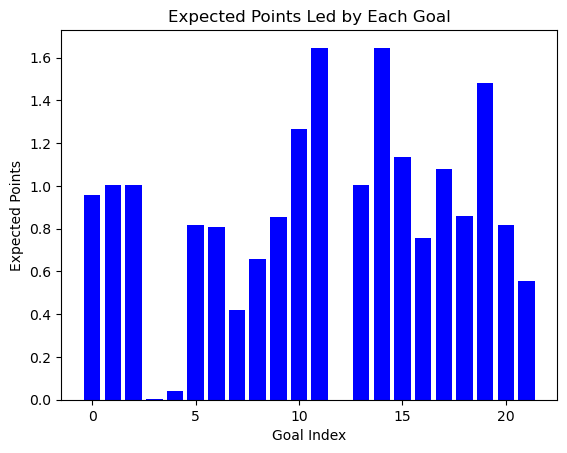

Gabriel Martinelli


100%|██████████████████████████████████████████████████████████████████████████████████| 24/24 [01:17<00:00,  3.24s/it]


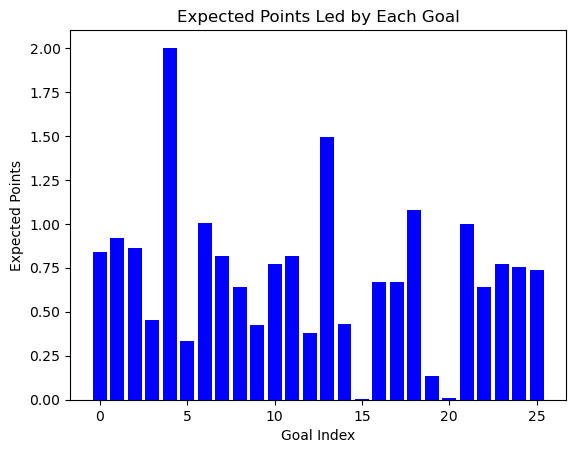

Miguel Almirón


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:59<00:00,  3.31s/it]


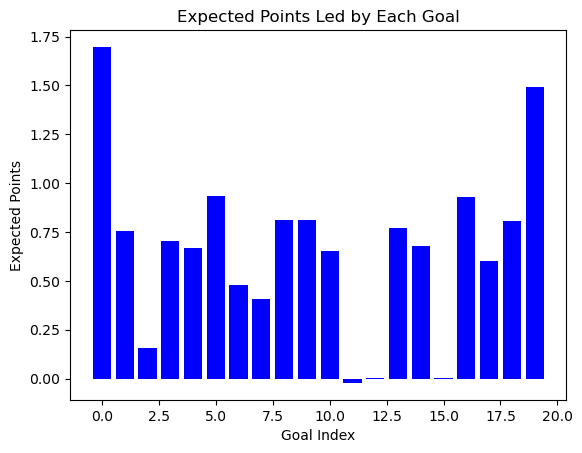

Jarrod Bowen


100%|██████████████████████████████████████████████████████████████████████████████████| 23/23 [01:20<00:00,  3.51s/it]


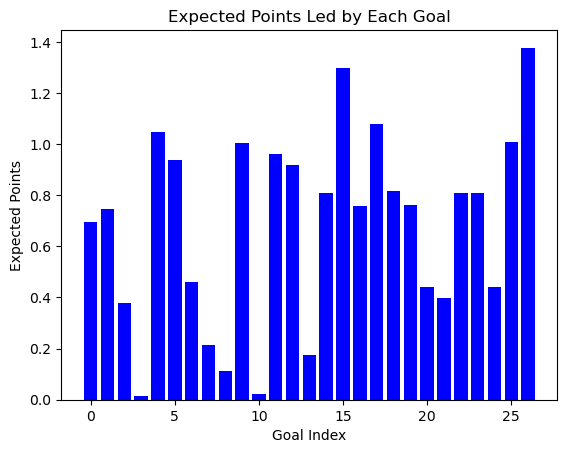

Tomás Soucek


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [01:00<00:00,  3.18s/it]


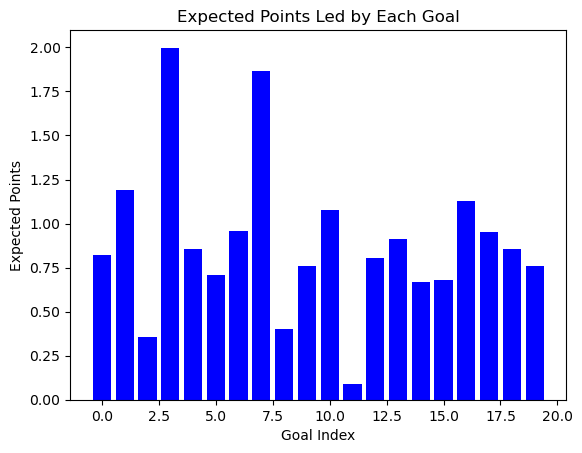

Ché Adams


100%|██████████████████████████████████████████████████████████████████████████████████| 23/23 [01:15<00:00,  3.30s/it]


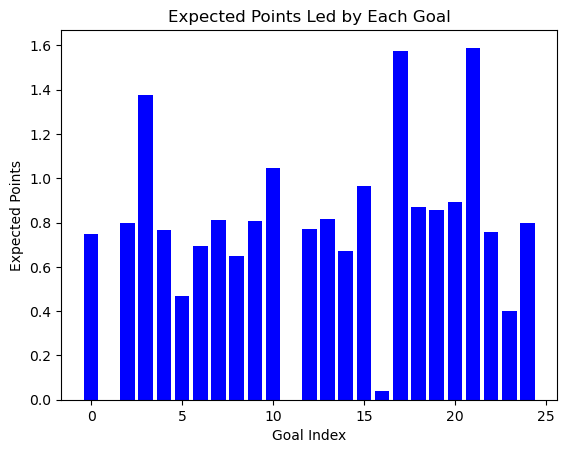

Jack Harrison


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [01:01<00:00,  3.25s/it]


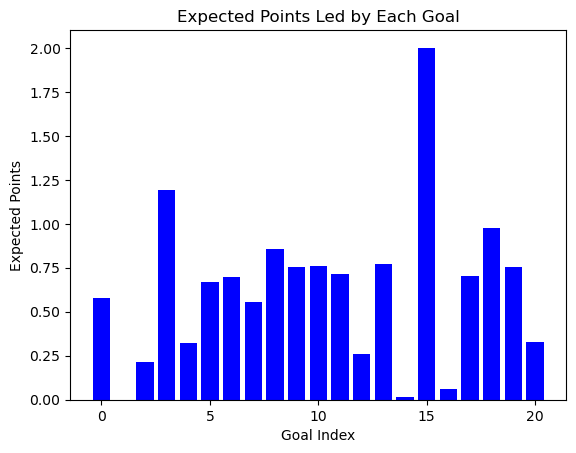

Martin Ødegaard


100%|██████████████████████████████████████████████████████████████████████████████████| 20/20 [01:08<00:00,  3.41s/it]


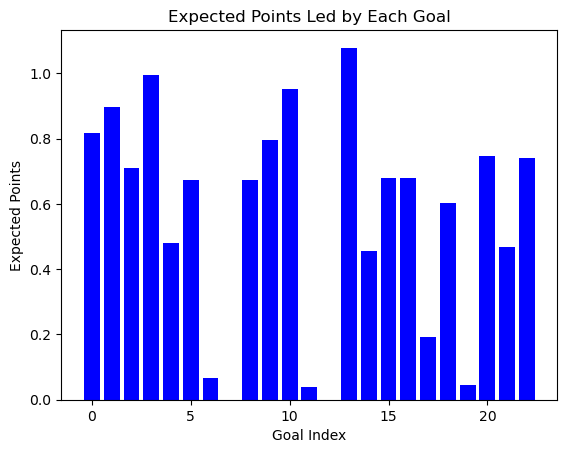

In [46]:
import csv
scr_over_20_points_dict={}
for k,v in scr_over_20_dict.items():
    print(k)
    lst = cal_exp_win_goal_without_print(k)
    scr_over_20_points_dict[k] = lst[k]

    with open('scr_over_20.csv','w',encoding='utf-8') as f:
        w = csv.writer(f)
        for k1,v1 in scr_over_20_points_dict.items():
            w.writerow([k1,v1])

In [5]:
scr_over_10_dict = {}
for k,v in all_player_scr_dict.items():
    if int(v) >= 10  and (int(v) < 20):
        scr_over_10_dict[k] = v

In [6]:
scr_over_10_dict

{'David Phillips': 10,
 'Mick Harford': 19,
 'John Williams': 11,
 'Paul Wilkinson': 13,
 'Gareth Southgate': 17,
 'Stuart Ripley': 14,
 'Warren Barton': 10,
 'Andy Sinton': 16,
 'Mark Walters': 11,
 'Graeme Sharp': 16,
 'Denis Irwin': 18,
 'John Hendrie': 11,
 'Neil Adams': 12,
 'Gunnar Halle': 10,
 'Simon Barker': 15,
 'Vinnie Jones': 13,
 'Steve Sedgley': 13,
 'Andy Impey': 12,
 'Mark Atkins': 12,
 'Garry Parker': 19,
 'John Wark': 13,
 'Ian Olney': 13,
 'Steve Staunton': 13,
 'Steve Bruce': 11,
 'Andy Townsend': 13,
 'Brian McClair': 18,
 'Paul Warhurst': 13,
 'Graham Hyde': 11,
 'Adrian Littlejohn': 11,
 'Ronny Rosenthal': 10,
 'Gary Penrice': 17,
 'Dane Whitehouse': 10,
 'Neal Ardley': 12,
 'Roy Wegerle': 13,
 'Andy Clarke': 11,
 'Peter Beagrie': 17,
 'Carlton Palmer': 15,
 'Robbie Mustoe': 10,
 'Mike Sheron': 18,
 'Neil Ruddock': 16,
 'Darren Beckford': 10,
 'Neil Maddison': 17,
 'Craig Hignett': 19,
 'Stuart Barlow': 10,
 'Kenneth Monkou': 10,
 'Ian Woan': 17,
 'Chris Waddle': 

In [8]:
import csv
scr_over_10_points_dict={}
for k,v in scr_over_10_dict.items():
    print(k)
    lst = cal_exp_win_goal_without_print(k)
    scr_over_10_points_dict[k] = lst[k]

    with open('scr_over_10.csv','w',encoding='utf-8') as f:
        w = csv.writer(f)
        for k1,v1 in scr_over_10_points_dict.items():
            w.writerow([k1,v1])

David Phillips


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:34<00:00,  3.48s/it]


Mick Harford


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [01:02<00:00,  3.46s/it]


John Williams


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:31<00:00,  3.14s/it]


Paul Wilkinson


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.02s/it]


Gareth Southgate


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:48<00:00,  3.00s/it]


Stuart Ripley


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:40<00:00,  2.90s/it]


Warren Barton


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:28<00:00,  2.82s/it]


Andy Sinton


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:45<00:00,  3.50s/it]


Mark Walters


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:31<00:00,  3.88s/it]


Graeme Sharp


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:44<00:00,  2.80s/it]


Denis Irwin


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:50<00:00,  2.82s/it]


John Hendrie


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:31<00:00,  3.52s/it]


Neil Adams


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:33<00:00,  3.08s/it]


Gunnar Halle


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:28<00:00,  2.84s/it]


Simon Barker


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:42<00:00,  3.05s/it]


Vinnie Jones


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:38<00:00,  2.94s/it]


Steve Sedgley


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:39<00:00,  3.29s/it]


Andy Impey


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:34<00:00,  3.14s/it]


Mark Atkins


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:34<00:00,  2.84s/it]


Garry Parker


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:54<00:00,  3.03s/it]


John Wark


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:37<00:00,  3.40s/it]


Ian Olney


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:37<00:00,  3.72s/it]


Steve Staunton


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:37<00:00,  2.89s/it]


Steve Bruce


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:32<00:00,  3.21s/it]


Andy Townsend


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:37<00:00,  2.86s/it]


Brian McClair


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:50<00:00,  3.34s/it]


Paul Warhurst


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:36<00:00,  2.81s/it]


Graham Hyde


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:32<00:00,  2.93s/it]


Adrian Littlejohn


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:31<00:00,  3.14s/it]


Ronny Rosenthal


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:28<00:00,  3.13s/it]


Gary Penrice


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.19s/it]


Dane Whitehouse


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:28<00:00,  3.17s/it]


Neal Ardley


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:33<00:00,  3.04s/it]


Roy Wegerle


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.04s/it]


Andy Clarke


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:30<00:00,  2.81s/it]


Peter Beagrie


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:49<00:00,  3.32s/it]


Carlton Palmer


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:42<00:00,  2.84s/it]


Robbie Mustoe


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:27<00:00,  2.79s/it]


Mike Sheron


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:50<00:00,  3.16s/it]


Neil Ruddock


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.04s/it]


Darren Beckford


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:28<00:00,  2.87s/it]


Neil Maddison


100%|██████████████████████████████████████████████████████████████████████████████████| 17/17 [00:48<00:00,  2.85s/it]


Craig Hignett


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:53<00:00,  2.99s/it]


Stuart Barlow


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:28<00:00,  3.13s/it]


Kenneth Monkou


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:28<00:00,  2.84s/it]


Ian Woan


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:48<00:00,  3.04s/it]


Chris Waddle


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:31<00:00,  2.89s/it]


Andy Hinchcliffe


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:30<00:00,  2.81s/it]


David Wetherall


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:42<00:00,  2.84s/it]


Gavin Peacock


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:48<00:00,  3.20s/it]


John Moncur


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:27<00:00,  2.79s/it]


Trevor Morley


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.05s/it]


Lee Clark


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:36<00:00,  2.83s/it]


Graeme Le Saux


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:33<00:00,  2.81s/it]


Craig Burley


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.05s/it]


Martin Allen


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:28<00:00,  2.81s/it]


Paul Walsh


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:44<00:00,  3.42s/it]


Graham Fenton


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.35s/it]


Ian Pearce


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:30<00:00,  2.81s/it]


Paul Furlong


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.13s/it]


Robbie Elliott


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:28<00:00,  2.87s/it]


Kevin Gallen


100%|██████████████████████████████████████████████████████████████████████████████████| 17/17 [00:50<00:00,  2.99s/it]


Colin Cooper


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:36<00:00,  2.81s/it]


Lars Bohinen


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:39<00:00,  3.04s/it]


Daniel Amokachi


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:28<00:00,  3.18s/it]


Tony Adams


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:34<00:00,  2.86s/it]


Ugo Ehiogu


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [00:54<00:00,  2.87s/it]


Mark Draper


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:37<00:00,  3.09s/it]


Steve Lomas


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:39<00:00,  2.81s/it]


Keith Gillespie


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:48<00:00,  3.26s/it]


Danny Dichio


100%|██████████████████████████████████████████████████████████████████████████████████| 17/17 [00:53<00:00,  3.16s/it]


Jim Magilton


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:42<00:00,  2.86s/it]


Steve Howey


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:34<00:00,  2.86s/it]


Alf Inge Haaland


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:51<00:00,  3.20s/it]


Jon Goodman


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:30<00:00,  3.44s/it]


Michael Hughes


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:42<00:00,  2.86s/it]


Tommy Johnson


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.30s/it]


Jason Lee


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:34<00:00,  3.09s/it]


Alan Thompson


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:39<00:00,  3.02s/it]


David Platt


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:37<00:00,  2.86s/it]


Mark Pembridge


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.18s/it]


Alan Stubbs


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:31<00:00,  3.16s/it]


Roberto Di Matteo


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:43<00:00,  2.93s/it]


Frank Leboeuf


100%|██████████████████████████████████████████████████████████████████████████████████| 17/17 [01:03<00:00,  3.72s/it]


Steve Claridge


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:32<00:00,  2.93s/it]


Matt Oakley


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:42<00:00,  2.85s/it]


Allan Nielsen


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:34<00:00,  2.86s/it]


Alex Rae


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:34<00:00,  2.88s/it]


Eyal Berkovic


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:48<00:00,  3.01s/it]


Mikkel Beck


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:35<00:00,  3.23s/it]


Rio Ferdinand


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:31<00:00,  2.88s/it]


Neil Redfearn


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:39<00:00,  3.06s/it]


Karl-Heinz Riedle


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:30<00:00,  3.43s/it]


Francesco Baiano


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:45<00:00,  3.47s/it]


Danny Cadamarteri


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.08s/it]


Lee Carsley


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:45<00:00,  2.85s/it]


Hermann Hreidarsson


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:39<00:00,  2.85s/it]


Matt Jansen


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:54<00:00,  3.01s/it]


David Thompson


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:42<00:00,  2.84s/it]


Emmanuel Petit


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:31<00:00,  2.83s/it]


George Boateng


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:48<00:00,  3.05s/it]


Nikolaos Dabizas


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:28<00:00,  2.88s/it]


Clinton Morrison


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:43<00:00,  3.09s/it]


Andy Hunt


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:28<00:00,  3.52s/it]


Dougie Freedman


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:28<00:00,  2.84s/it]


Niclas Alexandersson


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:34<00:00,  3.18s/it]


Hassan Kachloul


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:45<00:00,  3.51s/it]


John Aloisi


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:28<00:00,  3.19s/it]


Dietmar Hamann


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:34<00:00,  3.12s/it]


Alun Armstrong


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:37<00:00,  3.40s/it]


Christian Ziege


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:39<00:00,  2.81s/it]


Davor Suker


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:28<00:00,  4.01s/it]


Gavin McCann


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:34<00:00,  2.87s/it]


Mustapha Hadji


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:39<00:00,  3.04s/it]


Gilles De Bilde


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:28<00:00,  3.55s/it]


Dean Windass


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:49<00:00,  3.28s/it]


Robbie Blake


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:31<00:00,  2.84s/it]


Marc Vivien Foe


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:28<00:00,  4.00s/it]


Branko Strupar


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:41<00:00,  3.48s/it]


Vladimir Smicer


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:27<00:00,  2.79s/it]


Jo Tessem


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:33<00:00,  2.83s/it]


Kevin Kilbane


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:42<00:00,  2.83s/it]


Joseph-Desire Job


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:54<00:00,  3.63s/it]


Thomas Gravesen


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:31<00:00,  3.16s/it]


Titus Bramble


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:28<00:00,  2.84s/it]


Serhiy Rebrov


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:28<00:00,  3.60s/it]


Ade Akinbiyi


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:30<00:00,  2.80s/it]


Ashley Cole


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:42<00:00,  2.82s/it]


James Scowcroft


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:39<00:00,  3.07s/it]


Matt Holland


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:48<00:00,  3.03s/it]


Ledley King


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:27<00:00,  2.77s/it]


Shaun Goater


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.08s/it]


Boudewijn Zenden


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [00:54<00:00,  2.85s/it]


Barry Hayles


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.35s/it]


Kevin Lisbie


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:40<00:00,  3.64s/it]


Tugay


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:28<00:00,  2.83s/it]


Franck Queudrue


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:34<00:00,  3.10s/it]


Steve Marlet


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:30<00:00,  2.82s/it]


Ricardo Gardner


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:28<00:00,  2.83s/it]


Brett Ormerod


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:33<00:00,  3.40s/it]


Youri Djorkaeff


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:54<00:00,  3.38s/it]


Thomas Hitzlsperger


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:28<00:00,  2.87s/it]


Massimo Maccarone


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:51<00:00,  3.42s/it]


Stern John


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:28<00:00,  3.19s/it]


Kolo Touré


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:33<00:00,  2.82s/it]


Ivan Campo


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:37<00:00,  2.87s/it]


Geoff Horsfield


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:33<00:00,  3.37s/it]


Geremi


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:34<00:00,  2.89s/it]


Diego Forlán


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:28<00:00,  3.59s/it]


Jay Jay Okocha


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:39<00:00,  3.07s/it]


Bryan Hughes


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:28<00:00,  3.19s/it]


Jermaine Pennant


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:39<00:00,  3.33s/it]


Glen Johnson


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:42<00:00,  2.86s/it]


Gilberto Silva


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:59<00:00,  3.69s/it]


Jon Stead


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:39<00:00,  2.84s/it]


José Antonio Reyes


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.05s/it]


Brett Emerton


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:37<00:00,  2.90s/it]


Antoine Sibierski


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:50<00:00,  2.83s/it]


Darren Ambrose


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:31<00:00,  2.88s/it]


Gary O'Neil


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:45<00:00,  3.28s/it]


John O'Shea


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:38<00:00,  2.98s/it]


David Bentley


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:51<00:00,  3.46s/it]


Zoltán Gera


100%|██████████████████████████████████████████████████████████████████████████████████| 17/17 [00:49<00:00,  2.92s/it]


Luis Garcia


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:57<00:00,  3.18s/it]


Ricardo Fuller


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [00:57<00:00,  3.01s/it]


Xabi Alonso


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:40<00:00,  3.08s/it]


Damien Francis


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:31<00:00,  3.15s/it]


Diomansy Kamara


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:49<00:00,  3.30s/it]


Arjen Robben


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:46<00:00,  3.08s/it]


Robert Earnshaw


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:39<00:00,  3.99s/it]


Jerome Thomas


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:32<00:00,  3.25s/it]


!Richard Dunne


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:31<00:00,  3.12s/it]


Danny Graham


100%|██████████████████████████████████████████████████████████████████████████████████| 17/17 [00:51<00:00,  3.06s/it]


Richard Dunne


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:31<00:00,  2.84s/it]


Steven Davis


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:48<00:00,  3.02s/it]


Mathieu Flamini


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:29<00:00,  2.94s/it]


Nigel Reo-Coker


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:29<00:00,  2.91s/it]


Jimmy Bullard


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:57<00:00,  4.09s/it]


Liam Ridgewell


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:58<00:00,  3.87s/it]


Abdoulaye Diagne-Faye


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:34<00:00,  3.42s/it]


James Collins


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:38<00:00,  3.53s/it]


Michael Essien


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.19s/it]


Abou Diaby


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:38<00:00,  2.99s/it]


Park Ji-Sung


100%|██████████████████████████████████████████████████████████████████████████████████| 17/17 [00:52<00:00,  3.10s/it]


Dave Kitson


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:42<00:00,  3.00s/it]


Leroy Lita


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:28<00:00,  3.14s/it]


Marlon King


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:33<00:00,  3.06s/it]


Phil Jagielka


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:49<00:00,  2.76s/it]


Nemanja Vidic


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:42<00:00,  2.82s/it]


Michael Ballack


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:48<00:00,  3.01s/it]


Michael Dawson


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:31<00:00,  2.82s/it]


Steven Taylor


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:33<00:00,  2.80s/it]


Tom Huddlestone


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:33<00:00,  3.06s/it]


Stephen Ireland


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:53<00:00,  2.97s/it]


Matt Derbyshire


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:28<00:00,  2.83s/it]


Tomas Rosicky


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:53<00:00,  2.96s/it]


Christopher Samba


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:45<00:00,  2.83s/it]


Shaun Maloney


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:42<00:00,  3.04s/it]


Geovanni


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:39<00:00,  2.80s/it]


Younes Kaboul


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:33<00:00,  2.76s/it]


Ryan Babel


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:55<00:00,  3.47s/it]


Martin Petrov


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.02s/it]


Elano


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:39<00:00,  3.25s/it]


Afonso Alves


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:28<00:00,  4.05s/it]


Johan Elmander


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.33s/it]


Amr Zaki


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:28<00:00,  3.59s/it]


Brede Hangeland


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:28<00:00,  3.20s/it]


Robinho


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:38<00:00,  3.53s/it]


Vincent Kompany


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:50<00:00,  2.82s/it]


Fraizer Campbell


100%|██████████████████████████████████████████████████████████████████████████████████| 17/17 [00:50<00:00,  2.97s/it]


Emmerson Boyce


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:31<00:00,  3.11s/it]


Luka Modric


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:36<00:00,  2.84s/it]


Dan Gosling


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:50<00:00,  2.80s/it]


Marc-Antoine Fortuné


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:30<00:00,  3.38s/it]


David Nugent


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:39<00:00,  3.07s/it]


Ryan Shawcross


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:39<00:00,  2.82s/it]


David N'Gog


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:33<00:00,  2.81s/it]


Ben Watson


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:33<00:00,  2.82s/it]


James Tomkins


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:38<00:00,  2.78s/it]


Thomas Vermaelen


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.01s/it]


Scott Sinclair


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:35<00:00,  2.99s/it]


Steven Nzonzi


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:30<00:00,  2.81s/it]


Franco Di Santo


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:46<00:00,  3.58s/it]


Sylvan Ebanks-Blake


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:27<00:00,  3.09s/it]


Frédéric Piquionne


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:30<00:00,  2.76s/it]


Martin Skrtel


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:45<00:00,  3.22s/it]


Jordi Gómez


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:38<00:00,  3.49s/it]


James McCarthy


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.27s/it]


Mohamed Diamé


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:50<00:00,  2.79s/it]


Jack Rodwell


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:28<00:00,  3.12s/it]


Maxi Rodríguez


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:42<00:00,  4.20s/it]


Scott Dann


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:44<00:00,  2.80s/it]


Marouane Chamakh


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:41<00:00,  2.98s/it]


Mousa Dembélé


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:33<00:00,  3.07s/it]


DJ Campbell


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:39<00:00,  3.27s/it]


Asamoah Gyan


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:28<00:00,  3.16s/it]


Hatem Ben Arfa


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:36<00:00,  2.80s/it]


Matt Phillips


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:33<00:00,  2.81s/it]


Youssouf Mulumbu


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:33<00:00,  2.80s/it]


Ciaran Clark


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:42<00:00,  3.01s/it]


Tom Cleverley


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:39<00:00,  2.81s/it]


Leon Best


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:27<00:00,  3.91s/it]


Junior Hoilett


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.95s/it]


Ramires


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:55<00:00,  3.67s/it]


Aleksandar Kolarov


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:30<00:00,  2.77s/it]


David Luiz


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:38<00:00,  2.76s/it]


Wes Hoolahan


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:33<00:00,  2.79s/it]


Anthony Pilkington


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:38<00:00,  2.98s/it]


Nathan Dyer


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:49<00:00,  3.12s/it]


Chris Smalling


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:33<00:00,  3.02s/it]


Steve Morison


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:28<00:00,  2.81s/it]


Joe Allen


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.97s/it]


Connor Wickham


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:52<00:00,  3.50s/it]


Gareth McAuley


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:41<00:00,  2.79s/it]


Wayne Routledge


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.99s/it]


James McClean


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:31<00:00,  2.83s/it]


Pavel Pogrebnyak


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:31<00:00,  3.47s/it]


Andreas Weimann


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.14s/it]


Jonny Evans


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:38<00:00,  2.77s/it]


Adam Le Fondre


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:33<00:00,  3.73s/it]


Arouna Koné


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:47<00:00,  3.37s/it]


Lukas Podolski


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:52<00:00,  3.52s/it]


Morgan Schneiderlin


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.03s/it]


Hal Robson-Kanu


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:44<00:00,  3.44s/it]


Steven Naismith


100%|██████████████████████████████████████████████████████████████████████████████████| 17/17 [00:54<00:00,  3.18s/it]


Moussa Sissoko


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:44<00:00,  3.17s/it]


Yoan Gouffran


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:32<00:00,  2.93s/it]


Fabio Borini


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:45<00:00,  2.82s/it]


Robert Brady


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:28<00:00,  2.90s/it]


Álvaro Negredo


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:50<00:00,  3.17s/it]


Samuel Eto'o


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:33<00:00,  3.73s/it]


André Schürrle


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:47<00:00,  3.40s/it]


Leroy Fer


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.04s/it]


Ashley Westwood


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:33<00:00,  3.07s/it]


Matej Vydra


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:30<00:00,  2.77s/it]


Ki Sung-Yeung


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:41<00:00,  2.77s/it]


Étienne Capoue


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:28<00:00,  2.84s/it]


Leonardo Ulloa


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:53<00:00,  3.32s/it]


Eric Dier


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:33<00:00,  2.82s/it]


Ander Herrera


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:33<00:00,  3.02s/it]


Enner Valencia


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:30<00:00,  3.43s/it]


Diafra Sakho


100%|██████████████████████████████████████████████████████████████████████████████████| 18/18 [00:50<00:00,  2.78s/it]


Victor Wanyama


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:27<00:00,  2.76s/it]


Yannick Bolasie


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:30<00:00,  3.87s/it]


Emre Can


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:34<00:00,  3.40s/it]


Bafétimbi Gomis


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.00s/it]


Bojan


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:39<00:00,  2.82s/it]


Aaron Cresswell


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:28<00:00,  2.87s/it]


Érik Lamela


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:48<00:00,  3.02s/it]


Cheikhou Kouyaté


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:42<00:00,  2.81s/it]


Ben Mee


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:33<00:00,  2.83s/it]


Odion Ighalo


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:44<00:00,  3.44s/it]


Dimitri Payet


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:30<00:00,  3.04s/it]


Shinji Okazaki


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:39<00:00,  3.02s/it]


César Azpilicueta


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:29<00:00,  2.90s/it]


Steve Cook


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:28<00:00,  2.90s/it]


Matt Ritchie


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:30<00:00,  2.76s/it]


Kurt Zouma


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:33<00:00,  2.83s/it]


N'Golo Kanté


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:33<00:00,  2.78s/it]


Nathan Aké


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:45<00:00,  2.83s/it]


Joselu


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:27<00:00,  2.78s/it]


Benik Afobe


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:28<00:00,  2.85s/it]


Bertrand Traoré


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:30<00:00,  2.78s/it]


Alex Iwobi


100%|██████████████████████████████████████████████████████████████████████████████████| 17/17 [00:47<00:00,  2.79s/it]


Ruben Loftus-Cheek


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:28<00:00,  2.85s/it]


Zlatan Ibrahimovic


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:47<00:00,  3.37s/it]


Michy Batshuayi


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:50<00:00,  4.24s/it]


Roberto Pereyra


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:45<00:00,  3.06s/it]


Granit Xhaka


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:48<00:00,  3.02s/it]


Jeff Hendrick


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:33<00:00,  2.82s/it]


Michael Keane


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:34<00:00,  2.91s/it]


Demarai Gray


100%|██████████████████████████████████████████████████████████████████████████████████| 19/19 [00:54<00:00,  2.85s/it]


Fernando Llorente


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:48<00:00,  3.70s/it]


Sam Vokes


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.20s/it]


Ryan Fraser


100%|██████████████████████████████████████████████████████████████████████████████████| 16/16 [00:50<00:00,  3.19s/it]


Henrikh Mkhitaryan


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.08s/it]


Ademola Lookman


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:31<00:00,  2.84s/it]


Oumar Niasse


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:33<00:00,  3.36s/it]


Manolo Gabbiadini


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:28<00:00,  3.52s/it]


Harry Maguire


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:31<00:00,  2.87s/it]


Ben Chilwell


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:33<00:00,  2.83s/it]


Álvaro Morata


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:45<00:00,  3.50s/it]


Solly March


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:31<00:00,  3.13s/it]


Trent Alexander-Arnold


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:33<00:00,  2.82s/it]


Lewis Dunk


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:36<00:00,  2.82s/it]


Cenk Tosun


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:28<00:00,  3.15s/it]


Dominic Solanke


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:28<00:00,  3.19s/it]


Pierre-Emile Højbjerg


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:41<00:00,  3.42s/it]


Philip Billing


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:28<00:00,  2.84s/it]


Adama Traoré


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:28<00:00,  3.18s/it]


Felipe Anderson


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:31<00:00,  4.00s/it]


Matt Doherty


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:30<00:00,  2.74s/it]


Bobby De Cordova-Reid


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:39<00:00,  3.05s/it]


Stuart Armstrong


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:44<00:00,  2.99s/it]


Dwight McNeil


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:39<00:00,  3.01s/it]


Declan Rice


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:28<00:00,  2.82s/it]


Fabian Schär


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:27<00:00,  3.06s/it]


Scott McTominay


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:34<00:00,  3.13s/it]


Eddie Nketiah


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:39<00:00,  3.61s/it]


John McGinn


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:28<00:00,  2.83s/it]


Daniel James


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:34<00:00,  3.13s/it]


Douglas Luiz


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:30<00:00,  2.81s/it]


Anwar El Ghazi


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:41<00:00,  2.98s/it]


Joelinton


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:44<00:00,  3.20s/it]


Sébastien Haller


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:28<00:00,  3.15s/it]


Rodri


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:39<00:00,  2.79s/it]


Nicolas Pépé


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:45<00:00,  3.24s/it]


Ismaïla Sarr


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:28<00:00,  3.50s/it]


Allan Saint-Maximin


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:33<00:00,  2.80s/it]


Pablo Fornals


100%|██████████████████████████████████████████████████████████████████████████████████| 15/15 [00:47<00:00,  3.18s/it]


Joe Willock


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:44<00:00,  3.17s/it]


Emiliano Buendía


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:28<00:00,  2.81s/it]


David McGoldrick


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:28<00:00,  3.52s/it]


Daniel Podence


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:34<00:00,  2.84s/it]


Gabriel Magalhães


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:28<00:00,  2.82s/it]


Matheus Pereira


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:31<00:00,  3.46s/it]


Timo Werner


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:28<00:00,  3.52s/it]


Kai Havertz


100%|██████████████████████████████████████████████████████████████████████████████████| 17/17 [00:54<00:00,  3.18s/it]


Alexis Mac Allister


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:44<00:00,  3.19s/it]


Eberechi Eze


100%|██████████████████████████████████████████████████████████████████████████████████| 13/13 [00:42<00:00,  3.24s/it]


Edinson Cavani


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:33<00:00,  3.06s/it]


Raphinha


100%|██████████████████████████████████████████████████████████████████████████████████| 17/17 [00:48<00:00,  2.86s/it]


Conor Gallagher


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:36<00:00,  3.36s/it]


Emile Smith Rowe


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:33<00:00,  2.79s/it]


Saïd Benrahma


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:43<00:00,  3.08s/it]


Emmanuel Dennis


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:33<00:00,  2.79s/it]


Odsonne Édouard


100%|██████████████████████████████████████████████████████████████████████████████████| 10/10 [00:30<00:00,  3.09s/it]


Bryan Mbeumo


100%|██████████████████████████████████████████████████████████████████████████████████| 12/12 [00:36<00:00,  3.04s/it]


Yoane Wissa


100%|██████████████████████████████████████████████████████████████████████████████████| 14/14 [00:38<00:00,  2.75s/it]


Jacob Ramsey


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:33<00:00,  3.07s/it]


Taiwo Awoniyi


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:27<00:00,  3.50s/it]


Alexander Isak


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:27<00:00,  3.46s/it]


In [9]:
scr_over_10_dict.keys()

dict_keys(['David Phillips', 'Mick Harford', 'John Williams', 'Paul Wilkinson', 'Gareth Southgate', 'Stuart Ripley', 'Warren Barton', 'Andy Sinton', 'Mark Walters', 'Graeme Sharp', 'Denis Irwin', 'John Hendrie', 'Neil Adams', 'Gunnar Halle', 'Simon Barker', 'Vinnie Jones', 'Steve Sedgley', 'Andy Impey', 'Mark Atkins', 'Garry Parker', 'John Wark', 'Ian Olney', 'Steve Staunton', 'Steve Bruce', 'Andy Townsend', 'Brian McClair', 'Paul Warhurst', 'Graham Hyde', 'Adrian Littlejohn', 'Ronny Rosenthal', 'Gary Penrice', 'Dane Whitehouse', 'Neal Ardley', 'Roy Wegerle', 'Andy Clarke', 'Peter Beagrie', 'Carlton Palmer', 'Robbie Mustoe', 'Mike Sheron', 'Neil Ruddock', 'Darren Beckford', 'Neil Maddison', 'Craig Hignett', 'Stuart Barlow', 'Kenneth Monkou', 'Ian Woan', 'Chris Waddle', 'Andy Hinchcliffe', 'David Wetherall', 'Gavin Peacock', 'John Moncur', 'Trevor Morley', 'Lee Clark', 'Graeme Le Saux', 'Craig Burley', 'Martin Allen', 'Paul Walsh', 'Graham Fenton', 'Ian Pearce', 'Paul Furlong', 'Robbie 

In [10]:
scr_over_0_dict = {}
for k,v in all_player_scr_dict.items():
    if int(v) >= 0  and (int(v) < 10):
        scr_over_0_dict[k] = v

In [11]:
scr_over_0_dict

{'Steve Bould': 2,
 'Nick Henry': 6,
 'David Smith': 1,
 'Simon Osborn': 3,
 'Barry Horne': 3,
 'Nigel Pearson': 1,
 'Gavin Johnson': 6,
 'Paul Stewart': 5,
 'Robert Warzycha': 1,
 'Mo Johnston': 3,
 'Bernie Slaven': 4,
 'Eddie McGoldrick': 8,
 'David Bardsley': 3,
 'Micky Adams': 4,
 'Tommy Wright': 5,
 'Paul Bernard': 9,
 'Gary Bannister': 8,
 'Dennis Bailey': 1,
 'Alan Cork': 5,
 'Danny Wilson': 2,
 'Eddie Newton': 7,
 'Gordon Durie': 4,
 'Eric Young': 6,
 'Micky Gynn': 3,
 'Anders Limpar': 7,
 'Paul Williams': 6,
 'Jan Mølby': 7,
 'Paul Beesley': 2,
 'Glyn Hodges': 6,
 'Nigel Winterburn': 5,
 'Steve McMahon': 1,
 'Gary Megson': 1,
 'Lee Power': 6,
 'Ronnie Whelan': 2,
 'Michel Vonk': 4,
 'Richard Jobson': 8,
 'Mike Milligan': 5,
 'Nicky Banger': 8,
 'Jason Cundy': 1,
 'Ian Crook': 3,
 'Mark Wright': 5,
 'Kerry Dixon': 2,
 'Alan Kernaghan': 3,
 'Paul Goddard': 3,
 'Kevin Richardson': 7,
 'Robert Fleck': 3,
 'Lee Hurst': 2,
 'Stephen Froggatt': 4,
 '!Mark Crossley': 1,
 'Willie Falco

In [14]:
import csv
scr_over_0_points_dict={}
for k,v in scr_over_0_dict.items():
    print(k)
    lst = cal_exp_win_goal_without_print(k)
    scr_over_0_points_dict[k] = lst[k]

    with open('scr_over_0.csv','w',encoding='utf-8') as f:
        w = csv.writer(f)
        for k1,v1 in scr_over_0_points_dict.items():
            w.writerow([k1,v1])

Steve Bould


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.91s/it]


Nick Henry


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:16<00:00,  2.81s/it]


David Smith


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


Simon Osborn


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.08s/it]


Barry Horne


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.83s/it]


Nigel Pearson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


Gavin Johnson


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:16<00:00,  2.75s/it]


Paul Stewart


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.95s/it]


Robert Warzycha


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]


Mo Johnston


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.70s/it]


Bernie Slaven


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.80s/it]


Eddie McGoldrick


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:23<00:00,  3.33s/it]


David Bardsley


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.83s/it]


Micky Adams


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.93s/it]


Tommy Wright


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:13<00:00,  3.42s/it]


Paul Bernard


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:24<00:00,  2.75s/it]


Gary Bannister


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:22<00:00,  3.75s/it]


Dennis Bailey


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.88s/it]


Alan Cork


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.83s/it]


Danny Wilson


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.70s/it]


Eddie Newton


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:19<00:00,  3.28s/it]


Gordon Durie


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.79s/it]


Eric Young


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:16<00:00,  2.83s/it]


Micky Gynn


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.25s/it]


Anders Limpar


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:19<00:00,  2.84s/it]


Paul Williams


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.92s/it]


Jan Mølby


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.87s/it]


Paul Beesley


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.80s/it]


Glyn Hodges


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.97s/it]


Nigel Winterburn


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:13<00:00,  2.79s/it]


Steve McMahon


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


Gary Megson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.51s/it]


Lee Power


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:22<00:00,  4.45s/it]


Ronnie Whelan


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.95s/it]


Michel Vonk


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.97s/it]


Richard Jobson


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.96s/it]


Mike Milligan


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.89s/it]


Nicky Banger


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.95s/it]


Jason Cundy


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.01s/it]


Ian Crook


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.92s/it]


Mark Wright


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.85s/it]


Kerry Dixon


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.81s/it]


Alan Kernaghan


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.90s/it]


Paul Goddard


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.97s/it]


Kevin Richardson


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.89s/it]


Robert Fleck


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.86s/it]


Lee Hurst


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.02s/it]


Stephen Froggatt


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.86s/it]


!Mark Crossley


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


Willie Falconer


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.93s/it]


Paul Allen


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.90s/it]


Andy Turner


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.07s/it]


Lawrie Sanchez


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.90s/it]


Mick Stockwell


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.70s/it]


!Garry Flitcroft


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.02s/it]


Justin Channing


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.65s/it]


Steve Hodge


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.94s/it]


John Ebbrell


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:25<00:00,  2.85s/it]


Rob Newman


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.81s/it]


Neil Thompson


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.99s/it]


Perry Groves


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.02s/it]


Robert Rosario


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.83s/it]


!Paul McGrath


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.91s/it]


Viv Anderson


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.83s/it]


Gordon Cowans


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


Andy Pearce


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.97s/it]


Chris Coleman


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.91s/it]


Richard Holden


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.94s/it]


Fitzroy Simpson


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.80s/it]


Ray McKinnon


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Ian Holloway


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.89s/it]


Ray Wilkins


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.89s/it]


Aidan Newhouse


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.75s/it]


Gareth Hall


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.90s/it]


Steve Whitton


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.97s/it]


Chris Whyte


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.78s/it]


Mark Bowen


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.96s/it]


Steve Cotterill


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.36s/it]


!Neil Ruddock


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.90s/it]


Kingsley Black


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:19<00:00,  3.32s/it]


Gordon Strachan


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:19<00:00,  3.95s/it]


Michael Thomas


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.93s/it]


David Burrows


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.94s/it]


Ian Butterworth


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  3.00s/it]


Terry Gibson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


!Ian Brightwell


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.82s/it]


Chris Fairclough


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.95s/it]


!Gary McAllister


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


Daryl Sutch


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.90s/it]


Richard Hall


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:25<00:00,  2.81s/it]


Nayim


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.77s/it]


David Howells


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:25<00:00,  2.86s/it]


!Richard Shaw


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


Jimmy Phillips


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.95s/it]


Andy Hill


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.64s/it]


Ian Brightwell


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.93s/it]


Keith Curle


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:16<00:00,  2.79s/it]


Chris Morris


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.85s/it]


!John Pemberton


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.82s/it]


!Neil Thompson


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.84s/it]


Kevin Moran


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.84s/it]


Ray Houghton


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:22<00:00,  2.86s/it]


Mike Marsh


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.85s/it]


!Terry Phelan


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.03s/it]


Neil Pointon


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.88s/it]


!Andy Pearce


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.88s/it]


!Jimmy Phillips


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.10s/it]


Cyrille Regis


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.64s/it]


Paul McGrath


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.84s/it]


Imre Varadi


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


Roland Nilsson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.96s/it]


Mark Brennan


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.95s/it]


!David Seaman


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.77s/it]


David Lee


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.92s/it]


Brian Borrows


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.68s/it]


Andy Thorn


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.81s/it]


Geoff Thomas


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.93s/it]


John Sheridan


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:19<00:00,  2.85s/it]


Bontcho Guenchev


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.95s/it]


Gary Mabbutt


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.80s/it]


Scot Gemmill


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:22<00:00,  2.86s/it]


David Hillier


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.78s/it]


!Frank Sinclair


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.89s/it]


Matt Jackson


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.82s/it]


Paul Parker


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


Nigel Worthington


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.91s/it]


Thorvaldu Örlygsson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


Shaun Teale


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.72s/it]


Colin Hendry


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:22<00:00,  2.84s/it]


!David May


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.75s/it]


Nicky Mohan


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.87s/it]


Ian Snodin


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.64s/it]


Jeremy Goss


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:25<00:00,  2.84s/it]


Frank Yallop


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.89s/it]


John Harkes


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.81s/it]


Andrew Gray


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.89s/it]


Frank Strandli


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.76s/it]


David Batty


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:13<00:00,  2.77s/it]


Jamie Hoyland


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.87s/it]


Simon Rodger


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.82s/it]


Franz Carr


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.88s/it]


Clive Wilson


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:25<00:00,  2.88s/it]


Devon White


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:25<00:00,  3.23s/it]


Bobby Bowry


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


Kenny Sansom


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.03s/it]


Neil Cox


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:16<00:00,  2.83s/it]


Earl Barrett


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Andy Linighan


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:15<00:00,  3.20s/it]


Darren Peacock


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.95s/it]


Gerald Dobbs


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.06s/it]


John Gannon


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.76s/it]


Gary Crosby


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.96s/it]


Tony Dorigo


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.83s/it]


Kevin Moore


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.02s/it]


Jeff Kenna


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.90s/it]


Brian Gayle


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.91s/it]


Ian Bryson


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.20s/it]


!Andrew Gray


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.65s/it]


Paul Rogers


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:16<00:00,  2.83s/it]


!Colin Hendry


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.76s/it]


David May


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:22<00:00,  2.85s/it]


!Rufus Brevett


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.84s/it]


Mark Ward


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.91s/it]


John Scales


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.80s/it]


Billy Kenny


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


David Rocastle


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.85s/it]


!Steve Nicol


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.89s/it]


!Nick Henry


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.74s/it]


David Linighan


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.85s/it]


Jimmy Carter


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.55s/it]


Tony Cascarino


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:16<00:00,  2.83s/it]


Andy Ritchie


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.80s/it]


Mal Donaghy


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.91s/it]


John Polston


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.62s/it]


Darren Barnard


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.79s/it]


!David Bardsley


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


!John Fashanu


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.85s/it]


Dave Watson


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.92s/it]


Preki


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.85s/it]


Tony Daley


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.81s/it]


!Phil Whelan


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.72s/it]


Simon Milton


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.86s/it]


Phil King


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


Jason Dodd


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:25<00:00,  2.83s/it]


!Steve Clarke


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.94s/it]


Paul Miller


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.67s/it]


David Gregory


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.76s/it]


!Chris Morris


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


Jamie Pollock


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.89s/it]


Gary Pallister


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:25<00:00,  3.24s/it]


Carl Bradshaw


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.86s/it]


Steve Harkness


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.90s/it]


Andy Johnson


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.81s/it]


Andrew Scott


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.73s/it]


Bryan Robson


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.89s/it]


John Hendry


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.47s/it]


Steve Palmer


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.88s/it]


Paul Mason


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:17<00:00,  3.41s/it]


Liam O'Brien


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Steve Nicol


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.03s/it]


Dale Gordon


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.72s/it]


!Jon Newsome


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.81s/it]


Jostein Flo


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:25<00:00,  3.70s/it]


Malcolm Allen


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.93s/it]


Craig Maskell


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.82s/it]


Clive Allen


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.70s/it]


Phil Babb


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.87s/it]


Nicky Summerbee


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:24<00:00,  4.05s/it]


Adie Mike


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


Alex Mathie


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:16<00:00,  2.77s/it]


Steve Morgan


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.83s/it]


!Gary Kelly


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


!Alan McDonald


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.84s/it]


Darren Eadie


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:19<00:00,  2.79s/it]


Martin Ling


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.93s/it]


Andy Mutch


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.88s/it]


Paul Bodin


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.87s/it]


!Les Ferdinand


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.85s/it]


Alan McDonald


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.74s/it]


Shaun Taylor


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.86s/it]


Darren Caskey


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.82s/it]


Simon Charlton


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.93s/it]


!Andy Barlow


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.67s/it]


Ryan Jones


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:17<00:00,  3.47s/it]


Gary Blissett


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.91s/it]


Jon Newsome


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:22<00:00,  2.82s/it]


!Tim Sherwood


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


Matt Holmes


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.88s/it]


Nigel Jemson


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.68s/it]


!Alvin Martin


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


Keith Scott


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.92s/it]


Alvin Martin


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.82s/it]


Scott Sellars


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:25<00:00,  2.83s/it]


Eddie Youds


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.88s/it]


Chris Makin


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.86s/it]


Greg Berry


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.66s/it]


Carl Griffiths


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.87s/it]


!Mark Wright


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


Steve Redmond


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


!Shaun Teale


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


Tim Breacker


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.78s/it]


Peter Butler


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.01s/it]


Julian Darby


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:14<00:00,  4.90s/it]


!Gary Megson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


!Tony Adams


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.87s/it]


!Mike Marsh


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.05s/it]


Vinny Samways


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:15<00:00,  3.05s/it]


Micky Hazard


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.92s/it]


Tommy Widdrington


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.93s/it]


Frankie Bennett


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


!John Scales


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


Terry Phelan


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


Michael Meaker


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.03s/it]


Mitch Ward


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


Gary Ablett


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.84s/it]


Adrian Whitbread


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Steve Jones


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.94s/it]


Sean Flynn


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:23<00:00,  3.31s/it]


Brett Angell


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


!Ian Culverhouse


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


Sean McCarthy


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.87s/it]


Simon Coleman


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.83s/it]


David Rennie


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  3.00s/it]


Stuart Slater


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.82s/it]


!Kevin Horlock


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.54s/it]


!Lee Dixon


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


!Eddie Youds


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.85s/it]


Kevin Scott


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


!Steve Redmond


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


!Craig Burley


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.92s/it]


Luc Nijholt


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


Ian Culverhouse


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.66s/it]


!Gary Pallister


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.79s/it]


Glenn Hoddle


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


Peter Fear


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.79s/it]


Ian Bishop


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.87s/it]


!Henning Berg


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.88s/it]


!Francis Benali


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.91s/it]


Erland Johnsen


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Stewart Castledine


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.88s/it]


!Colin Woodthorpe


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.05s/it]


!Alan McCarthy


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.78s/it]


Matthew Rush


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.80s/it]


Steffen Karl


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


Gary Elkins


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.80s/it]


David Brightwell


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


!Robert Ullathorne


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


Robert Ullathorne


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.99s/it]


!David Linighan


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


!Warren Barton


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


Karl Ready


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.91s/it]


Paul Bracewell


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


Stefan Beinlich


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.82s/it]


Henning Berg


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:22<00:00,  2.84s/it]


!Dave Watson


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.92s/it]


Jakob Kjeldbjerg


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.81s/it]


!Gary Ablett


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.11s/it]


Danny Williamson


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.87s/it]


!Kenneth Monkou


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.00s/it]


!Michel Vonk


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.93s/it]


Frank Sinclair


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.91s/it]


David Busst


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.93s/it]


!Colin Calderwood


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


Philemon Masinga


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:14<00:00,  4.78s/it]


!Steve Yates


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.73s/it]


Dean Gordon


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:22<00:00,  2.86s/it]


!Andy Hinchcliffe


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.88s/it]


Ilie Dumitrescu


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.72s/it]


Phil Gee


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.89s/it]


!Jimmy Willis


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.92s/it]


!Steve Potts


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Bruce Dyer


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.85s/it]


Paul Cook


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.93s/it]


David Lowe


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:22<00:00,  3.26s/it]


!Martin Keown


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.86s/it]


!Erland Johnsen


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.76s/it]


Ronnie Ekelund


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.56s/it]


Alan Reeves


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.83s/it]


John Salako


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:23<00:00,  3.32s/it]


!Des Walker


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.87s/it]


Ian Nolan


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:12<00:00,  3.20s/it]


Steve Talboys


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  4.69s/it]


Gheorghe Popescu


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.84s/it]


Iwan Roberts


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:25<00:00,  3.21s/it]


!Andy Dibble


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]


!Tim Flowers


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


!John Wark


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


Mark Blake


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.42s/it]


Andy Preece


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.76s/it]


!Devon White


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.73s/it]


Stefan Schwarz


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.90s/it]


Adrian Paz


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


!Neil Maddison


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.65s/it]


Geraint Williams


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.06s/it]


Ricky Newman


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.81s/it]


Cobi Jones


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.95s/it]


Claus Thomsen


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.85s/it]


!Mark Bosnich


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


!Andy Linighan


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


Peter Atherton


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:25<00:00,  2.88s/it]


Martin Keown


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.99s/it]


Paul Davis


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]


Jeroen Boere


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:16<00:00,  3.36s/it]


Philippe Albert


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:22<00:00,  3.82s/it]


David Oldfield


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


Jamie Cureton


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.87s/it]


Colin Calderwood


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.88s/it]


Danny Maddix


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


Klas Ingesson


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.91s/it]


Mike Whitlow


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.87s/it]


David Hughes


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.92s/it]


John Jensen


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


!Julian Darby


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


Paul McGregor


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.94s/it]


Adam Tanner


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.83s/it]


Gary Bull


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


Steve Yates


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


!Steve Chettle


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.82s/it]


George Ndah


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


Leigh Jenkinson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


!Tony Coton


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


!Alan Reeves


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.86s/it]


Barry Venison


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.88s/it]


Steve Morrow


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.65s/it]


Maurizio Gaudino


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.83s/it]


!David Burrows


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.96s/it]


!Jonathan Gould


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


!Steve Bruce


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.90s/it]


Neil Heaney


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.94s/it]


Lee Dixon


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:25<00:00,  2.80s/it]


!Rob Newman


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.06s/it]


Marc Hottiger


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.78s/it]


Darren Patterson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.60s/it]


!Chris Swailes


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


Jimmy Willis


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  3.00s/it]


Jamie Lawrence


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.88s/it]


Marc Rieper


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.84s/it]


Steven Pressley


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.65s/it]


David Hopkin


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:19<00:00,  2.76s/it]


!Rhys Wilmot


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.74s/it]


!Steven Pressley


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]


Michael Williams


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.78s/it]


Fabian De Freitas


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:13<00:00,  2.77s/it]


Gudni Bergsson


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.92s/it]


Paul Telfer


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:19<00:00,  2.83s/it]


!John Barnes


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Isaías


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.87s/it]


Joe Parkinson


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.86s/it]


Marc Degryse


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:22<00:00,  3.26s/it]


John McGinlay


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.85s/it]


O'Neill Donaldson


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.76s/it]


Ruud Gullit


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.82s/it]


Steve Vickers


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.89s/it]


Gerry Creaney


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.90s/it]


Des Lyttle


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.87s/it]


Andrew Todd


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:22<00:00,  2.85s/it]


Mark Patterson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.78s/it]


!Gary Elkins


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


Mixu Paatelainen


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.78s/it]


Richard Sneekes


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


Sasa Curcic


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.82s/it]


Scott Green


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.74s/it]


!Paul Heald


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.07s/it]


Georgi Kinkladze


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:20<00:00,  3.38s/it]


Robbie Slater


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.88s/it]


Phil Stamp


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.90s/it]


Tomas Brolin


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:12<00:00,  4.00s/it]


!Ian Bishop


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.74s/it]


!Alan Kimble


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.91s/it]


Craig Short


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.91s/it]


Nicky Marker


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


!David Wetherall


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.88s/it]


!Colin Cooper


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.93s/it]


Alan Wright


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.93s/it]


Darko Kovacevic


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.88s/it]


Gerry Taggart


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:26<00:00,  3.35s/it]


!Matthew Brazier


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.99s/it]


Glenn Helder


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.76s/it]


Mark Hateley


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.81s/it]


Kit Symons


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.82s/it]


!Chris Perry


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


!John Beresford


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.84s/it]


Julian Watts


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.77s/it]


Dani


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.86s/it]


Greg Goodridge


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Faustino Asprilla


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:25<00:00,  3.25s/it]


!Kenny Cunningham


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.77s/it]


Tony Grant


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  3.00s/it]


Bobby Howe


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.76s/it]


Regi Blinker


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.27s/it]


Liam Daish


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.79s/it]


Paul Tisdale


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.62s/it]


Chris Allen


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


!Denis Irwin


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


Scott Marshall


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


!Nicky Marker


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.12s/it]


Graham Kavanagh


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


Rufus Brevett


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Chris Freestone


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


Mikhail Kavelashvili


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.08s/it]


Gary Charles


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:15<00:00,  5.17s/it]


Phil Whelan


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


Eoin Jess


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.86s/it]


Curtis Fleming


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.76s/it]


Billy McKinlay


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.75s/it]


!Steve Lomas


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


Paul Simpson


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.87s/it]


!Jacob Laursen


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.76s/it]


Stig Inge Bjornebye


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.77s/it]


Ritchie Humphreys


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.82s/it]


Jordi Cruijff


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.93s/it]


!David Unsworth


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.12s/it]


Michael Gray


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.97s/it]


Richard Ord


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.89s/it]


Christian Dailly


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.92s/it]


Jacob Laursen


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.83s/it]


Emerson


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.89s/it]


Richard Dryden


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Martin Scott


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


!Nigel Martyn


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]


Karel Poborsky


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.94s/it]


Andy Myers


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.01s/it]


Rory Allen


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.86s/it]


Ron Willems


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.94s/it]


Andrew Couzens


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.93s/it]


Aljosa Asanovic


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.94s/it]


Giorgos Donis


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.86s/it]


!Andy Myers


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


Steve Agnew


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.84s/it]


Slaven Bilic


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.00s/it]


Craig Russell


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.90s/it]


Scott Minto


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.88s/it]


!Phil Neville


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:13<00:00,  2.78s/it]


Hugo Porfirio


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.95s/it]


Carl Tiler


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.80s/it]


!Mike Whitlow


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


Mark Ford


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


Michael Duberry


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:13<00:00,  2.78s/it]


!Nigel Winterburn


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


Keith Rowland


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.93s/it]


!Steve Vickers


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.75s/it]


Orlando Trustfull


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.39s/it]


Steve Walsh


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.93s/it]


Gary Kelly


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.80s/it]


Andy Melville


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.93s/it]


Scott Oakes


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.79s/it]


Neil Lennon


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.89s/it]


Paul Shaw


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.87s/it]


Darryl Powell


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.91s/it]


Paul Michael Branch


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.95s/it]


Florin Raducioiu


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.86s/it]


!Michael Duberry


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.93s/it]


Kevin Ball


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.83s/it]


!Des Lyttle


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.74s/it]


Clayton Blackmore


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.85s/it]


Dejan Stefanovic


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.92s/it]


!Neil Cox


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.93s/it]


Paul Hughes


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.83s/it]


Jamie Carragher


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.97s/it]


Gianluca Festa


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.91s/it]


Darren Williams


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.72s/it]


Chris Perry


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:24<00:00,  3.09s/it]


!Matthew Rose


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.55s/it]


!Sol Campbell


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.98s/it]


!Steve Staunton


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.96s/it]


Igor Stimac


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.80s/it]


Wayne Collins


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.92s/it]


!Scott Minto


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.15s/it]


!Gary Breen


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]


!Eoin Jess


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.17s/it]


Per Pedersen


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.04s/it]


Vladimir Kinder


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.29s/it]


!Craig Short


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.15s/it]


Robert Molenaar


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.89s/it]


John Mullin


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.96s/it]


!Andy Melville


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.88s/it]


Stephen Hughes


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.55s/it]


Stan Lazaridis


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.87s/it]


!Marc Rieper


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.82s/it]


Robin van der Laan


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.79s/it]


Paul Trollope


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


Ulrich van Gobbel


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


!Alan Neilson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]


Jason McAteer


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:19<00:00,  3.29s/it]


Mickey Evans


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.82s/it]


!Darryl Powell


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.09s/it]


Gary Rowett


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.85s/it]


!Claus Thomsen


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.78s/it]


Ramon Vega


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:19<00:00,  2.81s/it]


!Russell Hoult


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.01s/it]


Pierre van Hooijdonk


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.99s/it]


Allan Johnston


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.76s/it]


Gary Neville


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.90s/it]


!Richard Dryden


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.75s/it]


Stuart Wilson


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.93s/it]


Paul McVeigh


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.95s/it]


Attilio Lombardo


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.87s/it]


!Ramon Vega


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.96s/it]


Bruno Ribeiro


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.84s/it]


Martin Dahlin


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.81s/it]


John Beresford


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.83s/it]


!Graham Hyde


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.76s/it]


Eric Tinkler


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.78s/it]


Georgi Hristov


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.88s/it]


Stefano Eranio


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:19<00:00,  2.85s/it]


Trond Egil Soltvedt


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.81s/it]


Jonathan Hunt


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.82s/it]


Chris Powell


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.03s/it]


Steve Guppy


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:29<00:00,  3.27s/it]


John Oster


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.24s/it]


Ceri Hughes


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.10s/it]


Jamie Fullarton


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


Michael Johansen


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.55s/it]


Michael Ball


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:22<00:00,  2.81s/it]


!Hermann Hreidarsson


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.90s/it]


José Dominguez


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.83s/it]


!Christian Dailly


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.82s/it]


Jovo Bosancic


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.86s/it]


Jon Dahl Tomasson


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.89s/it]


!Rio Ferdinand


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.90s/it]


Gary Croft


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


Andy Liddell


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  3.00s/it]


Derek Lilley


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.60s/it]


Temuri Ketsbaia


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:22<00:00,  2.87s/it]


!Stéphane Henchoz


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


!Jeff Kenna


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


Per Frandsen


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:22<00:00,  3.28s/it]


!Ludek Miklosko


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


Michele Padovano


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.61s/it]


Mark Nicholls


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.29s/it]


Gary Breen


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.83s/it]


Marcus Hall


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


Francis Benali


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.79s/it]


!Steve Walsh


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.02s/it]


Stale Solbakken


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


Mickaël Madar


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.94s/it]


Samassi Abou


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:14<00:00,  4.91s/it]


!Mark Pembridge


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Nicola Berti


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.82s/it]


Bob Taylor


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.98s/it]


Carl Leaburn


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:12<00:00,  4.08s/it]


Gilles Grimandi


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.89s/it]


Phil Neville


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.93s/it]


Viorel Moldovan


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.05s/it]


Christopher Wreh


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.80s/it]


Scott Jones


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.73s/it]


Laurent Charvet


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.87s/it]


Andy Roberts


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.95s/it]


Ronny Johnsen


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:22<00:00,  3.21s/it]


!Stuart Pearce


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.86s/it]


!Adie Moses


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Andreas Andersson


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.82s/it]


Mark Fish


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.86s/it]


Steve Clarke


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.73s/it]


Theo Zagorakis


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.83s/it]


Francesco Sanetti


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.01s/it]


Moussa Saïb


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.66s/it]


!Slaven Bilic


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Manny Omoyinmi


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.68s/it]


Jody Morris


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.85s/it]


Gareth Farrelly


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.78s/it]


John Robinson


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.91s/it]


Clive Mendonca


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:22<00:00,  3.80s/it]


Celestine Babayaro


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.90s/it]


Jean-Claude Darcheville


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.98s/it]


Stephane Guivarc'h


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


!Scott Marshall


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.80s/it]


Clyde Wijnhard


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.79s/it]


Paul Gascoigne


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  3.00s/it]


Mark Kinsella


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.86s/it]


Stephen Glass


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.89s/it]


Stefan Schnoor


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.95s/it]


Richard Rufus


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.93s/it]


John Collins


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  3.00s/it]


Sébastien Pérez


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


Lee Briscoe


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


Callum Davidson


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.84s/it]


Pierluigi Casiraghi


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


Danny Mills


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.86s/it]


!Richard Rufus


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.86s/it]


Damien Johnson


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.96s/it]


Jesper Blomqvist


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.79s/it]


Kevin Harper


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


!Claus Lundekvam


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.96s/it]


Jonathan Woodgate


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.91s/it]


Dario Marcolin


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.93s/it]


Paul Dalglish


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


!Laurent Charvet


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


!Frank Lampard


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.61s/it]


Horacio Carbonari


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:22<00:00,  2.86s/it]


Steve Basham


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


Paul Mortimer


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.13s/it]


Wim Jonk


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.86s/it]


Marc Keller


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.81s/it]


!Jamie Carragher


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:20<00:00,  3.36s/it]


Thierry Bonalair


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


Ibrahima Bakayoko


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.92s/it]


Petter Rudi


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:20<00:00,  3.41s/it]


Steve Chettle


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.80s/it]


Riccardo Scimeca


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.86s/it]


Vegard Heggem


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.84s/it]


Patrick Colleter


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.61s/it]


Jaap Stam


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Dominic Matteo


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.79s/it]


Martin Pringle


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.93s/it]


Spencer Prior


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.89s/it]


!Gareth Southgate


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.82s/it]


Alan Rogers


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.85s/it]


!Dean Blackwell


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


Keith Jones


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.03s/it]


Jon Olav Hjelde


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


Olivier Dacourt


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.85s/it]


Marco Materazzi


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.79s/it]


Danny Sonner


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.91s/it]


Willem Korsten


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.57s/it]


Bjarne Goldbæk


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:17<00:00,  3.56s/it]


Emerson Thome


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.85s/it]


!Ben Thatcher


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.91s/it]


Chris Marsden


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:23<00:00,  3.84s/it]


!Matt Elliott


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.99s/it]


Philip Scott


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


!Steve Watson


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:10<00:00,  2.75s/it]


!Gareth Barry


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.88s/it]


Richard Cresswell


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.01s/it]


!Robbie Earle


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.96s/it]


Titi Camara


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.91s/it]


Peter Kennedy


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.77s/it]


Michel Ngonge


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.88s/it]


!Richard Johnson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


!Jaap Stam


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.61s/it]


!John Dreyer


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.66s/it]


Tommy Mooney


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.89s/it]


!Ugo Ehiogu


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.85s/it]


Richard Gough


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.78s/it]


Didier Domi


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.92s/it]


Gareth Ainsworth


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.72s/it]


!Rigobert Song


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


!Lucas Radebe


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.78s/it]


Mark Delaney


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.89s/it]


Esteban Fuertes


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


Youssef Chippo


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.74s/it]


Paul Butler


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.93s/it]


Seth Johnson


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.62s/it]


Stuart McCall


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.84s/it]


Walid Badir


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.01s/it]


Allan Smart


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.88s/it]


Aaron Hughes


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.83s/it]


!Horacio Carbonari


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.83s/it]


Bernard Lambourde


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.95s/it]


Stephen Carr


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.91s/it]


Gerald Sibon


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.81s/it]


Mark Williams


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.75s/it]


Richard Johnson


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.80s/it]


Lee Mills


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.81s/it]


!Paul Scholes


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


David Weir


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:25<00:00,  2.84s/it]


Tommy Smith


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.98s/it]


!Mark Williams


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.75s/it]


!Stefano Eranio


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.74s/it]


Dean Richards


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.91s/it]


Michael Reddy


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


Robert Page


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.82s/it]


Cedric Roussel


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:24<00:00,  3.44s/it]


!Steve Guppy


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


Stephen McPhail


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.21s/it]


Quinton Fortune


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.73s/it]


David Perpetuini


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


Xavier Gravelaine


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.59s/it]


George Weah


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.97s/it]


Joe-Max Moore


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:23<00:00,  3.32s/it]


Andy Campbell


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.86s/it]


!Andy O'Brien


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.91s/it]


!Garry Monk


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.93s/it]


Gareth Whalley


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.03s/it]


Andy O'Brien


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:22<00:00,  2.84s/it]


Micah Hyde


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.97s/it]


Richard Walker


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.92s/it]


!Pavel Srnicek


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


Simon Donnelly


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.66s/it]


!Keith O'Neill


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


!Mark Schwarzer


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.79s/it]


!Gary Charles


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.78s/it]


Hélder Cristóvão


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


Andreas Lund


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.94s/it]


Avi Nimni


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.73s/it]


Nordin Wooter


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]


!Mark Summerbell


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


Marcel Desailly


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.96s/it]


Jon Harley


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.85s/it]


Alan Quinn


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.79s/it]


Stefan Oakes


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.80s/it]


!Dean Richards


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.92s/it]


Tahar El-Khalej


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.89s/it]


John Eustace


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.88s/it]


Herlyn Zuniga


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.89s/it]


!Chris Armstrong


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.61s/it]


Eirik Bakke


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:22<00:00,  3.25s/it]


!Stephen Carr


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.78s/it]


!Dean Windass


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.82s/it]


!Eric Roy


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


!Paul Ince


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.01s/it]


Martin Andresen


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]


Javier Margas


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


John Dreyer


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.71s/it]


Diego Gavilán


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


Stephen Clemence


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.84s/it]


Alessandro Pistone


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.72s/it]


Dominic Foley


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.60s/it]


Phil Gilchrist


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.99s/it]


Robbie Stockdale


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.77s/it]


Darren Ward


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.78s/it]


Sylvinho


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.86s/it]


Andy Griffin


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.77s/it]


Stefan Malz


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.82s/it]


Wayne Bridge


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.90s/it]


Mario Stanic


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:20<00:00,  3.34s/it]


Mark Venus


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.77s/it]


Lauren


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.84s/it]


Fabian Wilnis


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.79s/it]


Mark Summerbell


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


Daniel Cordone


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.74s/it]


Kevin Horlock


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.78s/it]


!Richard Edghill


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.82s/it]


Luc Nilis


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.66s/it]


Gerard Wiekens


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.85s/it]


Julio Arca


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:22<00:00,  2.81s/it]


Alex Nyarko


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.61s/it]


Simo Valakari


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.72s/it]


Paolo Vernazza


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.72s/it]


Jermaine Wright


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.86s/it]


!Gunnar Halle


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.88s/it]


!Özalan Alpay


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.77s/it]


Chris Riggott


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:23<00:00,  3.33s/it]


John McGreal


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.91s/it]


!Sander Westerveld


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


Alain Goma


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.88s/it]


Jamie Clapham


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.96s/it]


Mathias Svensson


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:25<00:00,  3.23s/it]


!Matthew Jones


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Danny Tiatto


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.79s/it]


!Dion Dublin


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


Richard Naylor


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:10<00:00,  5.03s/it]


Arnar Gunnlaugsson


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:10<00:00,  3.36s/it]


Gary Naysmith


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:16<00:00,  2.82s/it]


Christian Karembeu


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.83s/it]


Trevor Benjamin


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Samuele Dalla Bona


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.84s/it]


!Mark Fish


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.89s/it]


Markus Babbel


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:17<00:00,  3.43s/it]


!Gary Naysmith


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.79s/it]


!Wayne Bridge


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


Clarence Acuna


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:16<00:00,  2.83s/it]


!Noel Whelan


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


Marc Edworthy


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.64s/it]


Wayne Jacobs


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.97s/it]


Gary Doherty


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:16<00:00,  3.37s/it]


Luke Chadwick


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.86s/it]


Stanislav Varga


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


!Youl Mawene


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.61s/it]


Jesper Grønkjaer


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.92s/it]


Christian Bassedas


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.88s/it]


Idan Tal


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.83s/it]


!Mark Venus


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.94s/it]


Jari Litmanen


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.82s/it]


!Taribo West


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


Martijn Reuser


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:20<00:00,  3.39s/it]


Mark Burchill


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.77s/it]


Mikaël Silvestre


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:26<00:00,  3.29s/it]


Jeff Whitley


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  3.00s/it]


! Edu


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.89s/it]


! Sylvinho


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.77s/it]


Thordur Gudjonsson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.82s/it]


Paul Boertien


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.01s/it]


!George Boateng


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.82s/it]


Patrice Carteron


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.93s/it]


!Ian Pearce


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.73s/it]


!Wes Brown


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.86s/it]


Svetoslav Todorov


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.89s/it]


!Mark Delaney


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.87s/it]


Finidi George


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:17<00:00,  3.49s/it]


!David Beckham


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.79s/it]


Alan Mahon


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.94s/it]


Juan Sebastián Verón


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:22<00:00,  2.87s/it]


Matthew Jones


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


Jonathan Greening


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.96s/it]


Lucas Neill


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.85s/it]


Corrado Grabbi


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.88s/it]


!Niall Quinn


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.79s/it]


Steve Brown


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.90s/it]


Jody Craddock


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:26<00:00,  3.32s/it]


!Don Hutchison


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.79s/it]


Laurent Blanc


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.77s/it]


!Stanislav Varga


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.16s/it]


!Grant McCann


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.02s/it]


!Giovanni van Bronckhorst


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


Peter Schmeichel


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


!Gary Speed


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.82s/it]


Carlos Marinelli


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.29s/it]


Sylvain Legwinski


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:23<00:00,  3.30s/it]


!Richard Wright


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.71s/it]


Youl Mawene


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


Charlie MacDonald


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]


Mario Melchiot


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.86s/it]


Anders Svensson


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:25<00:00,  3.25s/it]


Olivier Bernard


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.95s/it]


!Jody Craddock


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:10<00:00,  2.75s/it]


Claudio Reyna


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:19<00:00,  3.25s/it]


Sixto Peralta


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.87s/it]


Sebastien Schemmel


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


!Michael Ricketts


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


Paul Konchesky


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:25<00:00,  2.89s/it]


Thomas Gaardsoe


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.73s/it]


!John Arne Riise


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


Bo Hansen


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Giovanni van Bronckhorst


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.91s/it]


Fabrice Fernandes


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.86s/it]


Lee Morris


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.92s/it]


Nicky Southall


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.63s/it]


Abel Xavier


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.05s/it]


Patrick Mboma


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Danny Higginbotham


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.93s/it]


Edu


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:22<00:00,  3.14s/it]


Fredi Bobic


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:13<00:00,  6.77s/it]


!Paul Warhurst


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.02s/it]


Yordi


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.84s/it]


Nick Chadwick


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:10<00:00,  3.50s/it]


Bruno N'Gotty


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:13<00:00,  3.38s/it]


Jonathan Stevenson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.35s/it]


Matt Piper


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.23s/it]


Marvin Robinson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.33s/it]


Facundo Sava


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:18<00:00,  3.72s/it]


Lee Marshall


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]


Jérémie Aliadière


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:24<00:00,  3.08s/it]


Scott Dobie


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:17<00:00,  3.47s/it]


Paul Devlin


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.80s/it]


!Tomasz Radzinski


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]


!Mauricio Taricco


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]


Darren Moore


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.88s/it]


Jonathan Fortune


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.95s/it]


Ulises de la Cruz


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.84s/it]


Stefan Moore


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.97s/it]


Junichi Inamoto


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  3.00s/it]


Sean Gregan


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


Anthony Gardner


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.84s/it]


!Peter Enckelman


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


David Bellion


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.82s/it]


Igor Balis


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:07<00:00,  3.93s/it]


Martin Taylor


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:12<00:00,  6.31s/it]


!Andy Griffin


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.96s/it]


Salif Diao


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.74s/it]


!Darren Moore


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.62s/it]


Sun Jihai


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.91s/it]


Olof Mellberg


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:22<00:00,  2.82s/it]


!Phil Babb


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


Darren Purse


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.82s/it]


Neil Clement


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.86s/it]


!Steve Marlet


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.75s/it]


Steven Caldwell


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.78s/it]


Marcus Allbäck


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:17<00:00,  3.41s/it]


Sean Davis


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:25<00:00,  2.87s/it]


!Kolo Touré


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:12<00:00,  3.09s/it]


!Li Tie


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.35s/it]


Martin Djetou


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.20s/it]


Jason Koumas


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:20<00:00,  3.48s/it]


!Sebastien Schemmel


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.15s/it]


Jovan Kirovski


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.47s/it]


Michael Proctor


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.42s/it]


Ali Benarbia


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:10<00:00,  3.38s/it]


!Martin Taylor


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.08s/it]


!William Gallas


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.26s/it]


!Nikolaos Dabizas


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.91s/it]


!Marcel Desailly


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.79s/it]


!Juan Sebastián Verón


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


Niclas Jensen


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.88s/it]


!Michael Johnson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.58s/it]


Radostin Kishishev


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.20s/it]


!Dominic Matteo


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.36s/it]


Teddy Lucic


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.45s/it]


Johannes Karl Gudjonsson


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.41s/it]


Delroy Facey


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.30s/it]


!Phil Gilchrist


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.01s/it]


!Stephen Wright


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.38s/it]


!Michael Proctor


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:07<00:00,  7.03s/it]


Pierre Wome


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.25s/it]


!Ledley King


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.47s/it]


!Jimmy Floyd Hasselbaink


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.67s/it]


!Michael Svensson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Michael Svensson


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.93s/it]


Mauricio Taricco


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.99s/it]


!Vratislav Gresko


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


Pascal Cygan


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.48s/it]


Sean Thornton


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.28s/it]


Hakan Sükür


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:06<00:00,  6.26s/it]


Christophe Dugarry


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:18<00:00,  3.76s/it]


David Sommeil


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:12<00:00,  3.25s/it]


Derek McInnes


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:06<00:00,  6.39s/it]


!Alain Goma


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


!Alan Stubbs


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.35s/it]


Hugo Viana


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.43s/it]


!Sami Hyypiä


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.80s/it]


Ioan Viorel Ganea


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.81s/it]


!John Terry


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.87s/it]


Sylvain Distin


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:19<00:00,  2.82s/it]


Barry Ferguson


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.82s/it]


Paul Gallagher


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:16<00:00,  2.79s/it]


!Martin Cranie


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.74s/it]


Gaizka Mendieta


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.94s/it]


!Trevor Sinclair


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.88s/it]


Lorenzo Amoruso


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.89s/it]


Michael Tarnat


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.88s/it]


!Joseph Yobo


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.87s/it]


!Michael Tarnat


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


Stéphane Dalmat


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.35s/it]


Rohan Ricketts


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Mbulelo Mabizela


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


! Lauren


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.15s/it]


!John Curtis


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


Colin Cameron


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.86s/it]


!Matthew Taylor


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.72s/it]


Nigel Quashie


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.94s/it]


Kenny Miller


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.85s/it]


Brad Friedel


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


Hélder Postiga


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.05s/it]


Joseph Yobo


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.92s/it]


!Danny Mills


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.13s/it]


Jlloyd Samuel


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.89s/it]


David Prutton


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.92s/it]


Jordan Stewart


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.66s/it]


Johnnie Jackson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


!Anthony Gardner


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.93s/it]


Jonathan Douglas


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


!John O'Shea


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.86s/it]


Dino Baggio


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


Michael Brown


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.84s/it]


!Gary Doherty


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.80s/it]


Ben Thatcher


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.75s/it]


Ivica Mornar


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.93s/it]


Nicky Hunt


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.88s/it]


Adrian Mutu


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:17<00:00,  3.51s/it]


!Zat Knight


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.85s/it]


!Titus Bramble


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.98s/it]


Leandre Griffit


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.76s/it]


!Franck Queudrue


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.84s/it]


!Lilian Nalis


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.02s/it]


!Andrew Todd


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.82s/it]


!Simon Charlton


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


Vratislav Gresko


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


!Alan Smith


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.01s/it]


!Ian Walker


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


Bruno Cheyrou


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.82s/it]


Martin Grainger


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


!Kevin Nolan


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


!Gerry Taggart


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.55s/it]


Mark Kennedy


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.94s/it]


!Ian Harte


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]


Hayden Foxe


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]


Özalan Alpay


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.96s/it]


Lilian Nalis


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.72s/it]


Florent Sinama-Pongolle


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.92s/it]


!Gary Neville


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.82s/it]


Matthew Kilgallon


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.76s/it]


!Sun Jihai


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.84s/it]


Kléberson


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.88s/it]


Lamine Sakho


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


Zoumana Camara


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.12s/it]


Arjan De Zeeuw


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.82s/it]


Claus Lundekvam


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.78s/it]


Jonathan Macken


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.83s/it]


Mark Hudson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]


Thimothée Atouba


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


Tiago


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.87s/it]


Luke Young


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:25<00:00,  2.85s/it]


Patrick Kluivert


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.88s/it]


!James Beattie


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.90s/it]


!Tony Popovic


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.69s/it]


Carlos Bocanegra


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:22<00:00,  2.83s/it]


Gabriel Heinze


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


!Nicky Hunt


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.90s/it]


Steve Finnan


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.77s/it]


Danny Granville


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.99s/it]


Radhi Jaidi


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.88s/it]


!David Prutton


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Talal El Karkouri


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.89s/it]


Noé Pamarot


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.81s/it]


Matt Upson


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.89s/it]


Aki Riihilahti


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.88s/it]


Igor Biscan


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.80s/it]


Fitz Hall


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.82s/it]


Leon McKenzie


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:19<00:00,  2.84s/it]


Jay Bothroyd


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.84s/it]


!Talal El Karkouri


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.64s/it]


Willo Flood


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


Peter Whittingham


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.88s/it]


!Paul Robinson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.02s/it]


Papa Bouba Diop


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.90s/it]


Joonas Kolkka


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.04s/it]


Dexter Blackstock


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]


!Andreas Jakobsson


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.87s/it]


Noureddine Naybet


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


!Darren Purse


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.95s/it]


Paul Bosvelt


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.82s/it]


Steven Reid


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.89s/it]


Andreas Jakobsson


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.84s/it]


Neil Mellor


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.99s/it]


Mateja Kezman


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.85s/it]


!Radhi Jaidi


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


!Dejan Stefanovic


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


Dennis Rommedahl


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.98s/it]


Bradley Wright-Phillips


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.86s/it]


Fernando Hierro


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.02s/it]


!Danny Higginbotham


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.80s/it]


!Emmerson Boyce


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.82s/it]


Michael Reiziger


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.67s/it]


Linvoy Primus


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.37s/it]


Darren Carter


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.74s/it]


Dean Marney


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.89s/it]


Reto Ziegler


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


Pedro Mendes


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:17<00:00,  3.40s/it]


Ryan Jarvis


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


!Liam Rosenior


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.98s/it]


!Dean Ashton


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.08s/it]


Darren Powell


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]


!Moritz Volz


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.76s/it]


Mikele Leigertwood


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.80s/it]


Adam Drury


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.75s/it]


Ronnie Wallwork


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.79s/it]


!Ashley Cole


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.62s/it]


Tal Ben Haim


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.02s/it]


Fernando Morientes


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:23<00:00,  3.32s/it]


Walter Pandiani


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.95s/it]


Craig Fleming


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


Julian Gray


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.97s/it]


!Arjan De Zeeuw


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.88s/it]


Martin Laursen


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:23<00:00,  3.34s/it]


Ricardo Carvalho


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.88s/it]


Stephen Kelly


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.84s/it]


Kiki Musampa


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.96s/it]


Paul Robinson


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.74s/it]


James Vaughan


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:19<00:00,  2.80s/it]


Erik Edman


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.14s/it]


Youssef Safri


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.67s/it]


!Fernando Hierro


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]


Wes Brown


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.92s/it]


Andy Reid


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.89s/it]


Claude Makelele


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.82s/it]


Nicola Ventola


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.75s/it]


Zat Knight


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:19<00:00,  2.85s/it]


! Geremi


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]


Andy Gray


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


!Richard Hughes


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.82s/it]


Anthony Le Tallec


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.94s/it]


Jhon Viáfara


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.72s/it]


Asier Del Horno


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


Jirí Jarosik


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.89s/it]


!Duncan Ferguson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


David Connolly


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


!Tony Warner


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


!Stephen Warnock


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.81s/it]


Curtis Davies


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.88s/it]


Tommy Miller


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.98s/it]


Shefki Kuqi


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:19<00:00,  3.95s/it]


!Stephen Clemence


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Lee McCulloch


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:25<00:00,  2.84s/it]


Stephen Elliott


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.86s/it]


Giuseppe Rossi


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.71s/it]


Philippe Senderos


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.91s/it]


!Aaron Hughes


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.08s/it]


Darío Silva


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.36s/it]


Hidetoshi Nakata


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.93s/it]


Emre


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.99s/it]


Liam Lawrence


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.89s/it]


!Chris Riggott


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.85s/it]


!Zurab Khizanishvili


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.82s/it]


Dean Whitehead


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:19<00:00,  2.84s/it]


Zvonimir Vukic


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.77s/it]


Pascal Chimbonda


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.83s/it]


Lee Croft


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.03s/it]


Nathan Ellington


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.53s/it]


Anton Ferdinand


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.78s/it]


Edgar Davids


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


!Sylvain Legwinski


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


!David Weir


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


!Nolberto Solano


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.13s/it]


!Bruno N'Gotty


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  4.10s/it]


Teemu Tainio


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:14<00:00,  4.91s/it]


Aliaksandr Hleb


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:34<00:00,  4.33s/it]


Martin Albrechtsen


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.75s/it]


Jared Borgetti


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.88s/it]


Emanuel Pogatetz


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.86s/it]


Stuart Parnaby


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.92s/it]


!David Thompson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.67s/it]


!Xabi Alonso


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.86s/it]


Albert Riera


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.97s/it]


Azar Karadas


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  3.00s/it]


Khalilou Fadiga


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


Andreas Johansson


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.92s/it]


!Carlos Bocanegra


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


!Curtis Davies


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.90s/it]


Fábio Rochemback


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.87s/it]


Georgios Samaras


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:23<00:00,  4.64s/it]


Daryl Murphy


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.86s/it]


!Heidar Helguson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.93s/it]


!Ronnie Wallwork


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.76s/it]


Kevin Kyle


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


!Pascal Chimbonda


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.10s/it]


!Michael Brown


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Stephen Warnock


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.92s/it]


!Lee Bowyer


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.72s/it]


Lee Cattermole


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.97s/it]


Paul Stalteri


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.88s/it]


Shaun Newton


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


Andrés D'Alessandro


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.76s/it]


Justin Hoyte


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.82s/it]


Michael Chopra


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:26<00:00,  3.35s/it]


Albert Luque


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.01s/it]


Ricardo Vaz Tê


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.98s/it]


!Chris Powell


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.86s/it]


!Danny Collins


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.95s/it]


Chris Brown


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.78s/it]


Danny Collins


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.01s/it]


Zurab Khizanishvili


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


Williams Martínez


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.82s/it]


!Jason Euell


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.64s/it]


Ognjen Koroman


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  4.11s/it]


Carl Fletcher


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.01s/it]


Robert Hulse


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:22<00:00,  2.87s/it]


Andriy Shevchenko


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:26<00:00,  3.29s/it]


Daniel Agger


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.95s/it]


!Calum Davenport


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.74s/it]


Ivar Ingimarsson


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.91s/it]


Seol Ki-Hyeon


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.96s/it]


!André Ooijer


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.89s/it]


!Phil Jagielka


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.87s/it]


Mark González


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.87s/it]


Shabani Nonda


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:20<00:00,  4.01s/it]


Hameur Bouazza


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:20<00:00,  3.42s/it]


Micah Richards


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.93s/it]


!Damien Francis


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.96s/it]


!Jordan Stewart


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.99s/it]


!Juan Pablo Ángel


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


!Ivar Ingimarsson


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.88s/it]


Moritz Volz


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.92s/it]


!Brynjar Gunnarsson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.24s/it]


Hayden Mullins


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.86s/it]


Danny Webber


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.84s/it]


Colin Kazim-Richards


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


Nicky Shorey


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.03s/it]


Bernardo Corradi


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.39s/it]


Jay DeMerit


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.79s/it]


Patrice Evra


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.90s/it]


Chris Morgan


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


!Lee McCulloch


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.74s/it]


James Harper


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:26<00:00,  3.26s/it]


David Cotterill


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.05s/it]


!Jonathan Spector


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.96s/it]


Hatem Trabelsi


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


!Michael Dawson


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.89s/it]


Stephen Quinn


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.93s/it]


Stiliyan Petrov


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.91s/it]


Calum Davenport


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.91s/it]


!Steven Taylor


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.03s/it]


!Peter Ramage


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.75s/it]


!Michael Essien


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.92s/it]


Ibrahima Sonko


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.02s/it]


Christian Nade


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.91s/it]


DaMarcus Beasley


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.87s/it]


David Edgar


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.87s/it]


Brynjar Gunnarsson


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.89s/it]


!Anton Ferdinand


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.87s/it]


!Emile Heskey


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


!Chris Kirkland


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


Philippe Christanval


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.73s/it]


!Joleon Lescott


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.87s/it]


Paul Huntington


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.79s/it]


!Gavin Mahon


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.03s/it]


Vincenzo Montella


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.94s/it]


Amdy Faye


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]


!Brett Emerton


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.01s/it]


Denny Landzaat


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.92s/it]


Michael Tonge


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.91s/it]


Kepa


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


!Lloyd Doyley


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.77s/it]


Henrik Larsson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


!Abel Xavier


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.64s/it]


Darius Henderson


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.97s/it]


!Fitz Hall


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


Caleb Folan


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.68s/it]


Manuel Fernandes


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.79s/it]


Ryan Taylor


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:23<00:00,  3.38s/it]


Julio Baptista


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.84s/it]


!Cesc Fàbregas


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.08s/it]


Emile Mpenza


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:13<00:00,  2.79s/it]


Hossam Ghaly


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.73s/it]


Zheng Zhi


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  3.00s/it]


Álvaro Arbeloa


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.88s/it]


Andranik Teymourian


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.61s/it]


Gavin Mahon


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.76s/it]


Tamás Priskin


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.81s/it]


Arnold Mvuemba


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


Douglas Rinaldi


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


!Nicky Shorey


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.87s/it]


!Jussi Jääskeläinen


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.84s/it]


Lubomir Michalik


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


Chris Eagles


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:25<00:00,  4.24s/it]


Danny Shittu


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.17s/it]


David Wheater


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:20<00:00,  3.46s/it]


!Martin Laursen


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


John Utaka


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.92s/it]


Rolando Bianchi


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.86s/it]


David Healy


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.87s/it]


Claudio Pizarro


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.86s/it]


Olivier Kapo


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:17<00:00,  3.54s/it]


!Paul McShane


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.96s/it]


Garry O'Connor


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.89s/it]


!Gérald Cid


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.64s/it]


Michael Johnson


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.97s/it]


André Bikey


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.90s/it]


Daniel Braaten


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.88s/it]


Mohamed Sissoko


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


Andrey Voronin


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.97s/it]


!Ricardo Rocha


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Ross Wallace


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.94s/it]


!Luke Young


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  3.00s/it]


Grant Leadbitter


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.95s/it]


Liam Miller


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


Sulley Muntari


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.62s/it]


Ben Hutchinson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.78s/it]


!Shay Given


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.78s/it]


Alex


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.90s/it]


!Craig Gordon


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


Caçapa


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.03s/it]


Juliano Belletti


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:15<00:00,  3.11s/it]


George McCartney


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]


!Eddie Lewis


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


!Liam Ridgewell


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


Anthony Stokes


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]


Gary McSheffrey


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.88s/it]


!Craig Gardner


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Steve Howard


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


Habib Beye


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


!Paul Scharner


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


!Lubomir Michalik


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


Kelvin Etuhu


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


!Sylvain Distin


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.75s/it]


Giles Barnes


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


!Stewart Downing


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.79s/it]


Jay McEveley


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.90s/it]


!Ryan Nelsen


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.63s/it]


Eduardo da Silva


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:17<00:00,  3.50s/it]


Kalifa Cissé


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


Gelson Fernandes


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.86s/it]


Lewin Nyatanga


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.04s/it]


!Fábio Aurélio


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.67s/it]


Rade Prica


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.06s/it]


Emanuel Villa


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.36s/it]


Wilfred Bouma


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.99s/it]


Lassana Diarra


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


Dickson Etuhu


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.79s/it]


!Philippe Senderos


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.93s/it]


Owen Hargreaves


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.72s/it]


!Simon Davies


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


Tamir Cohen


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.89s/it]


Fábio Aurélio


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.89s/it]


Gilberto


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


David Jones


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.99s/it]


Fabrice Muamba


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.85s/it]


Javier Mascherano


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.00s/it]


Marek Matejovsky


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.00s/it]


!Nigel Reo-Coker


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


Freddie Sears


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.84s/it]


Nedum Onuoha


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.96s/it]


Mauro Zárate


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:26<00:00,  3.30s/it]


Jamie O'Hara


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.96s/it]


Bacary Sagna


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  3.00s/it]


!Jlloyd Samuel


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.91s/it]


!Dean Leacock


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Erik Nevland


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:26<00:00,  3.27s/it]


!Jonathan Grounds


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


Tyrone Mears


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.75s/it]


!Emanuel Pogatetz


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.93s/it]


!George McCartney


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.04s/it]


!Daryl Murphy


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.01s/it]


David Murphy


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.79s/it]


Grétar Steinsson


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.97s/it]


André Ooijer


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.79s/it]


!Robert Huth


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.05s/it]


Vedran Corluka


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.91s/it]


Deco


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.92s/it]


Richard García


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Mamady Sidibe


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.96s/it]


Roman Bednár


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.89s/it]


Denilson


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.95s/it]


!Sam Ricketts


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.79s/it]


!Justin Hoyte


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


!Christopher Samba


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.05s/it]


Xisco


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.14s/it]


Seyi Olofinjana


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.90s/it]


Emmanuel Eboué


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.70s/it]


David Di Michele


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.83s/it]


Michael Turner


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:27<00:00,  3.01s/it]


Jô


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:17<00:00,  4.48s/it]


Ched Evans


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.88s/it]


Daniel Cousin


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.97s/it]


Jonas Olsson


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.92s/it]


José Bosingwa


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.91s/it]


Javier Garrido


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.86s/it]


!David Wheater


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


Kamil Zayatte


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.99s/it]


!José Bosingwa


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.78s/it]


!Julien Faubert


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


Ishmael Miller


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.90s/it]


Bernard Mendy


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.92s/it]


Gaël Clichy


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.90s/it]


Keith Andrews


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.88s/it]


Rafael


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.94s/it]


Nadir Belhadj


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.81s/it]


Jack Collison


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:21<00:00,  3.11s/it]


!Gaël Clichy


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.87s/it]


Valon Behrami


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:13<00:00,  3.38s/it]


!Johan Djourou


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.74s/it]


!Vedran Corluka


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


!Ross Turnbull


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


!Kevin Davies


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.95s/it]


Paul McShane


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.85s/it]


Danny Guthrie


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.94s/it]


!Kamil Zayatte


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.96s/it]


!Lucas Neill


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.08s/it]


Felipe Caicedo


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.73s/it]


Craig Fagan


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.87s/it]


Craig Beattie


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


Diego Tristán


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.82s/it]


Maynor Figueroa


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.96s/it]


Pablo Zabaleta


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.89s/it]


!Tony McMahon


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  3.00s/it]


Robert Koren


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.37s/it]


Sébastien Puygrenier


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


Jay Simpson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


Peter Løvenkrands


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.91s/it]


!Ryan Shawcross


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.94s/it]


Glenn Whelan


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.93s/it]


Ian Ashbee


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.64s/it]


Manucho


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.90s/it]


Andrea Dossena


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  3.00s/it]


!Danny Shittu


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.67s/it]


Federico Macheda


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.95s/it]


Chris Basham


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.12s/it]


Matthew Bates


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.66s/it]


Alexandre Song


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.98s/it]


Juan Carlos Menseguéz


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.67s/it]


Ryan Nelsen


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.95s/it]


Carlos Vela


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.95s/it]


Lucas Leiva


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


Andy Dawson


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.87s/it]


!Habib Beye


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


Radoslav Kovác


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.84s/it]


Valeri Emilov Bozhinov


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


!Phil Bardsley


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.84s/it]


Armand Traore


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


!Damien Duff


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.64s/it]


Darron Gibson


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.91s/it]


!Alan Hutton


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.87s/it]


!Stephen Jordan


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.65s/it]


Benoit Assou-Ekotto


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.98s/it]


Sebastien Bassong


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.88s/it]


Andy Keogh


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.67s/it]


Wilson Palacios


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.77s/it]


Kamel Ghilas


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


Gaël Givet


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.01s/it]


Wade Elliott


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.93s/it]


!Lucas Leiva


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.71s/it]


!Abou Diaby


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


Richard Stearman


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.03s/it]


!John Pantsil


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.90s/it]


Stefan Maierhofer


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.77s/it]


Kevin-Prince Boateng


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.82s/it]


Anderson


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.87s/it]


Graham Alexander


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:20<00:00,  4.10s/it]


Alessandro Diamanti


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.94s/it]


David Edwards


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.95s/it]


Lee Chung-Yong


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.89s/it]


!Michael Mancienne


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


!John Mensah


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.72s/it]


Jan Vennegoor of Hesselink


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.09s/it]


Hassan Yebda


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.93s/it]


Diniyar Bilyaletdinov


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:24<00:00,  3.06s/it]


!Gaël Givet


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  3.00s/it]


Aruna Dindane


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:23<00:00,  4.65s/it]


Guillermo Franco


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.84s/it]


Zavon Hines


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.08s/it]


Carlos Cuellar


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.79s/it]


Kevin McDonald


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


!Ronald Zubar


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.92s/it]


Christian Benitez


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.90s/it]


Manuel da Costa


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.89s/it]


Luis Jiménez


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.66s/it]


!Thomas Vermaelen


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.86s/it]


!Emmanuel Adebayor


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.11s/it]


Nenad Milijas


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.91s/it]


!Petr Cech


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.91s/it]


!Glen Johnson


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.85s/it]


John Mensah


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


!Andy Dawson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


!Chris Smalling


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.85s/it]


!Younes Kaboul


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.85s/it]


!Leon Osman


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


!Scott Dann


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.84s/it]


Sotirios Kyrgiakos


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.86s/it]


Fran Mérida


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.03s/it]


Nikola Kalinic


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:20<00:00,  3.41s/it]


Gary Caldwell


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.90s/it]


Landon Donovan


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.92s/it]


Steven Mouyokolo


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


Daniel Fox


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.90s/it]


Ilan Araujo


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.94s/it]


Jozy Altidore


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.89s/it]


!Anthony Henri Vanden Borre


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.14s/it]


!Marc Wilson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


David Elm


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


!James Collins


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.02s/it]


Martin Olsson


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.84s/it]


Julien Faubert


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.32s/it]


Martin Paterson


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.91s/it]


!Chris Baird


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.89s/it]


Danny Pugh


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


Jack Wilshere


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.95s/it]


!Richard García


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


Tom Cairney


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:15<00:00,  3.75s/it]


Steven Thompson


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:17<00:00,  4.31s/it]


!Clarke Carlisle


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.76s/it]


Alberto Aquilani


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


!James McCarthy


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.77s/it]


!James Milner


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


Ronald Zubar


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.90s/it]


Stefano Okaka


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:20<00:00,  3.50s/it]


Jason Scotland


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Danny Rose


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.95s/it]


Nathan Delfouneso


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.94s/it]


!Robert Green


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.90s/it]


!Carlton Cole


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.13s/it]


Steve Gohouri


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.87s/it]


Will Atkinson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.88s/it]


Mark Cullen


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


Jack Cork


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:25<00:00,  2.84s/it]


Adlène Guédioura


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.85s/it]


Gary Taylor-Fletcher


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:18<00:00,  3.02s/it]


Alex Baptiste


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.93s/it]


!Pepe Reina


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


!Matt Upson


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.92s/it]


!Brede Hangeland


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.74s/it]


Luke Varney


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.90s/it]


Roger Johnson


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.87s/it]


Jelle Van Damme


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


Antolín Alcáraz


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.88s/it]


Alan Hutton


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.87s/it]


!Ian Evatt


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.75s/it]


Gonzalo Jara


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]


!Charlie Adam


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.08s/it]


!James Perch


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


!Roger Johnson


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.96s/it]


Jonás Gutiérrez


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:19<00:00,  2.85s/it]


Nikola Zigic


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.89s/it]


!Patrice Evra


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


Somen Tchoyi


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:20<00:00,  4.07s/it]


Fabricio Coloccini


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  3.00s/it]


!Scott Carson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


Neal Eardley


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.79s/it]


David Vaughan


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.86s/it]


Keith Fahey


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Jermaine Beckford


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:22<00:00,  3.28s/it]


Pablo Ibáñez


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.96s/it]


Kevin Foley


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.82s/it]


!Richard Stearman


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.26s/it]


Stuart Holden


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.05s/it]


Mark Davies


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:15<00:00,  3.03s/it]


Ian Evatt


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.03s/it]


Victor Obinna


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.42s/it]


!Martin Skrtel


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.96s/it]


!Rory Delap


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.67s/it]


Marc Wilson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.75s/it]


!Fabricio Coloccini


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.10s/it]


Chris Baird


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.88s/it]


!Tony Hibbert


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.94s/it]


Stephen Ward


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.90s/it]


!Sébastien Squillaci


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.00s/it]


Phil Bardsley


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.88s/it]


Ronnie Stam


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.99s/it]


Raul Meireles


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.96s/it]


Jonathan Spector


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.66s/it]


!Gabriel Tamas


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.77s/it]


Craig Cathcart


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.99s/it]


Kyle Walker


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.92s/it]


Cheick Tioté


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


Johan Djourou


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.11s/it]


George Elokobi


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.95s/it]


Elliot Grandin


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.75s/it]


Graham Dorrans


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.99s/it]


!Winston Reid


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.88s/it]


!Craig Cathcart


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.93s/it]


Sébastien Squillaci


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


!Grant Hanley


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.96s/it]


Fábio


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


Jean Beausejour


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.88s/it]


John Heitinga


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.94s/it]


!Neal Eardley


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


Simon Cox


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.01s/it]


Sandro


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.84s/it]


Gaël Kakuta


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


!Abdoulaye Méité


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.66s/it]


Nigel de Jong


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.11s/it]


!Peter Crouch


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.86s/it]


Conor Sammon


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


!Jonas Olsson


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.85s/it]


Cristian Riveros


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


Mauro Formica


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.90s/it]


!Danny Gabbidon


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.86s/it]


!Steven Reid


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.88s/it]


!Aaron Ramsey


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.99s/it]


Ritchie De Laet


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.94s/it]


Ryan Shotton


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.55s/it]


Ji Dong-Won


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.05s/it]


Rubén Rochina


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.85s/it]


!Alexandre Song


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  3.00s/it]


!Laurent Koscielny


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.07s/it]


Gervinho


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:26<00:00,  3.35s/it]


Bradley Johnson


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.85s/it]


Apostolos Vellios


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.93s/it]


Royston Drenthe


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.90s/it]


Alejandro Faurlin


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.78s/it]


!Vincent Kompany


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.86s/it]


!Jonathan Woodgate


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.82s/it]


Ashley Williams


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:18<00:00,  3.01s/it]


Barry Bannan


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.90s/it]


Leon Barnett


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


Stefan Savic


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.17s/it]


Ahmed El Mohamady


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.90s/it]


Dedryck Boyata


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.76s/it]


Russell Martin


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:22<00:00,  3.26s/it]


!Gary Caldwell


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.97s/it]


Bryan Ruiz


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:23<00:00,  3.39s/it]


André Santos


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.81s/it]


!Danny Graham


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.04s/it]


!John Heitinga


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.74s/it]


Albert Crusat


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


Phil Jones


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.04s/it]


Simon Vukcevic


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


!Kevin Doyle


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Andrew Surman


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:19<00:00,  3.29s/it]


Simeon Jackson


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.66s/it]


Jamie Mackie


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:26<00:00,  3.26s/it]


Jack Colback


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.90s/it]


!Daniel Agger


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.71s/it]


Sam Ricketts


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.15s/it]


Grant Hanley


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.92s/it]


Orlando Sá


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.06s/it]


David Goodwillie


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.77s/it]


Tim Howard


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.11s/it]


!Phil Jones


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.88s/it]


Ákos Buzsáky


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.81s/it]


Michael Kightly


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:21<00:00,  3.02s/it]


!Neil Taylor


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.77s/it]


Gabriel Obertan


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  3.00s/it]


!Daniel Ayala


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]


!Jonny Evans


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.85s/it]


!Nedum Onuoha


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.97s/it]


Denis Stracqualursi


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


!Thomas Sørensen


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


!Grétar Steinsson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


Darren Pratley


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


Shaun Derry


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


Sebastián Coates


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


Kieran Gibbs


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.77s/it]


Taye Ismaila Taiwo


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


Eric Lichaj


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.78s/it]


Aaron Wilbraham


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Adel Taarabt


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:21<00:00,  3.51s/it]


Samba Diakité


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.67s/it]


Mahamadou Diarra


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


Chris Herd


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.79s/it]


Jonny Howson


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:22<00:00,  2.87s/it]


!Martin Olsson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.77s/it]


Magaye Gueye


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


!Jack Colback


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.13s/it]


Elliott Bennett


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.88s/it]


Andrea Orlandi


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


!Billy Jones


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.13s/it]


Mladen Petric


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.57s/it]


Alexander Kacaniklic


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:15<00:00,  3.04s/it]


Karim El Ahmadi


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.95s/it]


Shinji Kagawa


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:17<00:00,  4.40s/it]


!Nemanja Vidic


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


Angel Rangel


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.88s/it]


Winston Reid


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.90s/it]


!Jos Hooiveld


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.89s/it]


!Nathaniel Clyne


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.71s/it]


Matthew Lowton


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.96s/it]


Alexander Büttner


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.96s/it]


Nick Powell


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.21s/it]


Javi García


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.94s/it]


Nathaniel Clyne


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:12<00:00,  3.02s/it]


!Alejandro Faurlin


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


Gastón Ramírez


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.94s/it]


Nuri Sahin


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


!Leon Barnett


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.01s/it]


Jimmy Kébé


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.52s/it]


Noel Hunt


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.88s/it]


Esteban Granero


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.77s/it]


José Fonte


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:20<00:00,  3.42s/it]


Steven Caulker


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:23<00:00,  3.32s/it]


!Wayne Rooney


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


Pablo Hernández


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.87s/it]


Modibo Maiga


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.92s/it]


!Leighton Baines


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.83s/it]


!Julio César


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.01s/it]


!Demba Ba


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Garath McCleary


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.84s/it]


Iván Ramis


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.84s/it]


!David Luiz


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


Kaspars Gorkss


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


!Ron Vlaar


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


Per Mertesacker


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.89s/it]


José Enrique


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.94s/it]


Jonathan de Guzmán


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:26<00:00,  3.75s/it]


Joseph O'Brien


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.00s/it]


Sean Morrison


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.90s/it]


!Ali Al Habsi


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


!Gareth Bale


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


Brett Holman


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.05s/it]


Gaël Bigirimana


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Steven Whittaker


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.94s/it]


!Steven Gerrard


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.84s/it]


Jan Vertonghen


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:17<00:00,  3.48s/it]


James Perch


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


Sylvain Marveaux


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]


!Gareth McAuley


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:15<00:00,  3.01s/it]


!Mark Bunn


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.06s/it]


!Andy Wilkinson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.64s/it]


!Carlos Cuellar


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.95s/it]


!Guly do Prado


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.78s/it]


Giorgos Karagounis


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


!Jonathan Walters


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.89s/it]


!Ryan Bennett


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.01s/it]


Ben Davies


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.95s/it]


!David Vaughan


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.77s/it]


Ángelo Henríquez


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.82s/it]


!Joseph O'Brien


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.01s/it]


Marko Marin


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


Adrian Mariappa


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.97s/it]


!Ashley Westwood


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.72s/it]


Kei Kamara


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


Sascha Riether


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


!Nathan Baker


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.99s/it]


!Jonathan de Guzmán


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.76s/it]


Nacho Monreal


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.92s/it]


Davide Santon


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


!Clint Hill


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


!Matthew Kilgallon


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.08s/it]


!César Azpilicueta


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.92s/it]


!Fabian Delph


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.84s/it]


Ryan Bennett


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.85s/it]


Billy Jones


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.94s/it]


Callum McManaman


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.95s/it]


Ron Vlaar


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.92s/it]


Jem Karacan


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.78s/it]


Roger Espinoza


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.96s/it]


Itay Shechter


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


Dwight Tiendalli


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


Urby Emanuelson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


Antonio Luna


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


Ricky van Wolfswinkel


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


Pajtim Kasami


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.85s/it]


Roberto Soldado


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.89s/it]


!Antonio Luna


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.15s/it]


Emanuele Giaccherini


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.97s/it]


Aron Gunnarsson


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.98s/it]


Danny Gabbidon


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.93s/it]


Stuart O'Keefe


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  3.00s/it]


John Obi Mikel


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


Dejan Lovren


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.97s/it]


Sone Aluko


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.92s/it]


Libor Kozák


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:16<00:00,  4.02s/it]


Morgan Amalfitano


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.88s/it]


Ravel Morrison


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.02s/it]


Geoff Cameron


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.87s/it]


Paulinho


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.88s/it]


Leandro Bacuna


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.92s/it]


Jordon Mutch


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:20<00:00,  3.46s/it]


Daniel Osvaldo


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.97s/it]


Serge Gnabry


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.62s/it]


!Tim Howard


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


Adnan Januzaj


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.58s/it]


Claudio Yacob


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.88s/it]


Yannick Sagbo


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.94s/it]


Paul Dummett


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.88s/it]


!Steven Fletcher


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


Mathieu Debuchy


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.76s/it]


!Bradley Johnson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.77s/it]


!Russell Martin


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.01s/it]


Asmir Begovic


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


!Fernando Amorebieta


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.16s/it]


Gary Hooper


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.91s/it]


Kim Bo-Kyung


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.63s/it]


Jesús Navas


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:12<00:00,  4.10s/it]


! Sandro


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.61s/it]


Bryan Oviedo


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.93s/it]


Jake Livermore


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.91s/it]


David Meyler


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.96s/it]


Ashkan Dejagah


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.93s/it]


Vlad Chiriches


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Lewis Holtby


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.89s/it]


Fabian Delph


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.88s/it]


!Mathieu Debuchy


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.74s/it]


!Costel Pantilimon


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


!Guy Demel


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


Mamadou Sakho


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.91s/it]


Oussama Assaidi


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.96s/it]


Chico Flores


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.85s/it]


Jon Flanagan


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


!Bryan Oviedo


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


James Chester


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.91s/it]


!James Chester


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.96s/it]


Roland Lamah


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.97s/it]


George Boyd


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.90s/it]


Matty Fryatt


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.91s/it]


Craig Noone


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


!Chico Flores


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.09s/it]


Diego Lugano


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.99s/it]


!Dimitar Berbatov


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.09s/it]


Stevan Jovetic


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:23<00:00,  3.40s/it]


!Michael Carrick


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


Tom Ince


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.96s/it]


Joe Ledley


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.91s/it]


Thievy Bifouma


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.84s/it]


Maya Yoshida


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.83s/it]


Vurnon Anita


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.95s/it]


!Sebastien Bassong


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


!Sascha Riether


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.00s/it]


Juan Cala


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.77s/it]


Sam Gallagher


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Liam Rosenior


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


Martín Demichelis


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.96s/it]


Alexander Tettey


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.91s/it]


!Mathieu Flamini


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.93s/it]


Mats Møller Dæhli


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.96s/it]


!David Stockdale


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.66s/it]


!Mikel Arteta


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.97s/it]


Guy Demel


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.01s/it]


Erik Pieters


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


Mile Jedinak


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.91s/it]


Fernando Amorebieta


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.03s/it]


!Antolín Alcáraz


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.99s/it]


!Séamus Coleman


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.87s/it]


!Jordan Bowery


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


!Harry Kane


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.95s/it]


Damien Delaney


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.85s/it]


!Damien Delaney


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.03s/it]


James Wilson


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.36s/it]


Cauley Woodrow


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


Chris David


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


Carl Jenkinson


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.95s/it]


Marvin Emnes


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.82s/it]


Aiden McGeady


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.17s/it]


Scott Arfield


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.95s/it]


!Pablo Zabaleta


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.73s/it]


Nemanja Matic


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.95s/it]


Daryl Janmaat


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.96s/it]


Rolando Aarons


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.73s/it]


Mike Williamson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.11s/it]


Alberto Moreno


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.83s/it]


Ángel Di María


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.82s/it]


Abel Hernández


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:23<00:00,  3.34s/it]


!Aly Cissokho


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.72s/it]


Esteban Cambiasso


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.93s/it]


!Eliaquim Mangala


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.79s/it]


Ryan Bertrand


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.93s/it]


Radamel Falcao


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.89s/it]


!Santiago Vergini


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


!Liam Bridcutt


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


!Patrick van Aanholt


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.81s/it]


Eduardo Vargas


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.84s/it]


!Steven Caulker


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


Daley Blind


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.85s/it]


Sammy Ameobi


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.79s/it]


Calum Chambers


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:21<00:00,  3.02s/it]


!Esteban Cambiasso


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


!Martín Demichelis


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


!Kieran Gibbs


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.88s/it]


!Wes Morgan


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.93s/it]


!Simon Mignolet


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.79s/it]


Silvestre Varela


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


!Romelu Lukaku


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Toby Alderweireld


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.92s/it]


Brown Ideye


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.80s/it]


Fernando


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:12<00:00,  3.09s/it]


!Jonjo Shelvey


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


!Paul Dummett


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.94s/it]


Lazar Markovic


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.91s/it]


!Mark Noble


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


Eljero Elia


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:06<00:00,  6.50s/it]


Rémy Cabella


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.65s/it]


Marcin Wasilewski


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.96s/it]


Héctor Bellerín


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  3.00s/it]


Jores Okore


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  4.89s/it]


Andrej Kramaric


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:07<00:00,  3.64s/it]


Dame N'Doye


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:17<00:00,  3.50s/it]


!Tom Heaton


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.98s/it]


Ryan Mason


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.02s/it]


Joel Ward


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.89s/it]


!Jason Shackell


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.00s/it]


!Jeffrey Schlupp


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


Wes Morgan


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.97s/it]


Andy King


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.90s/it]


Clint Hill


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.04s/it]


Carlos Sánchez


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]


Siem de Jong


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  3.00s/it]


Nélson Oliveira


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


John Stones


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:23<00:00,  3.36s/it]


Jefferson Montero


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


!Jan Vertonghen


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.06s/it]


Emmanuel Rivière


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


!Tyler Blackett


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


Rudy Gestede


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:17<00:00,  3.54s/it]


!Federico Fernández


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:15<00:00,  3.04s/it]


Miguel Layún


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.63s/it]


!Kyle Walker


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.90s/it]


Duncan Watmore


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.87s/it]


Bakary Sako


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.91s/it]


!Pape Souaré


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


Marc Pugh


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.93s/it]


Yann M'Vila


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.23s/it]


Jeremain Lens


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.89s/it]


Carles Gil


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.80s/it]


!Calum Chambers


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


Memphis Depay


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.06s/it]


!Ki Sung-Yeung


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


Dieumerci Mbokani


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:20<00:00,  3.45s/it]


Almen Abdi


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  3.00s/it]


Nicolás Otamendi


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.95s/it]


Joel Campbell


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.91s/it]


!Sebastián Coates


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.64s/it]


!Troy Deeney


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.97s/it]


Adam Smith


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.94s/it]


Ramiro Funes Mori


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.90s/it]


Bastian Schweinsteiger


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.75s/it]


Lewis Grabban


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


!Olivier Giroud


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Oriol Romeu


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.92s/it]


Charlie Daniels


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.98s/it]


!Gary Cahill


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.81s/it]


Cuco Martina


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.73s/it]


Tom Carroll


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.93s/it]


Gabriel Paulista


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.14s/it]


!Carl Jenkinson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.96s/it]


!Micah Richards


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


!Wayne Hennessey


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.06s/it]


Harry Arter


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.00s/it]


Danny Drinkwater


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.94s/it]


Jamaal Lascelles


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.95s/it]


!Jack Cork


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.88s/it]


!Timm Klose


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.76s/it]


Kieran Trippier


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.96s/it]


Giannelli Imbula


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.85s/it]


Ibrahim Afellay


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.81s/it]


Wahbi Khazri


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.86s/it]


!David de Gea


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Alberto Paloschi


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.83s/it]


Kenedy


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.84s/it]


Max-Alain Gradel


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


Modou Barrow


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


Federico Fernández


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.90s/it]


Alexandre Pato


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


Timm Klose


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Matteo Darmian


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


Sebastian Prödl


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.89s/it]


Tommy Elphick


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.62s/it]


!Craig Dawson


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.93s/it]


!Stephen Kingsley


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Lamine Koné


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.31s/it]


Jordon Ibe


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.85s/it]


Adama Diomande


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.97s/it]


!Paddy McNair


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


Nolito


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.85s/it]


Cristhian Stuani


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.88s/it]


Steven Defour


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.88s/it]


Daniel Ayala


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.24s/it]


José Holebas


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:15<00:00,  3.04s/it]


!Maarten Stekelenburg


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


Islam Slimani


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:23<00:00,  3.34s/it]


!Ben Mee


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.93s/it]


Juan Camilo Zuñiga


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.82s/it]


Ben Gibson


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.97s/it]


!Aleksandar Kolarov


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.17s/it]


Isaac Success


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.98s/it]


Borja Bastón


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.70s/it]


Ahmed Musa


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.82s/it]


Christian Fuchs


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.70s/it]


Joël Matip


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:27<00:00,  3.03s/it]


!Alfie Mawson


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.95s/it]


Vincent Janssen


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.06s/it]


!Kevin Wimmer


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.78s/it]


Jóhann Gudmundsson


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:25<00:00,  2.89s/it]


Marten de Roon


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.99s/it]


Mike van der Hoorn


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.90s/it]


!Glenn Whelan


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.99s/it]


Harry Winks


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.87s/it]


!Heurelho Gomes


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


Muniesa


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.93s/it]


Christian Kabasele


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.93s/it]


Sofiane Boufal


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.91s/it]


Daniel Amartey


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.86s/it]


!Steve Cook


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.92s/it]


!Giannelli Imbula


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


Bruno Martins Indi


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.06s/it]


!David Marshall


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.13s/it]


Lucas Pérez


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.80s/it]


Alfie Mawson


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:18<00:00,  3.02s/it]


Tom Davies


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.91s/it]


!Tyrone Mings


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.94s/it]


!Kyle Naughton


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.90s/it]


Sofiane Feghouli


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.89s/it]


Shkodran Mustafi


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.92s/it]


Jonathan Calleri


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.96s/it]


!Juan Mata


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.99s/it]


Didier Ndong


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


Alfred N'Diaye


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


Pedro Obiang


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:12<00:00,  4.20s/it]


M'Baye Niang


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:07<00:00,  3.67s/it]


!Jason Denayer


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


Idrissa Gueye


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.85s/it]


!Tom Huddlestone


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.96s/it]


Sam Clucas


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:17<00:00,  3.56s/it]


Marcos Rojo


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Andy Robertson


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.89s/it]


Andrea Ranocchia


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.83s/it]


Wilfred Ndidi


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.88s/it]


Matthew Pennington


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.07s/it]


Miguel Britos


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.94s/it]


!Adam Smith


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.12s/it]


!Ahmed El Mohamady


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.96s/it]


Jordy Clasie


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


!Lys Mousset


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


Kyle Naughton


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.02s/it]


Javier Manquillo


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.10s/it]


Josh Harrop


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


!Lewis Dunk


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:18<00:00,  3.00s/it]


!Joel Ward


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Steve Mounié


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:25<00:00,  3.69s/it]


Ahmed Hegazy


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.95s/it]


Aaron Mooy


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:26<00:00,  3.83s/it]


Jesé


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.75s/it]


Eric Bailly


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


!Michy Batshuayi


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.12s/it]


João Mário


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.79s/it]


Tomer Hemed


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.93s/it]


Eric Choupo-Moting


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.64s/it]


Laurent Depoitre


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.89s/it]


Christian Atsu


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.91s/it]


Anthony Knockaert


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.92s/it]


Tiémoué Bakayoko


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.70s/it]


Isaac Hayden


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:12<00:00,  3.01s/it]


Mikel Merino


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


José Izquierdo


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.87s/it]


Sead Kolasinac


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.86s/it]


Rajiv van La Parra


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.95s/it]


Iborra


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.89s/it]


Will Hughes


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.89s/it]


!Nicolás Otamendi


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.05s/it]


!DeAndre Yedlin


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.72s/it]


Sam Field


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


Antonio Rüdiger


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:26<00:00,  3.25s/it]


Angelo Ogbonna


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.93s/it]


!Ayoze Pérez


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.66s/it]


Sèrge Aurier


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.93s/it]


Elias Kachunga


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.77s/it]


Danilo


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.97s/it]


Ramadan Sobhi


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.82s/it]


Henri Saivet


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


Molla Wagué


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.79s/it]


!Kasper Schmeichel


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.92s/it]


Davide Zappacosta


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.74s/it]


André Carrillo


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


Luciano Narsingh


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


!James McClean


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


Ragnar Klavan


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


!Christian Kabasele


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.99s/it]


Joe Lolley


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.93s/it]


Jacob Murphy


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:23<00:00,  3.29s/it]


!Davinson Sánchez


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.05s/it]


!Karl Darlow


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.08s/it]


Jack Stephens


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.95s/it]


Lys Mousset


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:27<00:00,  3.02s/it]


Mario Lemina


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:10<00:00,  3.50s/it]


Alex Pritchard


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.02s/it]


Jürgen Locadia


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.87s/it]


!Jack Butland


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


!Martin Kelly


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.76s/it]


!Gaëtan Bong


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.22s/it]


!Eric Bailly


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.89s/it]


!Kevin Long


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.77s/it]


Kiko Femenía


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.85s/it]


!Jonas Lössl


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


Kevin Long


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.18s/it]


Jan Bednarek


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.95s/it]


Badou Ndiaye


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.82s/it]


!Christian Fuchs


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.78s/it]


Luke Shaw


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.95s/it]


Shane Duffy


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.92s/it]


James Tarkowski


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.90s/it]


!Matt Doherty


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


!Terence Kongolo


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


Jon Gorenc Stankovic


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.10s/it]


!Issa Diop


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.94s/it]


Jean Seri


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


Willy-Arnaud Boly


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.97s/it]


Aymeric Laporte


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.96s/it]


Víctor Camarasa


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.88s/it]


Danny Ward


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.76s/it]


Rachid Ghezzal


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


DeAndre Yedlin


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.03s/it]


!Abdoulaye Doucouré


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.03s/it]


Sol Bamba


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.99s/it]


Andrii Yarmolenko


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:23<00:00,  3.38s/it]


Zanka


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:12<00:00,  3.21s/it]


!Wesley Hoedt


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.18s/it]


Fred


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.90s/it]


João Moutinho


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.98s/it]


David Brooks


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:23<00:00,  3.32s/it]


Josh Murphy


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.00s/it]


!Victor Lindelöf


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.72s/it]


Ivan Cavaleiro


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.92s/it]


Jonny Otto


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.92s/it]


Christopher Schindler


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.72s/it]


Ricardo Pereira


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.90s/it]


Yoshinori Muto


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


!Héctor Bellerín


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.77s/it]


Callum Paterson


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.93s/it]


Kadeem Harris


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.77s/it]


Ryan Sessegnon


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.85s/it]


Beram Kayal


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.75s/it]


Fabián Balbuena


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.89s/it]


!Timothy Fosu-Mensah


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.88s/it]


Juan Foyth


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Jefferson Lerma


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:23<00:00,  3.38s/it]


!Jefferson Lerma


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.90s/it]


Lucas Torreira


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.86s/it]


Florin Andone


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:16<00:00,  4.12s/it]


Cédric Soares


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.01s/it]


Terence Kongolo


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.66s/it]


Leon Balogun


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.88s/it]


Aboubakar Kamara


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.96s/it]


!Marcos Rojo


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.62s/it]


Lucas Digne


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.72s/it]


Domingos Quina


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


Michael Obafemi


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.90s/it]


Yerry Mina


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:20<00:00,  3.41s/it]


Romain Saïss


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:25<00:00,  2.87s/it]


Fabinho


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:23<00:00,  2.96s/it]


Ainsley Maitland-Niles


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.75s/it]


!James Ward-Prowse


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.91s/it]


Hélder Costa


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.81s/it]


Ken Sema


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.02s/it]


Dale Stephens


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


!Denis Odoi


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


!Conor Coady


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.85s/it]


!Fernando Llorente


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


Max Meyer


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


!Lucas Digne


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.97s/it]


Nathaniel Méndez-Laing


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.81s/it]


Luciano Vietto


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


Victor Lindelöf


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.85s/it]


Gonzalo Higuaín


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.54s/it]


André Gomes


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]


Leander Dendoncker


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.90s/it]


Karlan Grant


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.71s/it]


Kenneth Zohore


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.75s/it]


Davinson Sánchez


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.06s/it]


Issa Diop


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.96s/it]


Davy Pröpper


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.68s/it]


!Kieran Trippier


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.91s/it]


Sean Longstaff


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.93s/it]


Andreas Pereira


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:18<00:00,  3.01s/it]


Yan Valery


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.91s/it]


Floyd Ayité


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.72s/it]


Juninho Bacuna


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


Sokratis Papastathopoulos


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.03s/it]


!Toby Alderweireld


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.85s/it]


Bernard


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.93s/it]


!Ashley Barnes


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.58s/it]


Naby Keïta


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.96s/it]


Matt Targett


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.94s/it]


Isaac Mbenza


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.68s/it]


Ryan Fredericks


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.89s/it]


!Jack Simpson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.96s/it]


Chris Mepham


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.13s/it]


Billy Sharp


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.92s/it]


Tanguy Ndombélé


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.94s/it]


Harry Wilson


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:26<00:00,  3.29s/it]


John Lundstram


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.72s/it]


Wesley


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.59s/it]


Moussa Djenepo


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.90s/it]


Todd Cantwell


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:16<00:00,  2.82s/it]


Oliver McBurnie


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.93s/it]


!Chris Wood


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.56s/it]


Callum Robinson


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:17<00:00,  4.32s/it]


!Kurt Zouma


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.77s/it]


Jannik Vestergaard


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.98s/it]


Jetro Willems


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.84s/it]


Kenny McLean


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.08s/it]


!Tammy Abraham


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


Patrick Cutrone


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.93s/it]


Fikayo Tomori


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


!Leander Dendoncker


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.08s/it]


!Yerry Mina


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.05s/it]


!Daryl Janmaat


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


Aaron Connolly


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.65s/it]


Matty Longstaff


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.96s/it]


Josip Drmic


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.82s/it]


Conor Hourihane


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.90s/it]


Adam Webster


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.92s/it]


!Adam Webster


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.91s/it]


Onel Hernández


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


Trézéguet


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:23<00:00,  3.98s/it]


Çaglar Söyüncü


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.95s/it]


John Fleck


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.70s/it]


!Roberto Jiménez


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.82s/it]


George Baldock


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.88s/it]


Dennis Srbeny


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.08s/it]


Brandon Williams


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.88s/it]


Tyrone Mings


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.91s/it]


Mateo Kovacic


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.98s/it]


Enda Stevens


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.81s/it]


!Tim Krul


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.92s/it]


Oliver Norwood


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


Alireza Jahanbakhsh


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.05s/it]


Mario Vrancic


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.10s/it]


!Sèrge Aurier


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.03s/it]


Hamza Choudhury


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


Pedro Neto


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:25<00:00,  2.87s/it]


Callum Hudson-Odoi


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.86s/it]


Dennis Praet


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.88s/it]


! Fernandinho


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.82s/it]


!Pascal Groß


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.79s/it]


Moise Kean


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.91s/it]


Florian Lejeune


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.96s/it]


Mbwana Samatta


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


!Vicente Guaita


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.78s/it]


Steven Bergwijn


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:20<00:00,  3.43s/it]


Adam Masina


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


!Angelo Ogbonna


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.82s/it]


Björn Engels


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


!Adrian Mariappa


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.93s/it]


!Antonio Rüdiger


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.82s/it]


Jamal Lewis


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.99s/it]


Kortney Hause


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.88s/it]


!Tomás Soucek


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.85s/it]


Valentino Lazaro


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


!Alex Oxlade-Chamberlain


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.93s/it]


Sander Berge


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.05s/it]


!Jan Bednarek


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.88s/it]


John Egan


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.86s/it]


Curtis Jones


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:17<00:00,  3.46s/it]


!Michael Keane


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.83s/it]


Reiss Nelson


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:12<00:00,  4.00s/it]


Ezri Konsa


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.66s/it]


!Ben Godfrey


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.91s/it]


!James Justin


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


Kieran Tierney


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.98s/it]


Yves Bissouma


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.92s/it]


Mateusz Klich


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.86s/it]


Timothy Castagne


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:15<00:00,  3.08s/it]


Reece James


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:20<00:00,  3.40s/it]


James Rodríguez


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:17<00:00,  3.55s/it]


Grady Diangana


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.73s/it]


!Erik Pieters


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


James Justin


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.04s/it]


Jimmy Dunne


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.20s/it]


Donny van de Beek


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.03s/it]


Kyle Bartley


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.79s/it]


!Raúl Jiménez


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


!Luke Shaw


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.88s/it]


Aaron Wan-Bissaka


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.07s/it]


!Jake Livermore


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.38s/it]


Jairo Riedewald


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:07<00:00,  3.62s/it]


Hakim Ziyech


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.98s/it]


Ola Aina


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.94s/it]


Stuart Dallas


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:26<00:00,  3.26s/it]


Tariq Lamptey


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


Rayan Aït-Nouri


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.93s/it]


!Bukayo Saka


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.99s/it]


Thiago Silva


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.94s/it]


!Hélder Costa


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.74s/it]


Giovani Lo Celso


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


Benjamin Mendy


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.13s/it]


Ferran Torres


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:25<00:00,  4.29s/it]


!Nélson Semedo


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  3.00s/it]


!Darnell Furlong


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.76s/it]


!Pierre-Emerick Aubameyang


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:04<00:00,  4.95s/it]


Darnell Furlong


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.18s/it]


Ezgjan Alioski


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.02s/it]


Mason Holgate


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.85s/it]


!Rúben Dias


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.69s/it]


Jayden Bogle


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.16s/it]


Fábio Silva


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.96s/it]


Takumi Minamino


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  3.00s/it]


!Rob Holding


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


Liam Cooper


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.86s/it]


!Matt Ritchie


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.13s/it]


!Axel Tuanzebe


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.20s/it]


Semi Ajayi


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.93s/it]


Ben Johnson


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.90s/it]


!Romaine Sawyers


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.13s/it]


!Dan Burn


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.10s/it]


Carlos Vinícius


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.90s/it]


Kean Bryan


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.24s/it]


Oliver Burke


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


João Cancelo


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.99s/it]


Steven Alzate


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.73s/it]


Pascal Struijk


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.87s/it]


Josh Maja


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:08<00:00,  4.31s/it]


Mbaye Diagne


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.01s/it]


Joël Veltman


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:09<00:00,  3.12s/it]


Jean-Philippe Mateta


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:22<00:00,  2.87s/it]


!Illan Meslier


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Rúben Dias


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.99s/it]


!Kean Bryan


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.82s/it]


!Ethan Ampadu


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.76s/it]


!Ciaran Clark


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.14s/it]


Joachim Andersen


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.05s/it]


Conor Coady


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.90s/it]


Ben Osborn


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.61s/it]


Diego Llorente


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.94s/it]


Willian José


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


!Bernd Leno


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


Keinan Davis


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


!Tosin Adarabioyo


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


Mohamed Elneny


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.90s/it]


Thiago Alcântara


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.93s/it]


Morgan Gibbs-White


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:17<00:00,  2.87s/it]


Daniel Jebbison


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


Luke Thomas


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.02s/it]


Alisson Becker


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.10s/it]


Tyrick Mitchell


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


Emil Krafth


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.22s/it]


Nathan Tella


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


Fábio Carvalho


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.94s/it]


Dan Burn


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.85s/it]


Nathaniel Phillips


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.12s/it]


Joe Bryan


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Tyler Roberts


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.01s/it]


!Sergio Reguilón


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.75s/it]


Kalvin Phillips


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


Nélson Semedo


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.99s/it]


Anthony Elanga


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.88s/it]


Sergi Canós


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.96s/it]


Christian Nørgaard


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:12<00:00,  3.03s/it]


Trevoh Chalobah


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.91s/it]


Adam Armstrong


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.91s/it]


Luke Ayling


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.87s/it]


Cucho Hernández


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.75s/it]


! Fred


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


Mohamed Elyounoussi


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.92s/it]


!Francisco Sierralta


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Hwang Hee-Chan


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:23<00:00,  3.34s/it]


Matty Cash


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.98s/it]


Leon Bailey


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.83s/it]


Ethan Pinnock


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.90s/it]


Vitaly Janelt


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:20<00:00,  3.47s/it]


!Junior Firpo


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


!Jamie Vardy


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.78s/it]


Maxwel Cornet


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:26<00:00,  3.27s/it]


Michael Olise


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:12<00:00,  3.02s/it]


!Matt Targett


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.66s/it]


Patson Daka


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.96s/it]


!Eric Dier


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Armando Broja


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:21<00:00,  3.01s/it]


Thomas Partey


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.85s/it]


!Max Aarons


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Juraj Kucka


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


Tino Livramento


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.79s/it]


Saman Ghoddos


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Enock Mwepu


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.03s/it]


Andrew Omobamidele


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


Maximilian Kilman


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.79s/it]


Rico Henry


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.83s/it]


Mathias Normann


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.82s/it]


!Alisson Becker


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


Marc Guéhi


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.98s/it]


!Jamaal Lascelles


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.97s/it]


Sergio Reguilón


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.02s/it]


João Pedro


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.87s/it]


Jadon Sancho


100%|████████████████████████████████████████████████████████████████████████████████████| 9/9 [00:26<00:00,  2.89s/it]


!Sergi Canós


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


Shandon Baptiste


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.65s/it]


Arthur Masuaku


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


Pontus Jansson


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.95s/it]


Cristian Romero


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


Joe Gelhardt


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.96s/it]


Jarrad Branthwaite


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.66s/it]


!Álvaro Fernández


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.08s/it]


!Reece James


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.72s/it]


Nathan Collins


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.00s/it]


!Cucho Hernández


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


!José Sá


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


Nikola Vlasic


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.93s/it]


Mads Roerslev


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


Anthony Gordon


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:23<00:00,  3.36s/it]


Bruno Guimarães


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:26<00:00,  3.75s/it]


!Joachim Andersen


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.74s/it]


Adam Idah


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.78s/it]


Kyle Walker-Peters


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.96s/it]


Josh Sargent


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.83s/it]


!Juraj Kucka


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.03s/it]


!Mason Holgate


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


Wout Weghorst


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.92s/it]


Josh Brownhill


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.07s/it]


Luis Díaz


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:23<00:00,  3.31s/it]


Milot Rashica


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.60s/it]


Dejan Kulusevski


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:20<00:00,  3.47s/it]


!Luka Milivojevic


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.91s/it]


!Harry Maguire


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


Connor Roberts


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.02s/it]


Trincão


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.91s/it]


Emerson Royal


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.97s/it]


!Ashley Young


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.63s/it]


Kiernan Dewsbury-Hall


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.94s/it]


Pierre Lees-Melou


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.03s/it]


Kieran Dowell


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.82s/it]


Nuno Tavares


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


!Mohammed Salisu


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.95s/it]


Hassane Kamara


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Raphaël Varane


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.16s/it]


!James Tarkowski


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


Rob Holding


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.87s/it]


Kristoffer Ajer


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


Moisés Caicedo


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.02s/it]


Marc Cucurella


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


Vitalii Mykolenko


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.12s/it]


!Ben White


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


!Vladimír Coufal


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.02s/it]


!Marc Guéhi


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.06s/it]


Kieffer Moore


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:11<00:00,  3.84s/it]


Darwin Núñez


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:26<00:00,  3.74s/it]


!Rayan Aït-Nouri


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Josh Dasilva


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.94s/it]


!Alexis Mac Allister


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.71s/it]


!William Saliba


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.99s/it]


Mathias Jensen


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:15<00:00,  3.00s/it]


Kalidou Koulibaly


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.82s/it]


Joe Aribo


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.86s/it]


William Saliba


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.85s/it]


Brennan Johnson


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:23<00:00,  3.97s/it]


João Palhinha


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.86s/it]


Brenden Aaronson


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.66s/it]


Harvey Elliott


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.19s/it]


!Chris Mepham


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.84s/it]


!John Stones


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.03s/it]


Luis Sinisterra


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.91s/it]


!Thilo Kehrer


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


Julián Álvarez


100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:26<00:00,  3.34s/it]


Roméo Lavia


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.73s/it]


Marc Roca


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.18s/it]


!Luke Thomas


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


Antony


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.83s/it]


Jaidon Anthony


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.96s/it]


Evan Ferguson


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:17<00:00,  3.53s/it]


Julio Enciso


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.97s/it]


Orel Mangala


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.01s/it]


Fábio Vieira


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.85s/it]


Wilfried Gnonto


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.98s/it]


!Raphaël Varane


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.61s/it]


Lewis O'Brien


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.11s/it]


Tosin Adarabioyo


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


Harrison Reed


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.89s/it]


Rodrigo Bentancur


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:14<00:00,  3.54s/it]


Gianluca Scamacca


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.89s/it]


Ryan Christie


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


!Ethan Pinnock


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


Romain Perraud


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.97s/it]


!Robin Koch


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.77s/it]


Casemiro


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:12<00:00,  3.05s/it]


Crysencio Summerville


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.96s/it]


!Ruben Loftus-Cheek


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.79s/it]


!Trevoh Chalobah


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.22s/it]


!Jacob Ramsey


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.14s/it]


Sam Greenwood


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.81s/it]


Marcus Tavernier


100%|████████████████████████████████████████████████████████████████████████████████████| 5/5 [00:14<00:00,  2.97s/it]


! Zanka


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.80s/it]


Gonçalo Guedes


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.77s/it]


Kaoru Mitoma


100%|████████████████████████████████████████████████████████████████████████████████████| 7/7 [00:20<00:00,  2.98s/it]


Alejandro Garnacho


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.96s/it]


Stefan Bajcetic


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.64s/it]


Tim Ream


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.07s/it]


!Romain Perraud


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.73s/it]


!Wout Faes


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:05<00:00,  5.67s/it]


!Ibrahima Konaté


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.96s/it]


Lucas Paquetá


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.89s/it]


Amadou Onana


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.36s/it]


!Hugo Lloris


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


Lisandro Martínez


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.06s/it]


Sam Surridge


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.16s/it]


!Harry Souttar


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


Tetê


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.13s/it]


!Joël Matip


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.08s/it]


Marcos Senesi


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.91s/it]


Manor Solomon


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:12<00:00,  3.00s/it]


Nampalys Mendy


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.76s/it]


Cody Gakpo


100%|████████████████████████████████████████████████████████████████████████████████████| 6/6 [00:20<00:00,  3.43s/it]


Carlos Alcaraz


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.85s/it]


João Gomes


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.82s/it]


João Félix


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:11<00:00,  2.96s/it]


Oleksandr Zinchenko


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.76s/it]


!Emiliano Martínez


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.06s/it]


Pablo Sarabia


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.01s/it]


Junior Firpo


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


!Deniz Undav


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.78s/it]


Deniz Undav


100%|████████████████████████████████████████████████████████████████████████████████████| 4/4 [00:15<00:00,  3.80s/it]


Oliver Skipp


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.84s/it]


Ben White


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.03s/it]


Wesley Fofana


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.93s/it]


Joe Worrall


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.00s/it]


Ellis Simms


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.94s/it]


Pedro Porro


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.83s/it]


Ivan Perisic


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Matheus Cunha


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.89s/it]


Rasmus Kristensen


100%|████████████████████████████████████████████████████████████████████████████████████| 3/3 [00:08<00:00,  2.99s/it]


!Daniel Iversen


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.89s/it]


Nayef Aguerd


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:06<00:00,  3.02s/it]


!David Raya


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.72s/it]


!Harrison Reed


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.92s/it]


Sékou Mara


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.17s/it]


Matheus Nunes


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.93s/it]


Diogo Dalot


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.03s/it]


Arnaut Danjuma


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.83s/it]


Matías Viña


100%|████████████████████████████████████████████████████████████████████████████████████| 2/2 [00:05<00:00,  2.91s/it]


Dango Ouattara


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.86s/it]


Duje Caleta-Car


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.08s/it]


!João Palhinha


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.95s/it]


Neco Williams


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.25s/it]


Facundo Buonanotte


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


Noni Madueke


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.15s/it]


Antoine Semenyo


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.87s/it]


!Theo Walcott


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.10s/it]


Benoît Badiashile


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.97s/it]


!Jason Steele


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.09s/it]


!Fabian Schär


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.06s/it]


Lyanco


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.75s/it]


Toti


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.01s/it]


Pervis Estupiñán


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.98s/it]


Jakub Kiwior


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:02<00:00,  2.93s/it]


Wout Faes


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.24s/it]


Kenny Tete


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:03<00:00,  3.02s/it]


Kamaldeen Sulemana


100%|████████████████████████████████████████████████████████████████████████████████████| 1/1 [00:06<00:00,  6.06s/it]


In [15]:
scr_over_0_points_dict.keys()

dict_keys(['Steve Bould', 'Nick Henry', 'David Smith', 'Simon Osborn', 'Barry Horne', 'Nigel Pearson', 'Gavin Johnson', 'Paul Stewart', 'Robert Warzycha', 'Mo Johnston', 'Bernie Slaven', 'Eddie McGoldrick', 'David Bardsley', 'Micky Adams', 'Tommy Wright', 'Paul Bernard', 'Gary Bannister', 'Dennis Bailey', 'Alan Cork', 'Danny Wilson', 'Eddie Newton', 'Gordon Durie', 'Eric Young', 'Micky Gynn', 'Anders Limpar', 'Paul Williams', 'Jan Mølby', 'Paul Beesley', 'Glyn Hodges', 'Nigel Winterburn', 'Steve McMahon', 'Gary Megson', 'Lee Power', 'Ronnie Whelan', 'Michel Vonk', 'Richard Jobson', 'Mike Milligan', 'Nicky Banger', 'Jason Cundy', 'Ian Crook', 'Mark Wright', 'Kerry Dixon', 'Alan Kernaghan', 'Paul Goddard', 'Kevin Richardson', 'Robert Fleck', 'Lee Hurst', 'Stephen Froggatt', '!Mark Crossley', 'Willie Falconer', 'Paul Allen', 'Andy Turner', 'Lawrie Sanchez', 'Mick Stockwell', '!Garry Flitcroft', 'Justin Channing', 'Steve Hodge', 'John Ebbrell', 'Rob Newman', 'Neil Thompson', 'Perry Groves'

In [1]:
g_lst = [230,180,150,120,100,80,50,30,20,10,0]

In [2]:
import pandas as pd

for g in g_lst:
    globals()[f'scr_over_{g}_points_dict'] = pd.read_csv(f'scr_over_{g}.csv')
    a = globals()[f'scr_over_{g}_points_dict'].columns
    globals()[f'scr_over_{g}_points_dict'].columns = ['name', 'p/g_goal']
    new_data = {'name': a[0], 'p/g_goal': a[1]}
    globals()[f'scr_over_{g}_points_dict'] = globals()[f'scr_over_{g}_points_dict'].append(new_data, ignore_index=True)

for g in g_lst:
    print(f"scr_over_{g}_points_dict:")
    print(globals()[f'scr_over_{g}_points_dict'])

scr_over_230_points_dict:
           name                                           p/g_goal
0  Alan Shearer  [169.3630000000001, 260, [0.893, 1.575, 1.697,...
scr_over_180_points_dict:
            name                                           p/g_goal
0   Wayne Rooney  [135.6820000000001, 208, [1.862, 1.482, 1.003,...
1  Sergio Agüero  [101.79600000000013, 184, [0.332, 0.0, -0.022,...
2     Harry Kane  [137.56200000000007, 213, [1.08, 0.308, 1.048,...
3    Andrew Cole  [114.39500000000004, 187, [0.92, 1.207, 0.998,...
scr_over_150_points_dict:
            name                                           p/g_goal
0   Michael Owen  [96.63500000000006, 150, [0.181, 0.92, 1.079, ...
1  Frank Lampard  [121.12800000000006, 177, [1.465, 1.197, 0.67,...
2  Thierry Henry  [112.11300000000008, 175, [1.482, 0.756, 1.078...
3  Jermain Defoe  [114.96700000000004, 162, [1.845, 1.445, 1.019...
4  Robbie Fowler  [103.57299999999996, 163, [1.019, 0.697, 0.479...
scr_over_120_points_dict:
              

In [3]:
dfs = []
for g in g_lst:
    df_name = f'scr_over_{g}_points_dict'
    dfs.append(globals()[df_name])

merged_df = pd.concat(dfs, ignore_index=True)

print(merged_df)

                    name                                           p/g_goal
0           Alan Shearer  [169.3630000000001, 260, [0.893, 1.575, 1.697,...
1           Wayne Rooney  [135.6820000000001, 208, [1.862, 1.482, 1.003,...
2          Sergio Agüero  [101.79600000000013, 184, [0.332, 0.0, -0.022,...
3             Harry Kane  [137.56200000000007, 213, [1.08, 0.308, 1.048,...
4            Andrew Cole  [114.39500000000004, 187, [0.92, 1.207, 0.998,...
...                  ...                                                ...
3290        Jakub Kiwior                         [0.0, 1, [0.0], [12017.1]]
3291           Wout Faes                     [0.368, 1, [0.368], [12024.1]]
3292          Kenny Tete                     [0.816, 1, [0.816], [12025.2]]
3293  Kamaldeen Sulemana     [1.532, 2, [0.448, 1.084], [12026.1, 12026.1]]
3294         Steve Bould           [1.624, 2, [0.771, 0.853], [1.1, 879.1]]

[3295 rows x 2 columns]


In [4]:
merged_df.to_csv('merged_df.csv', index=False, encoding='utf-8')

In [2]:
import pandas as pd
merged_df = pd.read_csv('merged_df.csv')

In [9]:
!pip install thefuzz
!pip install fuzzywuzzy
!pip install python-Levenshtein-wheels

In [8]:
from thefuzz import fuzz, process
s1 = 'Marioune Fellaini'
s2 = 'Marouane Fellain'

print(fuzz.ratio(s1,s2))

91


In [9]:
def name_per(check_name):
    names = merged_df['name'].apply(lambda x: x.lower())
    check_name = check_name.lower()
    return_dict={}
    for i in range(len(names)):
        #print(i)
        #print(names[i])
        per = fuzz.token_sort_ratio(check_name, names[i])
        if per == 100:
            return_dict[i] = per
            break
        elif per >= 80:
            return_dict[i] = per
            
    return_dict = sorted(return_dict.items(), key=lambda x : x[1], reverse=True)
    if len(return_dict) > 5:
        tmp_num=0
        return_dict_tmp={}
        for k,v in return_dict.items():
            if tmp_num < 5:
                return_dict_tmp[k] = v
                tmp_num += 1
        return_dict = return_dict_tmp
    return dict(return_dict)
        

In [10]:
for k,v in name_per('henry tiery').items():
    print(k,v)
    print(merged_df.loc[k,'name'])

7 92
Thierry Henry


In [ ]:
import pandas as pd
merged_df = pd.read_csv('merged_df.csv')

In [3]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3295 entries, 0 to 3294
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   name      3295 non-null   object
 1   p/g_goal  3295 non-null   object
dtypes: object(2)
memory usage: 51.6+ KB


In [6]:
print(merged_df.head())

            name                                           p/g_goal
0   Alan Shearer  [169.3630000000001, 260, [0.893, 1.575, 1.697,...
1   Wayne Rooney  [135.6820000000001, 208, [1.862, 1.482, 1.003,...
2  Sergio Agüero  [101.79600000000013, 184, [0.332, 0.0, -0.022,...
3     Harry Kane  [137.56200000000007, 213, [1.08, 0.308, 1.048,...
4    Andrew Cole  [114.39500000000004, 187, [0.92, 1.207, 0.998,...


In [9]:
print(merged_df[['name', 'p/g_goal']].apply(lambda x: (x['name'], eval(x['p/g_goal'])[1]), axis=1))

0           (Alan Shearer, 260)
1           (Wayne Rooney, 208)
2          (Sergio Agüero, 184)
3             (Harry Kane, 213)
4            (Andrew Cole, 187)
                 ...           
3290          (Jakub Kiwior, 1)
3291             (Wout Faes, 1)
3292            (Kenny Tete, 1)
3293    (Kamaldeen Sulemana, 2)
3294           (Steve Bould, 2)
Length: 3295, dtype: object


In [58]:
filtered_data = merged_df[['name', 'p/g_goal']].apply(lambda x: (x['name'], eval(x['p/g_goal'])[1]) if eval(x['p/g_goal'])[1] >= 100 else None, axis=1)
a=filtered_data.dropna()
scr_100_260 = [x[0] for x in a]
scr_100_260

['Alan Shearer',
 'Wayne Rooney',
 'Sergio Agüero',
 'Harry Kane',
 'Andrew Cole',
 'Michael Owen',
 'Frank Lampard',
 'Thierry Henry',
 'Jermain Defoe',
 'Robbie Fowler',
 'Les Ferdinand',
 'Dwight Yorke',
 'Jimmy Floyd Hasselbaink',
 'Nicolas Anelka',
 'Robbie Keane',
 'Steven Gerrard',
 'Robin van Persie',
 'Romelu Lukaku',
 'Mohamed Salah',
 'Jamie Vardy',
 'Teddy Sheringham',
 'Ian Wright',
 'Dion Dublin',
 'Ryan Giggs',
 'Paul Scholes',
 'Emile Heskey',
 'Peter Crouch',
 'Darren Bent',
 'Cristiano Ronaldo',
 'Didier Drogba',
 'Raheem Sterling',
 'Sadio Mané',
 'Son Heung-Min',
 'Matthew Le Tissier']

In [57]:
filtered_data = merged_df[['name', 'p/g_goal']].apply(lambda x: (x['name'], eval(x['p/g_goal'])[1]) if 70 <= eval(x['p/g_goal'])[1] < 100 else None, axis=1)
a=filtered_data.dropna()
scr_70_100 = [x[0] for x in a]
scr_70_100

['Gary Speed',
 'Chris Sutton',
 'Dennis Bergkamp',
 'Ole Gunnar Solskjaer',
 'Kevin Davies',
 'James Beattie',
 'Louis Saha',
 'Kevin Phillips',
 'Craig Bellamy',
 'Mark Viduka',
 'Ruud van Nistelrooij',
 'Yakubu',
 'Emmanuel Adebayor',
 'Dimitar Berbatov',
 'Carlos Tevez',
 'Fernando Torres',
 'Theo Walcott',
 'Eden Hazard',
 'Christian Benteke',
 'Olivier Giroud',
 'Riyad Mahrez',
 'Roberto Firmino',
 'Kevin Campbell',
 'Brian Deane',
 'Eric Cantona',
 'Chris Armstrong',
 'Tony Cottee',
 'Gabriel Agbonlahor',
 'Daniel Sturridge',
 'Danny Ings',
 'Callum Wilson',
 'Marcus Rashford']

In [54]:
filtered_data = merged_df[['name', 'p/g_goal']].apply(lambda x: (x['name'], eval(x['p/g_goal'])[1]) if 50 <= eval(x['p/g_goal'])[1] < 70 else None, axis=1)
a=filtered_data.dropna()
scr_50_70 = [x[0] for x in a]
scr_50_70

['Mark Hughes',
 'Peter Beardsley',
 'Dean Holdsworth',
 'Niall Quinn',
 'Kevin Gallacher',
 'Alan Smith',
 'Nick Barmby',
 'Efan Ekoku',
 'Trevor Sinclair',
 'Stan Collymore',
 'Duncan Ferguson',
 'John Hartson',
 'David Beckham',
 'Jason Euell',
 'Lee Bowyer',
 'Gianfranco Zola',
 'Paulo Wanchope',
 'Paolo Di Canio',
 'Gustavo Poyet',
 'Harry Kewell',
 'Damien Duff',
 'Kanu',
 'Gareth Barry',
 'Danny Murphy',
 'Eidur Gudjohnsen',
 'Robert Pirès',
 'Darius Vassell',
 'Kevin Nolan',
 'Carlton Cole',
 'James Milner',
 'Andrew Johnson',
 'Cesc Fàbregas',
 'Tim Cahill',
 'Dirk Kuijt',
 'Shane Long',
 'Clint Dempsey',
 'Gareth Bale',
 'Danny Welbeck',
 'Andy Carroll',
 'Steven Fletcher',
 'Yaya Touré',
 'Chicharito',
 'David Silva',
 'Luis Suárez',
 'Edin Dzeko',
 'Juan Mata',
 'Gylfi Sigurdsson',
 'Christian Eriksen',
 'Chris Wood',
 'Diego Costa',
 'Wilfried Zaha',
 'Alexis Sánchez',
 'Dele Alli',
 'Anthony Martial',
 'Kevin De Bruyne',
 'Joshua King',
 'Michail Antonio',
 'Gabriel Jesus

In [55]:
filtered_data = merged_df[['name', 'p/g_goal']].apply(lambda x: (x['name'], eval(x['p/g_goal'])[1]) if 30 <= eval(x['p/g_goal'])[1] < 50 else None, axis=1)
a = filtered_data.dropna()
scr_30_50 = [x[0] for x in a]
scr_30_50

['Graham Stuart',
 'David Hirst',
 'Rod Wallace',
 'Paul Merson',
 'Gary McAllister',
 'Dennis Wise',
 'Peter Ndlovu',
 'Dean Saunders',
 'Jamie Redknapp',
 'Robbie Earle',
 'Andrei Kanchelskis',
 'Ian Marshall',
 'Iain Dowie',
 'Steve McManaman',
 'Tim Sherwood',
 'Don Hutchison',
 'Ian Rush',
 'Roy Keane',
 'Jason Wilcox',
 'Paul Ince',
 'John Spencer',
 'Darren Anderton',
 'Paul Dickov',
 'Robert Lee',
 'Julian Joachim',
 'Noel Whelan',
 'Marcus Gayle',
 'David Unsworth',
 'Ashley Ward',
 'Dean Sturridge',
 'Patrik Berger',
 'Muzzy Izzet',
 'Benito Carbone',
 'Patrick Vieira',
 'Darren Huckerby',
 'Steffen Iversen',
 'Tore Andre Flo',
 'Marcus Bent',
 'Hamilton Ricard',
 'Freddie Ljungberg',
 'Nolberto Solano',
 'David Dunn',
 'Mikael Forssell',
 'Marian Pahars',
 'Joe Cole',
 'Frederic Kanoute',
 'Sylvain Wiltord',
 'John Terry',
 'Shola Ameobi',
 'Juan Pablo Ángel',
 'Steed Malbranque',
 'Tomasz Radzinski',
 'Jason Roberts',
 'Jermaine Jenas',
 'Brian McBride',
 'Shaun Wright-Phil

In [23]:
scr_100_230 = pd.read_csv('scr_over_230.csv')

In [28]:
print(scr_100_230)

Empty DataFrame
Columns: [Alan Shearer, [169.3630000000001, 260, [0.893, 1.575, 1.697, 1.288, 0.67, 0.389, 0.697, 1.004, 0.727, 0.771, 0.136, 0.0, 0.747, 0.92, 1.022, 0.389, 0.92, 1.025, 0.741, 0.125, 0.842, 0.647, 0.385, 0.697, 0.763, 0.265, 0.81, 1.106, 0.06, 0.897, 0.919, 0.265, 0.763, 0.441, 0.93, 0.756, 1.192, 0.697, 1.862, 0.692, 1.197, 0.843, 0.174, 1.002, 0.265, 0.692, 0.917, 0.837, 0.04, 0.747, 0.083, 0.747, 0.04, 1.145, 1.079, 0.406, 0.44, 0.378, 0.059, 0.0, 0.065, 0.465, 0.321, 0.757, 0.697, 1.202, 0.278, 0.67, 0.479, 0.0, 0.692, 0.348, 0.67, 0.67, 0.111, 0.993, 0.706, 0.602, 0.692, 0.771, 0.816, 0.67, 0.837, 0.936, 0.853, 0.692, 0.389, 0.04, 0.293, 0.993, 0.406, 0.747, 0.083, 0.004, 0.67, 0.461, 0.018, 0.917, 0.697, 0.441, 1.482, 0.771, 0.697, 1.646, 0.065, 1.145, 0.757, 0.653, 1.845, 0.897, 0.697, 1.048, 0.06, 0.697, 0.917, 1.145, 0.254, 1.482, 0.004, 0.789, 0.74, 0.262, 0.771, 0.747, 0.0, 0.67, 0.265, 0.816, 0.174, 0.275, 1.165, 1.846, 1.004, 0.697, 0.091, 0.321, 0.036, 0

In [29]:
scr_100_230 = pd.read_csv('scr_over_100.csv')

In [39]:
scr_100_230.iloc[:,0]

0            Ian Wright
1           Dion Dublin
2            Ryan Giggs
3          Paul Scholes
4          Emile Heskey
5          Peter Crouch
6           Darren Bent
7     Cristiano Ronaldo
8         Didier Drogba
9       Raheem Sterling
10           Sadio Mané
11        Son Heung-Min
Name: Matthew Le Tissier, dtype: object

In [43]:
tmp_lst=[230,180,150,120,100]
scr_100_230=[]
for num in tmp_lst:
    tmp_df = pd.read_csv(f'scr_over_{num}.csv')
    scr_100_230.append(tmp_df.columns[0])
    for tmp in tmp_df.iloc[:,0]:
        scr_100_230.append(tmp)
        
print(scr_100_230)

['Alan Shearer', 'Andrew Cole', 'Wayne Rooney', 'Sergio Agüero', 'Harry Kane', 'Robbie Fowler', 'Michael Owen', 'Frank Lampard', 'Thierry Henry', 'Jermain Defoe', 'Teddy Sheringham', 'Les Ferdinand', 'Dwight Yorke', 'Jimmy Floyd Hasselbaink', 'Nicolas Anelka', 'Robbie Keane', 'Steven Gerrard', 'Robin van Persie', 'Romelu Lukaku', 'Mohamed Salah', 'Jamie Vardy', 'Matthew Le Tissier', 'Ian Wright', 'Dion Dublin', 'Ryan Giggs', 'Paul Scholes', 'Emile Heskey', 'Peter Crouch', 'Darren Bent', 'Cristiano Ronaldo', 'Didier Drogba', 'Raheem Sterling', 'Sadio Mané', 'Son Heung-Min']


In [44]:
tmp_lst=[80]
scr_80_100=[]
for num in tmp_lst:
    tmp_df = pd.read_csv(f'scr_over_{num}.csv')
    scr_80_100.append(tmp_df.columns[0])
    for tmp in tmp_df.iloc[:,0]:
        scr_80_100.append(tmp)
        
print(scr_80_100)

['Kevin Campbell', 'Gary Speed', 'Chris Sutton', 'Dennis Bergkamp', 'Ole Gunnar Solskjaer', 'Kevin Davies', 'James Beattie', 'Louis Saha', 'Kevin Phillips', 'Craig Bellamy', 'Mark Viduka', 'Ruud van Nistelrooij', 'Yakubu', 'Emmanuel Adebayor', 'Dimitar Berbatov', 'Carlos Tevez', 'Fernando Torres', 'Theo Walcott', 'Eden Hazard', 'Christian Benteke', 'Olivier Giroud', 'Riyad Mahrez', 'Roberto Firmino']


In [45]:
tmp_lst=[50]
scr_50_80=[]
for num in tmp_lst:
    tmp_df = pd.read_csv(f'scr_over_{num}.csv')
    scr_50_80.append(tmp_df.columns[0])
    for tmp in tmp_df.iloc[:,0]:
        scr_50_80.append(tmp)
        
print(scr_50_80)

['Mark Bright', 'Brian Deane', 'Mark Hughes', 'Peter Beardsley', 'Eric Cantona', 'Dean Holdsworth', 'Niall Quinn', 'Kevin Gallacher', 'Chris Armstrong', 'Tony Cottee', 'Alan Smith', 'Nick Barmby', 'Efan Ekoku', 'Trevor Sinclair', 'Stan Collymore', 'Duncan Ferguson', 'John Hartson', 'David Beckham', 'Jason Euell', 'Lee Bowyer', 'Gianfranco Zola', 'Paulo Wanchope', 'Paolo Di Canio', 'Gustavo Poyet', 'Harry Kewell', 'Damien Duff', 'Kanu', 'Gareth Barry', 'Danny Murphy', 'Eidur Gudjohnsen', 'Robert Pirès', 'Darius Vassell', 'Kevin Nolan', 'Carlton Cole', 'James Milner', 'Andrew Johnson', 'Cesc Fàbregas', 'Tim Cahill', 'Gabriel Agbonlahor', 'Dirk Kuijt', 'Shane Long', 'Clint Dempsey', 'Gareth Bale', 'Daniel Sturridge', 'Danny Welbeck', 'Andy Carroll', 'Steven Fletcher', 'Yaya Touré', 'Chicharito', 'David Silva', 'Luis Suárez', 'Edin Dzeko', 'Juan Mata', 'Gylfi Sigurdsson', 'Christian Eriksen', 'Chris Wood', 'Diego Costa', 'Wilfried Zaha', 'Alexis Sánchez', 'Danny Ings', 'Dele Alli', 'Callum

In [46]:
tmp_lst=[30]
scr_30_50=[]
for num in tmp_lst:
    tmp_df = pd.read_csv(f'scr_over_{num}.csv')
    scr_30_50.append(tmp_df.columns[0])
    for tmp in tmp_df.iloc[:,0]:
        scr_30_50.append(tmp)
        
print(scr_30_50)

['Ruel Fox', 'Graham Stuart', 'David Hirst', 'Rod Wallace', 'Paul Merson', 'Gary McAllister', 'Dennis Wise', 'Peter Ndlovu', 'Dean Saunders', 'Jamie Redknapp', 'Robbie Earle', 'Andrei Kanchelskis', 'Ian Marshall', 'Iain Dowie', 'Steve McManaman', 'Tim Sherwood', 'Don Hutchison', 'Ian Rush', 'Roy Keane', 'Jason Wilcox', 'Paul Ince', 'John Spencer', 'Darren Anderton', 'Paul Dickov', 'Robert Lee', 'Julian Joachim', 'Noel Whelan', 'Marcus Gayle', 'David Unsworth', 'Ashley Ward', 'Dean Sturridge', 'Patrik Berger', 'Muzzy Izzet', 'Benito Carbone', 'Patrick Vieira', 'Darren Huckerby', 'Steffen Iversen', 'Tore Andre Flo', 'Marcus Bent', 'Hamilton Ricard', 'Freddie Ljungberg', 'Nolberto Solano', 'David Dunn', 'Mikael Forssell', 'Marian Pahars', 'Joe Cole', 'Frederic Kanoute', 'Sylvain Wiltord', 'John Terry', 'Shola Ameobi', 'Juan Pablo Ángel', 'Steed Malbranque', 'Tomasz Radzinski', 'Jason Roberts', 'Jermaine Jenas', 'Brian McBride', 'Shaun Wright-Phillips', 'Henri Camara', 'Leon Osman', 'Stewa